In [2]:
import os
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pytorch_msssim import MS_SSIM
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import matplotlib.pyplot as plt

In [3]:
#device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
if torch.cuda.is_available():  
    device = "cuda:0"
else:  
    device = "cpu"
# TODO: make sure to .to(device) the class later, and also set up gpu

# path to font list
fonts_csv = "fonts.csv"
# root directory for dataset
dataroot = "images"
# number of workers for dataloader
workers = 0
# number of epochs
num_epochs = 200
# batch size for training
batch_size = 16
# height and width of input image
img_size = 64
# the alphabet characters
alphabet = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
# number of channels
nc0 = 1 * len(alphabet)
nc1 = 4 * len(alphabet)
nc2 = 8 * len(alphabet)
nc3 = 16 * len(alphabet)
# disciminator channels
dc0 = 1
dc1 = 8
dc2 = 16
dc3 = 32
# threshold
thresh = 0
# learning rate
lr = 0.0006
# beta1 for Adam
beta1 = 0.5
# real label
real_label = 1.0
# fake label
fake_label = 0.0
# number of extra times to run the discriminator than the encdec per epoch
num_dis = 1
# coefficient of the discriminator loss in training
cof_dis = 7e-3
# number of patches to sample
num_patches = 3
# letter we use to generate all the other letters
base_letter = 'R'
# letter we are trying to generate
gen_letter = 'B'

In [4]:
class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1.):
        self.std = std
        self.mean = mean
        
    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean
    
    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

In [5]:
class FontDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.fontlist = pd.read_csv(csv_file, sep=' ')
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.fontlist)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        sample = {}
        for c in alphabet:
            path = os.path.join(self.root_dir, c, f'{idx}.npy')
            img = np.load(path)
            img = img[img_size//2:img_size//2 + img_size, img_size//2:img_size//2 + img_size, :]
            img = self.transform(img)
            sample[c] = img.type(torch.cuda.FloatTensor)

        return sample

In [6]:
# From https://discuss.pytorch.org/t/is-there-anyway-to-do-gaussian-filtering-for-an-image-2d-3d-in-pytorch/12351/3
def get_gaussian_kernel(kernel_size=3, sigma=2, channels=3):
    # Create a x, y coordinate grid of shape (kernel_size, kernel_size, 2)
    x_coord = torch.arange(kernel_size)
    x_grid = x_coord.repeat(kernel_size).view(kernel_size, kernel_size)
    y_grid = x_grid.t()
    xy_grid = torch.stack([x_grid, y_grid], dim=-1).float()

    mean = (kernel_size - 1)/2.
    variance = sigma**2.

    # Calculate the 2-dimensional gaussian kernel which is
    # the product of two gaussian distributions for two different
    # variables (in this case called x and y)
    gaussian_kernel = (1./(2.*math.pi*variance)) *\
                      torch.exp(
                          -torch.sum((xy_grid - mean)**2., dim=-1) /\
                          (2*variance)
                      )

    # Make sure sum of values in gaussian kernel equals 1.
    gaussian_kernel = gaussian_kernel / torch.sum(gaussian_kernel)

    # Reshape to 2d depthwise convolutional weight
    gaussian_kernel = gaussian_kernel.view(1, 1, kernel_size, kernel_size)
    gaussian_kernel = gaussian_kernel.repeat(channels, 1, 1, 1)

    gaussian_filter = nn.Conv2d(in_channels=channels, out_channels=channels,
                                kernel_size=kernel_size, groups=channels, bias=False, padding=1)

    gaussian_filter.weight.data = gaussian_kernel
    gaussian_filter.weight.requires_grad = False
    
    return gaussian_filter

In [7]:
class EncoderDecoder(nn.Module):
    def __init__(self):
        super(EncoderDecoder, self).__init__()
        self.conv01 = nn.Conv2d(dc0, dc1, 3, padding=1)
        self.conv12 = nn.Conv2d(dc1, dc2, 3, padding=1)
        self.conv23 = nn.Conv2d(dc2, dc3, 3, padding=1)
#         self.conv24 = nn.Conv2d(dc2, dc4, 3, padding=1)
#         self.conv34 = nn.Conv2d(dc3, dc4, 3, padding=1)
        
        self.conv33 = nn.Conv2d(dc3, dc3, 3, padding=1)
        self.conv32 = nn.Conv2d(dc3, nc0, 3, padding=1)
        
#         self.conv1 = nn.Conv2d(nc0, nc1, 3, padding=1)
        self.conv0same = nn.Conv2d(nc0, nc0, 3, padding=1)
#         self.conv2 = nn.Conv2d(nc1, nc2, 3, padding=1)
#         self.conv3 = nn.Conv2d(nc2, nc2, 3, padding=1)
#         self.conv2back = nn.Conv2d(nc2, nc1, 3, padding=1)
#         self.conv1back = nn.Conv2d(nc1, nc0, 3, padding=1)
        
#         self.conv1strided = nn.Conv2d(nc1, nc1, 3, stride=2, padding=1)
#         self.conv2strided = nn.Conv2d(nc2, nc2, 3, stride=2, padding=1)

#         self.deconv1 = nn.ConvTranspose2d(nc1, nc0, 3, padding=1)
#         self.deconv2 = nn.ConvTranspose2d(nc2, nc1, 3, padding=1)
#         self.deconv1strided = nn.ConvTranspose2d(nc1, nc1, 3, stride=2, padding=1, output_padding=1)
#         self.deconv2strided = nn.ConvTranspose2d(nc2, nc2, 3, stride=2, padding=1, output_padding=1)

#         self.batchnorm0 = nn.BatchNorm2d(nc0)
#         self.batchnorm1 = nn.BatchNorm2d(nc1)
#         self.batchnorm2 = nn.BatchNorm2d(nc2)
        self.pool = nn.MaxPool2d(2, return_indices=True)
        self.unpool = nn.MaxUnpool2d(2)
        self.relu = nn.ReLU(inplace=True)
        self.leakyrelu = nn.LeakyReLU(0.2, inplace=True)
        self.sigmoid = nn.Sigmoid()
        self.tanh = nn.Tanh()
        self.threshold = nn.Threshold(thresh, 0)
        
        self.gaussian_filter = get_gaussian_kernel(kernel_size = 3, sigma=2, channels=nc0)
        
    def forward(self, x):
        x = self.conv01(x)
        x = self.leakyrelu(x)
        x = self.conv12(x)
        x = self.leakyrelu(x)
        x = self.conv23(x)
        x = self.leakyrelu(x)
        x, idx1 = self.pool(x)
        
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x, idx2 = self.pool(x)
        
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x, idx3 = self.pool(x)
        
        x = self.unpool(x, idx3)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        
        x = self.unpool(x, idx2)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        
        x = self.unpool(x, idx1)
        x = self.conv32(x)
        x = self.leakyrelu(x)
        
        x = self.gaussian_filter(x)
        x = self.conv0same(x)
        x = self.leakyrelu(x)
        x = self.conv0same(x)
        
        x = self.tanh(x)
        
        return x

In [8]:
class Transformer_EncDec(nn.Module):
    def __init__(self, nhead=8, num_encoder_layers=6):
        model = nn.Transformer(d_model=img_size**2, nhead=nhead, num_encoder_layers=num_encoder_layers)
        
    def generate_square_subsequent_mask(self, sz):
        mask = torch.triu(torch.ones(sz, sz), diagonal=1)
        mask = mask.float().masked_fill(mask == 1, float('-inf'))
        return mask
    
    def forward(self, src, src_mask):
        trans.torch.ones((1, src.shape[0], img_size*img_size))
        for i in src.shape[0]:
            trans[0][i] = src[i][0].reshape(-1)
        x = model(trans, src_mask)
        
        return model(src, src_mask)

In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv0 = nn.Conv2d(nc0, nc2, 3, padding=1)
        self.relu = nn.ReLU(inplace=True)
        self.conv2stri = nn.Conv2d(nc2, nc2, 4, stride=2, padding=1)
        self.conv2same = nn.Conv2d(nc2, nc2, 3, padding=1)
        self.conv3 = nn.Conv2d(nc2, nc3, 4, stride=2, padding=1)
        self.norm3 = nn.BatchNorm2d(nc3)
        self.conv3same = nn.Conv2d(nc3, nc3, 3, padding=1)
        self.conv3back = nn.Conv2d(nc3, nc2, 3, padding=1)
        self.conv0back = nn.Conv2d(nc2, nc0, 3, padding=1)
        self.flat = nn.Flatten(2)
        self.linear = nn.Linear(img_size//8 * img_size//8, 1)
        self.sigmoid = nn.Sigmoid()
        self.flat1 = nn.Flatten()
        
    def forward(self, input):
        # nc0 x img_size x img_size
        out = self.conv0(input)
        out = self.relu(out)
        
        # nc2 x img_size x img_size
        out = self.conv2stri(out)
        out = self.relu(out)
        
        # nc2 x img_size/2 x img_size/2
        out = self.conv2stri(out)
        out = self.relu(out)
        
        # nc2 x img_size/4 x img_size/4
        out = self.conv2same(out)
        out = self.relu(out)
        out = self.conv2same(out)
        out = self.relu(out)
        out = self.conv3(out)
        out = self.norm3(out)
        out = self.relu(out)
        
        # nc3 x img_size/8 x img_size/8
        out = self.conv3same(out)
        out = self.relu(out)
        out = self.conv3back(out)
        out = self.relu(out)
        
        # nc2 x img_size/8 x img_size/8
        out = self.conv0back(out)
        out = self.relu(out)
        
#         print(out.size())
        out = self.flat(out)
#         print(out.size())
        out = self.linear(out)
#         print(out.size())
        out = self.flat1(out)
        out = self.sigmoid(out)
#         print(out.size())
        
        return out

In [10]:
class LocalDiscriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # 1 x img_size x img_size
            nn.Conv2d(nc0, nc2, 3, padding=1),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(nc2, nc2, 4, stride=2, padding=1),
#             nn.BatchNorm2d(nc1),
            nn.ReLU(inplace=True),
            # 4 x img_size/2 x img_size/2
            nn.Conv2d(nc2, nc2, 4, stride=2, padding=1),
#             nn.BatchNorm2d(nc2),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(nc2, nc2, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(nc2, nc2, 3, padding=1),
            nn.ReLU(inplace=True),
            
            # 8 x img_size/4 x img_size/4
            nn.Flatten(),
            nn.Linear(nc2 * img_size // 4 * img_size // 4, 1),
            nn.Sigmoid(),
        )

    def forward(self, input):
        return self.main(input)

In [11]:
def concat_tensors(data):
    tensor = None
    
    for c in alphabet:
        if tensor == None:
            tensor = data[c]
        else:
            tensor = torch.cat((tensor, data[c]), 1)
    
    return tensor

In [12]:
lossD_list = []
loss_disc_list = []
loss_l1_list = []
loss_ssim_list = []
loss_local_list = []
val_set = None

In [15]:
def main():
    dataset = FontDataset(csv_file=fonts_csv, 
                        root_dir=dataroot, 
                        transform=transforms.Compose([
                            transforms.ToTensor(),
                            transforms.Normalize(0.5, 0.5),
#                             AddGaussianNoise(0., 0.05),
                        ]))
    global val_set
    testset_size = len(dataset) // 5 * 4
    train_set, val_set = random_split(dataset, [testset_size, len(dataset) - testset_size], generator=torch.Generator().manual_seed(42))
    
    train_data = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=workers)
    
    encdec = EncoderDecoder()
    encdec.to(device)
    # use this line to continue training instead of starting a new one
    encdec.load_state_dict(torch.load('encdec-Copy8.pt'))
    
    criterionED_l1 = nn.L1Loss()
    criterionED_ssim = MS_SSIM(win_size=3, data_range=1, size_average=True, channel=nc0)
    optimizerED = optim.Adam(encdec.parameters(), lr=lr)

    disc = Discriminator()
    disc.to(device)
    disc.load_state_dict(torch.load('disc-Copy1.pt'))
    
    criterionD = nn.BCELoss()
    optimizerD = optim.Adam(disc.parameters(), lr=lr)
    
    # training loop
    for epoch in range(num_epochs):
        running_lossD = 0.0
        running_loss_disc = 0.0
        running_loss_l1 = 0.0
        running_loss_ssim = 0.0
        running_loss_local = 0.0
        
        for it in range(0):
            for i, data in enumerate(train_data):
                train_batch = concat_tensors(data)
                disc.zero_grad()

                b_size = train_batch.size(0)
                c_size = train_batch.size(1)
                label = torch.full((b_size,c_size,), real_label, dtype=torch.float, device=device)

                outputD = disc(train_batch)
                lossD_real = criterionD(outputD, label)
                lossD_real.backward()

                # all fake batch
                outputED = encdec(data[base_letter])
                label.fill_(fake_label)
                outputD = disc(outputED.detach())
                lossD_fake = criterionD(outputD, label)
                lossD_fake.backward()

                lossD = lossD_real + lossD_fake
                optimizerD.step()
#         print('finished updating dis')
                
        for i, data in enumerate(train_data):
            train_batch = concat_tensors(data)
            train_batch.to(device)
            ###########################
            # update disc
            ###########################
#             disc.zero_grad()
#             # all real batch
#             b_size = train_batch.size(0)
#             c_size = train_batch.size(1)
#             label = torch.full((b_size,c_size,), real_label, dtype=torch.float, device=device)
#             label.to(device)
#             outputD = disc(train_batch)
#             lossD_real = criterionD(outputD, label)
#             lossD_real.backward()
            
#             # all fake batch
#             data[base_letter].to(device)
#             outputED = encdec(data[base_letter])
            
#             label.fill_(fake_label)
#             outputD = disc(outputED.detach())
#             lossD_fake = criterionD(outputD, label)
#             lossD_fake.backward()

#             lossD = lossD_real + lossD_fake
#             optimizerD.step()

            ###########################
            # update encdec
            ###########################
            encdec.zero_grad()
            # rerun disc
#             label.fill_(real_label)
#             outputD = disc(outputED)
#             lossED_disc = criterionD(outputD, label)
            # run encdec
            outputED = encdec(data[base_letter])
            lossED_l1 = criterionED_l1(outputED, train_batch)
            
            # calculate local loss
            lossED_local = 0.0
            for _ in range(num_patches):
                x = np.random.randint(16, 48)
                y = np.random.randint(16, 48)
                for j, c in enumerate(alphabet):
                    outputED_patch = outputED[:, j, x-8:x+8, y-8:y+8]
                    datac2_patch = data[c][:, 0, x-8:x+8, y-8:y+8]
                    outputED_patch = (outputED_patch + 1) / 2
                    datac2_patch = (datac2_patch + 1) / 2
                    lossED_local += criterionED_l1(outputED_patch, datac2_patch)
            
            outputED_norm = (outputED + 1) / 2
            train_norm = (train_batch + 1) / 2
            lossED_ssim = 1 - criterionED_ssim(outputED_norm, train_norm)

            lossED = 0.16 * lossED_l1 + 0.84 * lossED_ssim + lossED_local/len(alphabet)/num_patches
            lossED.backward()
            optimizerED.step()
    
#             running_lossD += lossD.item()
#             running_loss_disc += lossED_disc.item()
            running_loss_l1 += lossED_l1.item()
            running_loss_ssim += lossED_ssim.item()
            running_loss_local += lossED_local.item()
            if i % 25 == 24:
                print(f"Epoch {epoch+1}, Iteration {i+1}, Loss D {running_lossD}, Loss Disc {running_loss_disc}, Loss L1 {running_loss_l1}, Loss SSIM {running_loss_ssim}, Loss Local {running_loss_local}")
                lossD_list.append(running_lossD)
                loss_disc_list.append(running_loss_disc)
                loss_l1_list.append(running_loss_l1)
                loss_ssim_list.append(running_loss_ssim)
                loss_local_list.append(running_loss_local)
                running_lossD = 0.0
                running_loss_disc = 0.0
                running_loss_l1 = 0.0
                running_loss_ssim = 0.0
                running_loss_local = 0.0
                
                fig = plt.figure(figsize=(8, 8))
                fig.add_subplot(1, 2, 1)
                plt.imshow(data['A'][0].permute(1, 2, 0).cpu().detach().numpy(), cmap='gray')
                fig.add_subplot(1, 2, 2)
                plt.imshow(outputED[0,0].cpu().detach().numpy(), cmap='gray')
                plt.show()
                torch.save(encdec.state_dict(), 'encdec.pt')
                torch.save(disc.state_dict(), 'disc.pt')

        
    print("Done")

Epoch 1, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5592014752328396, Loss SSIM 2.0621594190597534, Loss Local 168.15834283828735


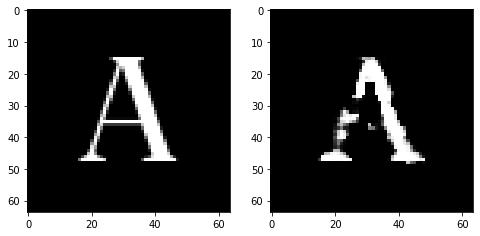

Epoch 1, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6267777606844902, Loss SSIM 2.2035855650901794, Loss Local 187.76038312911987


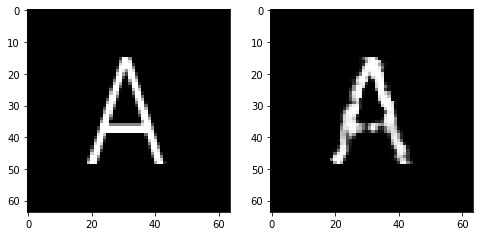

Epoch 1, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5135268047451973, Loss SSIM 1.9805036783218384, Loss Local 170.6784405708313


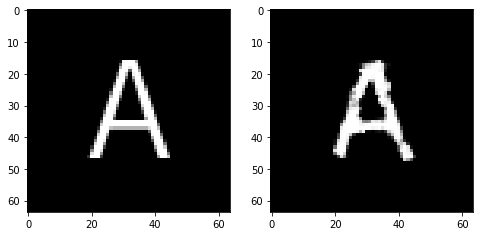

Epoch 1, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.578847013413906, Loss SSIM 2.0681968927383423, Loss Local 172.46970462799072


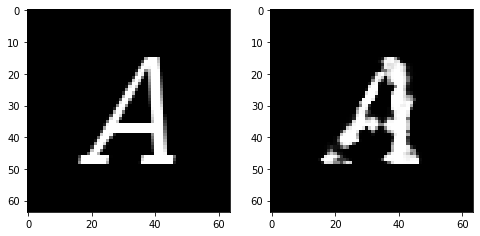

Epoch 1, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5358550176024437, Loss SSIM 1.9662971496582031, Loss Local 175.86456656455994


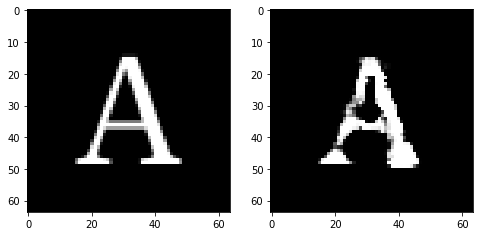

Epoch 1, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.528656393289566, Loss SSIM 1.9812416434288025, Loss Local 173.72737789154053


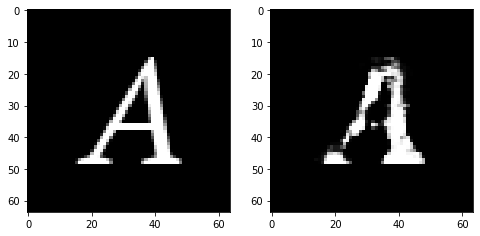

Epoch 1, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5584205575287342, Loss SSIM 2.029356896877289, Loss Local 174.04598808288574


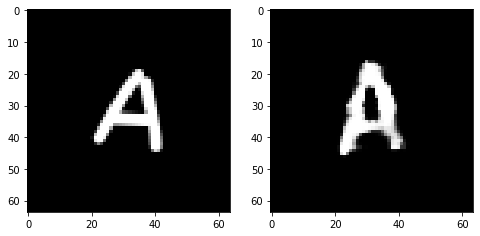

Epoch 2, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5214748904109001, Loss SSIM 1.9377843141555786, Loss Local 171.01213312149048


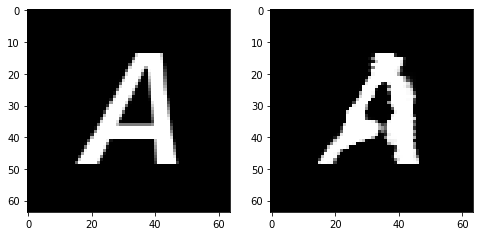

Epoch 2, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.57209986820817, Loss SSIM 2.034682869911194, Loss Local 179.20750999450684


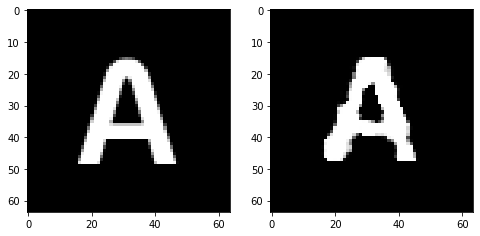

Epoch 2, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5608450546860695, Loss SSIM 2.0505821108818054, Loss Local 176.25509071350098


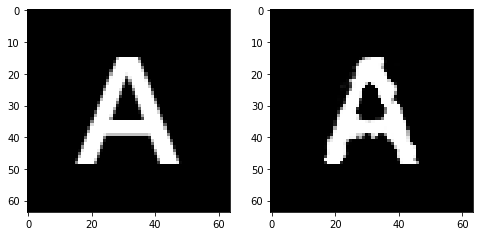

Epoch 2, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5906989201903343, Loss SSIM 2.140231668949127, Loss Local 189.62372159957886


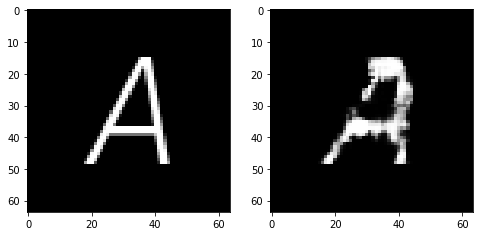

Epoch 2, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5518835820257664, Loss SSIM 2.0247181057929993, Loss Local 184.09308195114136


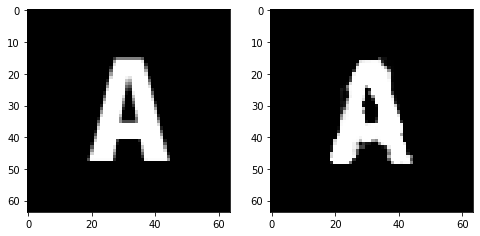

Epoch 2, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5662648603320122, Loss SSIM 2.0998873710632324, Loss Local 173.50762367248535


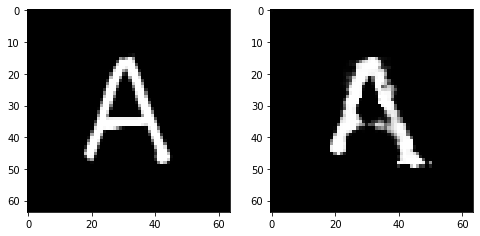

Epoch 2, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5547280199825764, Loss SSIM 2.06466144323349, Loss Local 175.52242422103882


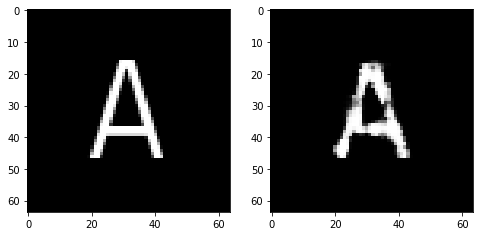

Epoch 3, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5278931930661201, Loss SSIM 1.9860461354255676, Loss Local 172.80031728744507


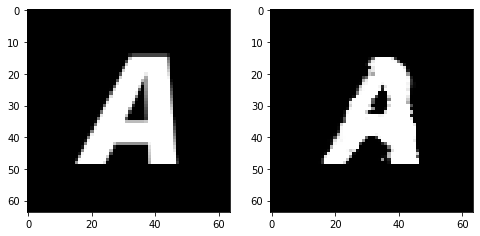

Epoch 3, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5927849188446999, Loss SSIM 2.0986191630363464, Loss Local 173.82914781570435


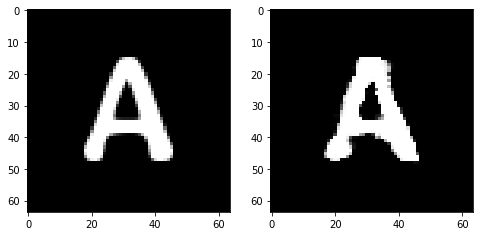

Epoch 3, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5091138072311878, Loss SSIM 1.956209659576416, Loss Local 173.7804660797119


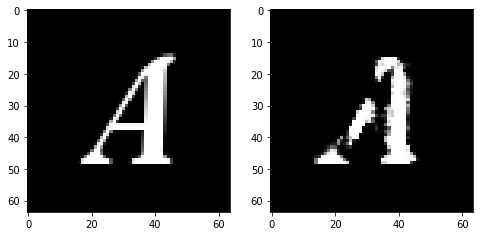

Epoch 3, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6209762804210186, Loss SSIM 2.1586517095565796, Loss Local 173.99217176437378


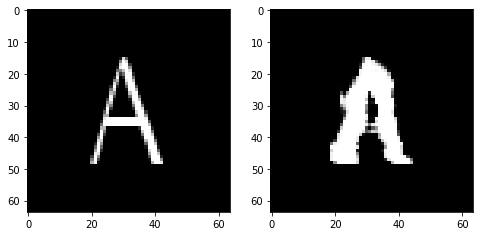

Epoch 3, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.486582301557064, Loss SSIM 1.9295979738235474, Loss Local 172.18013334274292


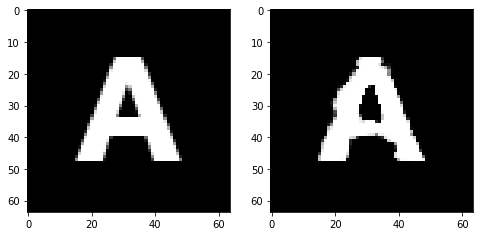

Epoch 3, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.577625047415495, Loss SSIM 2.0804957151412964, Loss Local 176.7930121421814


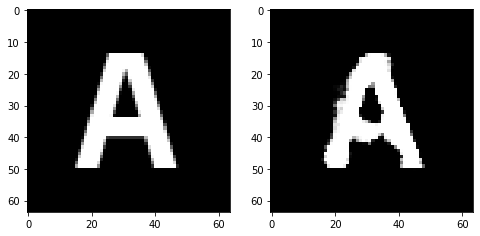

Epoch 3, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6438005529344082, Loss SSIM 2.1887799501419067, Loss Local 184.58633184432983


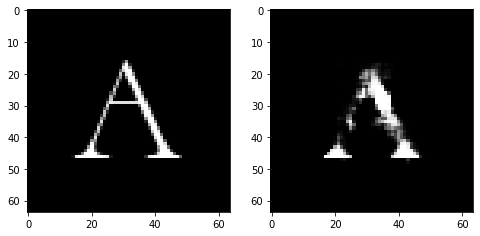

Epoch 4, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5599058791995049, Loss SSIM 2.088380813598633, Loss Local 171.59505605697632


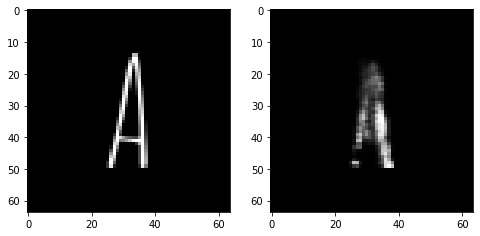

Epoch 4, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5648831017315388, Loss SSIM 2.041431963443756, Loss Local 176.60818195343018


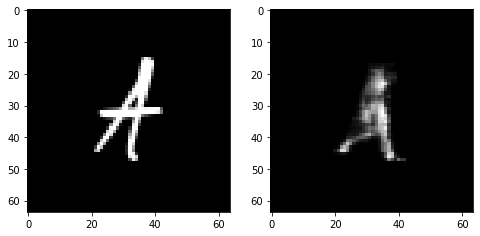

Epoch 4, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5433578193187714, Loss SSIM 1.9772610664367676, Loss Local 165.66550827026367


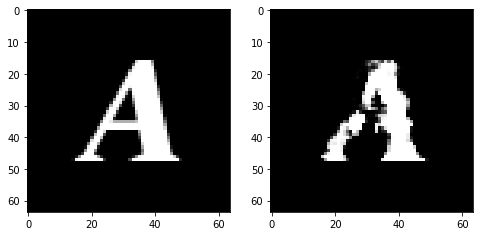

Epoch 4, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.557355035096407, Loss SSIM 2.050175964832306, Loss Local 172.66674613952637


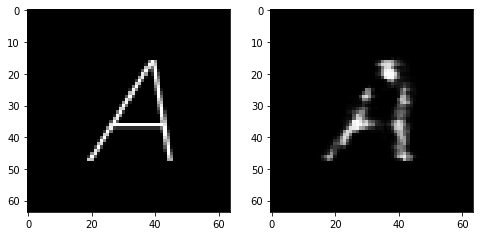

Epoch 4, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5893327109515667, Loss SSIM 2.10355281829834, Loss Local 181.4212384223938


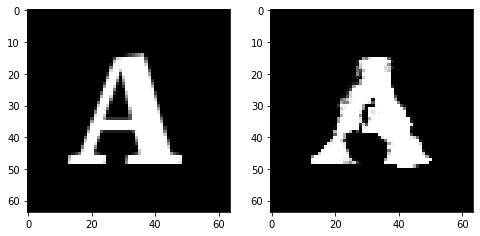

Epoch 4, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5770848356187344, Loss SSIM 2.0509873628616333, Loss Local 176.92246675491333


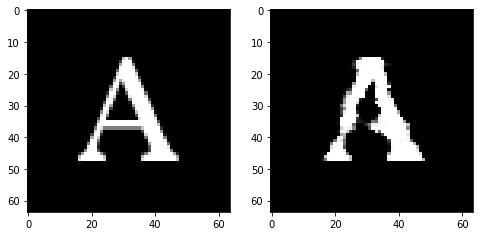

Epoch 4, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5341989658772945, Loss SSIM 2.020582377910614, Loss Local 181.55305814743042


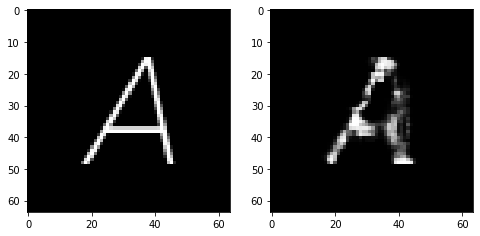

Epoch 5, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6129233837127686, Loss SSIM 2.128669023513794, Loss Local 183.6462321281433


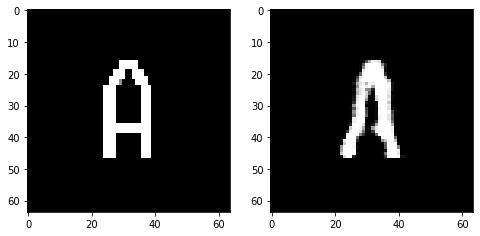

Epoch 5, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5277111567556858, Loss SSIM 1.9867809414863586, Loss Local 178.77469158172607


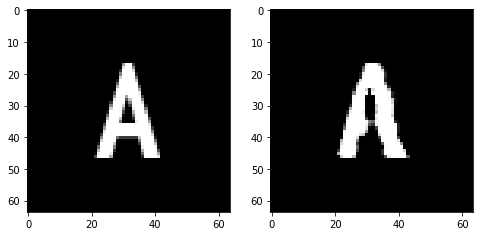

Epoch 5, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5198338627815247, Loss SSIM 1.9784214496612549, Loss Local 183.5362992286682


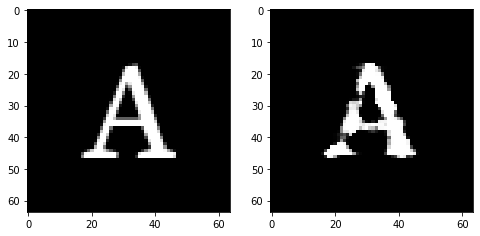

Epoch 5, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5081757828593254, Loss SSIM 1.972100853919983, Loss Local 171.58751010894775


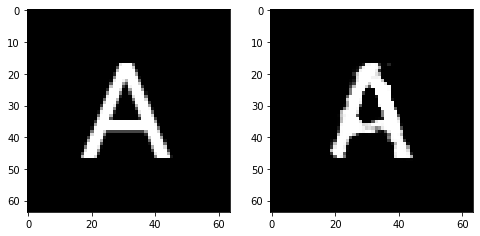

Epoch 5, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5738671347498894, Loss SSIM 2.1193726658821106, Loss Local 186.01990032196045


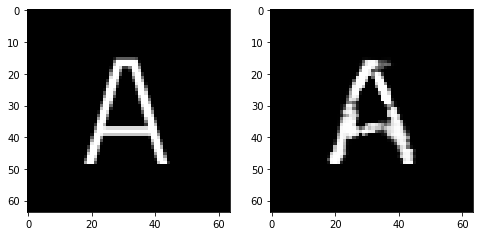

Epoch 5, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5723409205675125, Loss SSIM 2.065024435520172, Loss Local 178.5540475845337


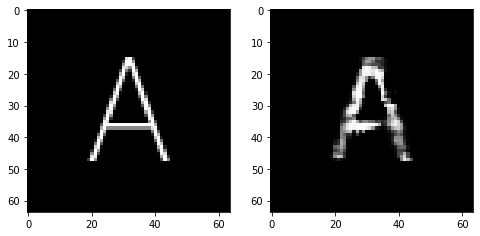

Epoch 5, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.579982828348875, Loss SSIM 2.0472854375839233, Loss Local 173.5223503112793


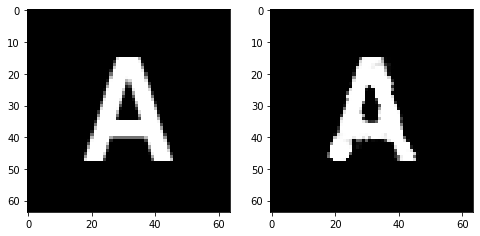

Epoch 6, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.620443258434534, Loss SSIM 2.1723525524139404, Loss Local 182.96955490112305


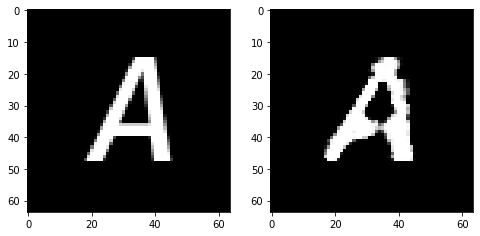

Epoch 6, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5459890067577362, Loss SSIM 2.0261592268943787, Loss Local 177.19863557815552


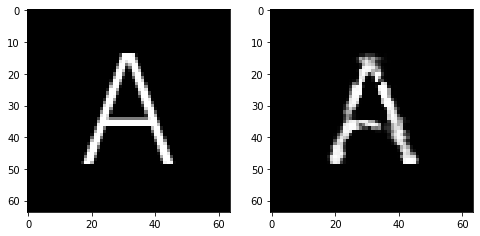

Epoch 6, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5256623551249504, Loss SSIM 1.9850916862487793, Loss Local 165.29522943496704


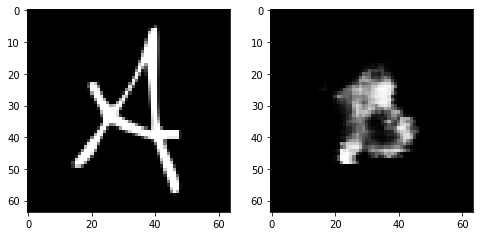

Epoch 6, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.547870758920908, Loss SSIM 1.9855235815048218, Loss Local 171.38250541687012


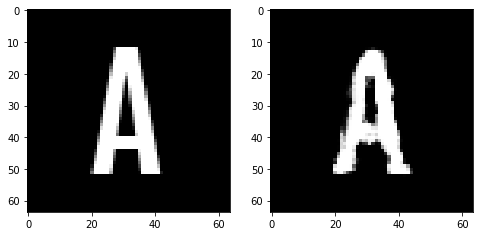

Epoch 6, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5851282514631748, Loss SSIM 2.1152143478393555, Loss Local 180.5168972015381


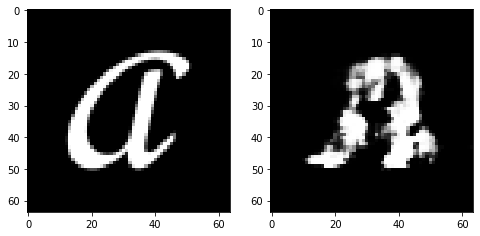

Epoch 6, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5968331433832645, Loss SSIM 2.0997097492218018, Loss Local 175.7619390487671


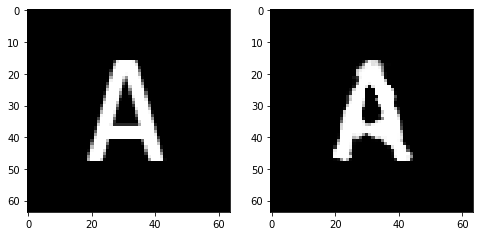

Epoch 6, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5537434853613377, Loss SSIM 2.0360838770866394, Loss Local 175.46226978302002


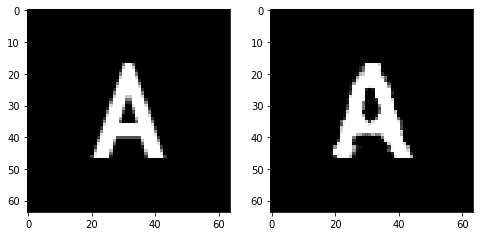

Epoch 7, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5756779536604881, Loss SSIM 2.089913845062256, Loss Local 184.19065523147583


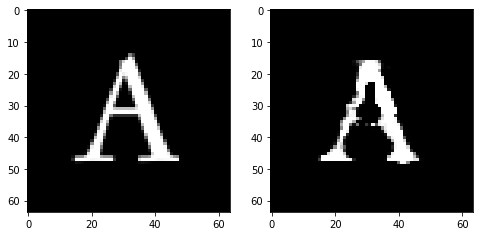

Epoch 7, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5603759735822678, Loss SSIM 2.0291794538497925, Loss Local 167.87803649902344


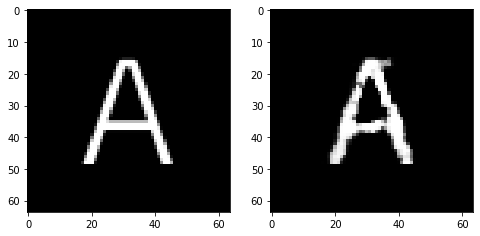

Epoch 7, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.498059969395399, Loss SSIM 1.9535050988197327, Loss Local 162.78764533996582


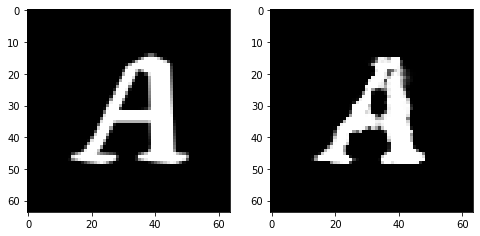

Epoch 7, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5385475791990757, Loss SSIM 1.9826006889343262, Loss Local 173.89257717132568


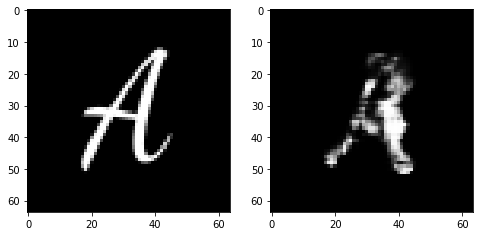

Epoch 7, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5789674073457718, Loss SSIM 2.0208680629730225, Loss Local 171.352605342865


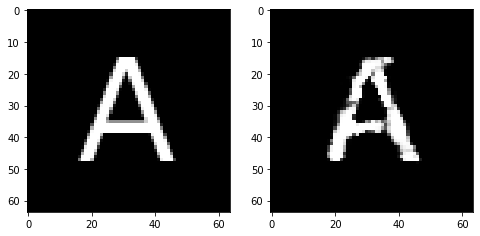

Epoch 7, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5505557097494602, Loss SSIM 2.01517915725708, Loss Local 179.54526901245117


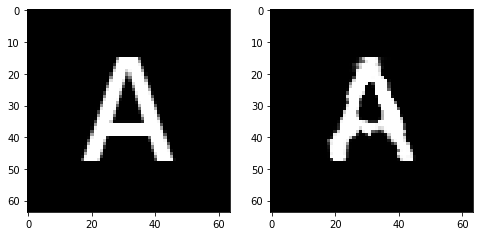

Epoch 7, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6017763689160347, Loss SSIM 2.1221587657928467, Loss Local 168.27381658554077


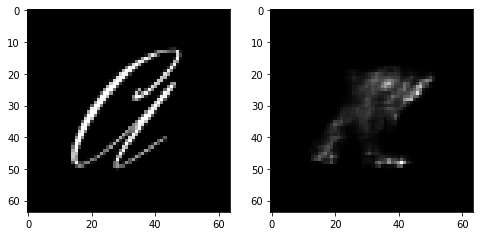

Epoch 8, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.539870474487543, Loss SSIM 2.0467023849487305, Loss Local 172.69773054122925


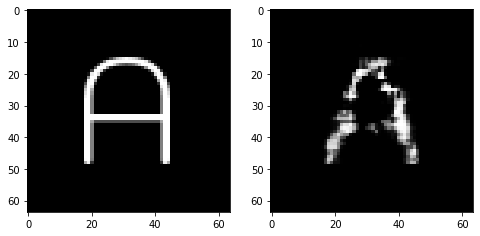

Epoch 8, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5381597429513931, Loss SSIM 1.999773919582367, Loss Local 165.93334102630615


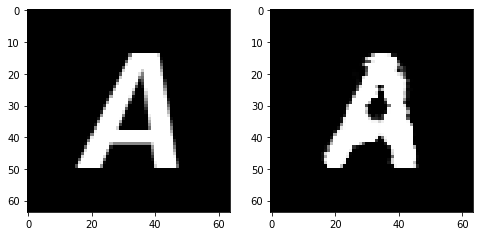

Epoch 8, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5652443915605545, Loss SSIM 2.038074016571045, Loss Local 169.9330735206604


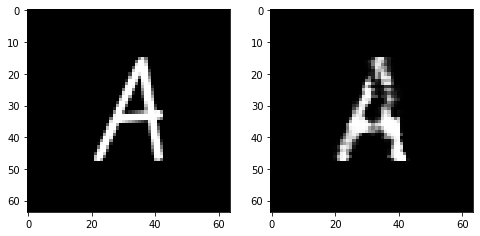

Epoch 8, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5904641896486282, Loss SSIM 2.049558997154236, Loss Local 178.06887197494507


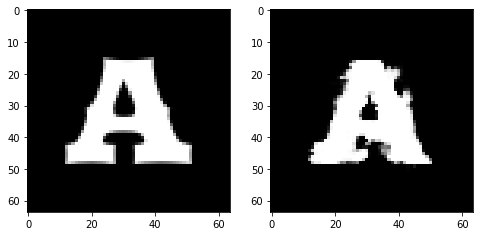

Epoch 8, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5252060778439045, Loss SSIM 1.9966880679130554, Loss Local 165.3974494934082


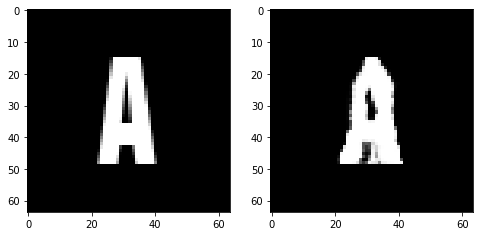

Epoch 8, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5967310890555382, Loss SSIM 2.1290422677993774, Loss Local 177.4473352432251


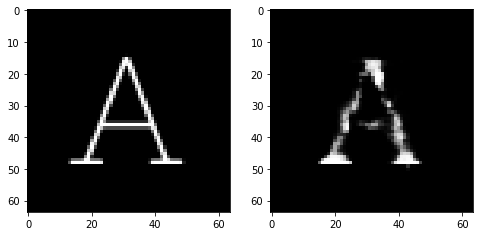

Epoch 8, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5656915605068207, Loss SSIM 2.039256453514099, Loss Local 168.16169118881226


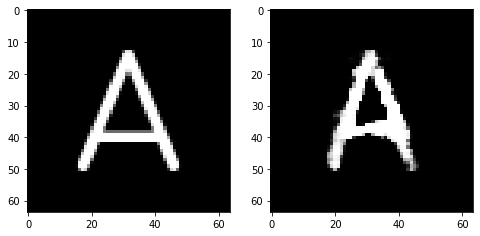

Epoch 9, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5689128637313843, Loss SSIM 2.0797247290611267, Loss Local 184.56741094589233


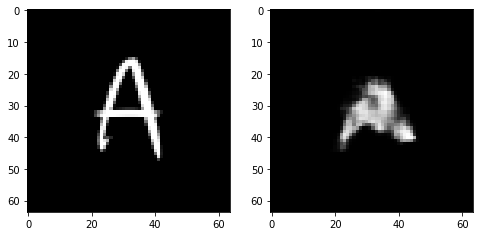

Epoch 9, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5022480301558971, Loss SSIM 1.8954603672027588, Loss Local 172.0796217918396


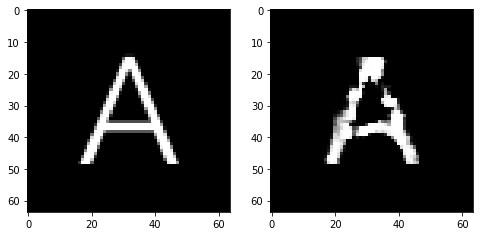

Epoch 9, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5885650776326656, Loss SSIM 2.1403581500053406, Loss Local 184.33391571044922


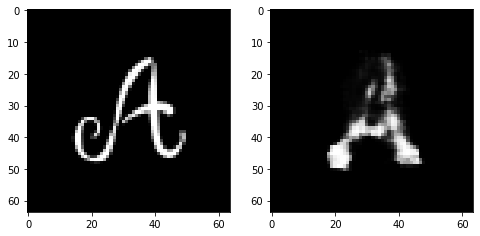

Epoch 9, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5629159435629845, Loss SSIM 2.139980673789978, Loss Local 176.84126567840576


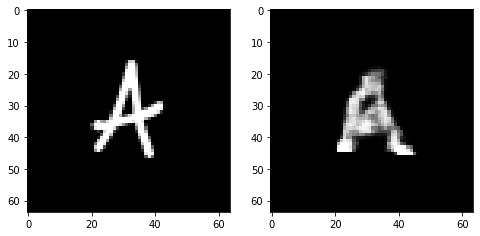

Epoch 9, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6057439409196377, Loss SSIM 2.074704945087433, Loss Local 187.85224294662476


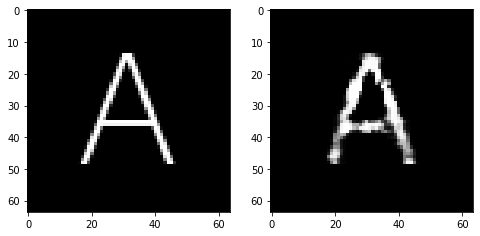

Epoch 9, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5379334203898907, Loss SSIM 1.9816123843193054, Loss Local 174.4829616546631


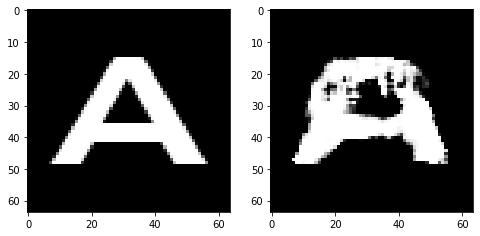

Epoch 9, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5541206747293472, Loss SSIM 2.007288694381714, Loss Local 179.08148384094238


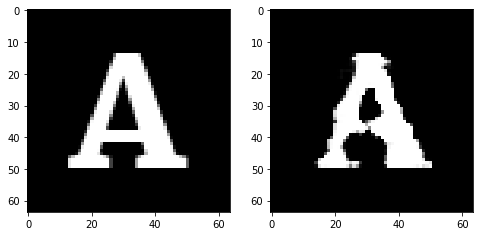

Epoch 10, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.558555506169796, Loss SSIM 2.0281266570091248, Loss Local 163.8342432975769


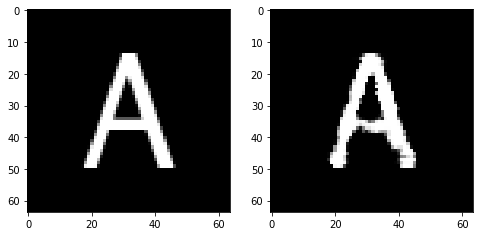

Epoch 10, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5563933737576008, Loss SSIM 2.023645341396332, Loss Local 178.20112252235413


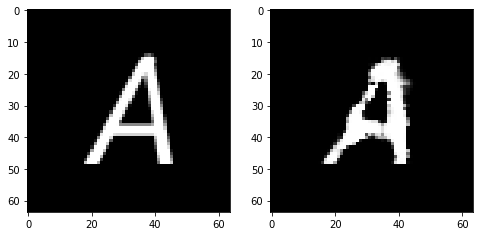

Epoch 10, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5737605318427086, Loss SSIM 2.0787492990493774, Loss Local 169.1351718902588


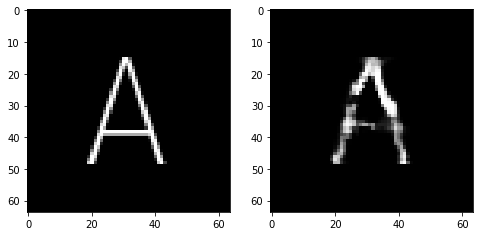

Epoch 10, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.557465124875307, Loss SSIM 2.0622023344039917, Loss Local 166.67362070083618


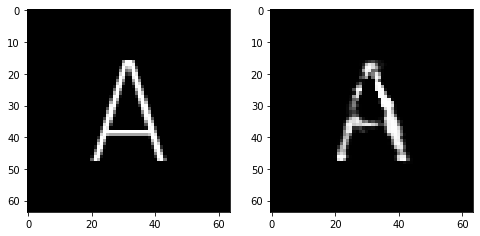

Epoch 10, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.513550229370594, Loss SSIM 1.96556955575943, Loss Local 168.4490180015564


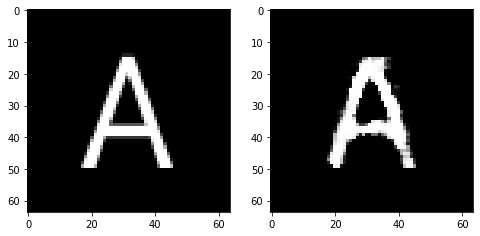

Epoch 10, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.587273083627224, Loss SSIM 2.058865249156952, Loss Local 178.437593460083


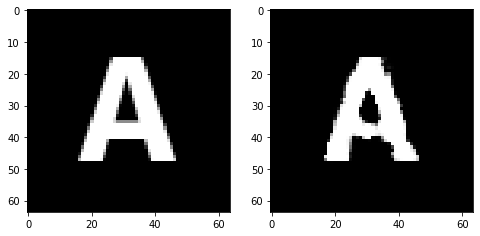

Epoch 10, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5372849144041538, Loss SSIM 2.0164607167243958, Loss Local 163.07244396209717


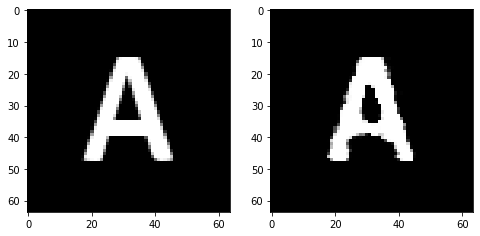

Epoch 11, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.566473100334406, Loss SSIM 2.05696702003479, Loss Local 170.1767930984497


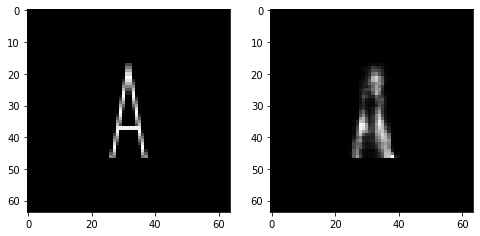

Epoch 11, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5289266221225262, Loss SSIM 1.9607948660850525, Loss Local 169.44054412841797


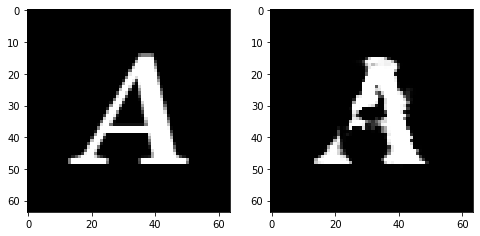

Epoch 11, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5953648090362549, Loss SSIM 2.1827216148376465, Loss Local 180.03785490989685


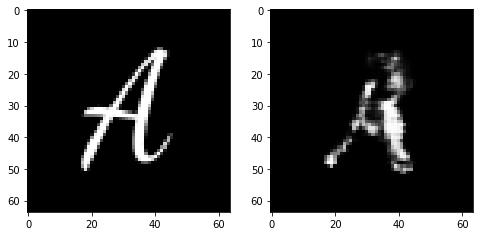

Epoch 11, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5304906964302063, Loss SSIM 1.9630123376846313, Loss Local 172.40711450576782


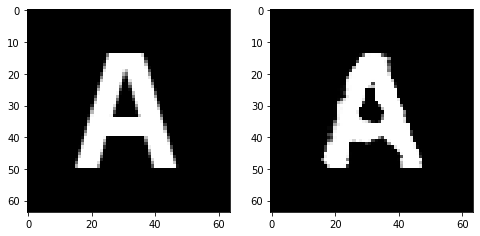

Epoch 11, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6122151985764503, Loss SSIM 2.103872299194336, Loss Local 178.94463205337524


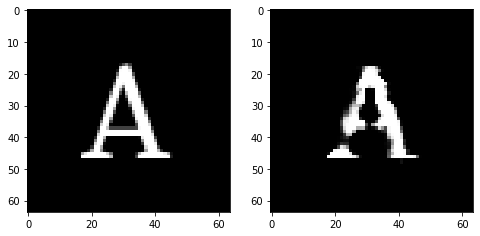

Epoch 11, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.524127684533596, Loss SSIM 1.9578246474266052, Loss Local 164.81858491897583


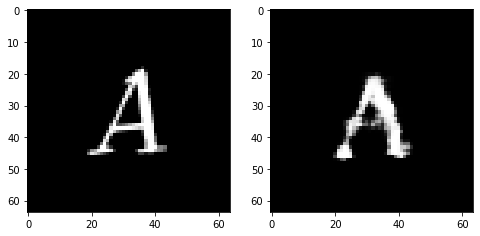

Epoch 11, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5543949864804745, Loss SSIM 2.070125937461853, Loss Local 171.22150325775146


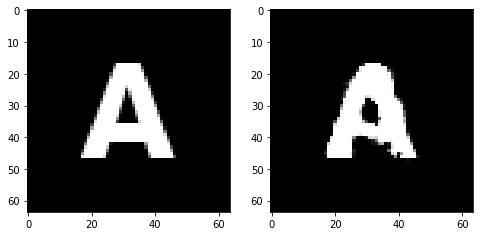

Epoch 12, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5769410505890846, Loss SSIM 2.048997223377228, Loss Local 172.9308443069458


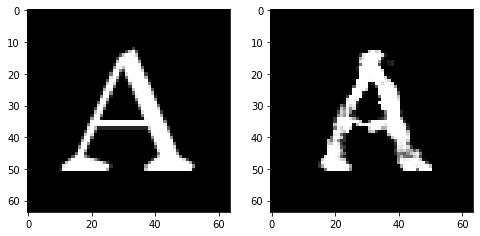

Epoch 12, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5351405516266823, Loss SSIM 2.0004212856292725, Loss Local 169.90607166290283


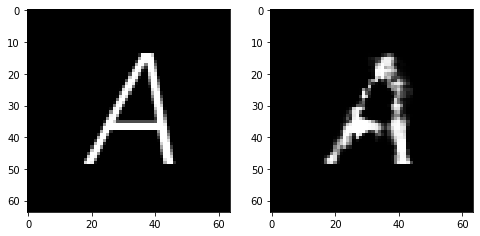

Epoch 12, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.546807263046503, Loss SSIM 2.019303798675537, Loss Local 171.71765899658203


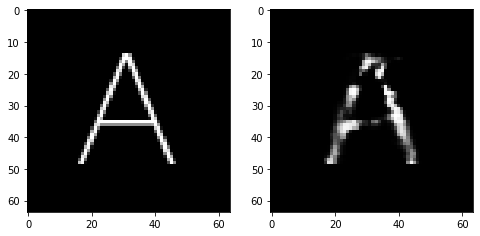

Epoch 12, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5772743858397007, Loss SSIM 2.044938564300537, Loss Local 176.55176877975464


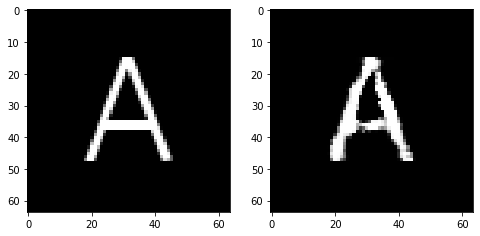

Epoch 12, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.545012790709734, Loss SSIM 2.03012216091156, Loss Local 175.8605761528015


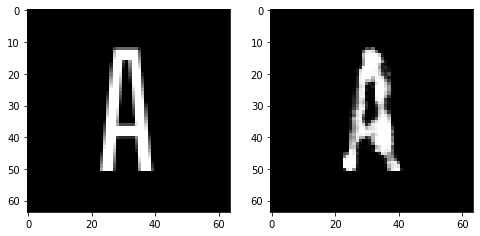

Epoch 12, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5742254629731178, Loss SSIM 2.0918115377426147, Loss Local 182.5878505706787


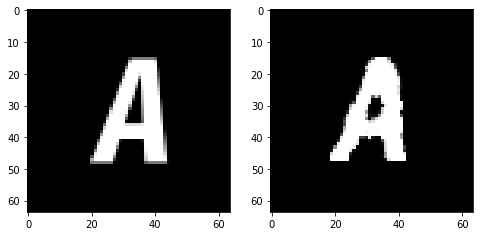

Epoch 12, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5763564705848694, Loss SSIM 2.0639789700508118, Loss Local 171.64237117767334


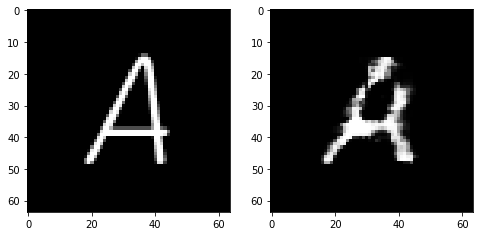

Epoch 13, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5640137754380703, Loss SSIM 2.061768352985382, Loss Local 177.28562355041504


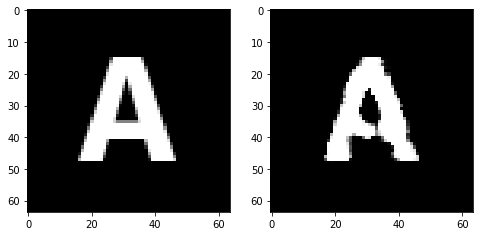

Epoch 13, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5338230542838573, Loss SSIM 1.9409242272377014, Loss Local 182.8075351715088


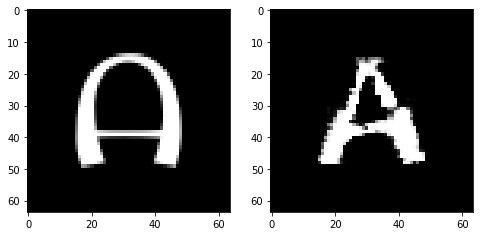

Epoch 13, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.591589629650116, Loss SSIM 2.115518808364868, Loss Local 175.52666521072388


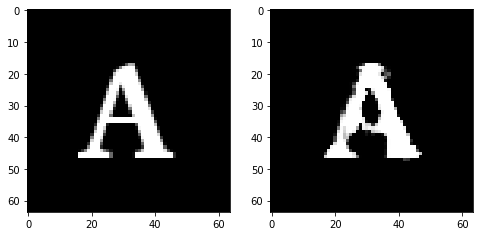

Epoch 13, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5512048043310642, Loss SSIM 2.0272697806358337, Loss Local 177.12101030349731


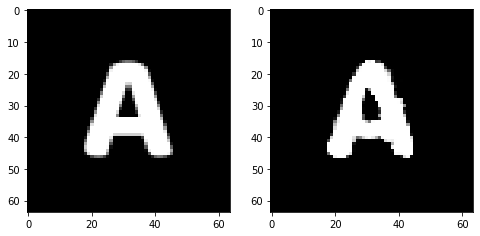

Epoch 13, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.546354554593563, Loss SSIM 2.0108507871627808, Loss Local 177.97969484329224


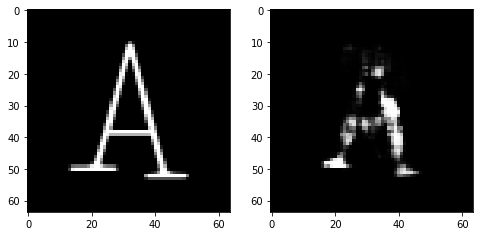

Epoch 13, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.585641399025917, Loss SSIM 2.1275699138641357, Loss Local 181.01372623443604


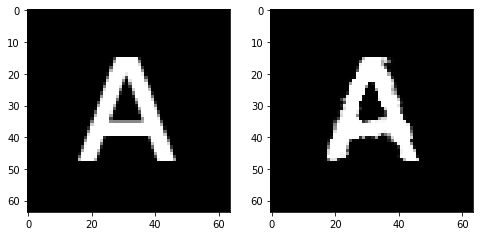

Epoch 13, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5633146576583385, Loss SSIM 2.074280619621277, Loss Local 169.15266942977905


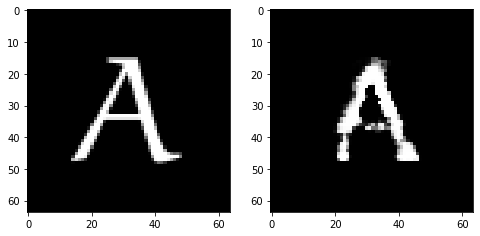

Epoch 14, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6562002934515476, Loss SSIM 2.147196650505066, Loss Local 182.87961053848267


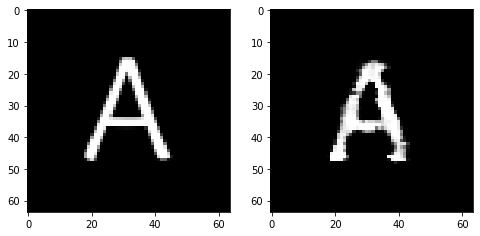

Epoch 14, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5184183083474636, Loss SSIM 1.981070876121521, Loss Local 173.61226749420166


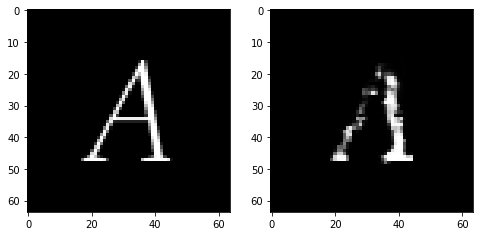

Epoch 14, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5753469429910183, Loss SSIM 2.0926393270492554, Loss Local 171.82330226898193


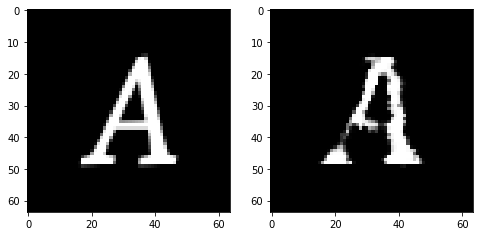

Epoch 14, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5607454366981983, Loss SSIM 2.0712488889694214, Loss Local 174.42930459976196


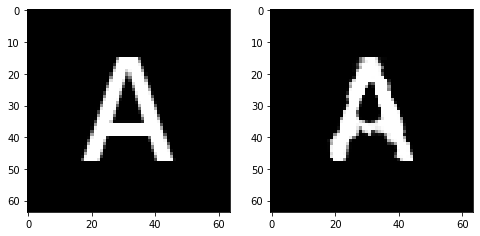

Epoch 14, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.544210385531187, Loss SSIM 2.0649300813674927, Loss Local 179.30130577087402


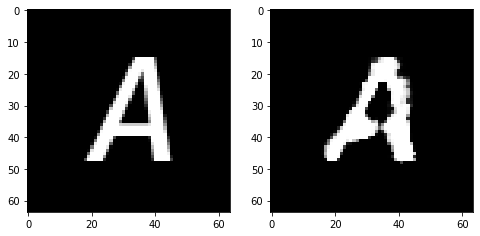

Epoch 14, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.534688651561737, Loss SSIM 1.9897793531417847, Loss Local 177.2334942817688


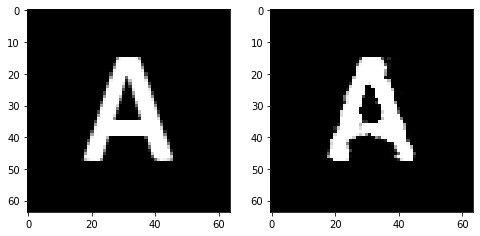

Epoch 14, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5870691053569317, Loss SSIM 2.0742467641830444, Loss Local 179.46150255203247


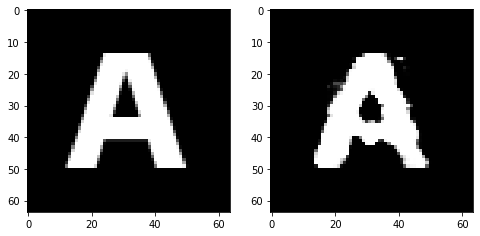

Epoch 15, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5522859916090965, Loss SSIM 2.0269569158554077, Loss Local 169.49005556106567


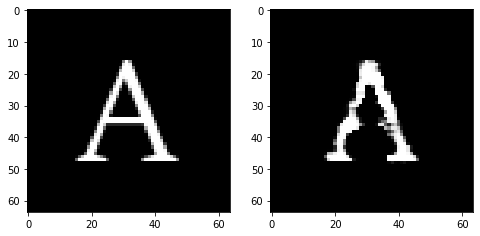

Epoch 15, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5400035306811333, Loss SSIM 1.9930230975151062, Loss Local 160.35519456863403


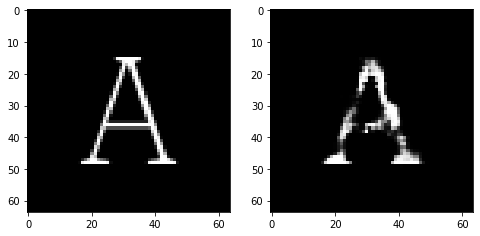

Epoch 15, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5887177288532257, Loss SSIM 2.0575634837150574, Loss Local 184.16885232925415


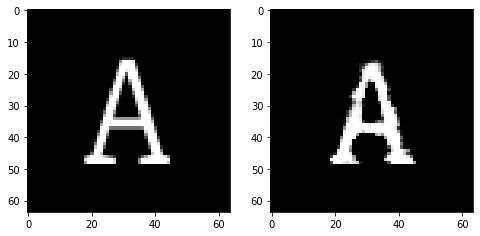

Epoch 15, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.526915803551674, Loss SSIM 1.9917397499084473, Loss Local 169.9054365158081


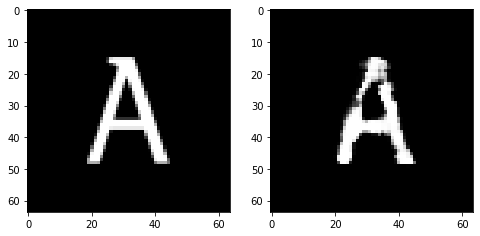

Epoch 15, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5780423246324062, Loss SSIM 2.098876178264618, Loss Local 174.23814916610718


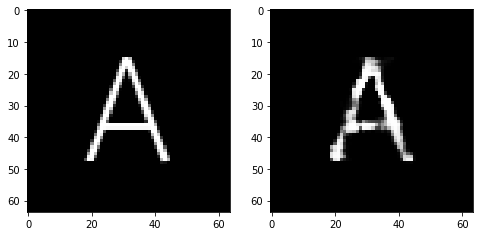

Epoch 15, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5759626105427742, Loss SSIM 2.121949017047882, Loss Local 182.10537242889404


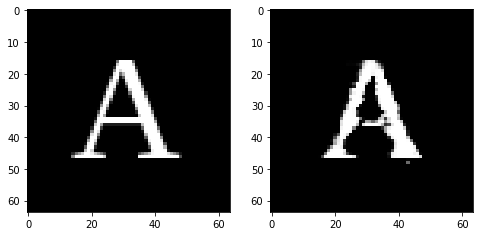

Epoch 15, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5256057158112526, Loss SSIM 1.9737818837165833, Loss Local 167.27154970169067


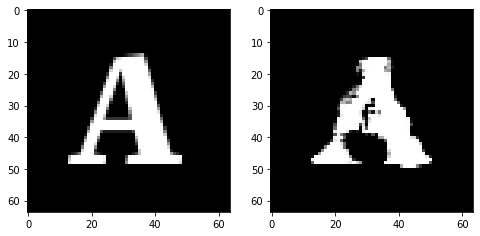

Epoch 16, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5607863031327724, Loss SSIM 2.0400407314300537, Loss Local 184.25419187545776


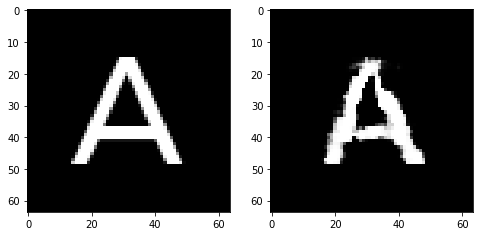

Epoch 16, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6102521680295467, Loss SSIM 2.142405092716217, Loss Local 185.738055229187


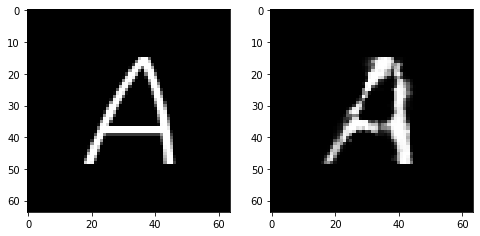

Epoch 16, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5942342169582844, Loss SSIM 2.0833842754364014, Loss Local 169.24744510650635


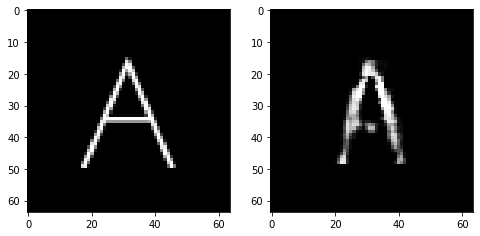

Epoch 16, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4974387362599373, Loss SSIM 1.941104531288147, Loss Local 165.22692680358887


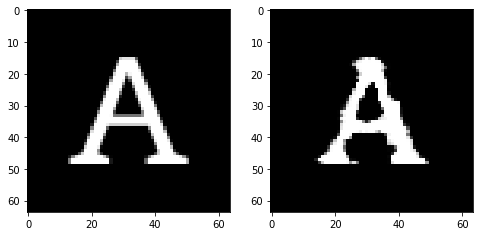

Epoch 16, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5414958111941814, Loss SSIM 1.9976004362106323, Loss Local 175.58882093429565


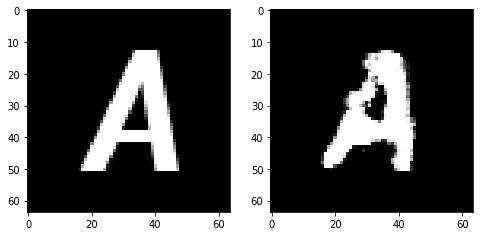

Epoch 16, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.561136107891798, Loss SSIM 2.057753562927246, Loss Local 169.05291986465454


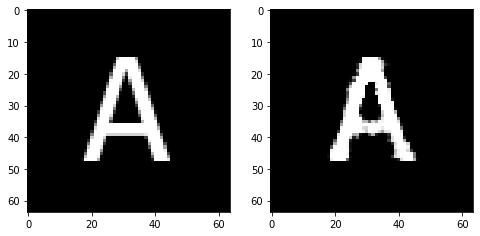

Epoch 16, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.529895406216383, Loss SSIM 1.9934141039848328, Loss Local 177.16446781158447


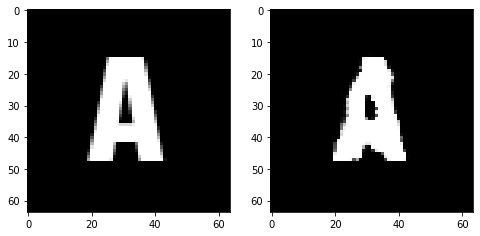

Epoch 17, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5671405084431171, Loss SSIM 2.0724520087242126, Loss Local 179.17763566970825


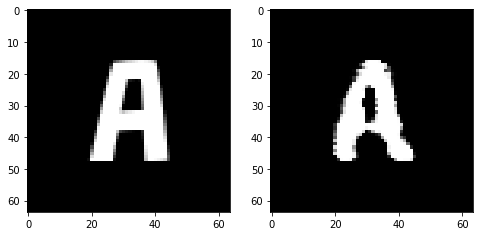

Epoch 17, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5482187829911709, Loss SSIM 2.0068811178207397, Loss Local 178.15625619888306


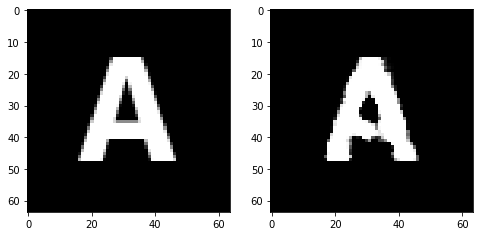

Epoch 17, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.527321569621563, Loss SSIM 1.9731367230415344, Loss Local 174.93677806854248


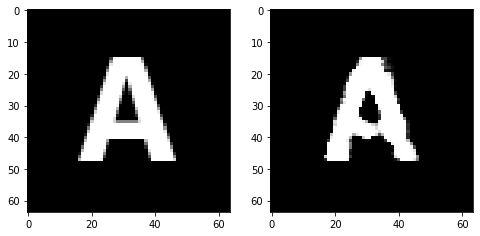

Epoch 17, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5958712622523308, Loss SSIM 2.0723745822906494, Loss Local 176.97916269302368


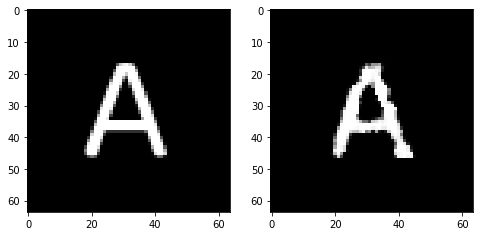

Epoch 17, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5606891363859177, Loss SSIM 2.0999785661697388, Loss Local 179.57562494277954


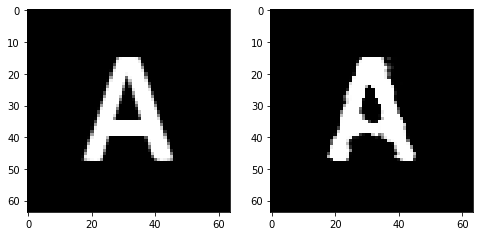

Epoch 17, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5573237612843513, Loss SSIM 2.0583004355430603, Loss Local 174.91994380950928


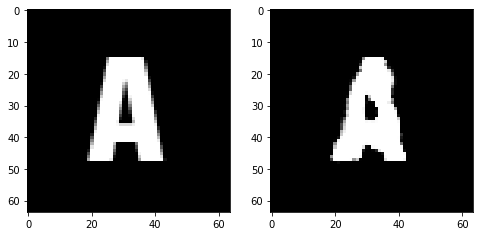

Epoch 17, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5470635704696178, Loss SSIM 2.02246755361557, Loss Local 181.34645080566406


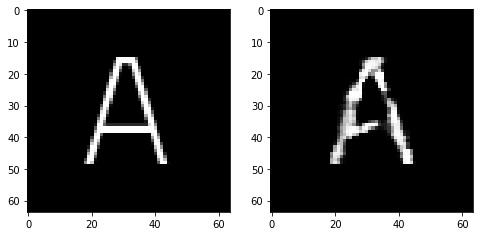

Epoch 18, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5695537328720093, Loss SSIM 2.035751700401306, Loss Local 179.7561821937561


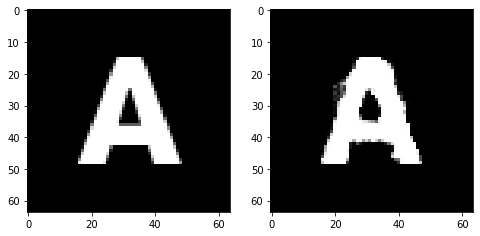

Epoch 18, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5658957697451115, Loss SSIM 2.087226629257202, Loss Local 190.05260705947876


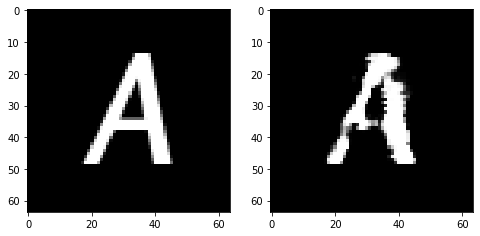

Epoch 18, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5952280834317207, Loss SSIM 2.0736135244369507, Loss Local 176.70910120010376


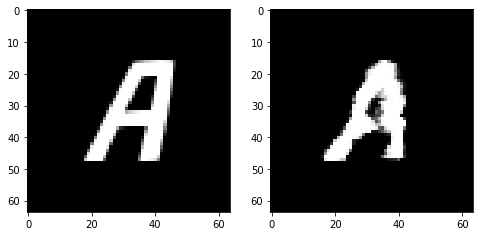

Epoch 18, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5299145840108395, Loss SSIM 1.9486164450645447, Loss Local 164.97454690933228


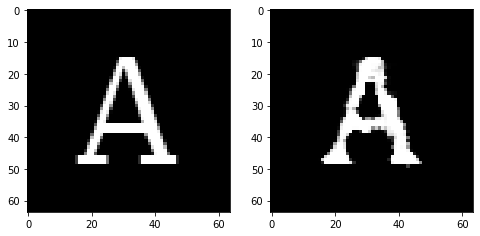

Epoch 18, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5619657076895237, Loss SSIM 2.108373701572418, Loss Local 176.43960285186768


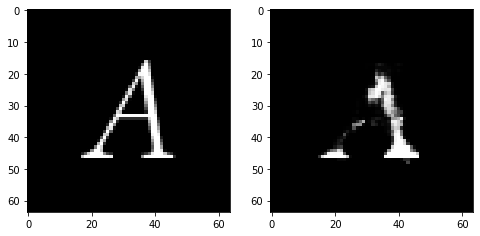

Epoch 18, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.586718462407589, Loss SSIM 2.0902158617973328, Loss Local 178.34069871902466


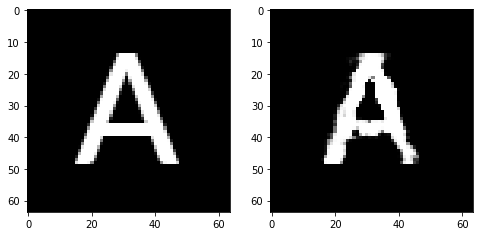

Epoch 18, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6001004427671432, Loss SSIM 2.1225374937057495, Loss Local 169.31038689613342


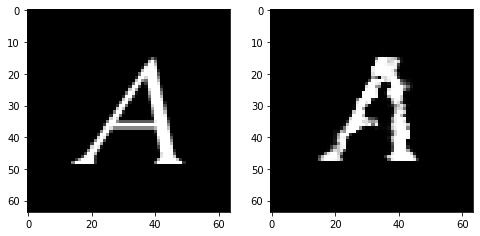

Epoch 19, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5138275660574436, Loss SSIM 1.9569203853607178, Loss Local 165.258850812912


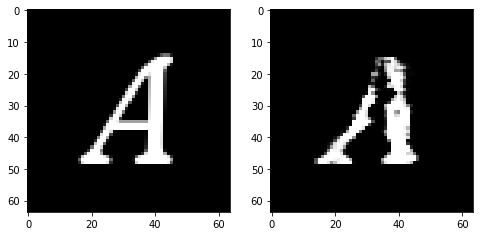

Epoch 19, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.553938951343298, Loss SSIM 2.0435259342193604, Loss Local 177.95695304870605


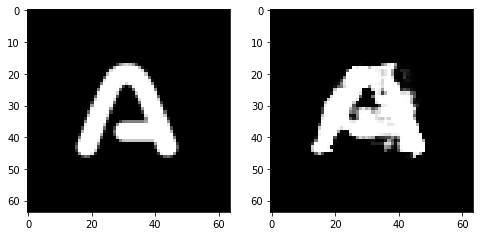

Epoch 19, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.599752102047205, Loss SSIM 2.15645968914032, Loss Local 162.95838975906372


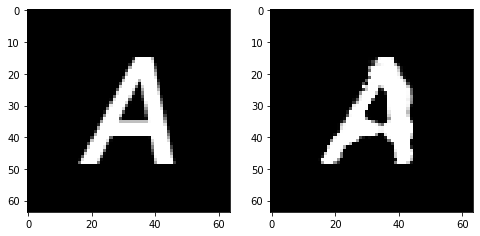

Epoch 19, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5764303728938103, Loss SSIM 2.0216047763824463, Loss Local 173.40875053405762


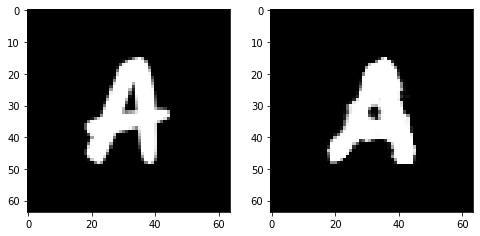

Epoch 19, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5591809339821339, Loss SSIM 2.021428883075714, Loss Local 165.98977732658386


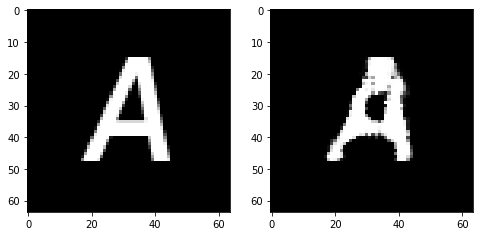

Epoch 19, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5748319178819656, Loss SSIM 2.073202908039093, Loss Local 183.44197797775269


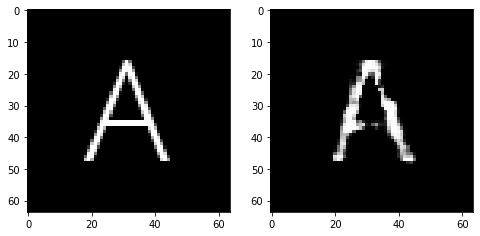

Epoch 19, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5676771067082882, Loss SSIM 2.06653094291687, Loss Local 171.624370098114


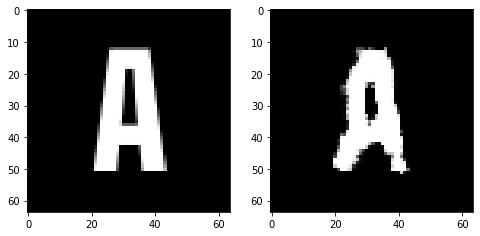

Epoch 20, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5121942646801472, Loss SSIM 1.9669738411903381, Loss Local 165.53713417053223


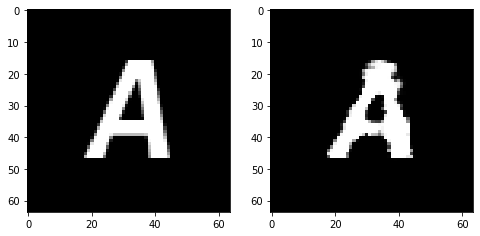

Epoch 20, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5280473046004772, Loss SSIM 1.976613998413086, Loss Local 160.84221506118774


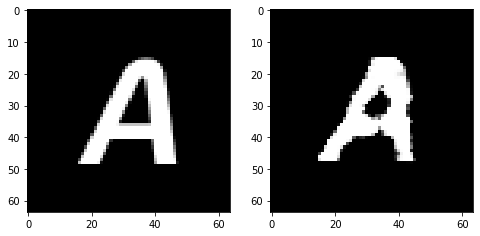

Epoch 20, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5569946765899658, Loss SSIM 2.1057229042053223, Loss Local 174.2447066307068


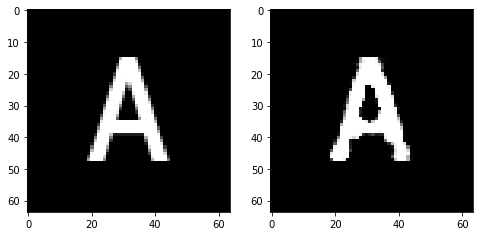

Epoch 20, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6132512800395489, Loss SSIM 2.1613471508026123, Loss Local 173.85284852981567


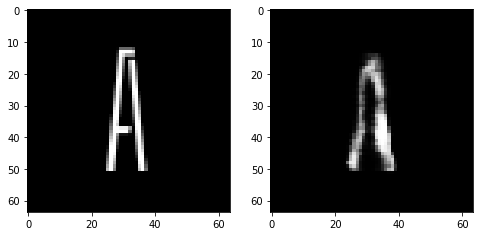

Epoch 20, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5981083810329437, Loss SSIM 2.035792112350464, Loss Local 180.76619577407837


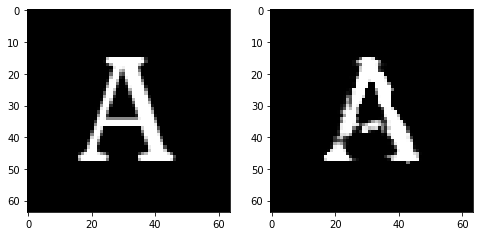

Epoch 20, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5911712981760502, Loss SSIM 2.0880998969078064, Loss Local 189.1942925453186


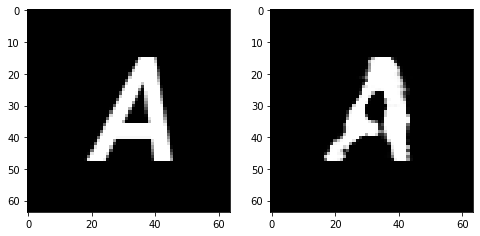

Epoch 20, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5387733653187752, Loss SSIM 2.016564428806305, Loss Local 165.96628999710083


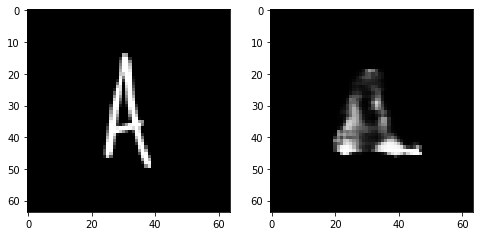

Epoch 21, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.540783829987049, Loss SSIM 2.055081069469452, Loss Local 162.6147608757019


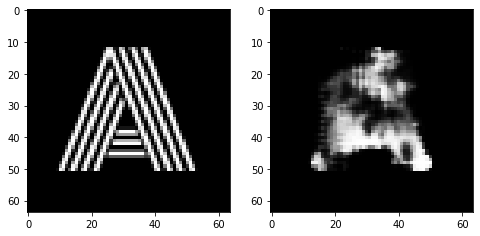

Epoch 21, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5425861030817032, Loss SSIM 1.9963359832763672, Loss Local 177.2020764350891


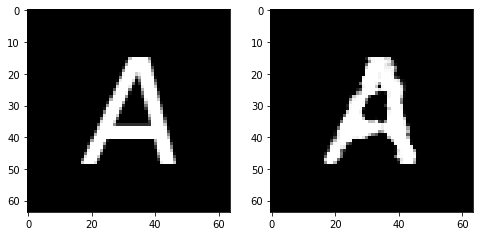

Epoch 21, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.557144157588482, Loss SSIM 2.013905882835388, Loss Local 167.04892349243164


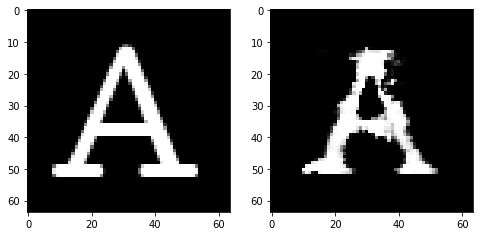

Epoch 21, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5794785134494305, Loss SSIM 2.077122688293457, Loss Local 162.4558367729187


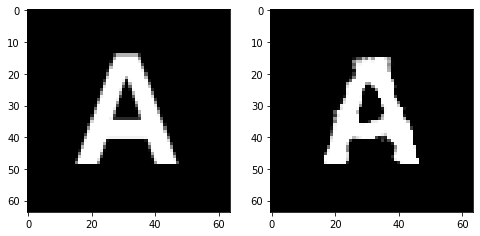

Epoch 21, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5552548244595528, Loss SSIM 2.037259876728058, Loss Local 165.2807993888855


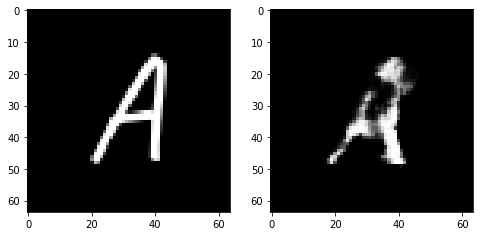

Epoch 21, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5675823464989662, Loss SSIM 2.0500155687332153, Loss Local 174.08245277404785


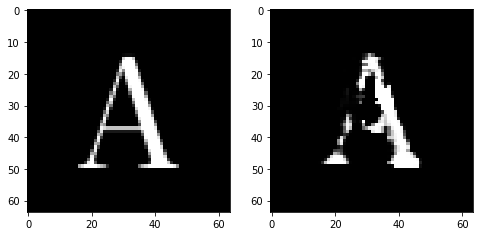

Epoch 21, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.563786767423153, Loss SSIM 2.0639989972114563, Loss Local 165.22373747825623


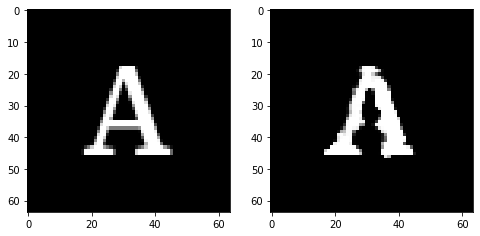

Epoch 22, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6041185110807419, Loss SSIM 2.1100009083747864, Loss Local 175.37545585632324


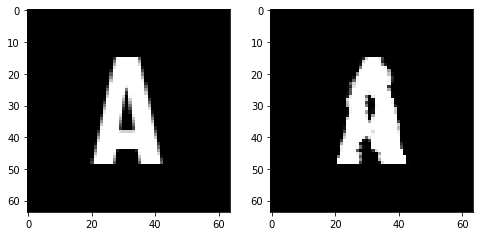

Epoch 22, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.55556171387434, Loss SSIM 2.002350926399231, Loss Local 182.15768384933472


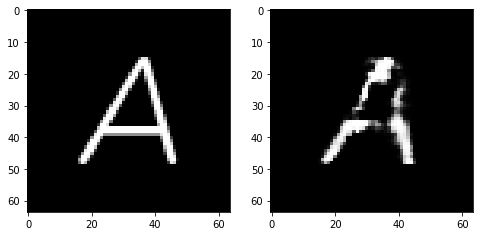

Epoch 22, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5695213787257671, Loss SSIM 2.0591971278190613, Loss Local 167.67823553085327


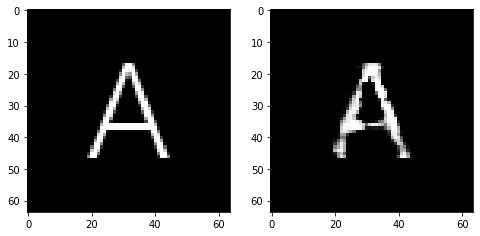

Epoch 22, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5223003253340721, Loss SSIM 2.0121520161628723, Loss Local 181.29793167114258


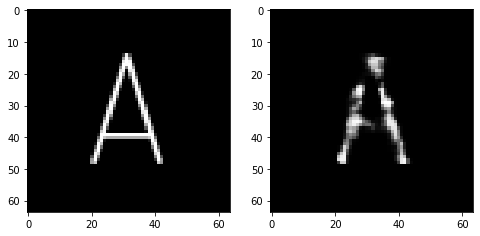

Epoch 22, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5009736977517605, Loss SSIM 1.9374120831489563, Loss Local 166.70879650115967


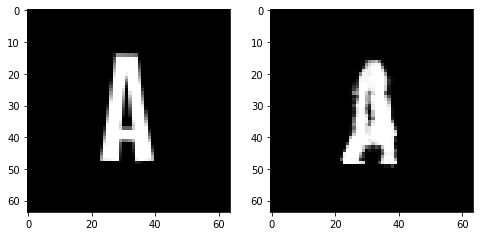

Epoch 22, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5596039444208145, Loss SSIM 2.0558152198791504, Loss Local 178.08892154693604


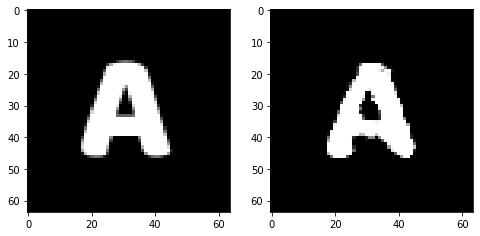

Epoch 22, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.573348581790924, Loss SSIM 2.076863408088684, Loss Local 171.30460214614868


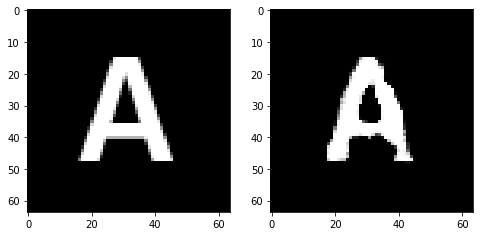

Epoch 23, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5407358892261982, Loss SSIM 1.9991608262062073, Loss Local 174.66332721710205


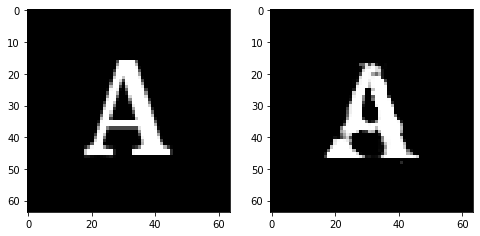

Epoch 23, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.586281444877386, Loss SSIM 2.096854269504547, Loss Local 169.21533632278442


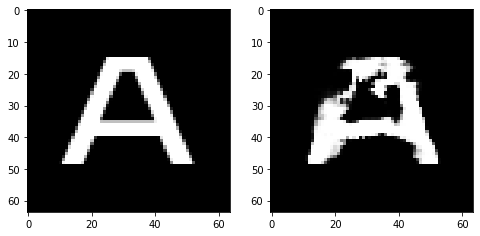

Epoch 23, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5762855149805546, Loss SSIM 2.065027952194214, Loss Local 173.06619262695312


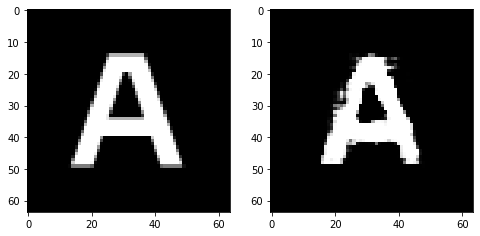

Epoch 23, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6130999363958836, Loss SSIM 2.114760160446167, Loss Local 188.30523586273193


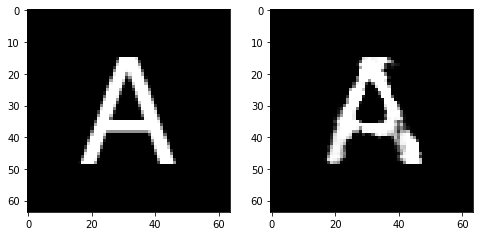

Epoch 23, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5247206576168537, Loss SSIM 2.000642716884613, Loss Local 166.3539843559265


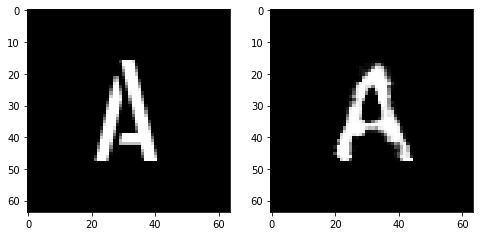

Epoch 23, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5801933519542217, Loss SSIM 2.110606074333191, Loss Local 175.15607976913452


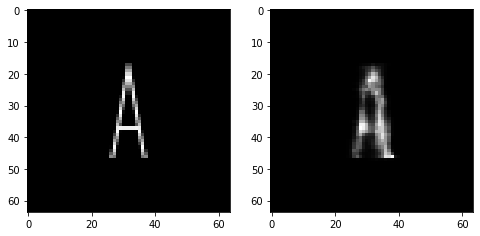

Epoch 23, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.533452857285738, Loss SSIM 1.959622323513031, Loss Local 171.7925901412964


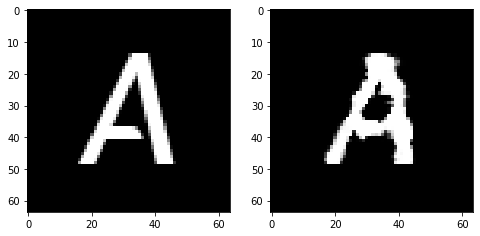

Epoch 24, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5714366771280766, Loss SSIM 2.085035741329193, Loss Local 170.70641899108887


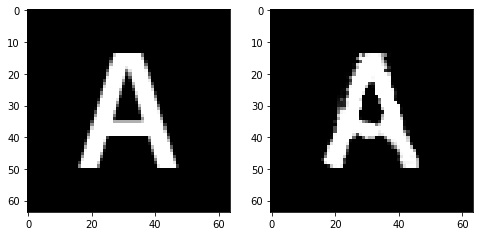

Epoch 24, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6073945946991444, Loss SSIM 2.125702679157257, Loss Local 162.75667810440063


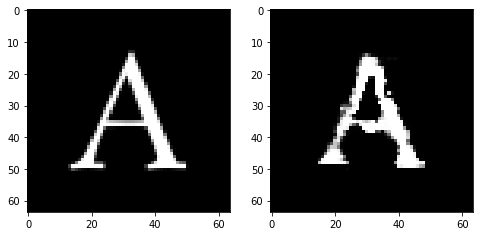

Epoch 24, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.554241556674242, Loss SSIM 1.9801759719848633, Loss Local 183.50161790847778


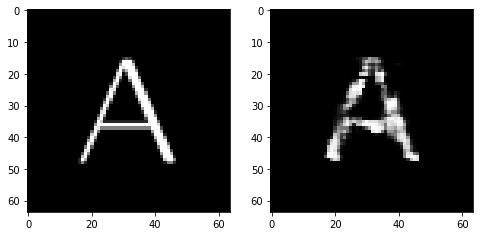

Epoch 24, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5520824529230595, Loss SSIM 2.014158606529236, Loss Local 186.0993332862854


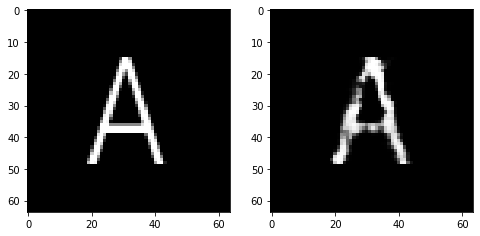

Epoch 24, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5763950571417809, Loss SSIM 2.1219595670700073, Loss Local 175.64134407043457


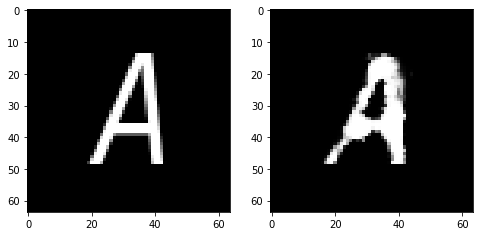

Epoch 24, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.513790287077427, Loss SSIM 1.9720110893249512, Loss Local 170.93195962905884


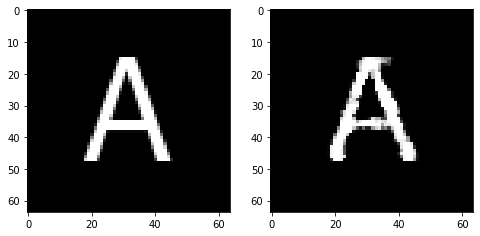

Epoch 24, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5831899903714657, Loss SSIM 2.0986751317977905, Loss Local 173.7038974761963


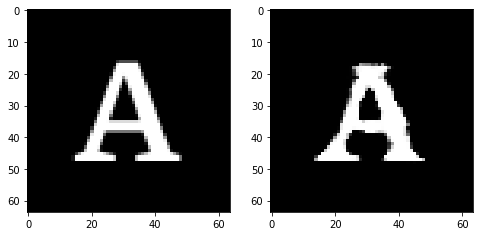

Epoch 25, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.568544089794159, Loss SSIM 2.0707207918167114, Loss Local 185.06344175338745


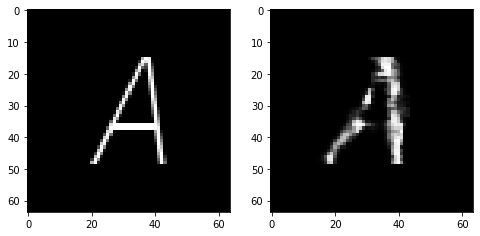

Epoch 25, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5488723926246166, Loss SSIM 2.0347927808761597, Loss Local 176.52517700195312


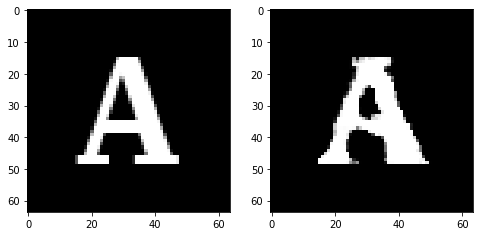

Epoch 25, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5978497937321663, Loss SSIM 2.1277559995651245, Loss Local 179.19816255569458


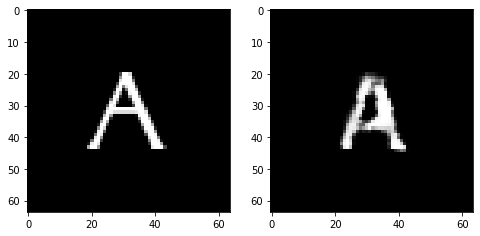

Epoch 25, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5756448321044445, Loss SSIM 2.068354547023773, Loss Local 176.48181772232056


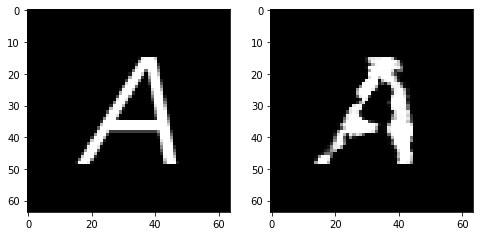

Epoch 25, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5571211613714695, Loss SSIM 1.9977801442146301, Loss Local 182.44644784927368


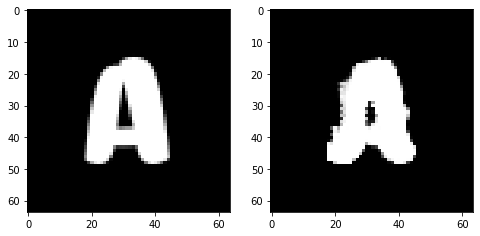

Epoch 25, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5437421761453152, Loss SSIM 2.014909267425537, Loss Local 183.21178340911865


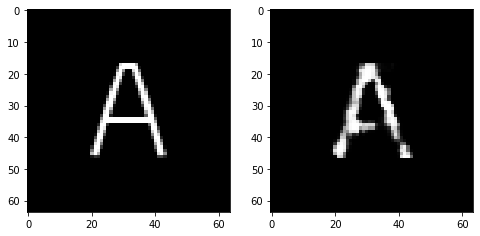

Epoch 25, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5491973496973515, Loss SSIM 2.037063479423523, Loss Local 175.42876625061035


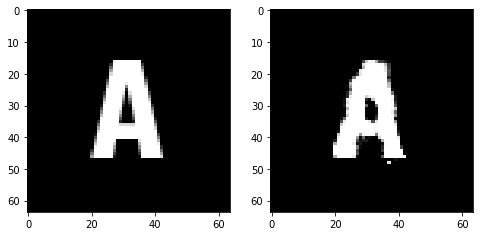

Epoch 26, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5473428629338741, Loss SSIM 2.033367693424225, Loss Local 177.08420848846436


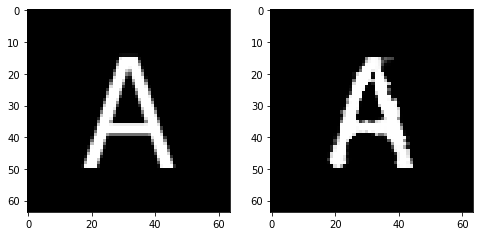

Epoch 26, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5224411375820637, Loss SSIM 1.9627215266227722, Loss Local 169.77387475967407


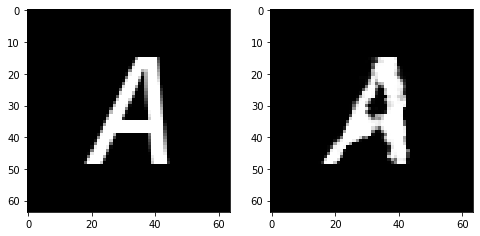

Epoch 26, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.558283980935812, Loss SSIM 2.1015742421150208, Loss Local 170.82661485671997


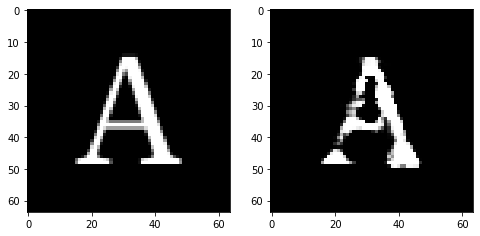

Epoch 26, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5865499041974545, Loss SSIM 2.043324291706085, Loss Local 177.62560892105103


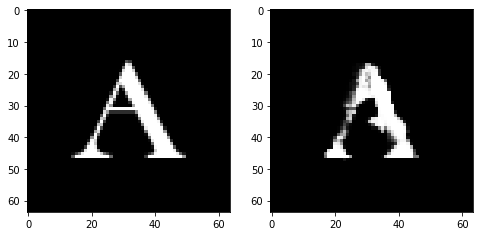

Epoch 26, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5245321989059448, Loss SSIM 1.9995850920677185, Loss Local 166.10668325424194


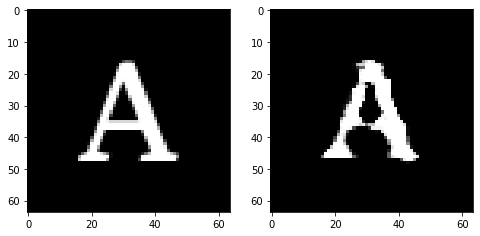

Epoch 26, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6087778694927692, Loss SSIM 2.0820295810699463, Loss Local 179.41811847686768


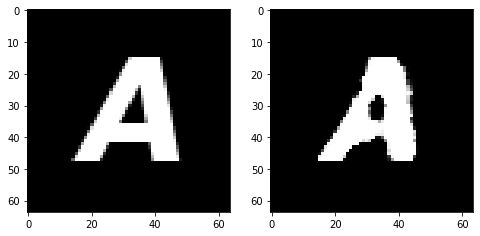

Epoch 26, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.57100086286664, Loss SSIM 2.068949043750763, Loss Local 183.39998149871826


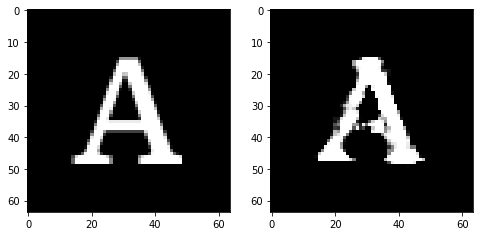

Epoch 27, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5787930972874165, Loss SSIM 2.1536810398101807, Loss Local 180.94204139709473


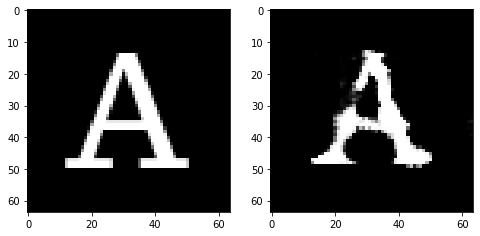

Epoch 27, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5799042135477066, Loss SSIM 2.043467342853546, Loss Local 176.74053525924683


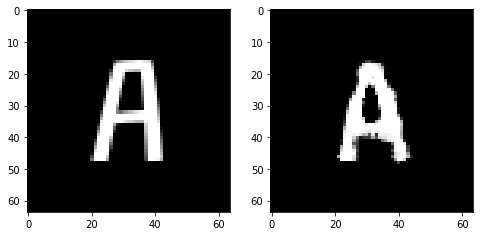

Epoch 27, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5324472300708294, Loss SSIM 1.9925291538238525, Loss Local 173.7291784286499


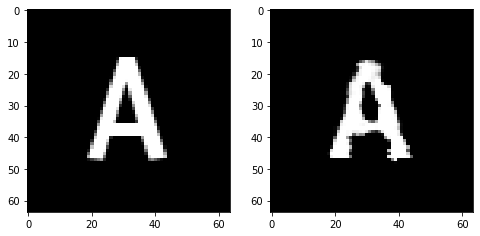

Epoch 27, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5283731147646904, Loss SSIM 1.997053623199463, Loss Local 170.2646985054016


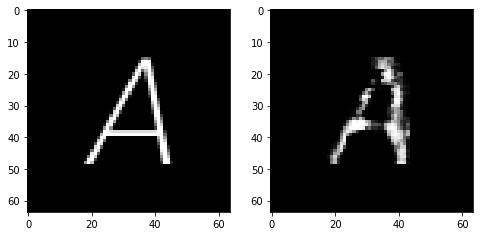

Epoch 27, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.536140065640211, Loss SSIM 1.9716386795043945, Loss Local 178.4024510383606


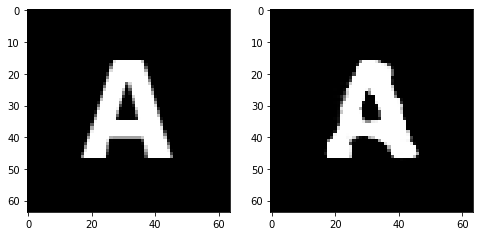

Epoch 27, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5595450140535831, Loss SSIM 2.0341005325317383, Loss Local 182.38552522659302


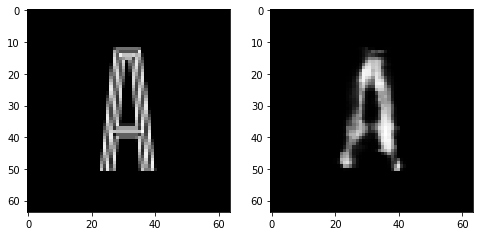

Epoch 27, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5997864492237568, Loss SSIM 2.12717205286026, Loss Local 173.78800201416016


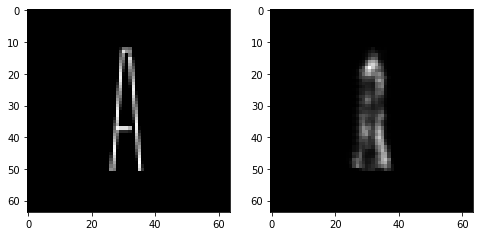

Epoch 28, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5779468193650246, Loss SSIM 2.0558860898017883, Loss Local 181.4336633682251


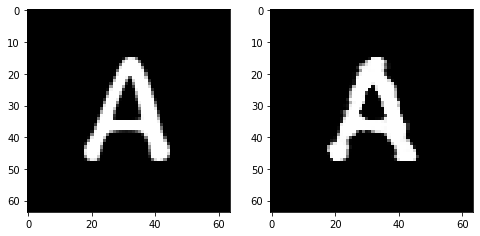

Epoch 28, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5198886543512344, Loss SSIM 1.9943508505821228, Loss Local 169.50839042663574


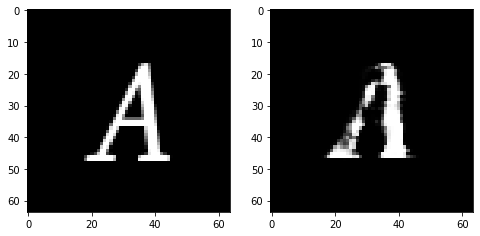

Epoch 28, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5695383250713348, Loss SSIM 2.0725818872451782, Loss Local 174.52978372573853


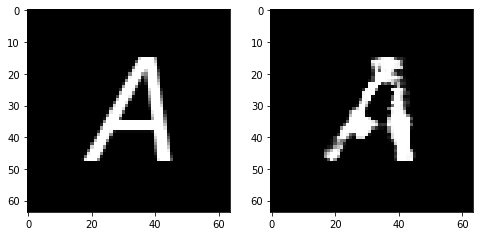

Epoch 28, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5754759088158607, Loss SSIM 2.089668393135071, Loss Local 181.50055170059204


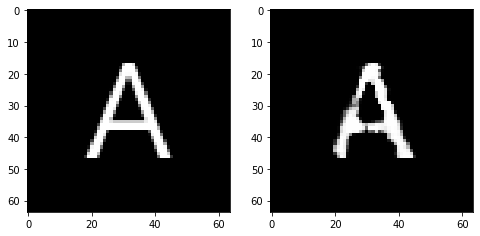

Epoch 28, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5902012400329113, Loss SSIM 2.0673261880874634, Loss Local 178.17626476287842


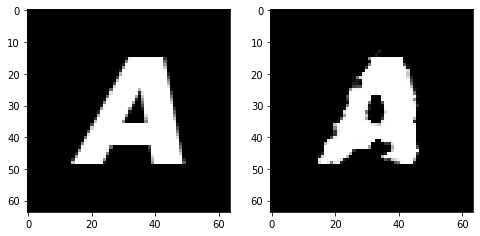

Epoch 28, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5661387518048286, Loss SSIM 2.0553320050239563, Loss Local 169.4407196044922


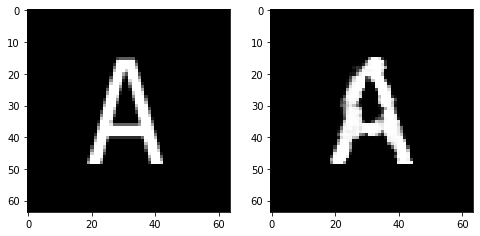

Epoch 28, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5223419889807701, Loss SSIM 1.9969648718833923, Loss Local 170.19620370864868


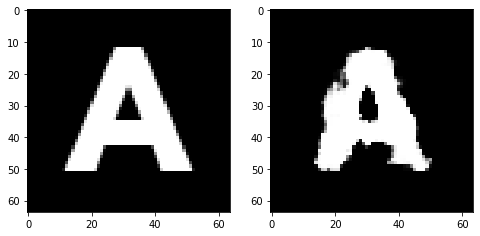

Epoch 29, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6014811396598816, Loss SSIM 2.1067744493484497, Loss Local 179.8065848350525


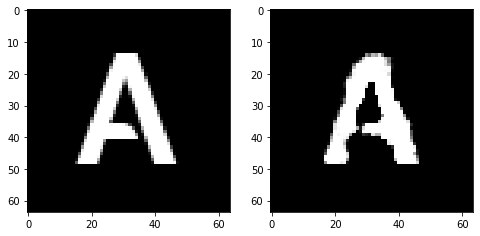

Epoch 29, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5628825537860394, Loss SSIM 2.0999117493629456, Loss Local 180.7924017906189


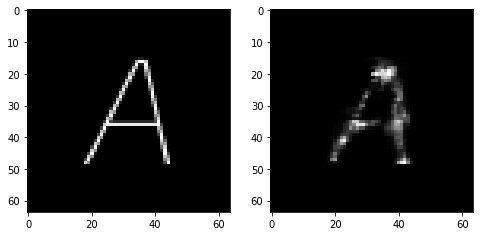

Epoch 29, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.515236023813486, Loss SSIM 1.9497008323669434, Loss Local 172.31724786758423


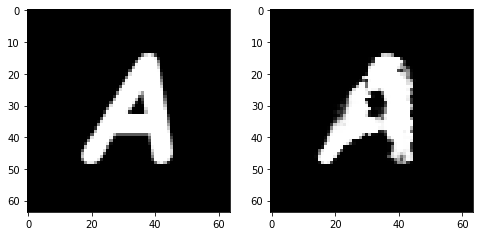

Epoch 29, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5148691833019257, Loss SSIM 1.9269441366195679, Loss Local 166.2598786354065


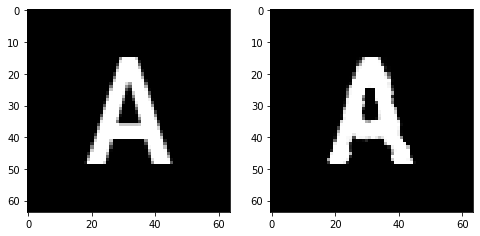

Epoch 29, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5967714749276638, Loss SSIM 2.09332013130188, Loss Local 195.7685260772705


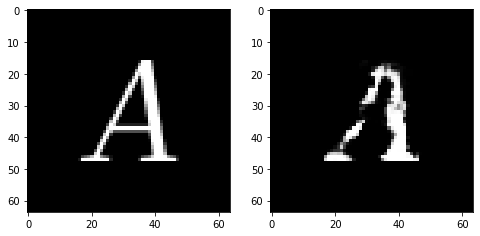

Epoch 29, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6109756790101528, Loss SSIM 2.114336609840393, Loss Local 177.21449661254883


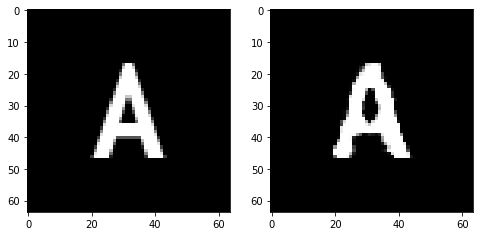

Epoch 29, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5246620625257492, Loss SSIM 1.9711608290672302, Loss Local 174.4800500869751


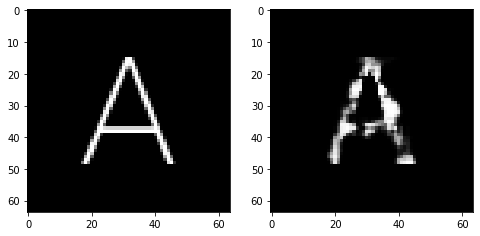

Epoch 30, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.514882616698742, Loss SSIM 1.9508957862854004, Loss Local 164.94831466674805


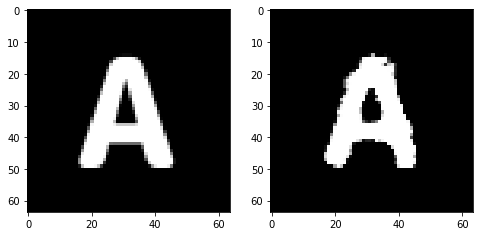

Epoch 30, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5604311041533947, Loss SSIM 2.0084744095802307, Loss Local 176.03148436546326


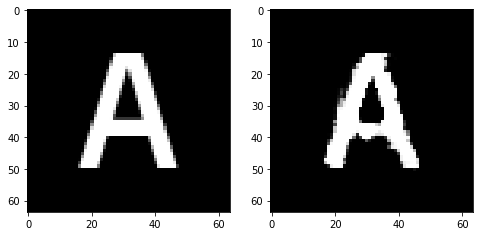

Epoch 30, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5818568244576454, Loss SSIM 2.098944306373596, Loss Local 179.25966882705688


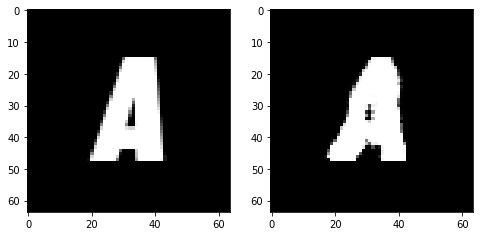

Epoch 30, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5554486699402332, Loss SSIM 2.0358168482780457, Loss Local 173.2581081390381


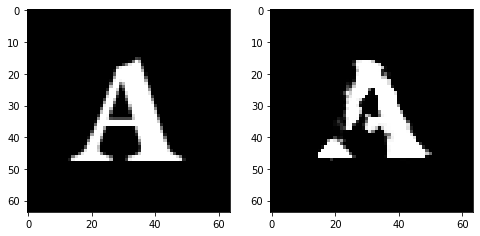

Epoch 30, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5397550910711288, Loss SSIM 2.029918909072876, Loss Local 173.5927233695984


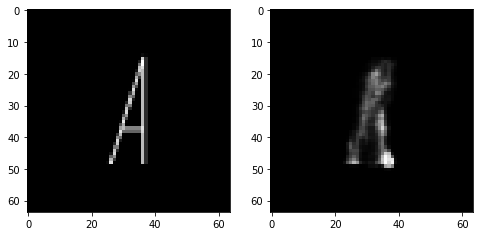

Epoch 30, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5831647776067257, Loss SSIM 2.107685685157776, Loss Local 180.37299633026123


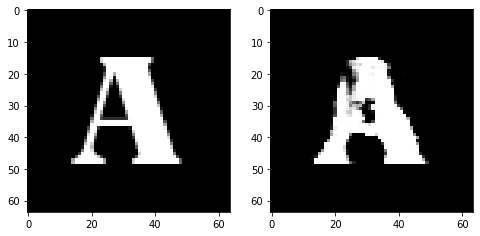

Epoch 30, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5759144984185696, Loss SSIM 2.0659765005111694, Loss Local 179.18932151794434


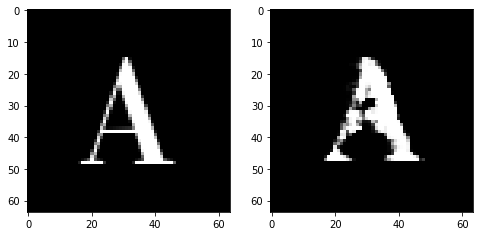

Epoch 31, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5602658689022064, Loss SSIM 1.999124526977539, Loss Local 171.5883059501648


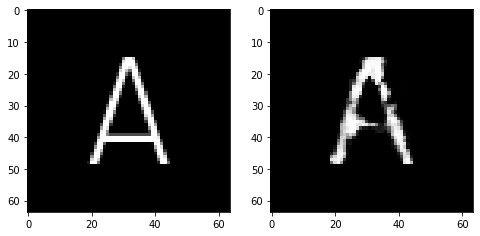

Epoch 31, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5476133860647678, Loss SSIM 2.056272327899933, Loss Local 169.54956340789795


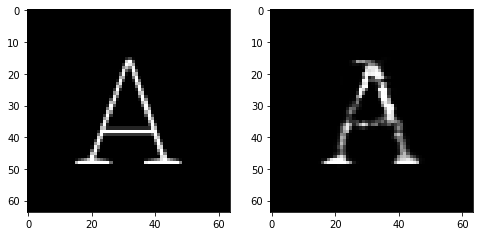

Epoch 31, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6067051589488983, Loss SSIM 2.1147367358207703, Loss Local 179.8901138305664


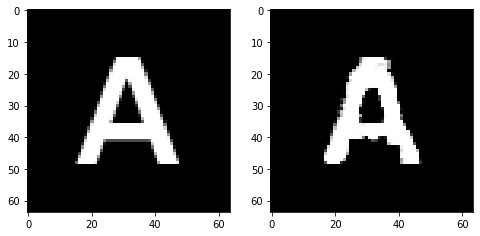

Epoch 31, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5602295696735382, Loss SSIM 2.0362748503684998, Loss Local 164.1027102470398


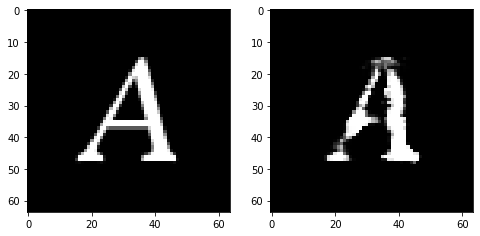

Epoch 31, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.555585339665413, Loss SSIM 2.0666598081588745, Loss Local 173.4689953327179


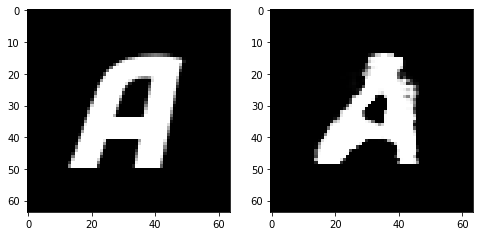

Epoch 31, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5345077626407146, Loss SSIM 2.0138516426086426, Loss Local 169.94262170791626


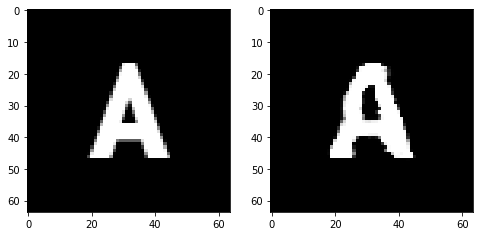

Epoch 31, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5414059050381184, Loss SSIM 2.004663109779358, Loss Local 170.48090267181396


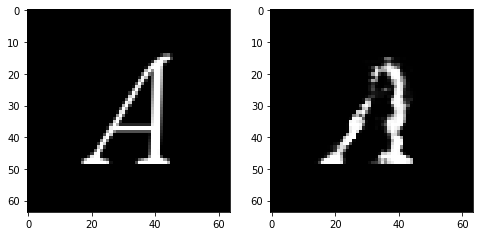

Epoch 32, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5501192063093185, Loss SSIM 2.041130244731903, Loss Local 169.09769916534424


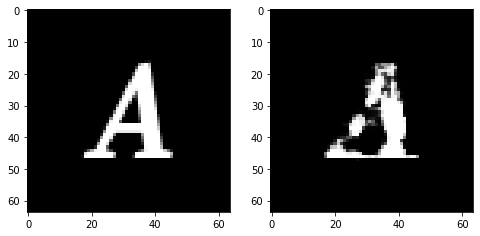

Epoch 32, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5683420114219189, Loss SSIM 2.06561815738678, Loss Local 169.68365240097046


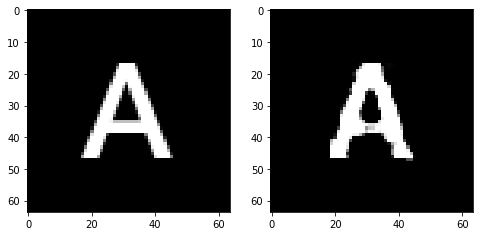

Epoch 32, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5650655701756477, Loss SSIM 2.0461198687553406, Loss Local 179.43649196624756


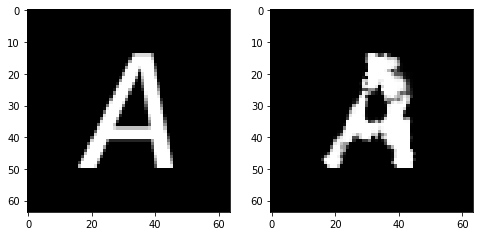

Epoch 32, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6001054234802723, Loss SSIM 2.09820294380188, Loss Local 174.99131107330322


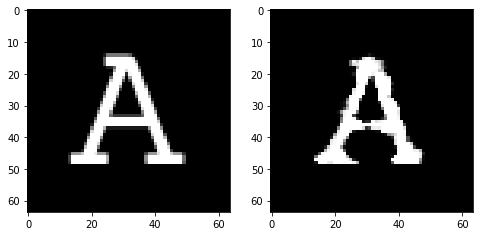

Epoch 32, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5439688935875893, Loss SSIM 2.0235154032707214, Loss Local 166.17119550704956


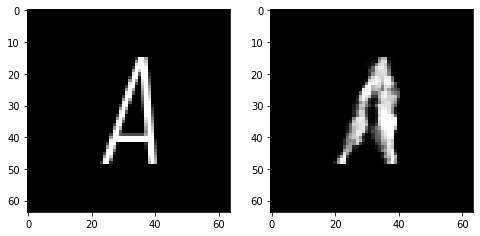

Epoch 32, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5163697712123394, Loss SSIM 1.988213300704956, Loss Local 173.90884447097778


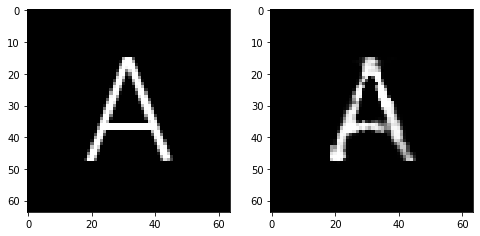

Epoch 32, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5301731452345848, Loss SSIM 2.0026939511299133, Loss Local 167.28035593032837


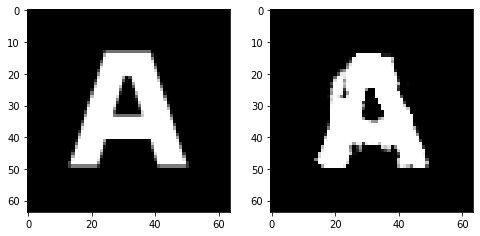

Epoch 33, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5701711475849152, Loss SSIM 2.0413007736206055, Loss Local 169.1421136856079


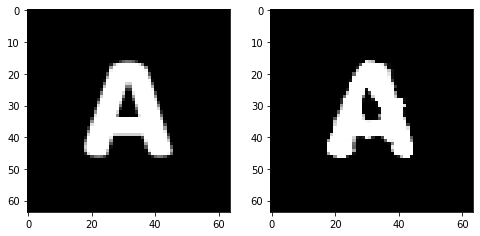

Epoch 33, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5896879769861698, Loss SSIM 2.1092593669891357, Loss Local 173.73763942718506


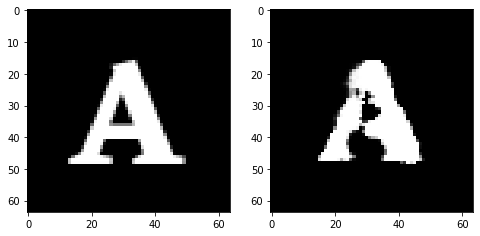

Epoch 33, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5642626360058784, Loss SSIM 2.0208860635757446, Loss Local 175.00530529022217


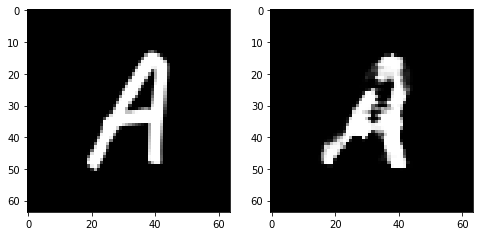

Epoch 33, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.494628805667162, Loss SSIM 1.951699137687683, Loss Local 167.04495573043823


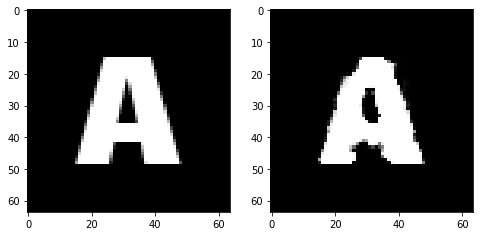

Epoch 33, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5583560727536678, Loss SSIM 2.0893574357032776, Loss Local 175.76074171066284


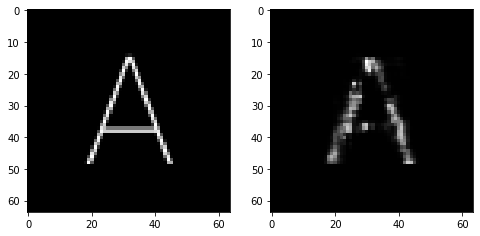

Epoch 33, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6090288273990154, Loss SSIM 2.159678101539612, Loss Local 179.74091148376465


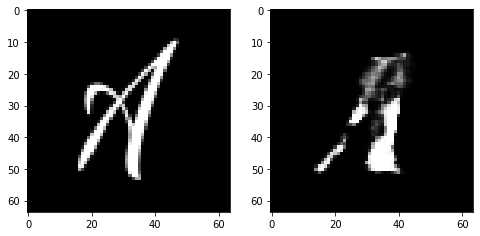

Epoch 33, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5432035401463509, Loss SSIM 1.9618547558784485, Loss Local 179.50073385238647


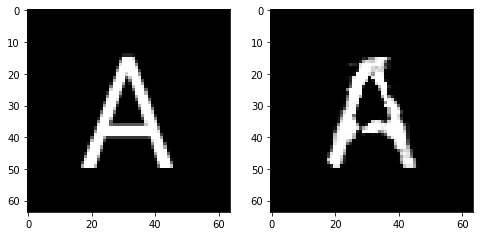

Epoch 34, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5929904952645302, Loss SSIM 2.1134392619132996, Loss Local 179.12936067581177


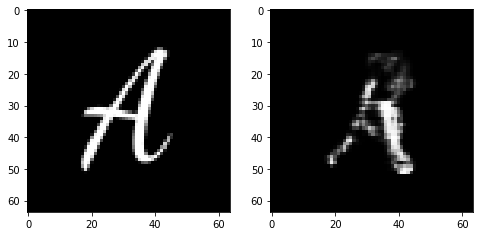

Epoch 34, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5567399375140667, Loss SSIM 2.0310166478157043, Loss Local 180.50306177139282


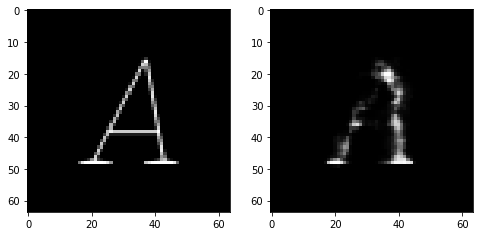

Epoch 34, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5274762399494648, Loss SSIM 2.038083851337433, Loss Local 170.1427459716797


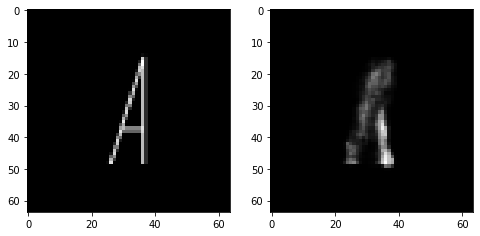

Epoch 34, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5339101292192936, Loss SSIM 2.0071508288383484, Loss Local 175.66534423828125


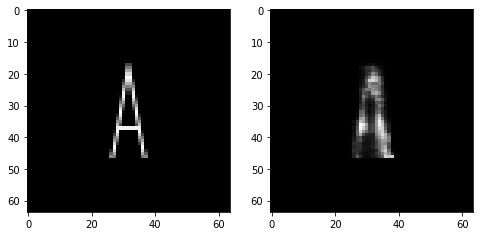

Epoch 34, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6266966201364994, Loss SSIM 2.128813862800598, Loss Local 183.0872573852539


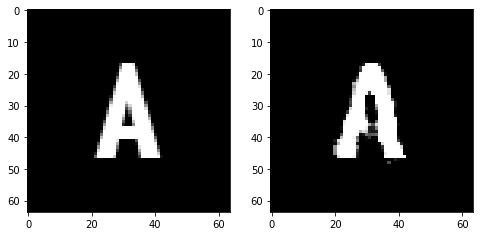

Epoch 34, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5527267754077911, Loss SSIM 2.0247532725334167, Loss Local 174.24739599227905


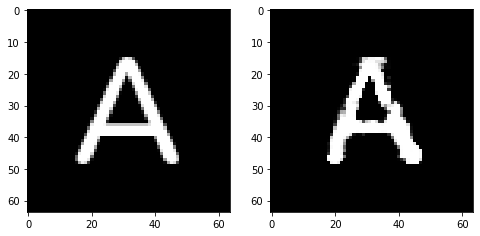

Epoch 34, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.549396127462387, Loss SSIM 1.994559645652771, Loss Local 172.4945411682129


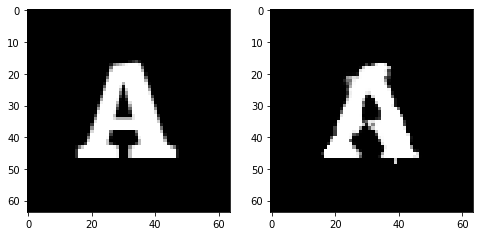

Epoch 35, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5525214932858944, Loss SSIM 2.062296986579895, Loss Local 181.3174295425415


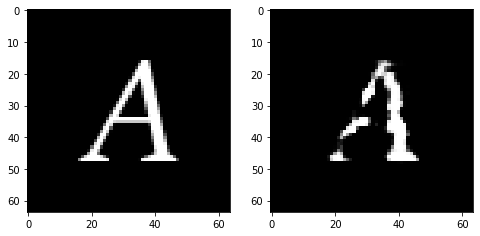

Epoch 35, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5517220571637154, Loss SSIM 2.001417577266693, Loss Local 170.36189079284668


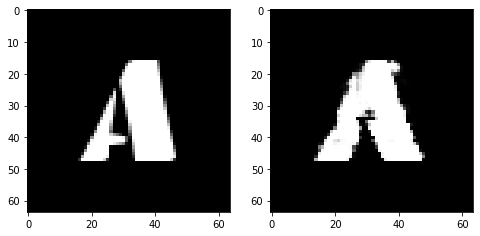

Epoch 35, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5225604064762592, Loss SSIM 1.9641498923301697, Loss Local 171.2183427810669


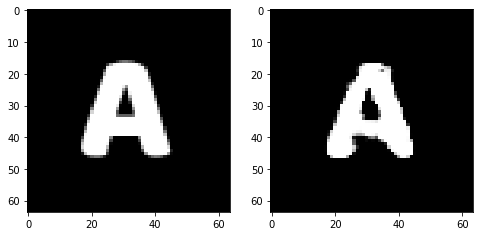

Epoch 35, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6040607430040836, Loss SSIM 2.1016898155212402, Loss Local 187.05526304244995


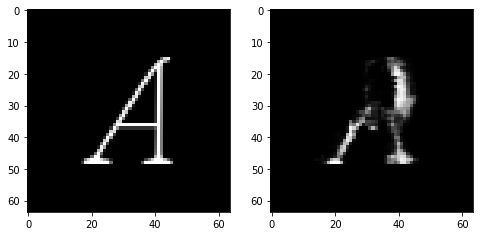

Epoch 35, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6108156442642212, Loss SSIM 2.1413280367851257, Loss Local 179.64699935913086


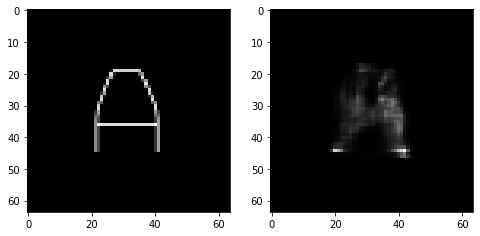

Epoch 35, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5751010663807392, Loss SSIM 2.1029783487319946, Loss Local 176.39215469360352


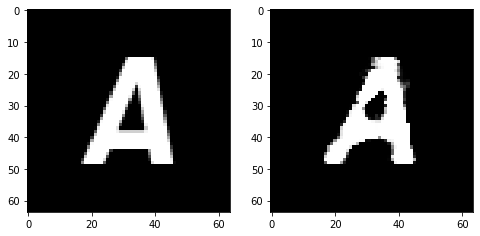

Epoch 35, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4848238490521908, Loss SSIM 1.91538667678833, Loss Local 170.6314663887024


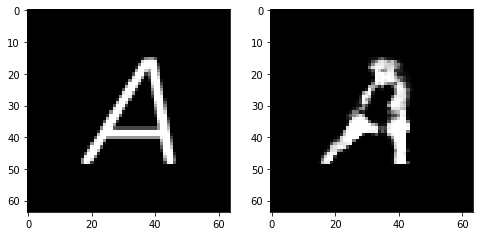

Epoch 36, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6305934935808182, Loss SSIM 2.1576621532440186, Loss Local 188.61614418029785


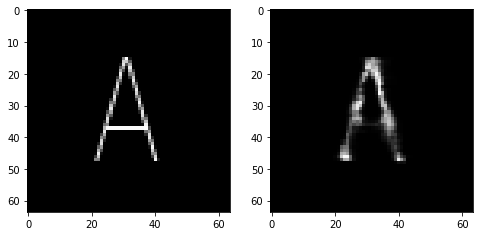

Epoch 36, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.558356937021017, Loss SSIM 2.1167126297950745, Loss Local 175.18507194519043


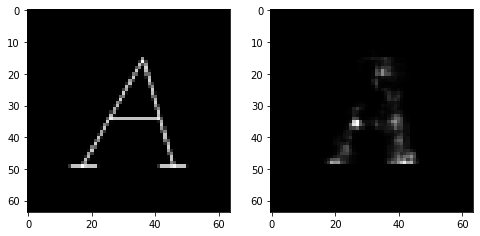

Epoch 36, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5499666221439838, Loss SSIM 2.0889357924461365, Loss Local 165.99783849716187


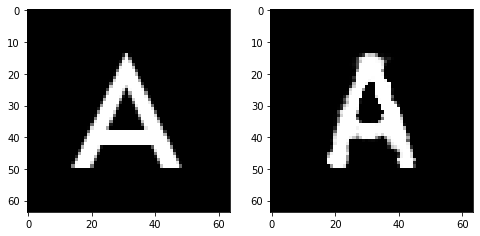

Epoch 36, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5210732109844685, Loss SSIM 1.9360148310661316, Loss Local 174.6347155570984


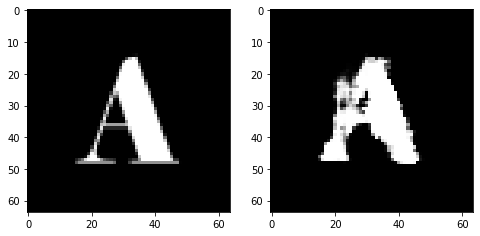

Epoch 36, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5512679889798164, Loss SSIM 1.9973143935203552, Loss Local 176.4011697769165


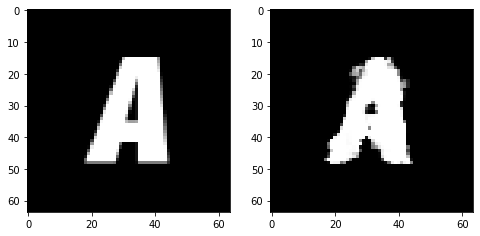

Epoch 36, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5281274691224098, Loss SSIM 1.9913913011550903, Loss Local 180.4804973602295


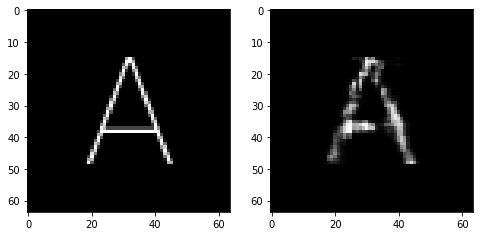

Epoch 36, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.591425634920597, Loss SSIM 2.0707646012306213, Loss Local 172.5302529335022


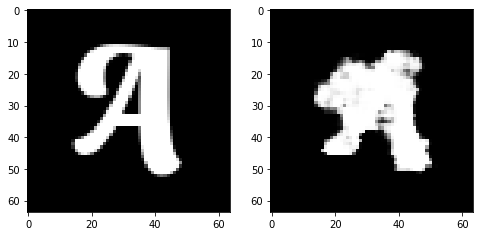

Epoch 37, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5443268418312073, Loss SSIM 2.008215367794037, Loss Local 173.20740604400635


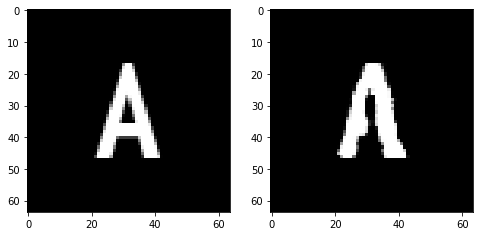

Epoch 37, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5720720440149307, Loss SSIM 2.0482450127601624, Loss Local 169.33825540542603


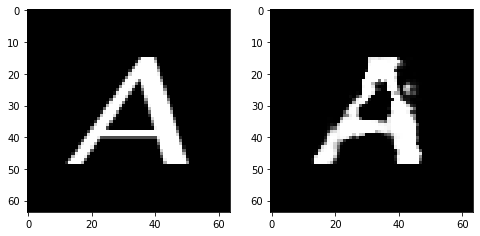

Epoch 37, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.553217526525259, Loss SSIM 2.0337700247764587, Loss Local 167.900710105896


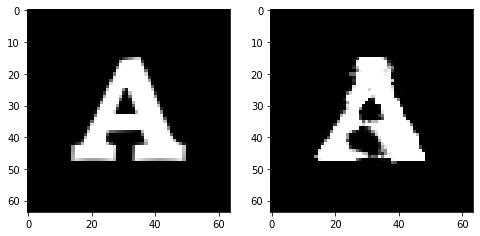

Epoch 37, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5848860293626785, Loss SSIM 2.1130740642547607, Loss Local 174.92568397521973


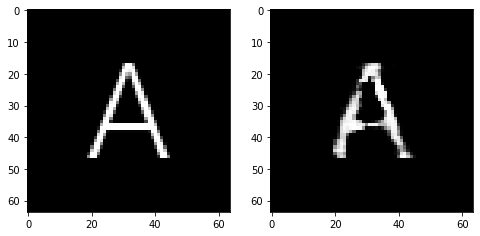

Epoch 37, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5369500145316124, Loss SSIM 2.0073075890541077, Loss Local 178.73643016815186


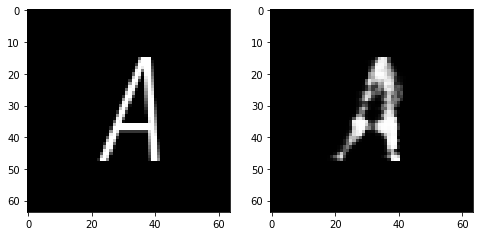

Epoch 37, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5349337421357632, Loss SSIM 1.973684549331665, Loss Local 176.37704610824585


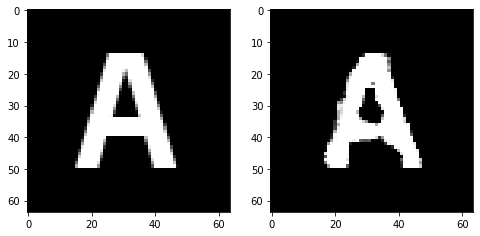

Epoch 37, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5696343742311, Loss SSIM 2.0755996704101562, Loss Local 170.23827075958252


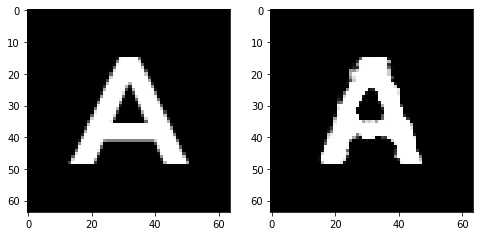

Epoch 38, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6003046482801437, Loss SSIM 2.090076267719269, Loss Local 176.58334732055664


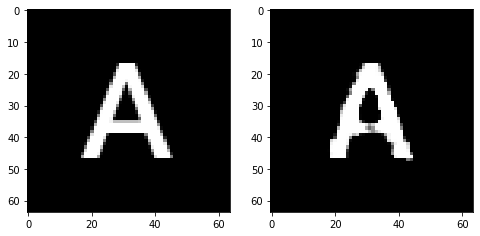

Epoch 38, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5398188792169094, Loss SSIM 1.9735392928123474, Loss Local 177.55902338027954


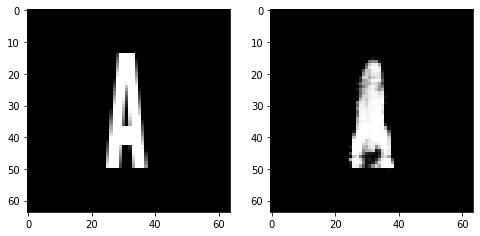

Epoch 38, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.514124806970358, Loss SSIM 1.9351886510849, Loss Local 174.35351371765137


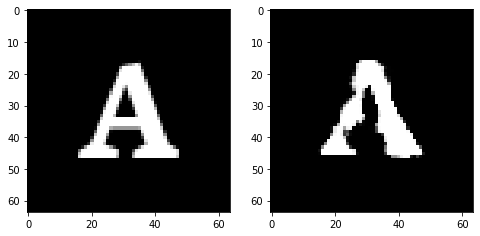

Epoch 38, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5118229873478413, Loss SSIM 1.969518005847931, Loss Local 172.32276678085327


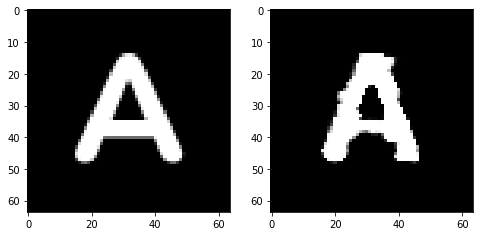

Epoch 38, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5909259878098965, Loss SSIM 2.1326541900634766, Loss Local 172.62472534179688


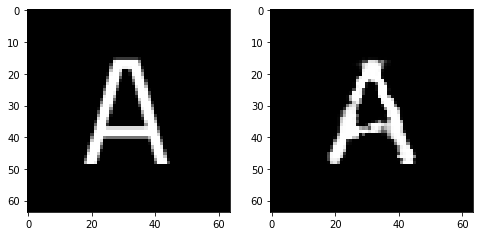

Epoch 38, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5891881361603737, Loss SSIM 2.080259621143341, Loss Local 173.86496829986572


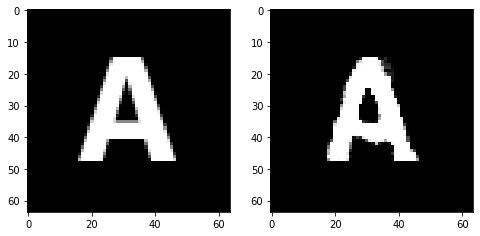

Epoch 38, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6048599667847157, Loss SSIM 2.1762189269065857, Loss Local 178.9895315170288


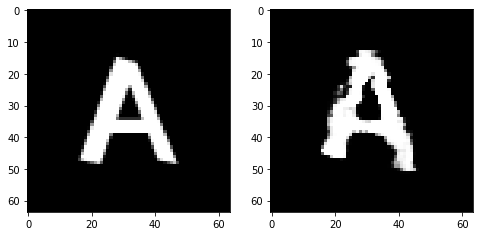

Epoch 39, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5888352058827877, Loss SSIM 2.060085117816925, Loss Local 181.14315223693848


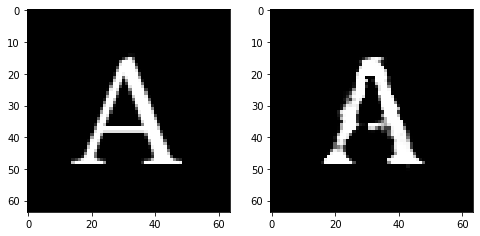

Epoch 39, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5653943084180355, Loss SSIM 2.044102132320404, Loss Local 183.84108543395996


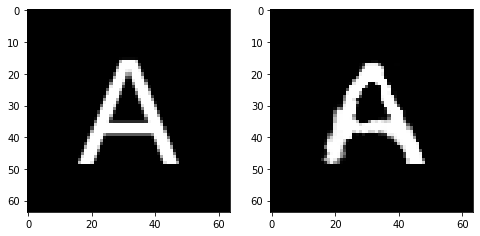

Epoch 39, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5588698089122772, Loss SSIM 2.056749939918518, Loss Local 177.39082622528076


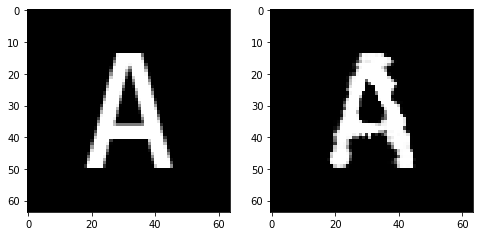

Epoch 39, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5134562253952026, Loss SSIM 1.9881690740585327, Loss Local 167.5406141281128


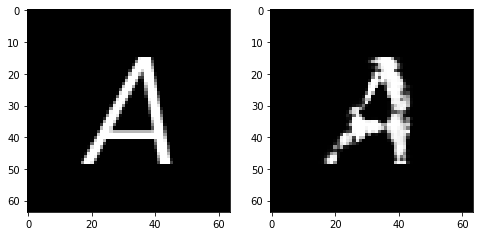

Epoch 39, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5926078669726849, Loss SSIM 2.0872247219085693, Loss Local 182.74215698242188


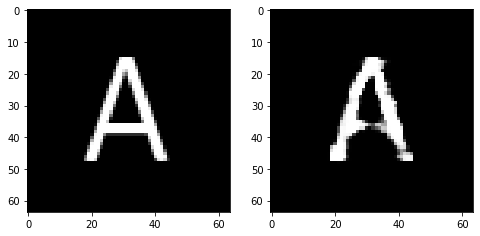

Epoch 39, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6139354519546032, Loss SSIM 2.168568730354309, Loss Local 169.0919976234436


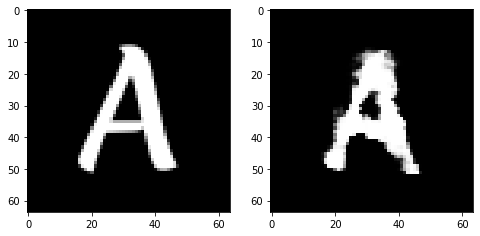

Epoch 39, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4993786923587322, Loss SSIM 1.9452925324440002, Loss Local 166.4720139503479


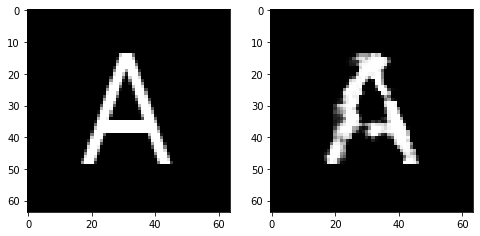

Epoch 40, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5476269163191319, Loss SSIM 2.0079383850097656, Loss Local 168.00789499282837


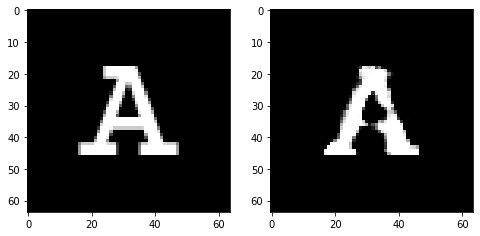

Epoch 40, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.594637505710125, Loss SSIM 2.0675964951515198, Loss Local 174.67497396469116


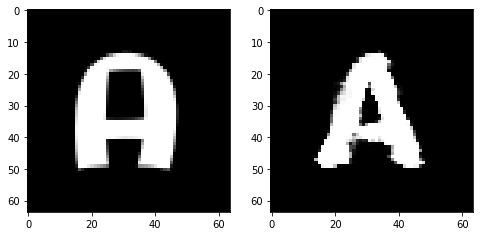

Epoch 40, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5440103374421597, Loss SSIM 2.021889388561249, Loss Local 174.72444581985474


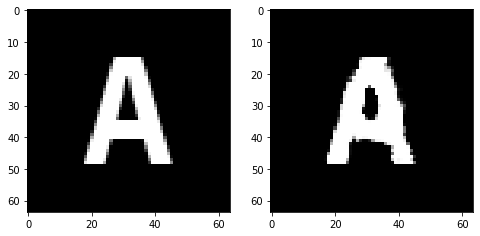

Epoch 40, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5516920424997807, Loss SSIM 2.0756053924560547, Loss Local 175.0215311050415


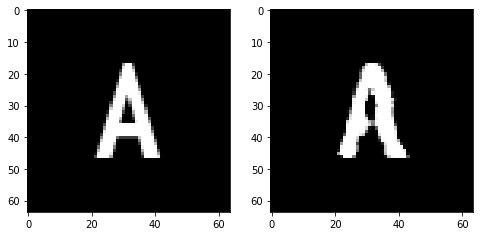

Epoch 40, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5545934662222862, Loss SSIM 2.027764856815338, Loss Local 175.58143424987793


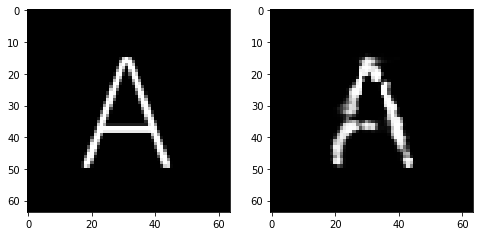

Epoch 40, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5669931285083294, Loss SSIM 2.0540505051612854, Loss Local 175.80957746505737


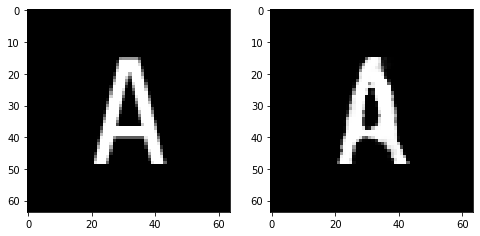

Epoch 40, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5943181477487087, Loss SSIM 2.099870443344116, Loss Local 177.3987717628479


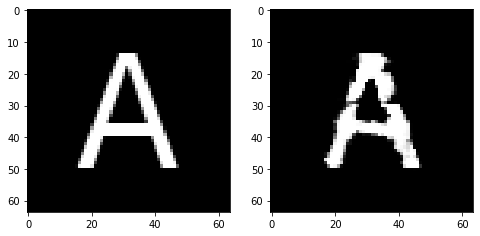

Epoch 41, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5898230709135532, Loss SSIM 2.0989062190055847, Loss Local 177.92774391174316


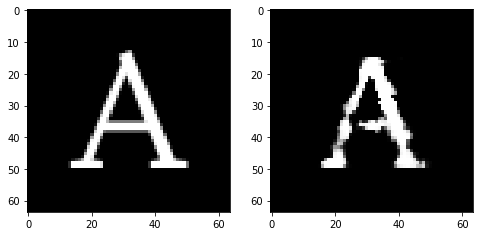

Epoch 41, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5560657009482384, Loss SSIM 2.0023279190063477, Loss Local 176.59027290344238


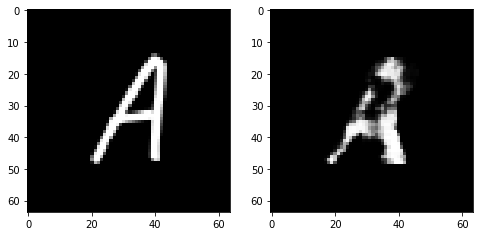

Epoch 41, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6173123084008694, Loss SSIM 2.143435835838318, Loss Local 183.4192352294922


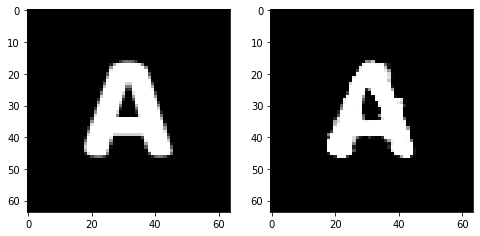

Epoch 41, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5179726593196392, Loss SSIM 1.9823436737060547, Loss Local 166.8996663093567


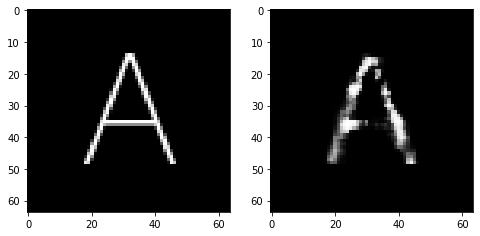

Epoch 41, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5398155264556408, Loss SSIM 1.9865790605545044, Loss Local 169.37627840042114


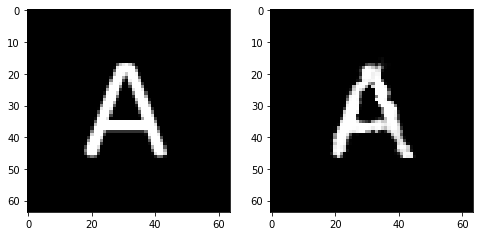

Epoch 41, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.517842911183834, Loss SSIM 2.0077983736991882, Loss Local 167.11396503448486


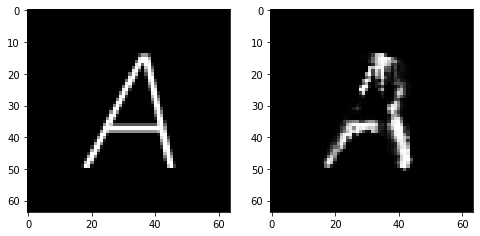

Epoch 41, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5671906471252441, Loss SSIM 2.0482614636421204, Loss Local 176.9368691444397


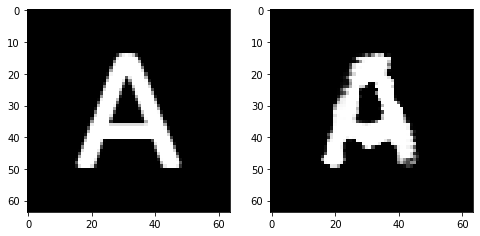

Epoch 42, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5273252688348293, Loss SSIM 2.0173356533050537, Loss Local 171.90391159057617


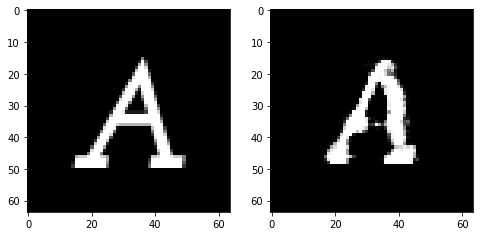

Epoch 42, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5489744693040848, Loss SSIM 2.064630925655365, Loss Local 176.0063819885254


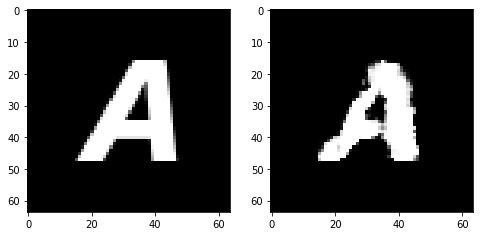

Epoch 42, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5785210095345974, Loss SSIM 2.0656269192695618, Loss Local 184.56731843948364


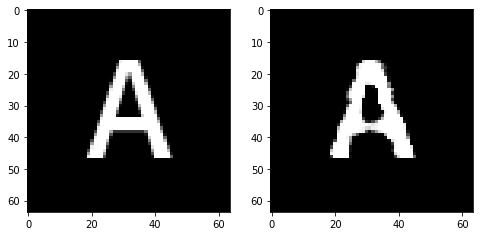

Epoch 42, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5240717604756355, Loss SSIM 1.953796148300171, Loss Local 172.32708883285522


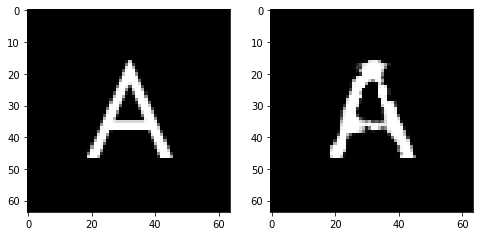

Epoch 42, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5709052197635174, Loss SSIM 2.050946354866028, Loss Local 177.0342173576355


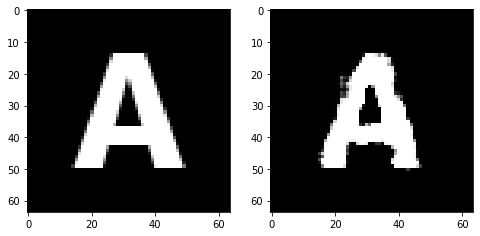

Epoch 42, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5919621773064137, Loss SSIM 2.0567172169685364, Loss Local 178.93732404708862


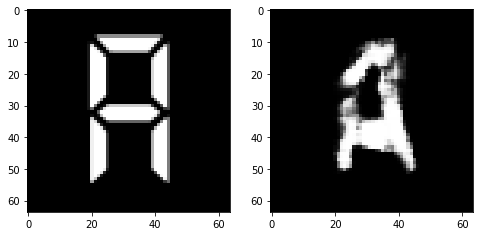

Epoch 42, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.557488139718771, Loss SSIM 2.0354214310646057, Loss Local 176.67953491210938


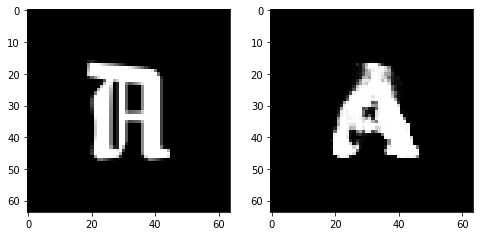

Epoch 43, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5500828847289085, Loss SSIM 2.0631643533706665, Loss Local 178.71183061599731


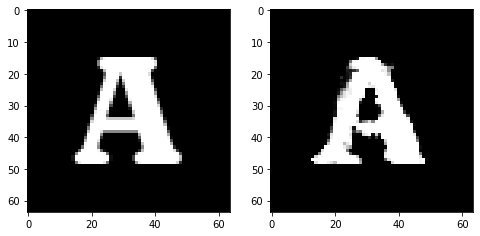

Epoch 43, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.552287321537733, Loss SSIM 2.044267952442169, Loss Local 168.7982988357544


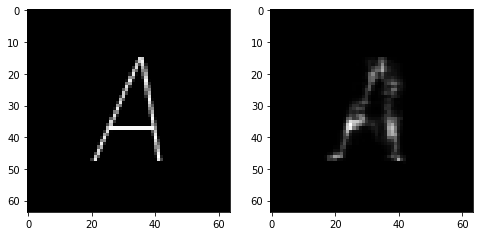

Epoch 43, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5669716708362103, Loss SSIM 2.0267428755760193, Loss Local 177.7771816253662


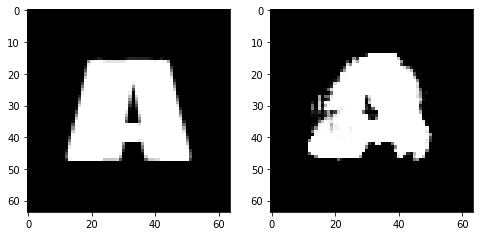

Epoch 43, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5545813888311386, Loss SSIM 2.037025570869446, Loss Local 176.59938287734985


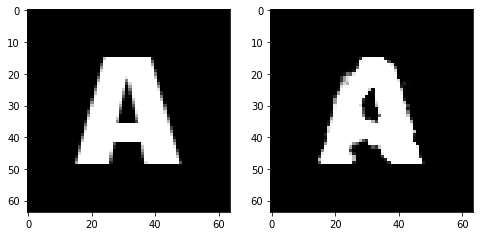

Epoch 43, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.568949919193983, Loss SSIM 2.0089489817619324, Loss Local 180.5314679145813


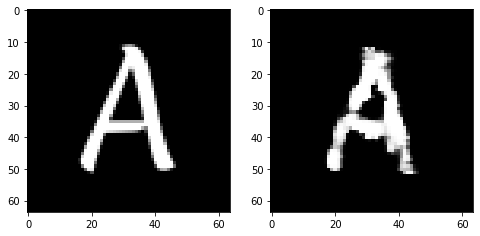

Epoch 43, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5969299897551537, Loss SSIM 2.1028555035591125, Loss Local 176.35492610931396


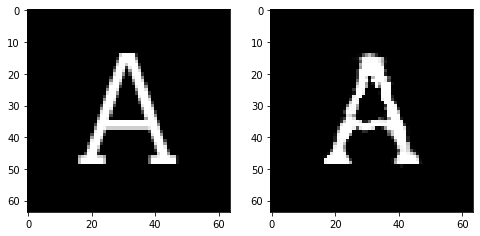

Epoch 43, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5450808480381966, Loss SSIM 2.0284574031829834, Loss Local 163.53333234786987


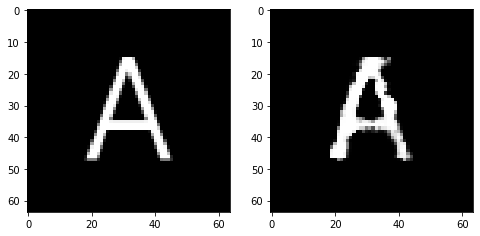

Epoch 44, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5368080660700798, Loss SSIM 2.0295820832252502, Loss Local 168.17427015304565


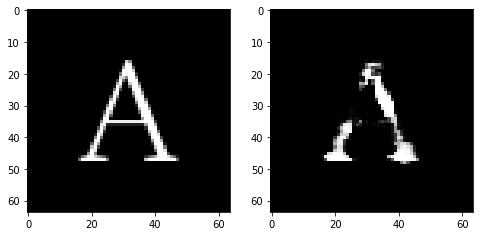

Epoch 44, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4884736612439156, Loss SSIM 1.9264124631881714, Loss Local 159.6753978729248


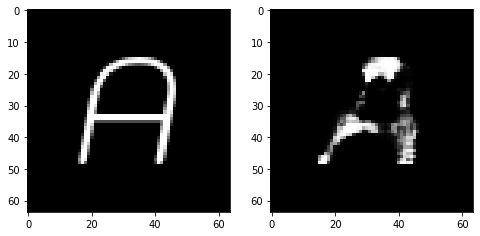

Epoch 44, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6052901148796082, Loss SSIM 2.1630184054374695, Loss Local 181.4232587814331


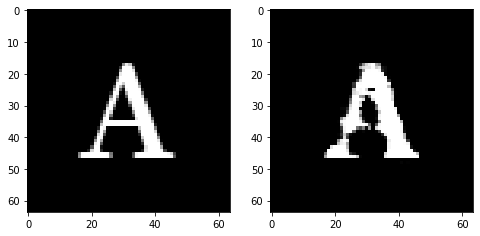

Epoch 44, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5725799761712551, Loss SSIM 2.1022223234176636, Loss Local 176.66674709320068


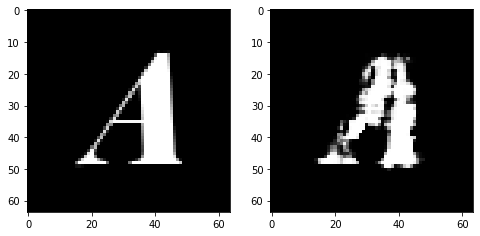

Epoch 44, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5457456521689892, Loss SSIM 2.0021435022354126, Loss Local 172.67003440856934


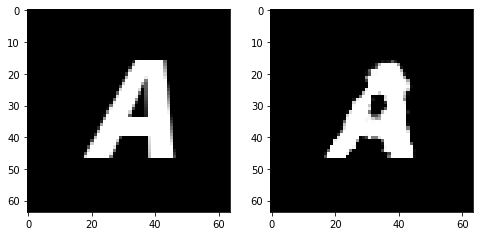

Epoch 44, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5875365138053894, Loss SSIM 2.0884678959846497, Loss Local 176.09558725357056


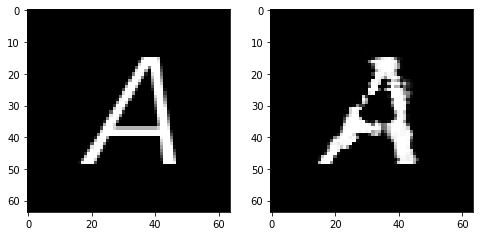

Epoch 44, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.574862278997898, Loss SSIM 2.0349480509757996, Loss Local 172.40584421157837


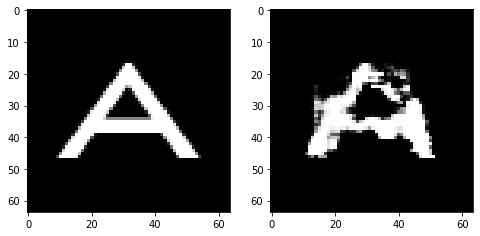

Epoch 45, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.59377571195364, Loss SSIM 2.1118168234825134, Loss Local 174.12958478927612


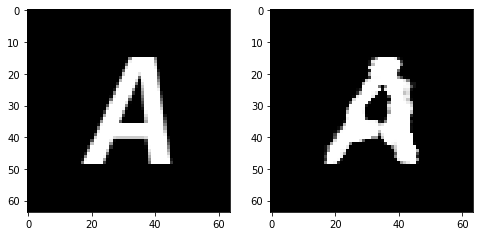

Epoch 45, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5987343415617943, Loss SSIM 2.078712046146393, Loss Local 175.13353776931763


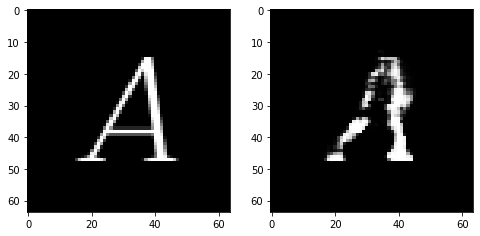

Epoch 45, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.492586649954319, Loss SSIM 1.8975834846496582, Loss Local 167.35679149627686


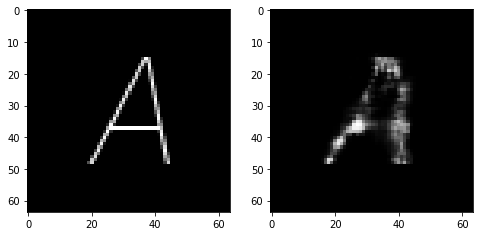

Epoch 45, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.539039358496666, Loss SSIM 2.0443235039711, Loss Local 175.16802668571472


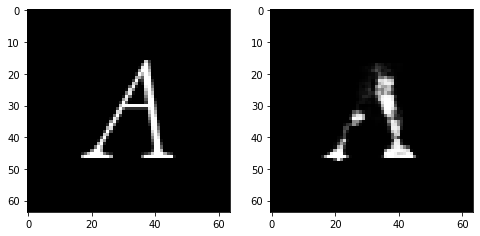

Epoch 45, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.569074209779501, Loss SSIM 2.1187727451324463, Loss Local 170.08089017868042


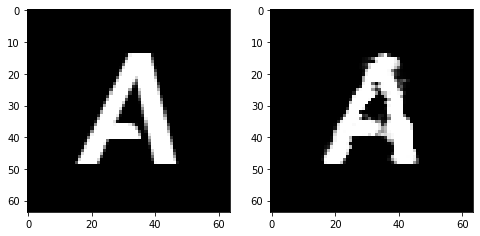

Epoch 45, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.577100656926632, Loss SSIM 2.067844867706299, Loss Local 173.73904514312744


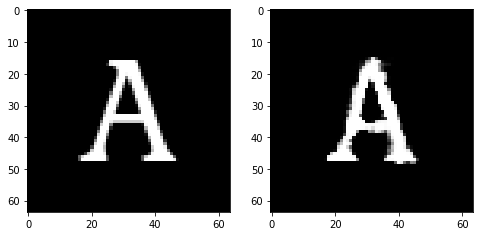

Epoch 45, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.549862790852785, Loss SSIM 2.044348180294037, Loss Local 180.33608055114746


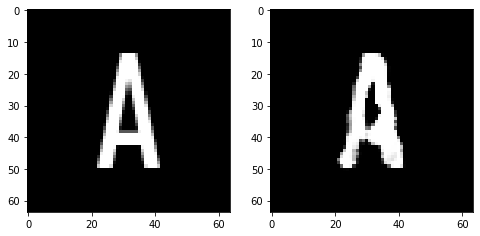

Epoch 46, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5326946564018726, Loss SSIM 1.9614750742912292, Loss Local 170.82142400741577


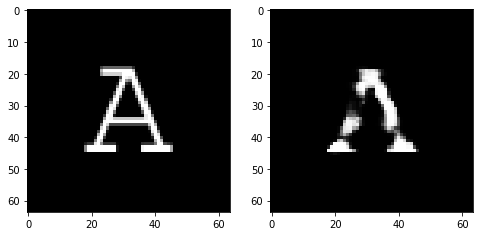

Epoch 46, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5708672292530537, Loss SSIM 2.0647018551826477, Loss Local 175.71975088119507


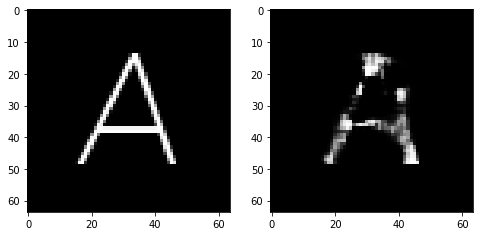

Epoch 46, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5434499494731426, Loss SSIM 2.015305995941162, Loss Local 173.99766731262207


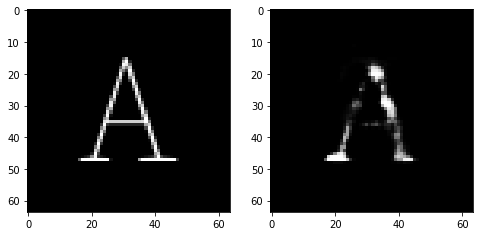

Epoch 46, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5677365064620972, Loss SSIM 2.067602276802063, Loss Local 172.9939160346985


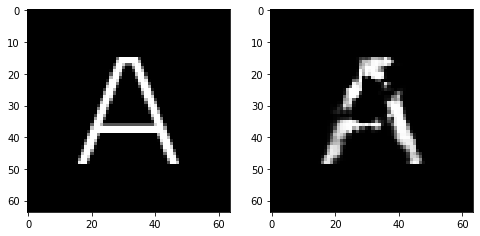

Epoch 46, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5119480527937412, Loss SSIM 1.9784731268882751, Loss Local 175.79281377792358


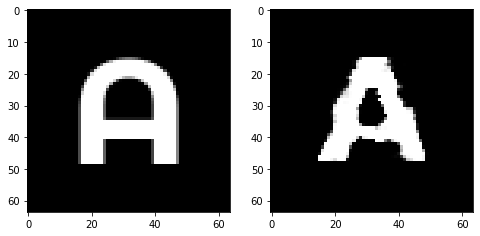

Epoch 46, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6551224179565907, Loss SSIM 2.2006924748420715, Loss Local 189.14608192443848


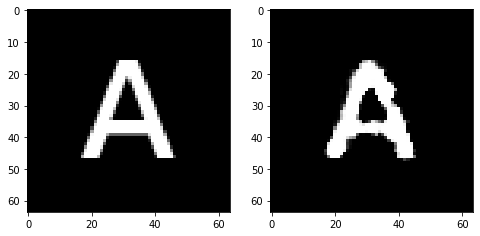

Epoch 46, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5433186180889606, Loss SSIM 2.0079349279403687, Loss Local 173.25323915481567


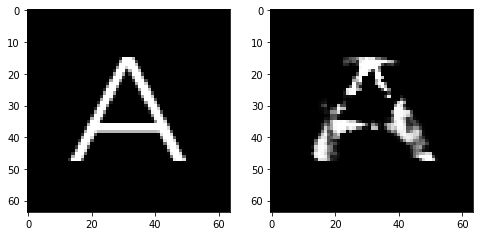

Epoch 47, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5682877711951733, Loss SSIM 2.0511568188667297, Loss Local 178.05420684814453


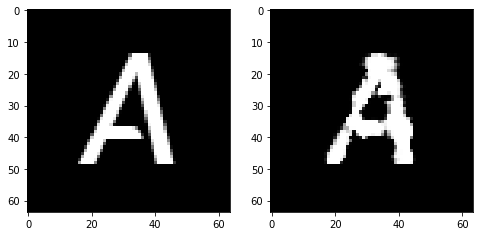

Epoch 47, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5637507513165474, Loss SSIM 2.079394042491913, Loss Local 169.74758863449097


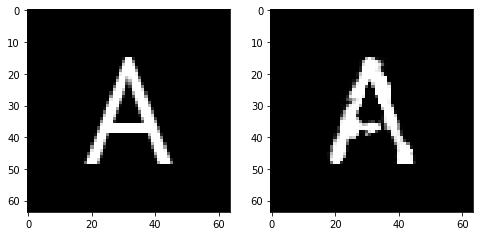

Epoch 47, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5599254295229912, Loss SSIM 2.018089473247528, Loss Local 172.36687421798706


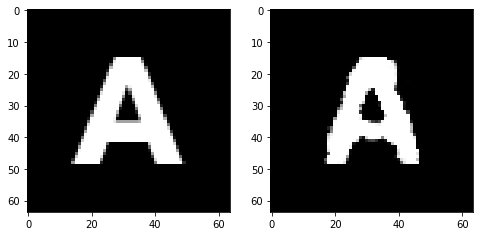

Epoch 47, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5707694590091705, Loss SSIM 2.0405741930007935, Loss Local 180.3772931098938


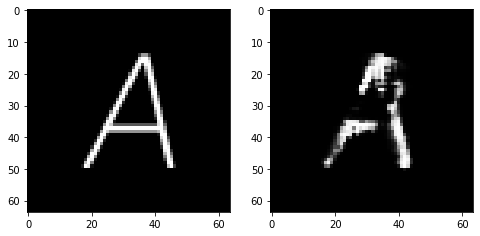

Epoch 47, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.576345108449459, Loss SSIM 2.0502468943595886, Loss Local 181.18963432312012


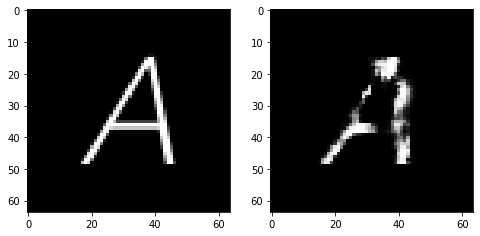

Epoch 47, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5374936275184155, Loss SSIM 2.041921377182007, Loss Local 175.4531054496765


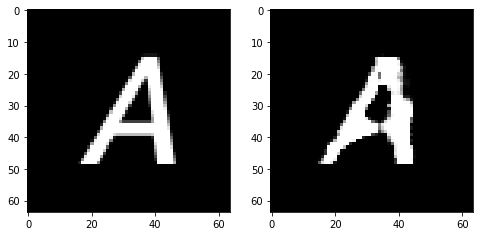

Epoch 47, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5889671482145786, Loss SSIM 2.0988182425498962, Loss Local 180.44913816452026


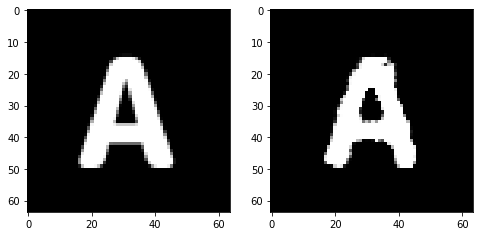

Epoch 48, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5681435726583004, Loss SSIM 2.091154098510742, Loss Local 165.2011148929596


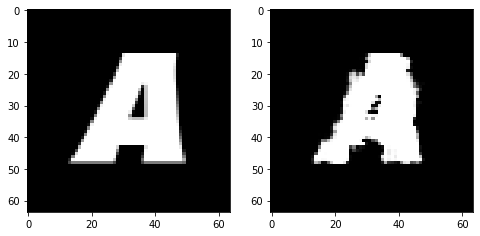

Epoch 48, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.561671320348978, Loss SSIM 2.068124532699585, Loss Local 180.1640076637268


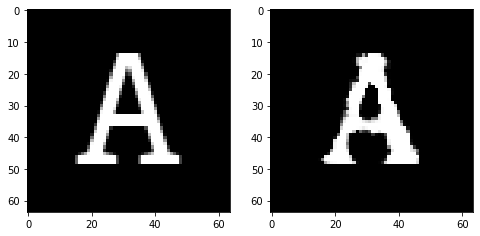

Epoch 48, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5516035370528698, Loss SSIM 2.0475282073020935, Loss Local 169.02951669692993


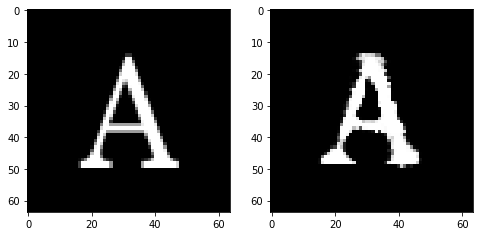

Epoch 48, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5578964240849018, Loss SSIM 1.9892372488975525, Loss Local 169.77249765396118


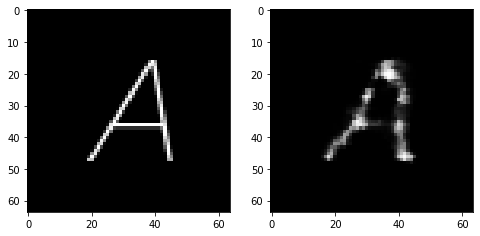

Epoch 48, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.562830250710249, Loss SSIM 2.0637558698654175, Loss Local 171.58499956130981


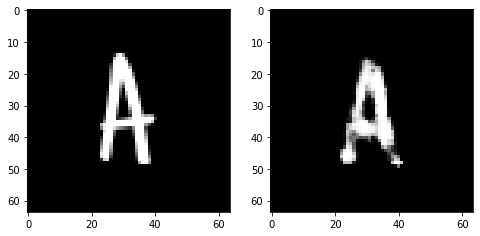

Epoch 48, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5828553289175034, Loss SSIM 2.0676053166389465, Loss Local 178.62963724136353


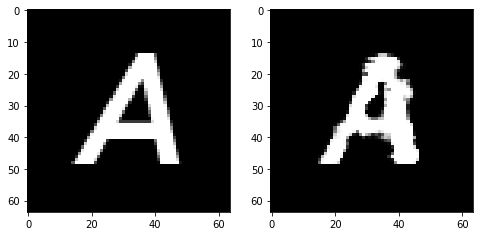

Epoch 48, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5605016015470028, Loss SSIM 2.0304412841796875, Loss Local 171.9301152229309


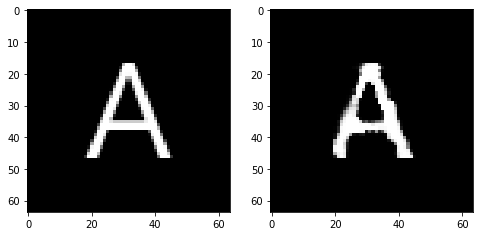

Epoch 49, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.556587740778923, Loss SSIM 1.9911181330680847, Loss Local 178.67177963256836


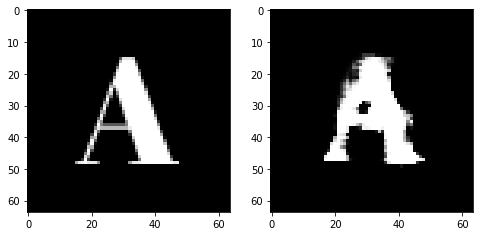

Epoch 49, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5602217726409435, Loss SSIM 2.032371401786804, Loss Local 174.78216886520386


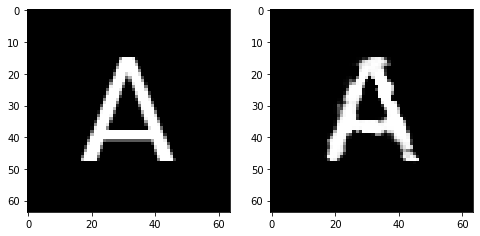

Epoch 49, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5778664611279964, Loss SSIM 2.0942733883857727, Loss Local 169.5317096710205


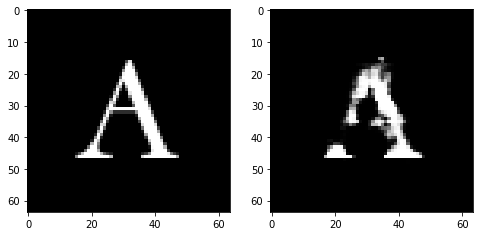

Epoch 49, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5469623059034348, Loss SSIM 2.0327216386795044, Loss Local 172.64369440078735


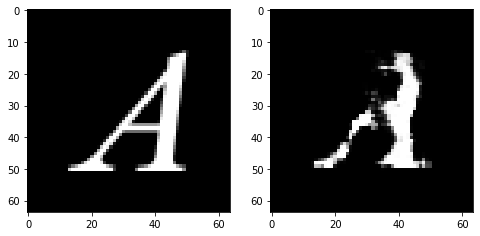

Epoch 49, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5733138471841812, Loss SSIM 2.0871463418006897, Loss Local 168.13760566711426


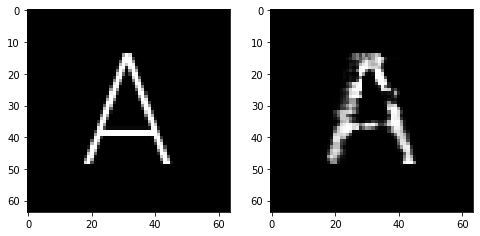

Epoch 49, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5461652651429176, Loss SSIM 2.0144264101982117, Loss Local 170.8907699584961


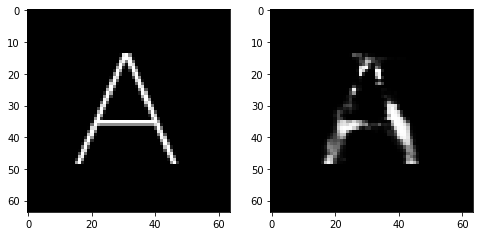

Epoch 49, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5585105642676353, Loss SSIM 2.0838807821273804, Loss Local 168.58699703216553


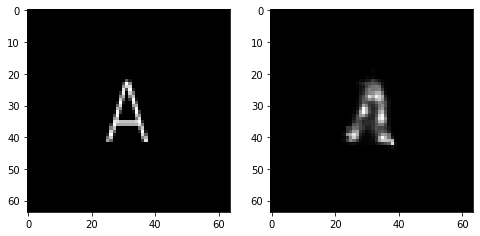

Epoch 50, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5523455031216145, Loss SSIM 2.0301501750946045, Loss Local 180.50074768066406


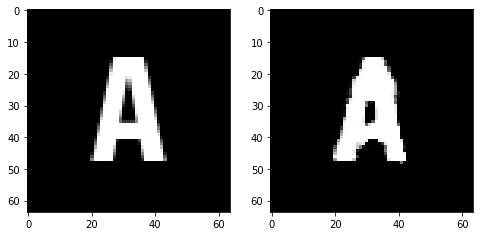

Epoch 50, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6074314899742603, Loss SSIM 2.104301869869232, Loss Local 173.5051293373108


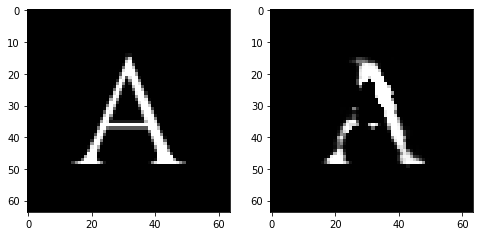

Epoch 50, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5461251735687256, Loss SSIM 2.0154667496681213, Loss Local 180.19281673431396


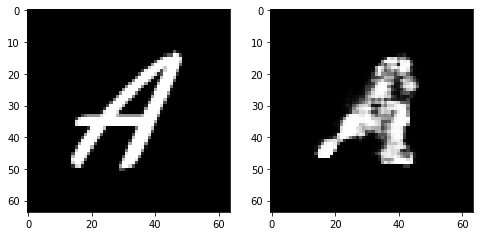

Epoch 50, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5086947828531265, Loss SSIM 1.9374315738677979, Loss Local 181.41616821289062


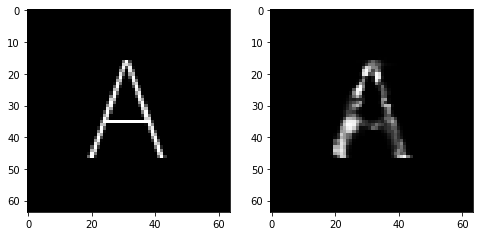

Epoch 50, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5738746598362923, Loss SSIM 2.1169926524162292, Loss Local 181.87814378738403


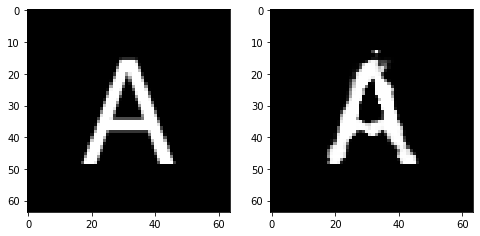

Epoch 50, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.561360191553831, Loss SSIM 2.0241768956184387, Loss Local 181.5019998550415


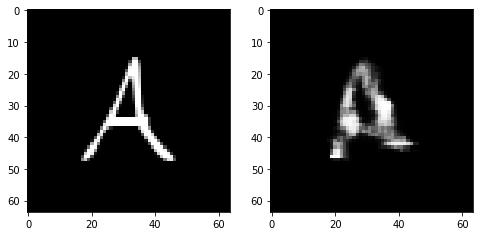

Epoch 50, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.556437123566866, Loss SSIM 2.0821686387062073, Loss Local 174.47204875946045


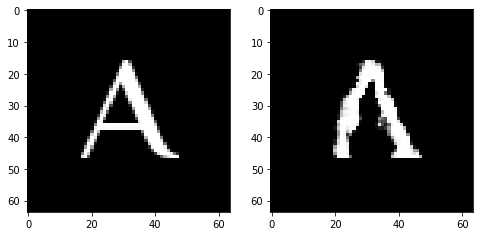

Epoch 51, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5923372097313404, Loss SSIM 2.1267539262771606, Loss Local 176.83228302001953


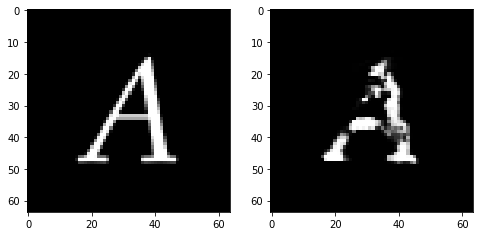

Epoch 51, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5616678036749363, Loss SSIM 2.027435839176178, Loss Local 177.16319036483765


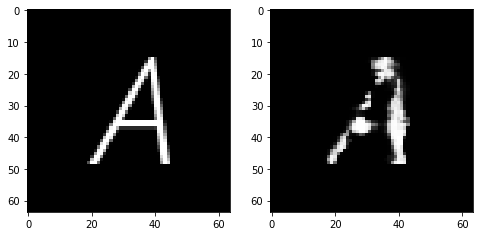

Epoch 51, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.516684629023075, Loss SSIM 1.975974202156067, Loss Local 163.0071325302124


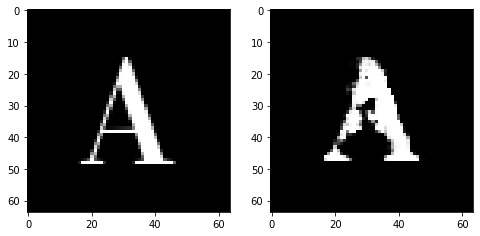

Epoch 51, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5646361410617828, Loss SSIM 2.0632781386375427, Loss Local 168.34619855880737


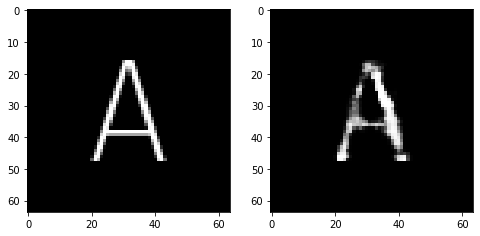

Epoch 51, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.538397405296564, Loss SSIM 2.0151907205581665, Loss Local 166.2689070701599


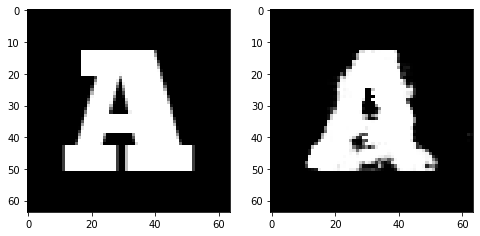

Epoch 51, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.557938639074564, Loss SSIM 2.063132643699646, Loss Local 172.58883714675903


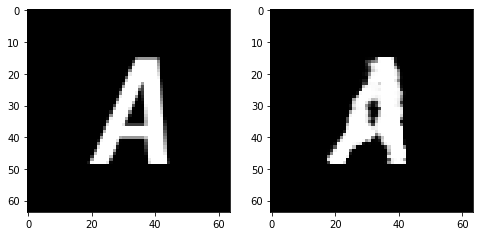

Epoch 51, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5810652039945126, Loss SSIM 2.036883294582367, Loss Local 188.19204807281494


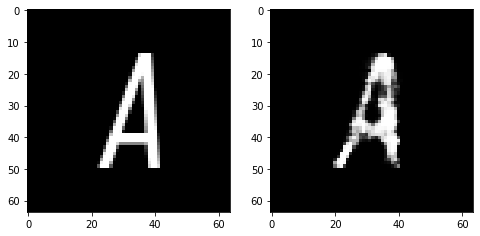

Epoch 52, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6075276769697666, Loss SSIM 2.1039148569107056, Loss Local 175.65774011611938


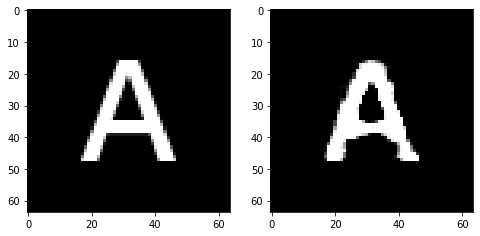

Epoch 52, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5192052870988846, Loss SSIM 1.9873356223106384, Loss Local 170.90349626541138


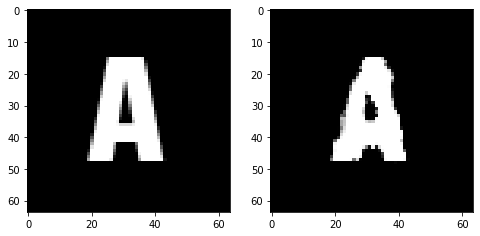

Epoch 52, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6023930236697197, Loss SSIM 2.0810872316360474, Loss Local 187.03509187698364


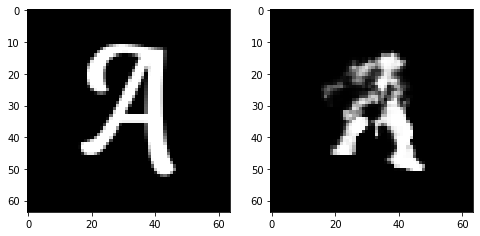

Epoch 52, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.529689621180296, Loss SSIM 2.0089533925056458, Loss Local 174.0848879814148


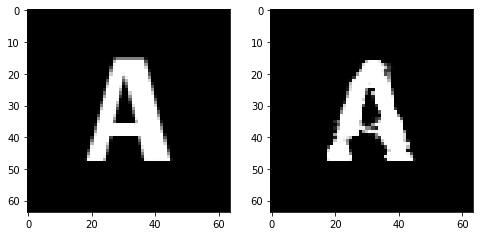

Epoch 52, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.576481394469738, Loss SSIM 2.143101692199707, Loss Local 174.7843098640442


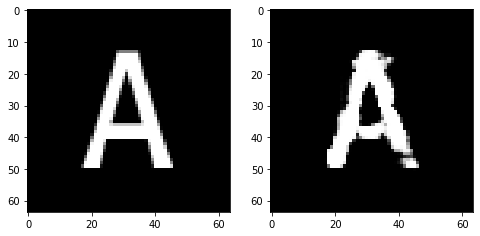

Epoch 52, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5202688612043858, Loss SSIM 1.9554767608642578, Loss Local 172.4324927330017


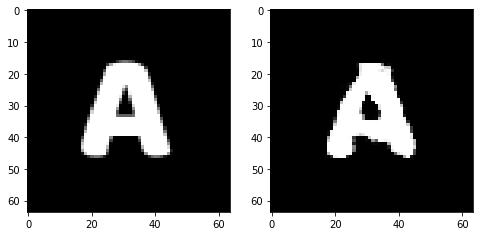

Epoch 52, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.570178333669901, Loss SSIM 2.0544233918190002, Loss Local 172.57370710372925


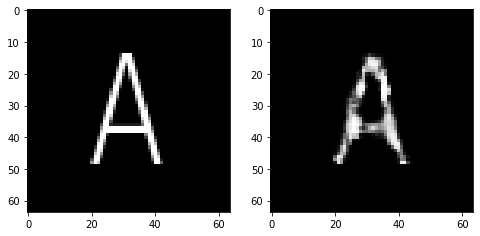

Epoch 53, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5647535026073456, Loss SSIM 2.096432864665985, Loss Local 174.09909057617188


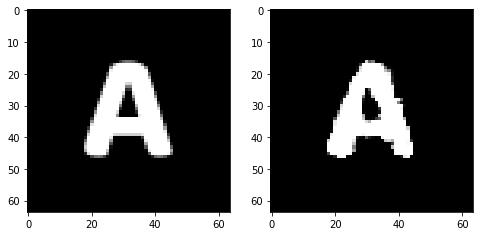

Epoch 53, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5470638461411, Loss SSIM 1.9679096341133118, Loss Local 164.1415877342224


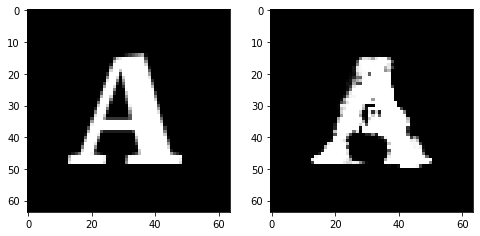

Epoch 53, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6240370534360409, Loss SSIM 2.130313456058502, Loss Local 181.60170364379883


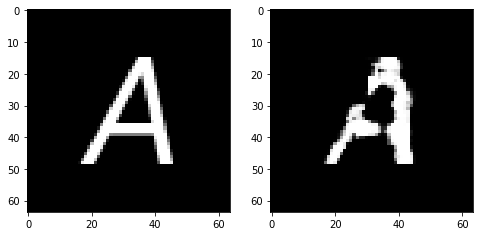

Epoch 53, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.573202759027481, Loss SSIM 2.053273022174835, Loss Local 175.49664497375488


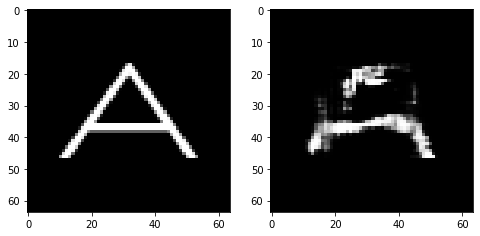

Epoch 53, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5170538052916527, Loss SSIM 1.988243818283081, Loss Local 171.65363836288452


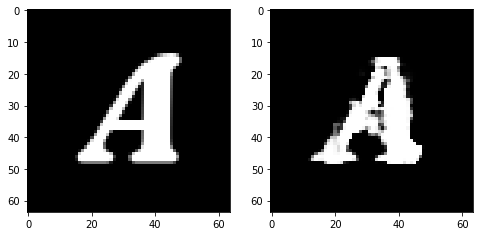

Epoch 53, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5039087384939194, Loss SSIM 1.9755216240882874, Loss Local 158.0860300064087


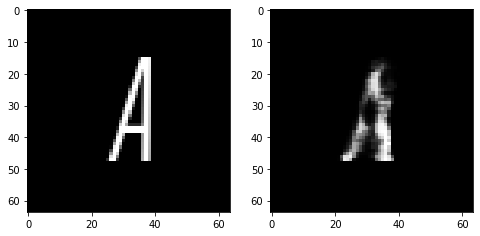

Epoch 53, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5947245433926582, Loss SSIM 2.118794798851013, Loss Local 176.00609827041626


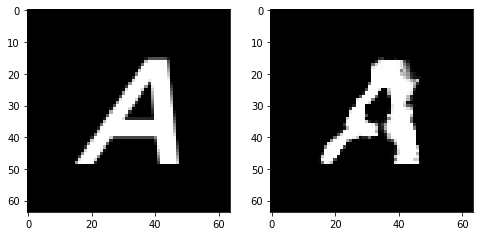

Epoch 54, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.521065466105938, Loss SSIM 1.9934182167053223, Loss Local 180.28164839744568


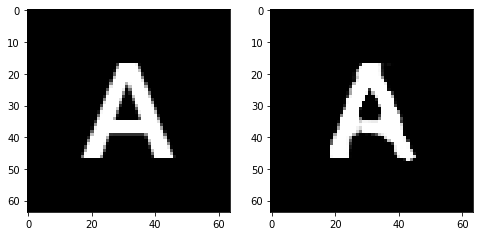

Epoch 54, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.58729712292552, Loss SSIM 2.0829859375953674, Loss Local 174.21677827835083


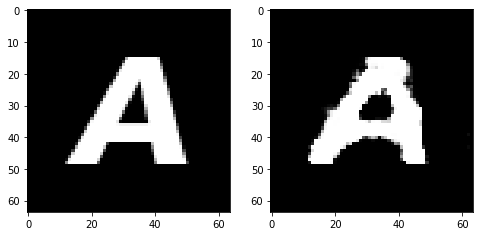

Epoch 54, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4994331821799278, Loss SSIM 1.9667975902557373, Loss Local 170.52435111999512


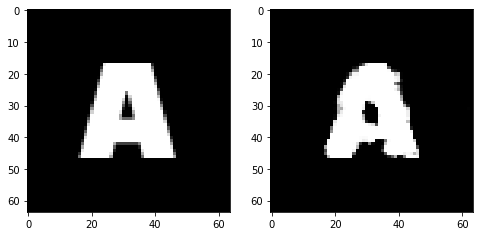

Epoch 54, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5951073877513409, Loss SSIM 2.0919204354286194, Loss Local 185.08833408355713


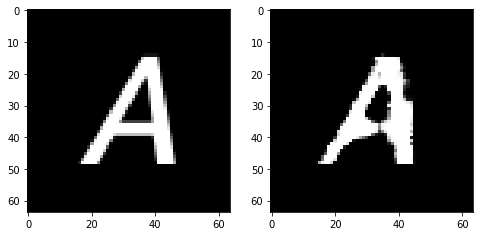

Epoch 54, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5618204809725285, Loss SSIM 2.0700060725212097, Loss Local 175.59154558181763


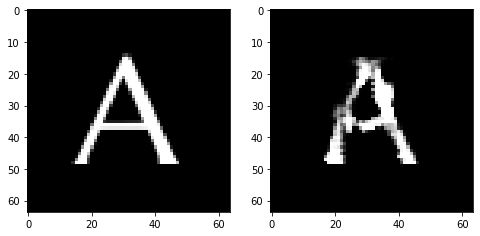

Epoch 54, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5750752240419388, Loss SSIM 2.0373865365982056, Loss Local 182.1328055858612


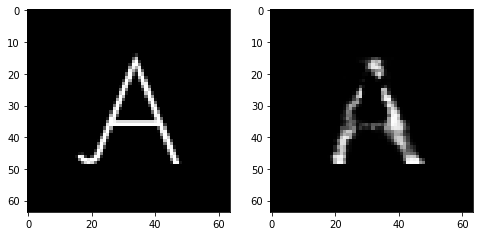

Epoch 54, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5619853921234608, Loss SSIM 2.0550405979156494, Loss Local 178.92804098129272


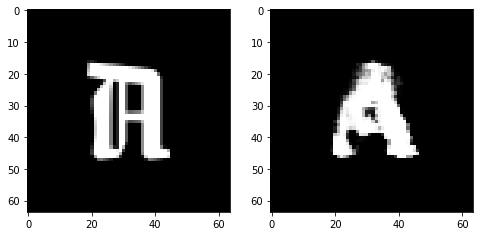

Epoch 55, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5432980097830296, Loss SSIM 1.996145248413086, Loss Local 181.7998423576355


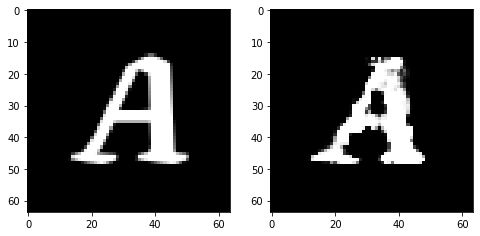

Epoch 55, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5618645809590816, Loss SSIM 2.021999776363373, Loss Local 174.12153673171997


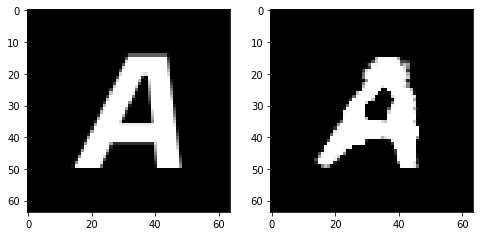

Epoch 55, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5865045823156834, Loss SSIM 2.1286721229553223, Loss Local 171.77633666992188


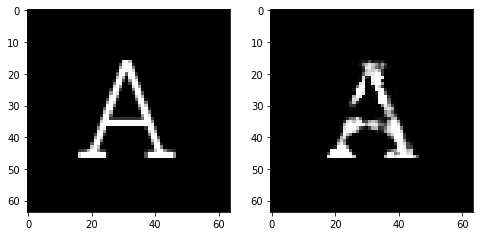

Epoch 55, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5720496848225594, Loss SSIM 2.0403777360916138, Loss Local 181.39837265014648


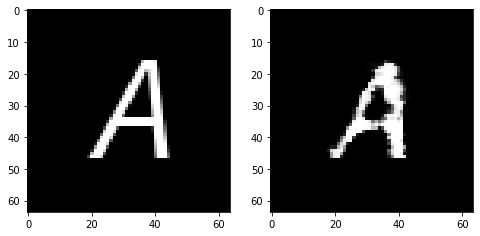

Epoch 55, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6198927536606789, Loss SSIM 2.125060737133026, Loss Local 168.44969987869263


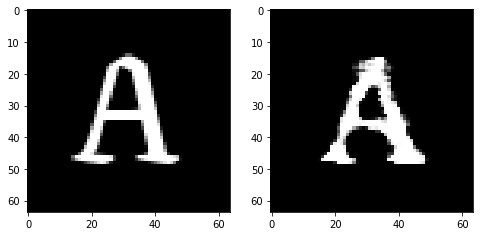

Epoch 55, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4988585412502289, Loss SSIM 1.9528971314430237, Loss Local 164.69338941574097


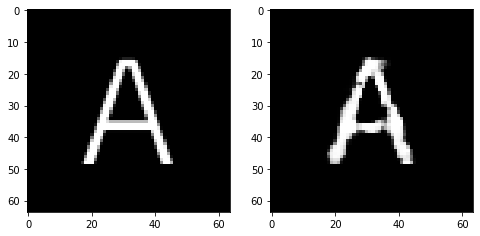

Epoch 55, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.542856302112341, Loss SSIM 2.0377959609031677, Loss Local 175.8292202949524


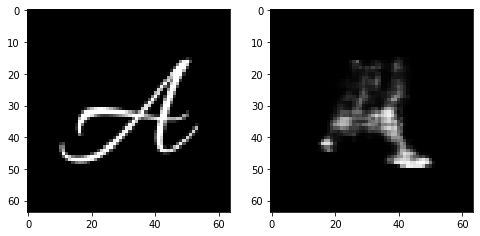

Epoch 56, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5181123912334442, Loss SSIM 1.9506421089172363, Loss Local 164.89464282989502


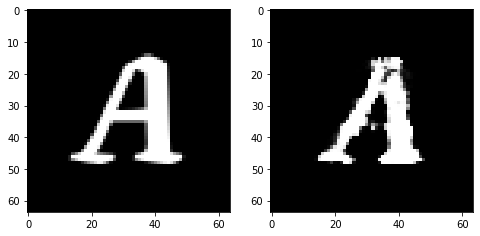

Epoch 56, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5737613812088966, Loss SSIM 2.073734760284424, Loss Local 167.73802137374878


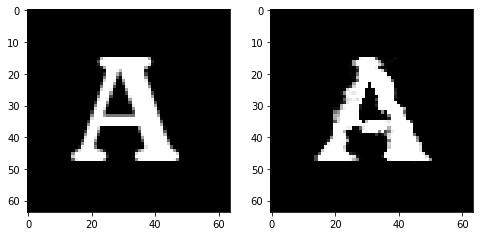

Epoch 56, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5860240198671818, Loss SSIM 2.134045362472534, Loss Local 185.0102415084839


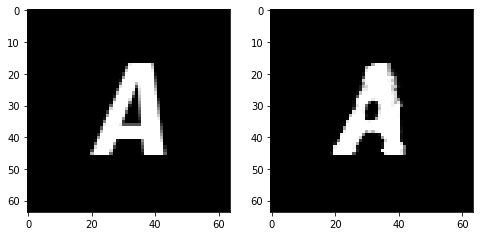

Epoch 56, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5677888318896294, Loss SSIM 2.027510106563568, Loss Local 177.84021282196045


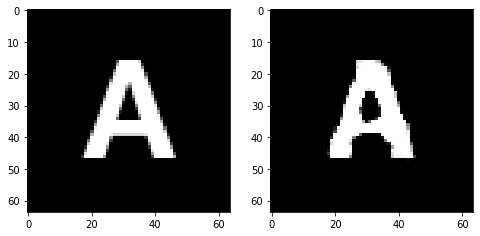

Epoch 56, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5959033071994781, Loss SSIM 2.125022232532501, Loss Local 181.41135263442993


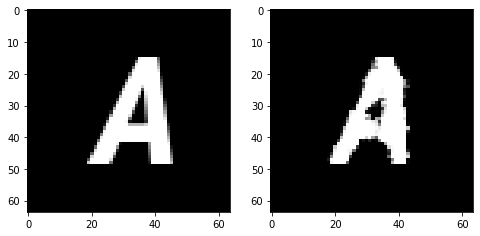

Epoch 56, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5482529439032078, Loss SSIM 2.008083164691925, Loss Local 167.97333145141602


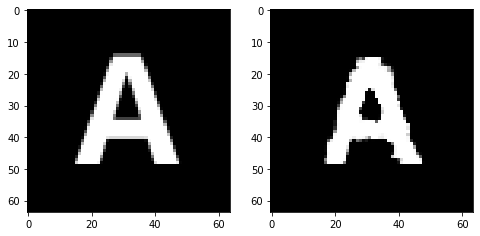

Epoch 56, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5396158061921597, Loss SSIM 2.0169610381126404, Loss Local 174.69805192947388


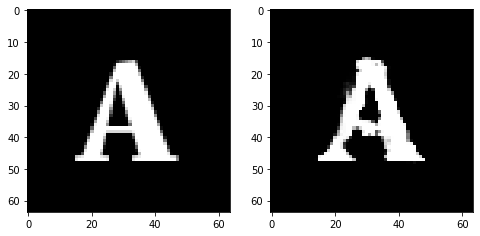

Epoch 57, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5399476327002048, Loss SSIM 2.002908766269684, Loss Local 176.81596517562866


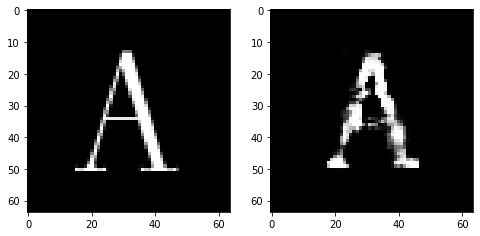

Epoch 57, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5423792637884617, Loss SSIM 2.0185664892196655, Loss Local 173.7227349281311


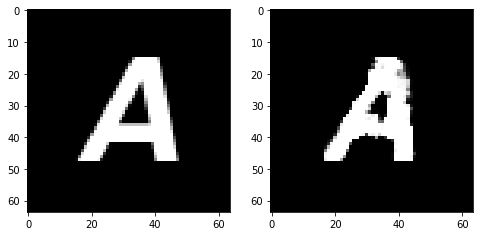

Epoch 57, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5714489109814167, Loss SSIM 2.0679972767829895, Loss Local 177.10434198379517


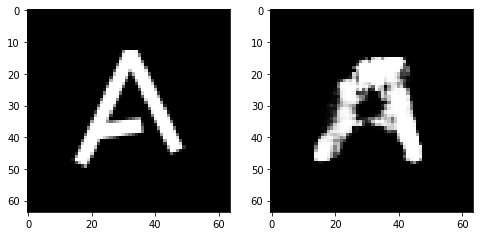

Epoch 57, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5901921428740025, Loss SSIM 2.1222804188728333, Loss Local 180.47189140319824


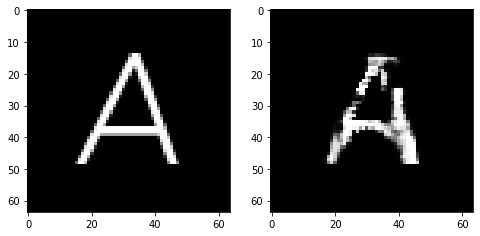

Epoch 57, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.522147223353386, Loss SSIM 1.9664682745933533, Loss Local 175.01888179779053


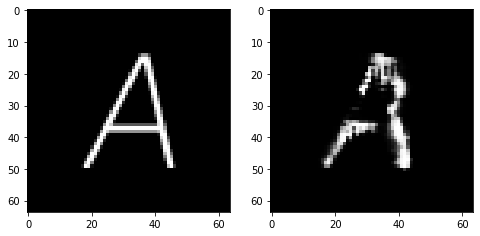

Epoch 57, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6443657726049423, Loss SSIM 2.1757671236991882, Loss Local 188.2135088443756


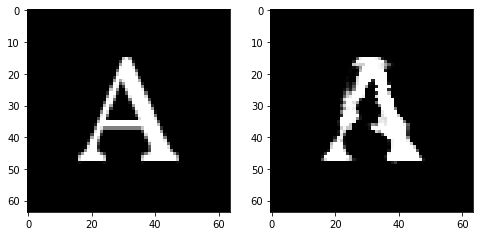

Epoch 57, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.561482921242714, Loss SSIM 2.05517715215683, Loss Local 172.03549242019653


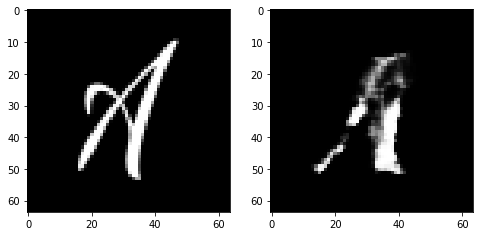

Epoch 58, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5685454607009888, Loss SSIM 2.065929114818573, Loss Local 177.19127702713013


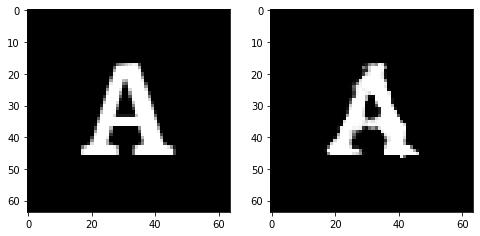

Epoch 58, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5762869380414486, Loss SSIM 2.070254325866699, Loss Local 165.7757830619812


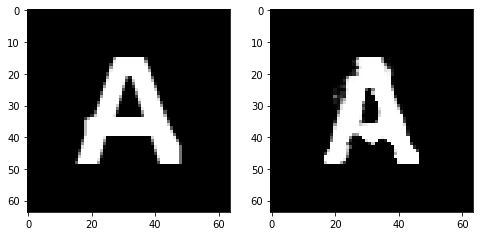

Epoch 58, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5355970486998558, Loss SSIM 2.017452299594879, Loss Local 182.49338102340698


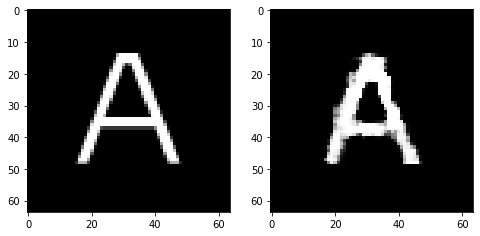

Epoch 58, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.564006831496954, Loss SSIM 2.0087748765945435, Loss Local 175.49903059005737


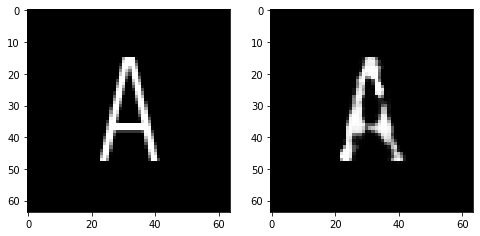

Epoch 58, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5549384094774723, Loss SSIM 2.03443443775177, Loss Local 172.60586261749268


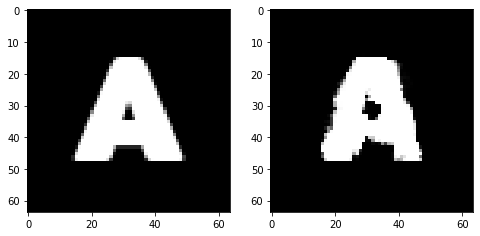

Epoch 58, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5769422985613346, Loss SSIM 2.056426465511322, Loss Local 179.57336616516113


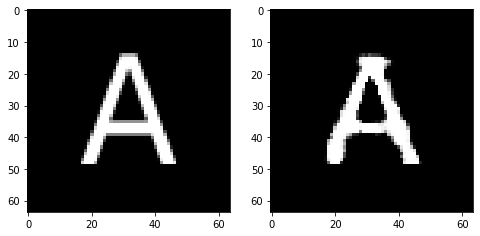

Epoch 58, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5366662368178368, Loss SSIM 2.033263862133026, Loss Local 180.68901824951172


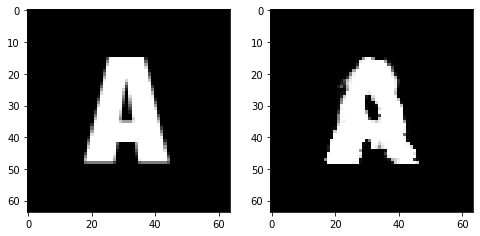

Epoch 59, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.54579171910882, Loss SSIM 2.0080443024635315, Loss Local 181.91480922698975


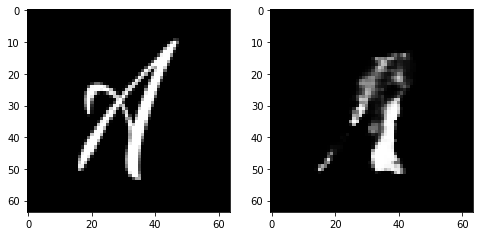

Epoch 59, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5678406208753586, Loss SSIM 2.0941616892814636, Loss Local 183.02793645858765


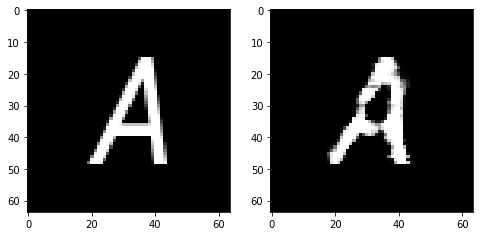

Epoch 59, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6039457432925701, Loss SSIM 2.09488981962204, Loss Local 183.9222378730774


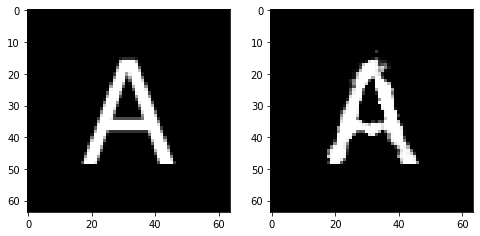

Epoch 59, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5523755140602589, Loss SSIM 2.0277950167655945, Loss Local 171.0807590484619


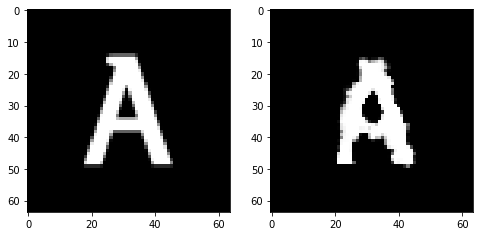

Epoch 59, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5163245424628258, Loss SSIM 1.9921869039535522, Loss Local 172.61431407928467


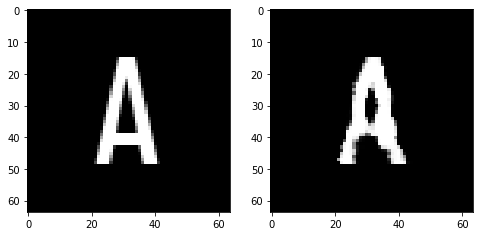

Epoch 59, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.556851927191019, Loss SSIM 2.0990331172943115, Loss Local 163.16282320022583


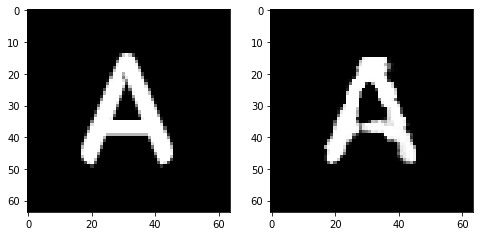

Epoch 59, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5590814389288425, Loss SSIM 1.9922839999198914, Loss Local 180.79271984100342


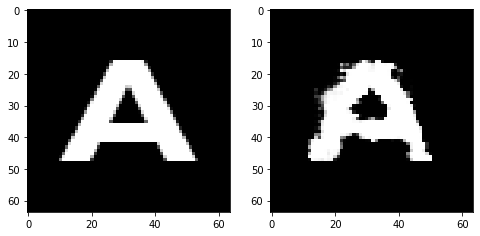

Epoch 60, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5835747867822647, Loss SSIM 2.0537708401679993, Loss Local 167.6454463005066


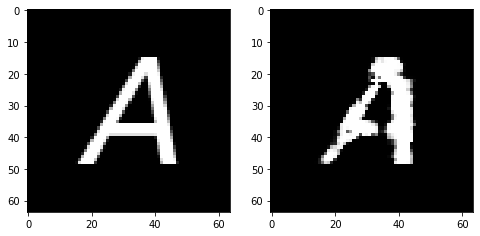

Epoch 60, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4829954653978348, Loss SSIM 1.9249125719070435, Loss Local 169.01051092147827


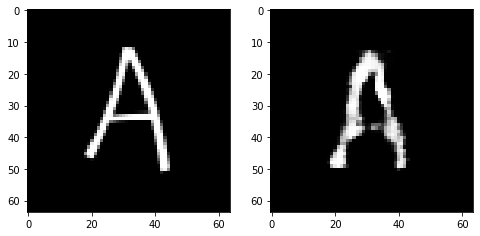

Epoch 60, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5691875517368317, Loss SSIM 2.0532325506210327, Loss Local 166.5347023010254


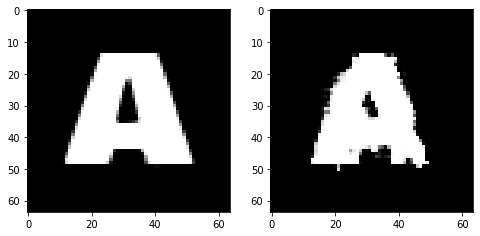

Epoch 60, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6164127327501774, Loss SSIM 2.124255418777466, Loss Local 181.7220058441162


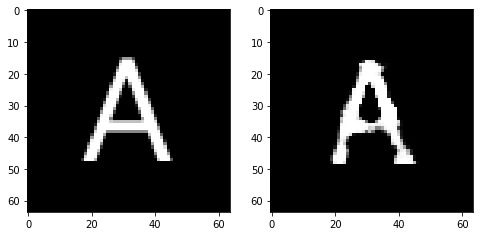

Epoch 60, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6251042783260345, Loss SSIM 2.1713135838508606, Loss Local 185.46881532669067


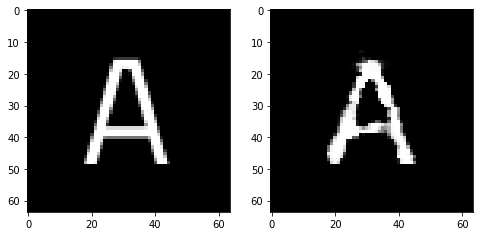

Epoch 60, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5335980765521526, Loss SSIM 2.0300684571266174, Loss Local 169.20407962799072


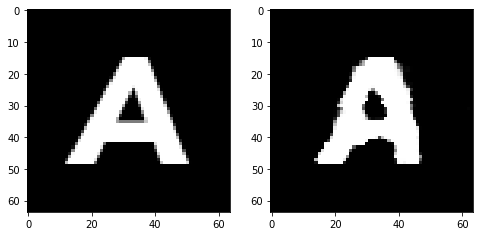

Epoch 60, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5042332112789154, Loss SSIM 1.9637420773506165, Loss Local 165.7970485687256


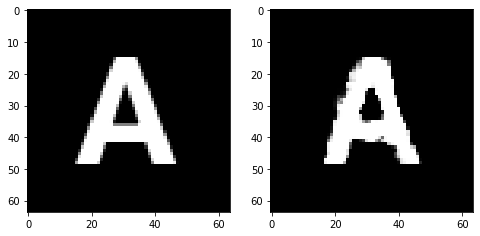

Epoch 61, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5711265541613102, Loss SSIM 2.0631550550460815, Loss Local 162.68681478500366


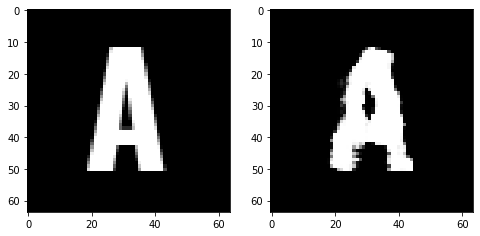

Epoch 61, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.568316537886858, Loss SSIM 2.055432379245758, Loss Local 187.4662046432495


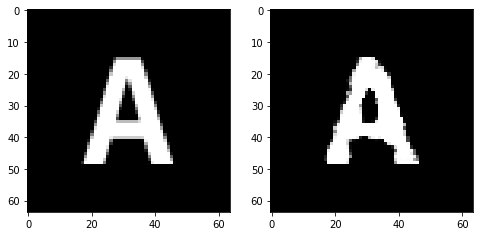

Epoch 61, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5475927889347076, Loss SSIM 1.975105106830597, Loss Local 177.88161993026733


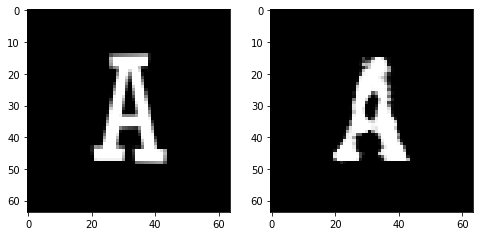

Epoch 61, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5273881144821644, Loss SSIM 2.019220232963562, Loss Local 168.73423767089844


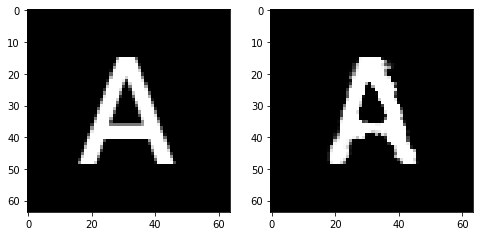

Epoch 61, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5121860168874264, Loss SSIM 1.973488211631775, Loss Local 170.62424755096436


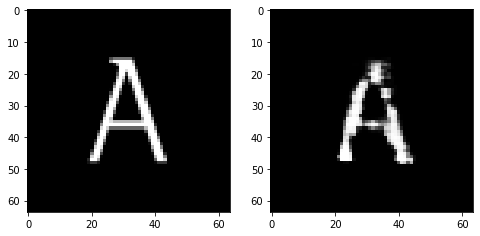

Epoch 61, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.589422795921564, Loss SSIM 2.1090665459632874, Loss Local 178.94610357284546


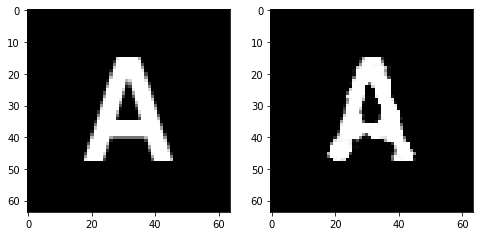

Epoch 61, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5914755798876286, Loss SSIM 2.1088072061538696, Loss Local 175.12872076034546


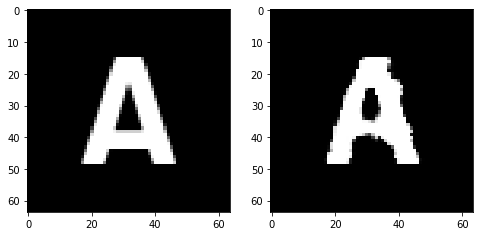

Epoch 62, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.549676138907671, Loss SSIM 2.009648323059082, Loss Local 172.72596645355225


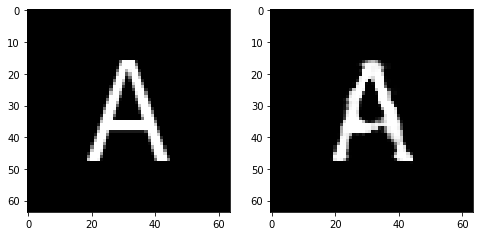

Epoch 62, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5233845002949238, Loss SSIM 2.0199599862098694, Loss Local 171.42019987106323


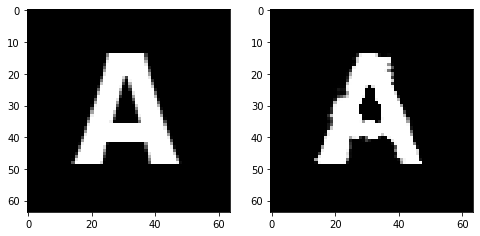

Epoch 62, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5674575306475163, Loss SSIM 2.0117385387420654, Loss Local 177.02996444702148


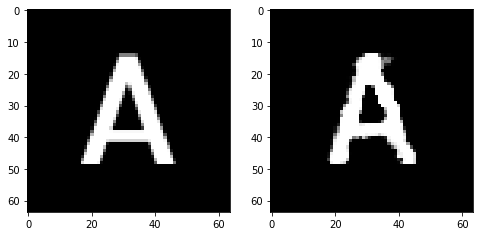

Epoch 62, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5782665014266968, Loss SSIM 2.0865286588668823, Loss Local 183.6080183982849


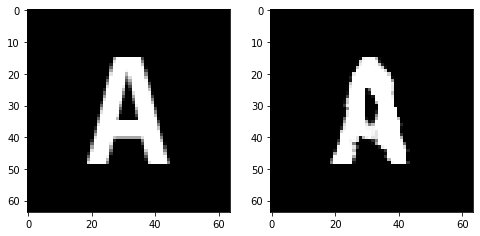

Epoch 62, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5615606531500816, Loss SSIM 2.037970244884491, Loss Local 164.53637742996216


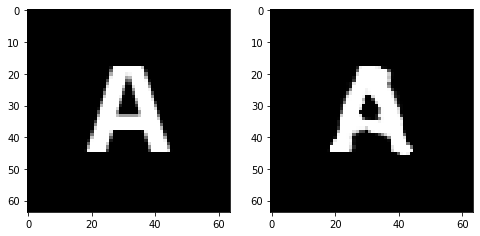

Epoch 62, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.541563507169485, Loss SSIM 2.023958921432495, Loss Local 170.99675035476685


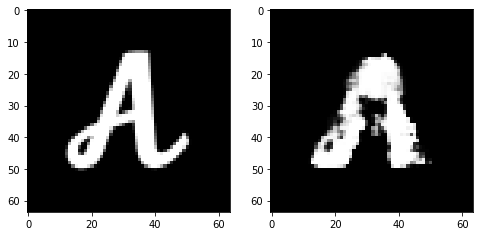

Epoch 62, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5574088655412197, Loss SSIM 2.0339618921279907, Loss Local 173.96231126785278


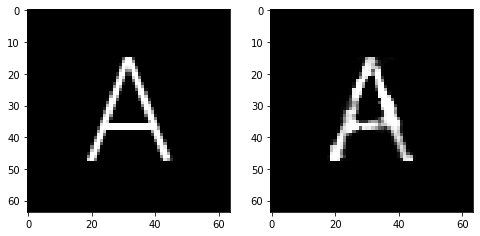

Epoch 63, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5865598320960999, Loss SSIM 2.077562153339386, Loss Local 181.41577529907227


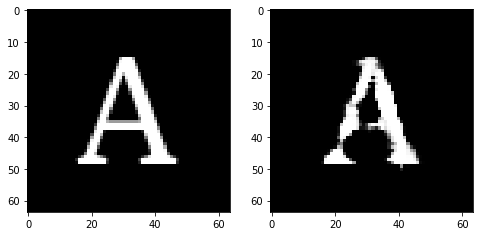

Epoch 63, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5356236174702644, Loss SSIM 2.0298415422439575, Loss Local 178.8603162765503


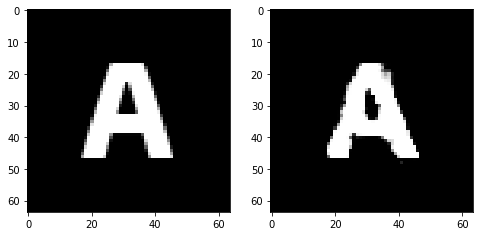

Epoch 63, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5455605164170265, Loss SSIM 2.0535447001457214, Loss Local 171.63992357254028


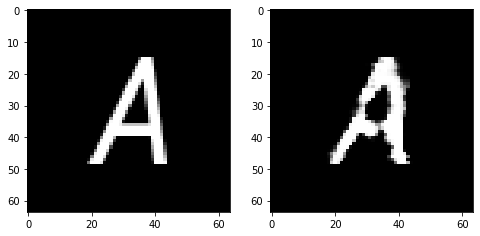

Epoch 63, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5854025818407536, Loss SSIM 2.082015097141266, Loss Local 172.60597705841064


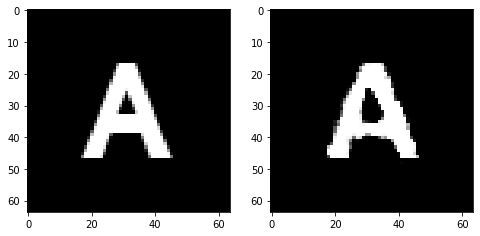

Epoch 63, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4967357516288757, Loss SSIM 1.9063201546669006, Loss Local 171.44846439361572


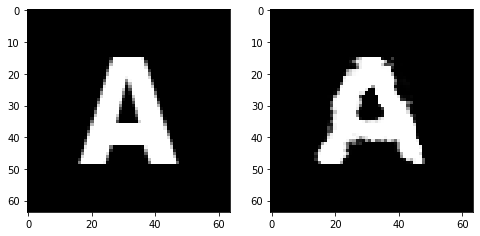

Epoch 63, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.573951430618763, Loss SSIM 2.1173203587532043, Loss Local 181.01084089279175


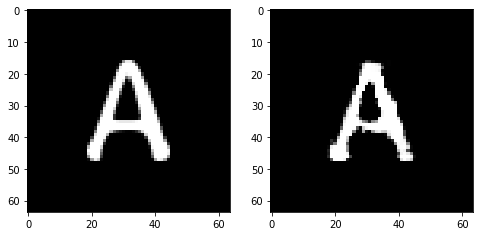

Epoch 63, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5743540413677692, Loss SSIM 1.9947111010551453, Loss Local 179.92734670639038


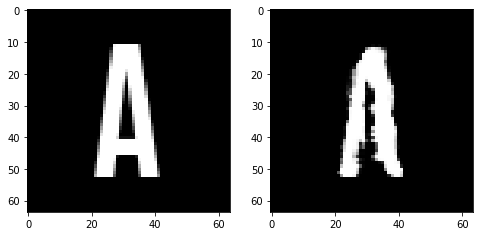

Epoch 64, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5229520834982395, Loss SSIM 2.001220166683197, Loss Local 172.29737997055054


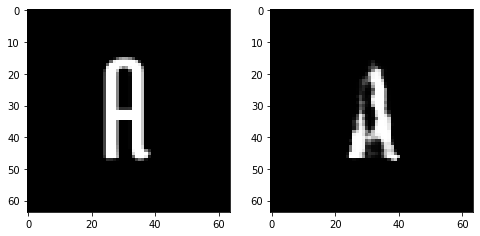

Epoch 64, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.551669642329216, Loss SSIM 2.03363573551178, Loss Local 169.36837244033813


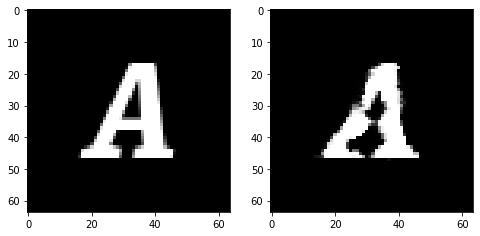

Epoch 64, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5368604250252247, Loss SSIM 1.9762744903564453, Loss Local 173.93412017822266


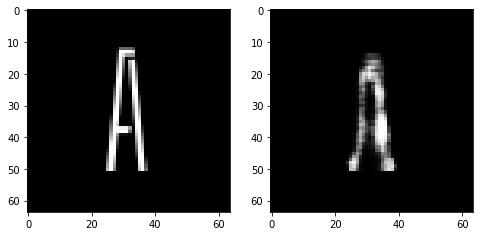

Epoch 64, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6001454144716263, Loss SSIM 2.084068715572357, Loss Local 181.27507162094116


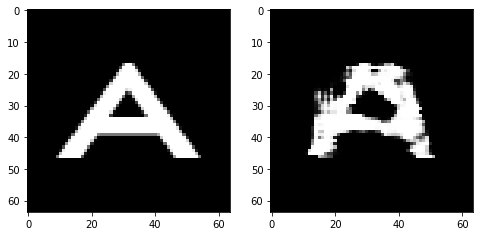

Epoch 64, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.586851079016924, Loss SSIM 2.0671761631965637, Loss Local 183.1878638267517


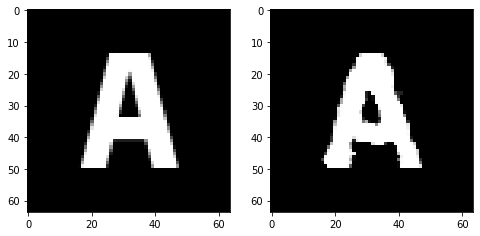

Epoch 64, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5561801306903362, Loss SSIM 2.0398897528648376, Loss Local 182.39893436431885


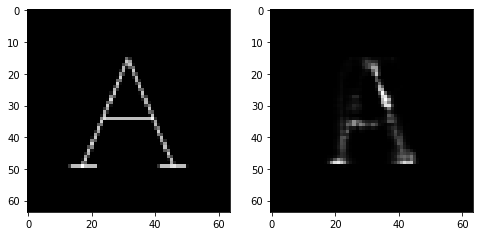

Epoch 64, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5534510351717472, Loss SSIM 2.0791578888893127, Loss Local 179.9351110458374


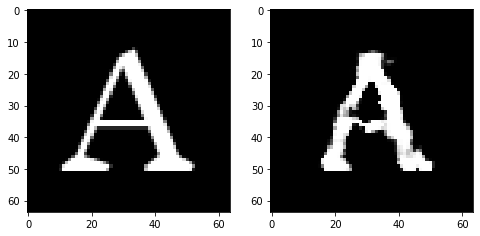

Epoch 65, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5482959486544132, Loss SSIM 2.0531681776046753, Loss Local 182.27150535583496


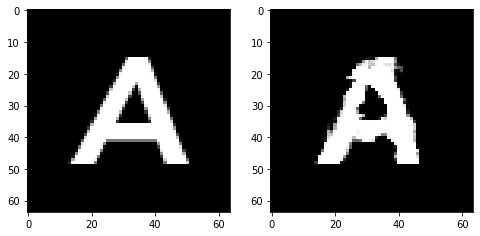

Epoch 65, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5507126189768314, Loss SSIM 2.0185920000076294, Loss Local 174.49755191802979


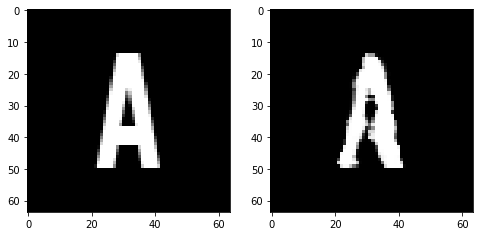

Epoch 65, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.520869217813015, Loss SSIM 2.003922760486603, Loss Local 171.0367169380188


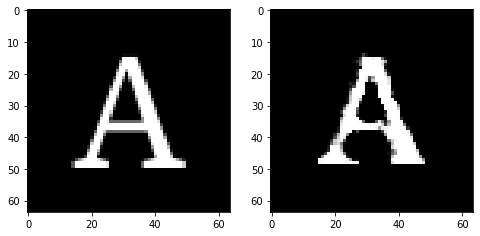

Epoch 65, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.523801013827324, Loss SSIM 1.9602025747299194, Loss Local 165.501455783844


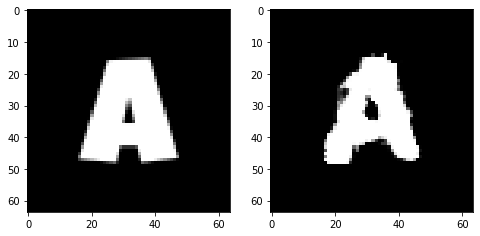

Epoch 65, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5570803433656693, Loss SSIM 2.0289583802223206, Loss Local 174.70383310317993


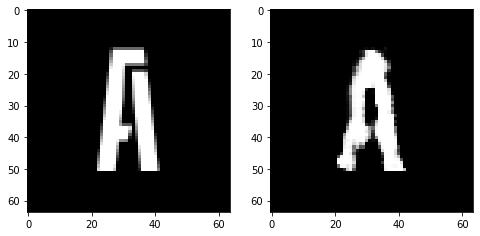

Epoch 65, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5948507562279701, Loss SSIM 2.106812357902527, Loss Local 178.12350940704346


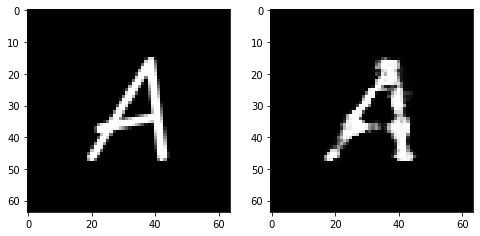

Epoch 65, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5958446338772774, Loss SSIM 2.1197776198387146, Loss Local 178.61981630325317


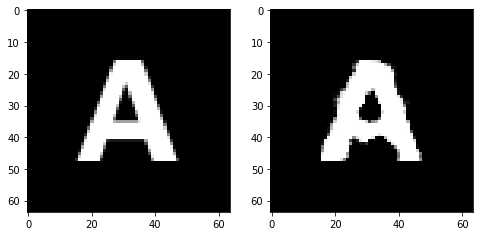

Epoch 66, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5238535962998867, Loss SSIM 2.00054270029068, Loss Local 172.04935359954834


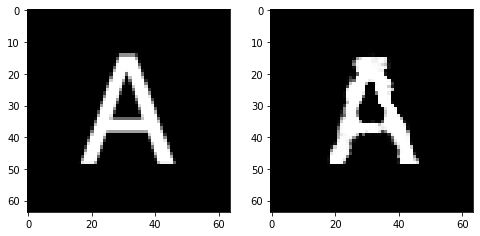

Epoch 66, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5426490642130375, Loss SSIM 2.026783287525177, Loss Local 181.43045806884766


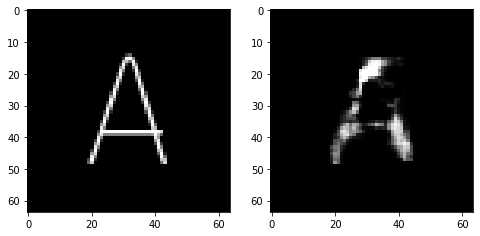

Epoch 66, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4938342869281769, Loss SSIM 1.9739322662353516, Loss Local 168.9867663383484


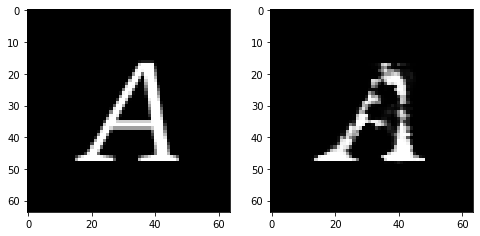

Epoch 66, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5708868317306042, Loss SSIM 2.0486140847206116, Loss Local 173.9669156074524


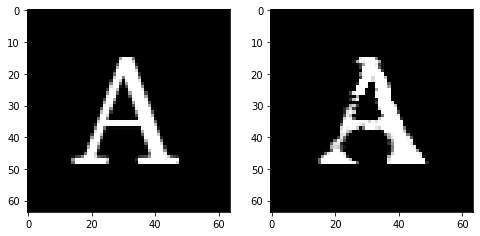

Epoch 66, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6076058000326157, Loss SSIM 2.0758966207504272, Loss Local 180.2118501663208


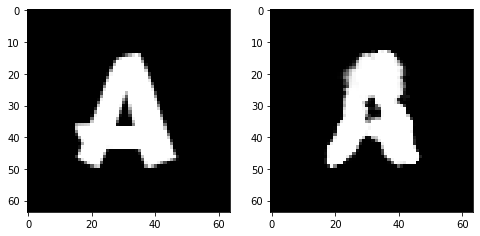

Epoch 66, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5479396842420101, Loss SSIM 2.016421616077423, Loss Local 173.2767744064331


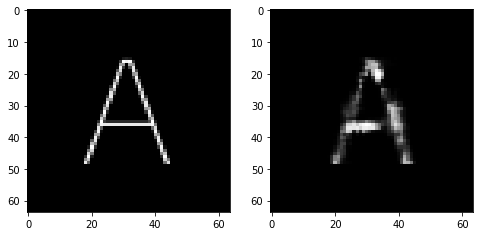

Epoch 66, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5887262746691704, Loss SSIM 2.1119953393936157, Loss Local 177.48387241363525


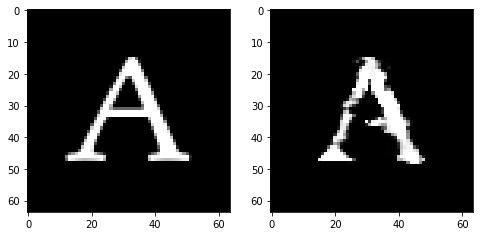

Epoch 67, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6123389787971973, Loss SSIM 2.1552613973617554, Loss Local 179.96451044082642


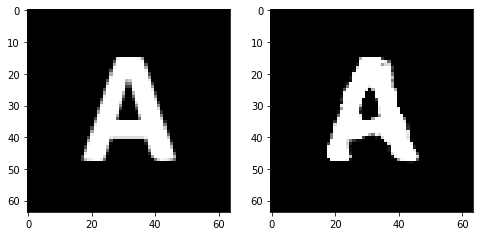

Epoch 67, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.587038416415453, Loss SSIM 2.078399360179901, Loss Local 178.64444875717163


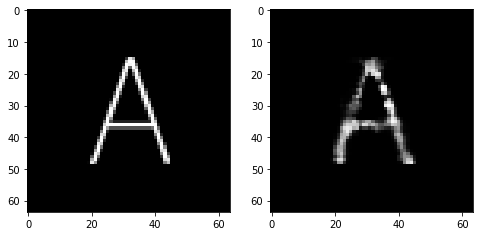

Epoch 67, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5567197874188423, Loss SSIM 2.0265884399414062, Loss Local 174.44002151489258


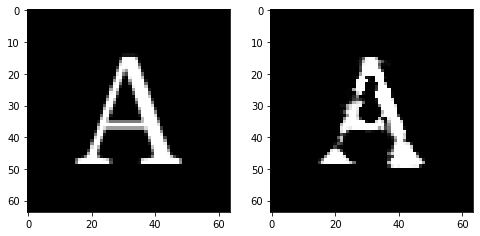

Epoch 67, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4888189248740673, Loss SSIM 1.9384999871253967, Loss Local 174.0230393409729


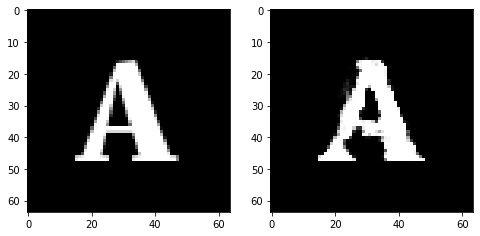

Epoch 67, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5437898226082325, Loss SSIM 2.0551502108573914, Loss Local 172.3893313407898


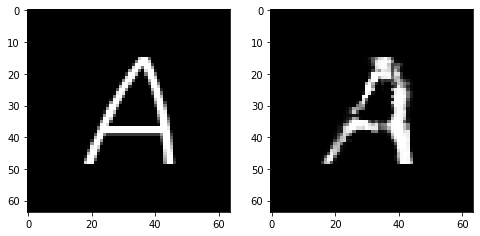

Epoch 67, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5642081424593925, Loss SSIM 2.073186933994293, Loss Local 181.22756719589233


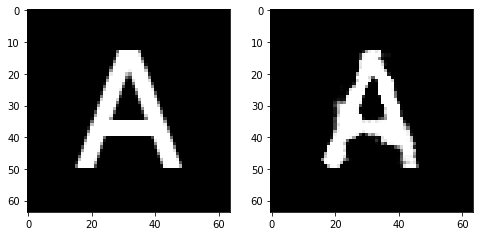

Epoch 67, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5370584279298782, Loss SSIM 1.9722938537597656, Loss Local 172.10748863220215


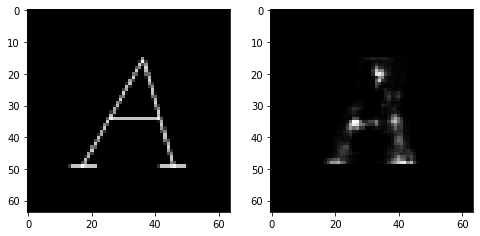

Epoch 68, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5987077541649342, Loss SSIM 2.125525414943695, Loss Local 169.6978645324707


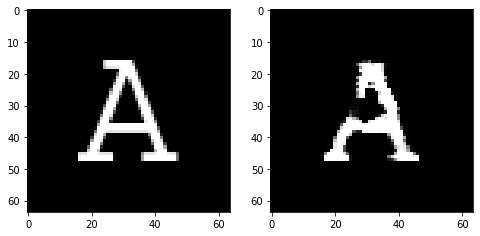

Epoch 68, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5771165825426579, Loss SSIM 2.054155468940735, Loss Local 168.67103815078735


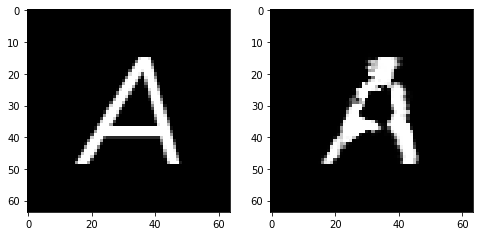

Epoch 68, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5984139144420624, Loss SSIM 2.1063091158866882, Loss Local 183.42382907867432


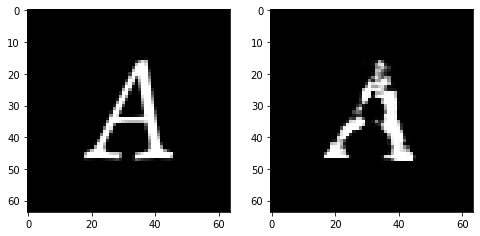

Epoch 68, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5054524466395378, Loss SSIM 1.9370693564414978, Loss Local 174.1507215499878


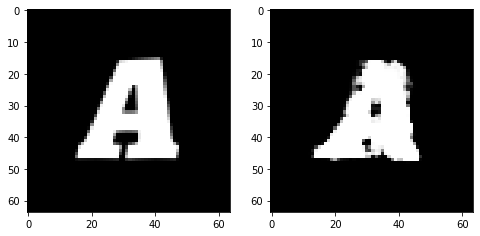

Epoch 68, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5734150595963001, Loss SSIM 2.0699073672294617, Loss Local 179.75410270690918


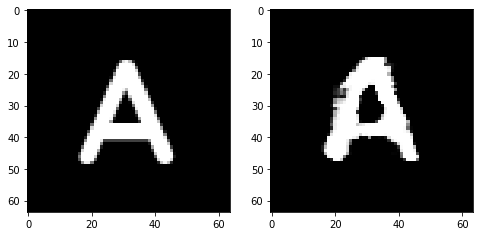

Epoch 68, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5403800792992115, Loss SSIM 2.026252806186676, Loss Local 166.34238576889038


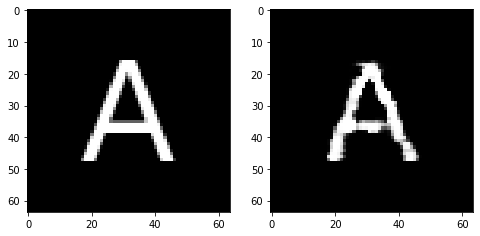

Epoch 68, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.546802580356598, Loss SSIM 2.0262218713760376, Loss Local 175.5383906364441


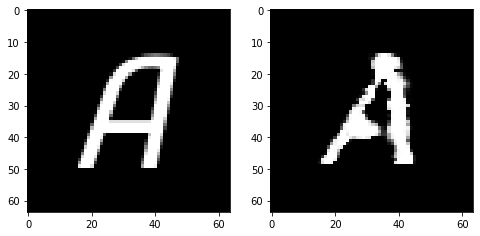

Epoch 69, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5512884631752968, Loss SSIM 2.002511501312256, Loss Local 171.01473093032837


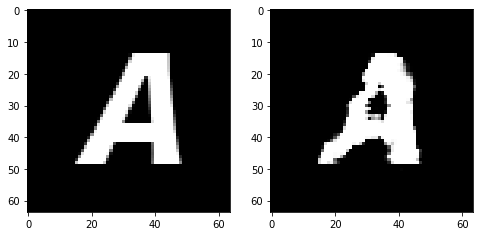

Epoch 69, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5926372110843658, Loss SSIM 2.0653743147850037, Loss Local 177.69630813598633


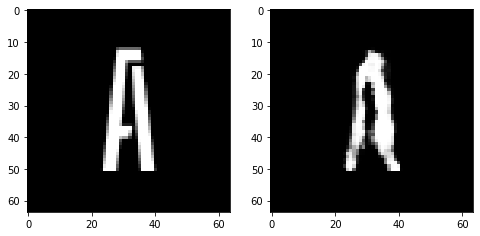

Epoch 69, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5861367359757423, Loss SSIM 2.0800517201423645, Loss Local 184.09259223937988


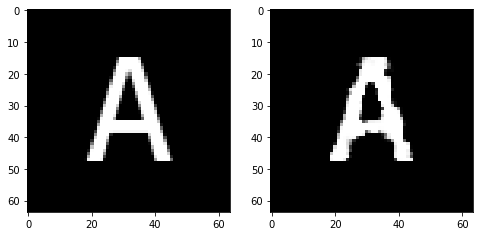

Epoch 69, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4945973493158817, Loss SSIM 1.958746075630188, Loss Local 170.08220863342285


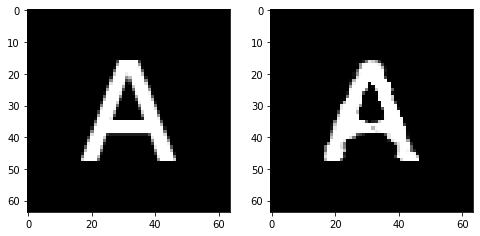

Epoch 69, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6061796471476555, Loss SSIM 2.1000202894210815, Loss Local 185.5793685913086


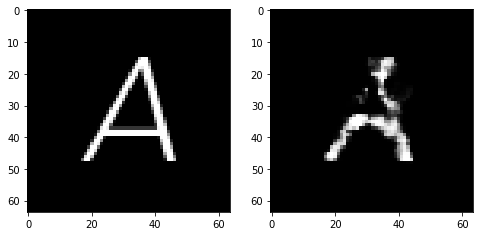

Epoch 69, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5274582616984844, Loss SSIM 2.0598305463790894, Loss Local 167.70431113243103


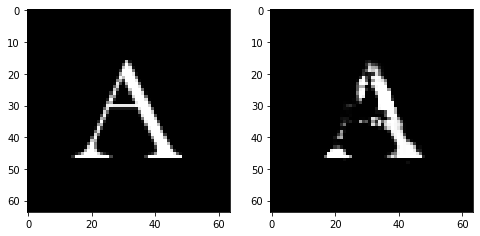

Epoch 69, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5524263866245747, Loss SSIM 2.0202212929725647, Loss Local 174.05947399139404


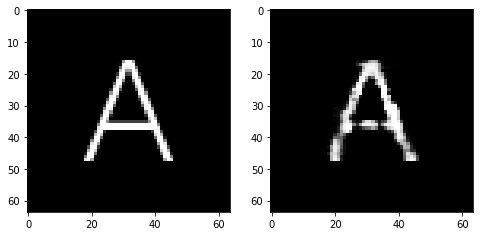

Epoch 70, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5916950516402721, Loss SSIM 2.144876718521118, Loss Local 181.40129947662354


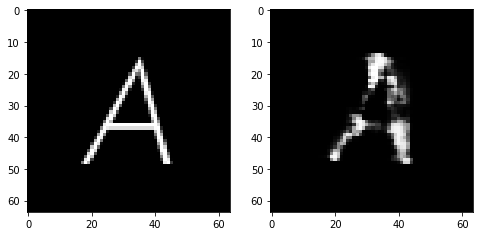

Epoch 70, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5388335548341274, Loss SSIM 1.9937573075294495, Loss Local 168.8696208000183


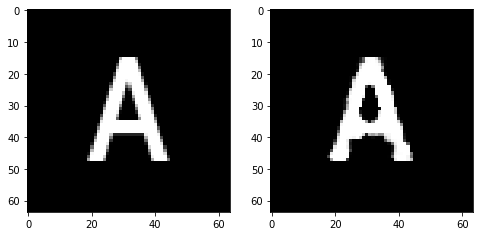

Epoch 70, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5261454284191132, Loss SSIM 1.960047960281372, Loss Local 181.79146575927734


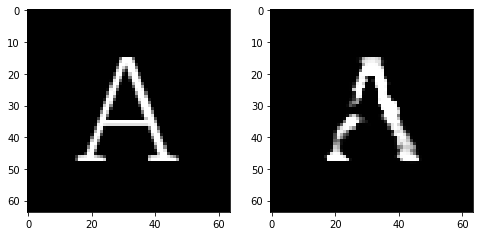

Epoch 70, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5374689921736717, Loss SSIM 2.023309350013733, Loss Local 169.32859802246094


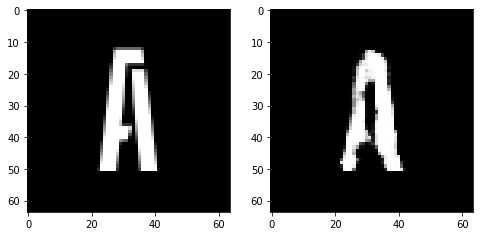

Epoch 70, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5980580933392048, Loss SSIM 2.065648138523102, Loss Local 176.74471807479858


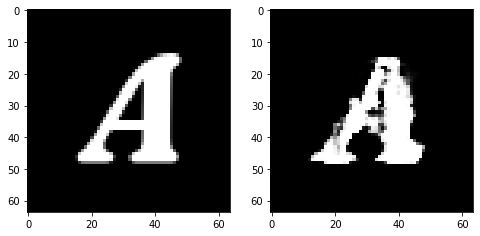

Epoch 70, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.579058200120926, Loss SSIM 2.0836936235427856, Loss Local 174.549569606781


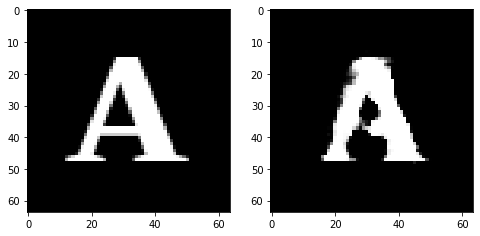

Epoch 70, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5328814797103405, Loss SSIM 2.0075199007987976, Loss Local 168.65447759628296


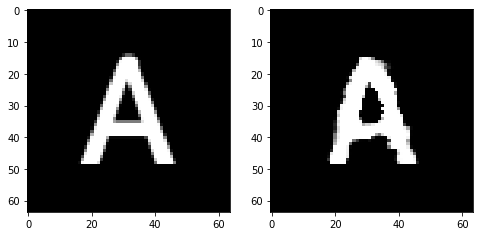

Epoch 71, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5518889240920544, Loss SSIM 2.062128961086273, Loss Local 172.47022247314453


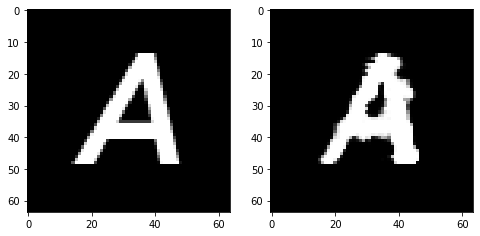

Epoch 71, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.523399893194437, Loss SSIM 1.9887115955352783, Loss Local 172.8381896018982


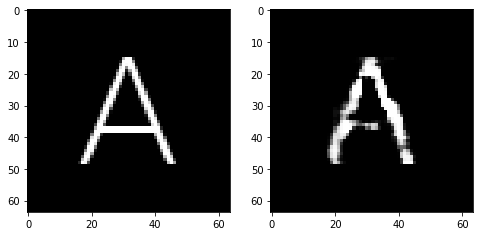

Epoch 71, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5230983421206474, Loss SSIM 1.9108406901359558, Loss Local 169.41767692565918


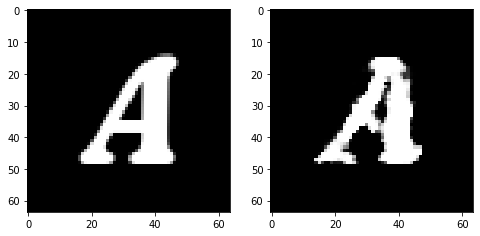

Epoch 71, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5748309455811977, Loss SSIM 2.0402477383613586, Loss Local 180.31826829910278


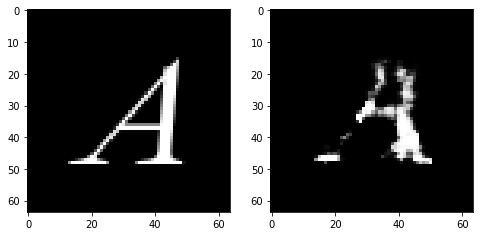

Epoch 71, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5719145089387894, Loss SSIM 2.122939646244049, Loss Local 172.43521165847778


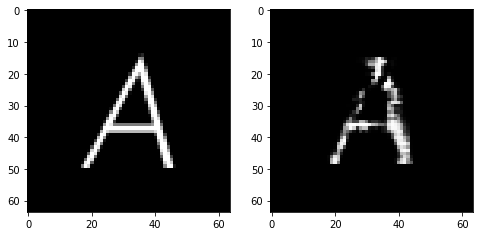

Epoch 71, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.559703540056944, Loss SSIM 2.0505993962287903, Loss Local 183.447820186615


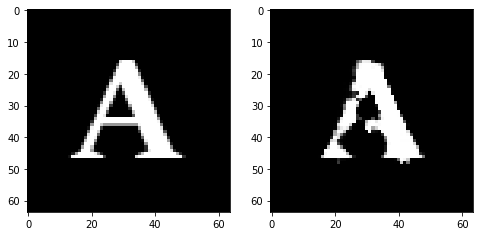

Epoch 71, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5841999687254429, Loss SSIM 2.080932855606079, Loss Local 174.87628817558289


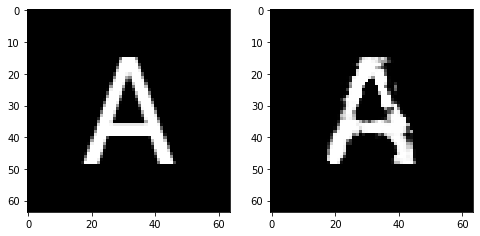

Epoch 72, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5002266392111778, Loss SSIM 1.9783242344856262, Loss Local 175.71670246124268


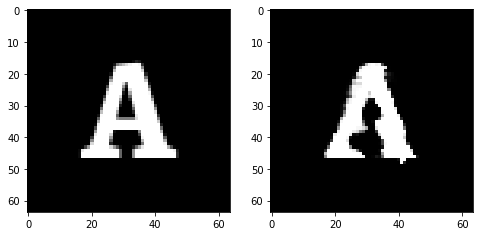

Epoch 72, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.54308645054698, Loss SSIM 1.9966872930526733, Loss Local 175.91507005691528


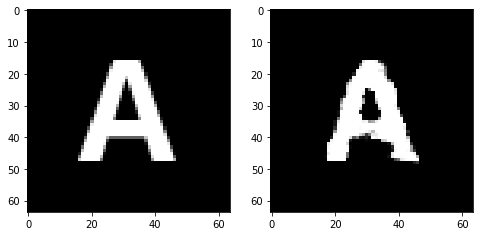

Epoch 72, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5626670010387897, Loss SSIM 2.0500605702400208, Loss Local 171.90912628173828


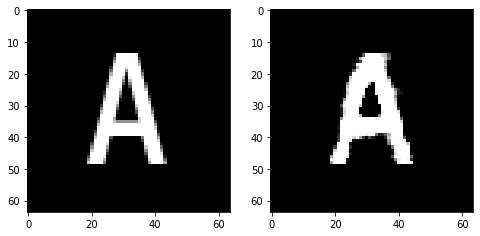

Epoch 72, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5253581441938877, Loss SSIM 1.95644211769104, Loss Local 163.61194801330566


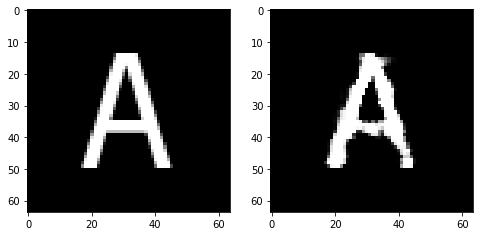

Epoch 72, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5587983690202236, Loss SSIM 2.057506740093231, Loss Local 175.0245499610901


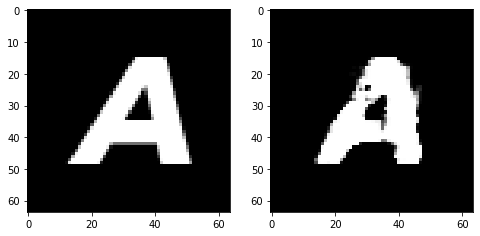

Epoch 72, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6238298155367374, Loss SSIM 2.1115850806236267, Loss Local 182.41936826705933


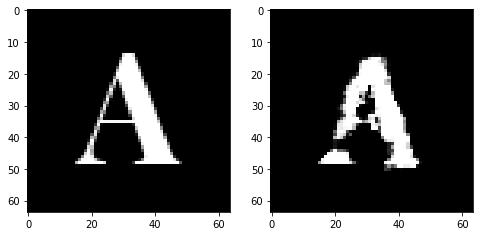

Epoch 72, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.561655979603529, Loss SSIM 2.0825374722480774, Loss Local 179.86098670959473


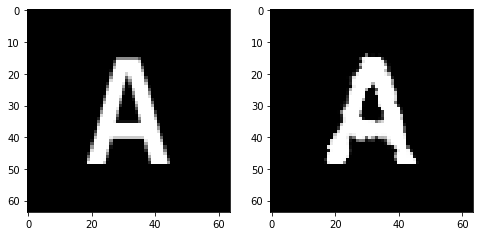

Epoch 73, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5512686558067799, Loss SSIM 2.0114749670028687, Loss Local 175.36768913269043


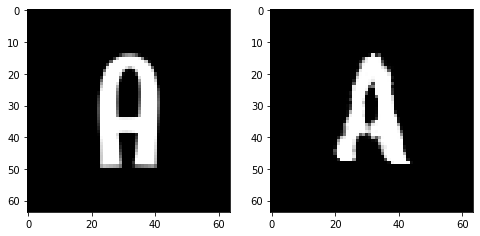

Epoch 73, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.573189277201891, Loss SSIM 2.0851666927337646, Loss Local 176.7933428287506


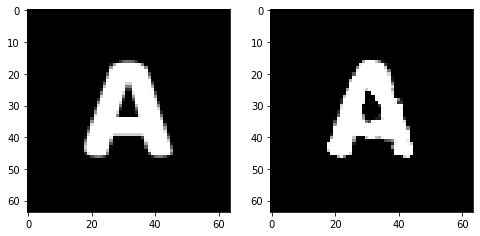

Epoch 73, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5789072066545486, Loss SSIM 2.112527370452881, Loss Local 185.26885509490967


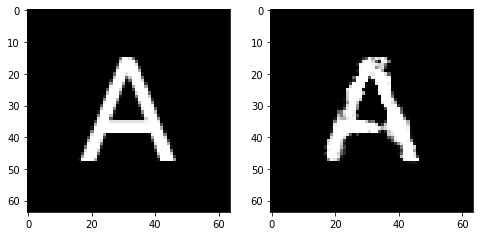

Epoch 73, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5912581905722618, Loss SSIM 2.0966265201568604, Loss Local 177.78815460205078


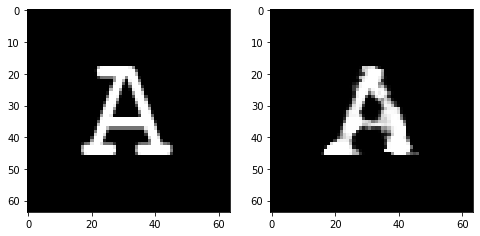

Epoch 73, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.483962133526802, Loss SSIM 1.9285520911216736, Loss Local 164.01628923416138


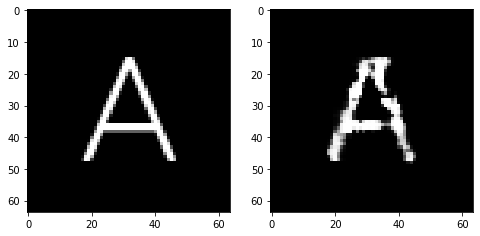

Epoch 73, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5395354814827442, Loss SSIM 1.9985718727111816, Loss Local 178.96867084503174


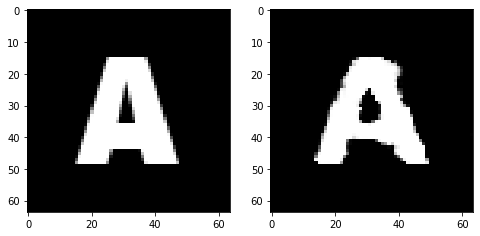

Epoch 73, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5735932141542435, Loss SSIM 2.0272491574287415, Loss Local 171.54899072647095


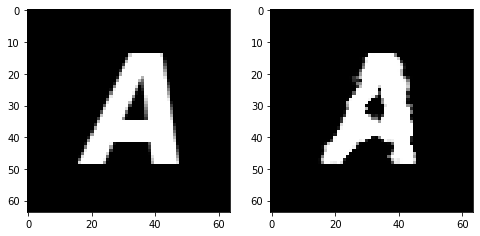

Epoch 74, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5147268548607826, Loss SSIM 2.052938401699066, Loss Local 176.65490102767944


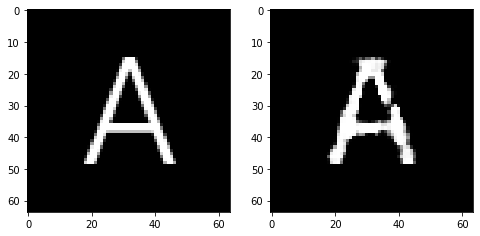

Epoch 74, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5642984956502914, Loss SSIM 2.0166237354278564, Loss Local 173.3457818031311


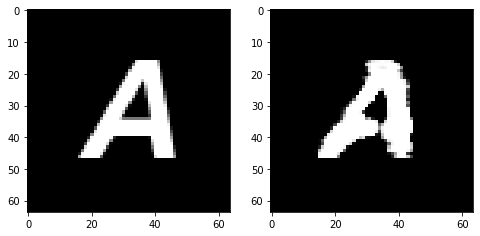

Epoch 74, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5708859264850616, Loss SSIM 2.0398995876312256, Loss Local 183.90497493743896


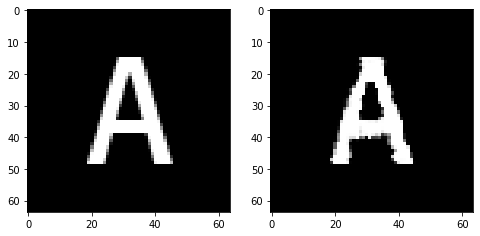

Epoch 74, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5698911547660828, Loss SSIM 2.0703288316726685, Loss Local 161.97860193252563


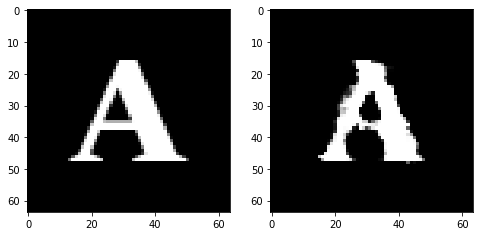

Epoch 74, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6326211728155613, Loss SSIM 2.1663734316825867, Loss Local 183.35004043579102


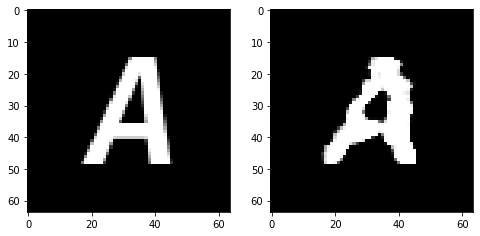

Epoch 74, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5121830143034458, Loss SSIM 1.9382289052009583, Loss Local 163.0888171195984


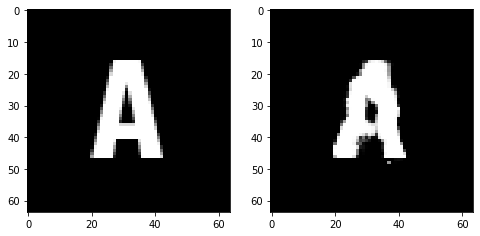

Epoch 74, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.581787083297968, Loss SSIM 2.1008037328720093, Loss Local 180.5424942970276


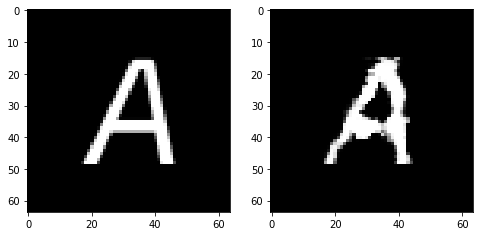

Epoch 75, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5331425294280052, Loss SSIM 2.0010988116264343, Loss Local 176.34522438049316


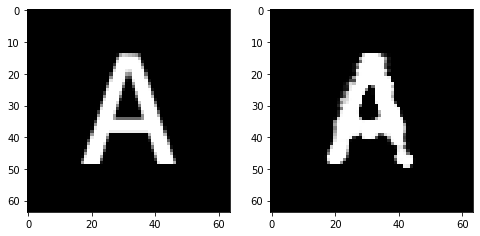

Epoch 75, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5206365659832954, Loss SSIM 1.957012414932251, Loss Local 169.10236501693726


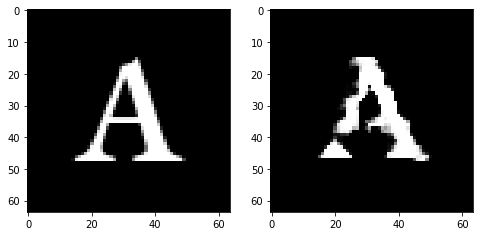

Epoch 75, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5655074529349804, Loss SSIM 2.0808424949645996, Loss Local 167.68124747276306


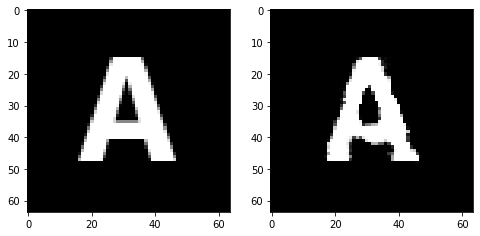

Epoch 75, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5745287910103798, Loss SSIM 2.0817095041275024, Loss Local 175.97310495376587


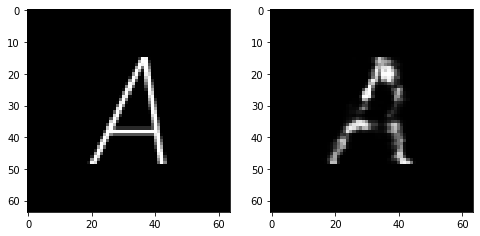

Epoch 75, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5839955396950245, Loss SSIM 2.1034169793128967, Loss Local 177.93332815170288


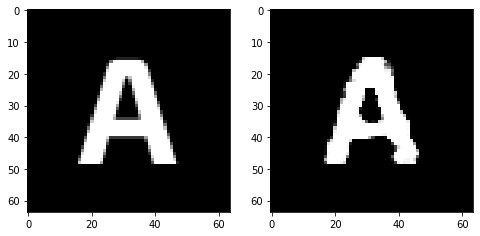

Epoch 75, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.515224926173687, Loss SSIM 1.9904927611351013, Loss Local 176.67609119415283


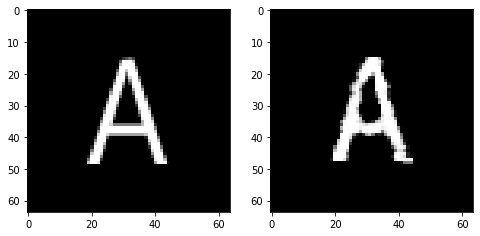

Epoch 75, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5901153609156609, Loss SSIM 2.0751150846481323, Loss Local 178.20697259902954


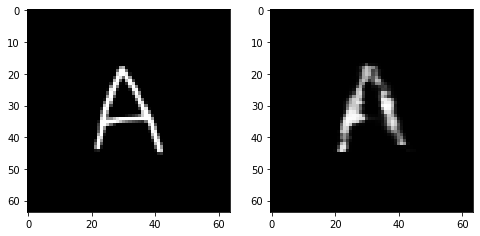

Epoch 76, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5950548946857452, Loss SSIM 2.1038674116134644, Loss Local 185.29489040374756


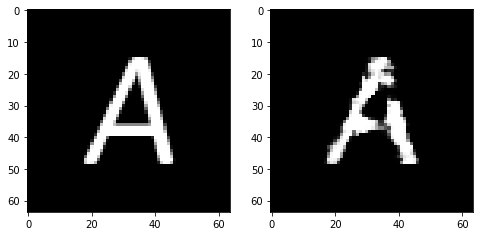

Epoch 76, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5372945182025433, Loss SSIM 1.982302725315094, Loss Local 173.56265115737915


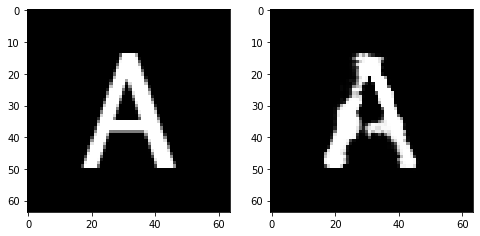

Epoch 76, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5953820012509823, Loss SSIM 2.1223387122154236, Loss Local 178.93804264068604


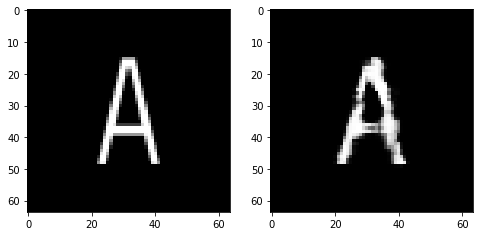

Epoch 76, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5637262277305126, Loss SSIM 2.0504941940307617, Loss Local 183.1404252052307


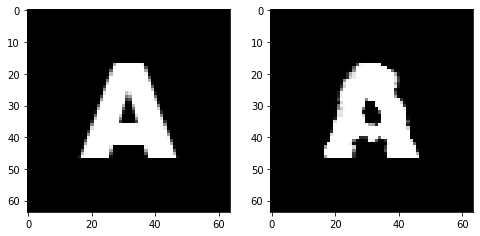

Epoch 76, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5402708277106285, Loss SSIM 2.039023697376251, Loss Local 179.12073373794556


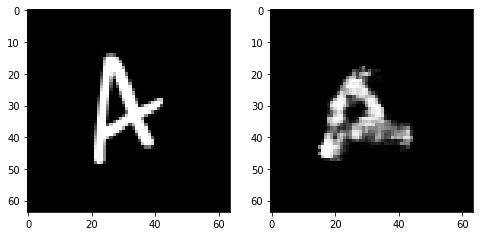

Epoch 76, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.596727680414915, Loss SSIM 2.091159403324127, Loss Local 182.29825735092163


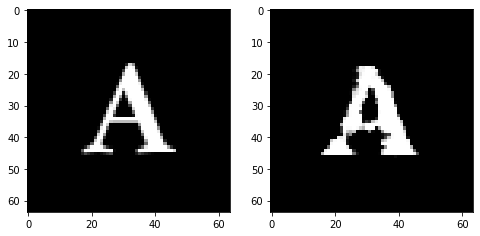

Epoch 76, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.496207281947136, Loss SSIM 1.9380095601081848, Loss Local 173.3270344734192


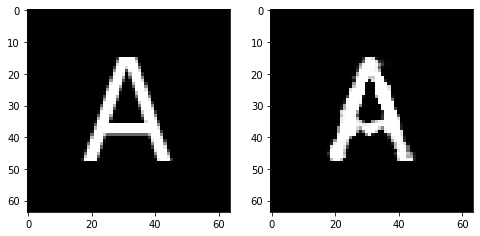

Epoch 77, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5420884601771832, Loss SSIM 1.9954655766487122, Loss Local 165.9892544746399


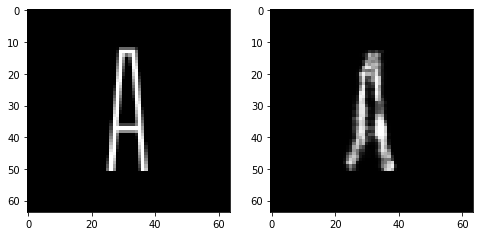

Epoch 77, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5527827739715576, Loss SSIM 2.0224609375, Loss Local 166.23642778396606


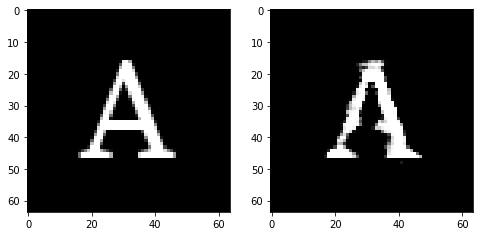

Epoch 77, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5625234469771385, Loss SSIM 2.046169698238373, Loss Local 169.52894639968872


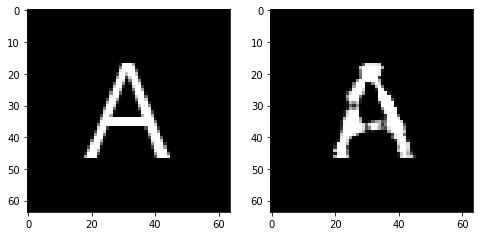

Epoch 77, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5478993989527225, Loss SSIM 2.057818591594696, Loss Local 174.47169065475464


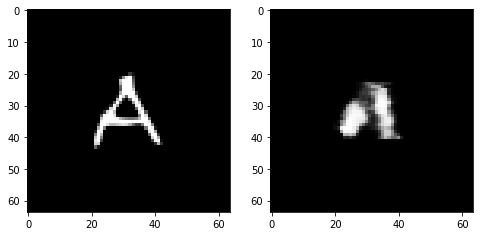

Epoch 77, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.585222415626049, Loss SSIM 2.0810644030570984, Loss Local 183.511785030365


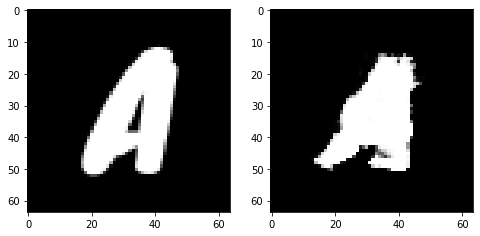

Epoch 77, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5779635682702065, Loss SSIM 2.0851795077323914, Loss Local 177.51415467262268


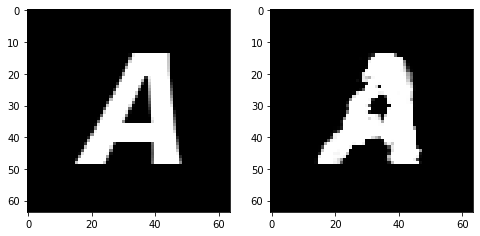

Epoch 77, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.53505252674222, Loss SSIM 2.0102356672286987, Loss Local 162.14767217636108


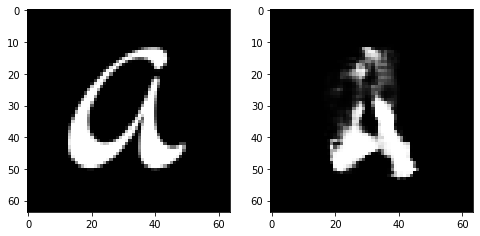

Epoch 78, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6083111986517906, Loss SSIM 2.1750634908676147, Loss Local 167.279456615448


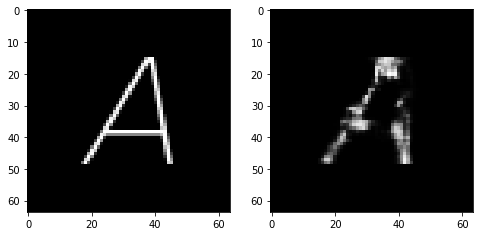

Epoch 78, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5355421155691147, Loss SSIM 1.9673555493354797, Loss Local 174.7585802078247


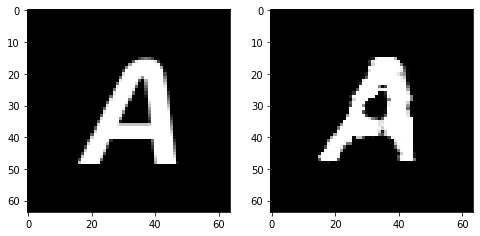

Epoch 78, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5235331878066063, Loss SSIM 1.9792029857635498, Loss Local 174.2476863861084


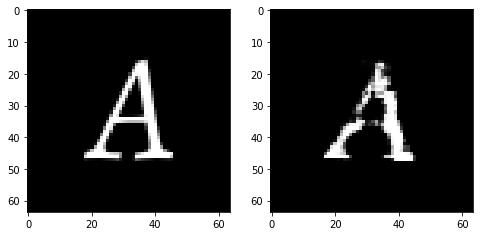

Epoch 78, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5380690321326256, Loss SSIM 2.0053921937942505, Loss Local 178.35545206069946


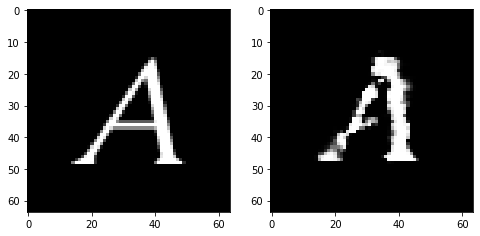

Epoch 78, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5440498925745487, Loss SSIM 2.0450069308280945, Loss Local 175.35721158981323


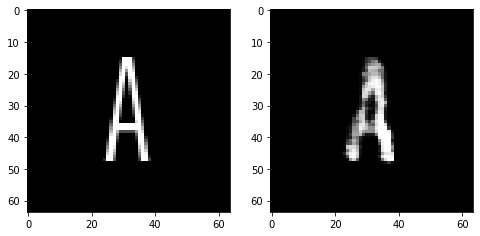

Epoch 78, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.55802595987916, Loss SSIM 2.0646934509277344, Loss Local 186.03387022018433


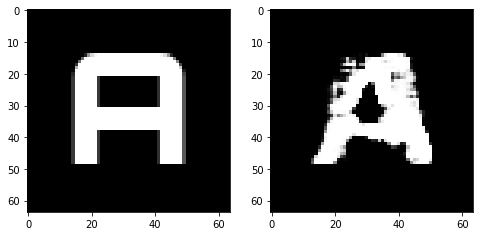

Epoch 78, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6233383789658546, Loss SSIM 2.094244658946991, Loss Local 175.65256643295288


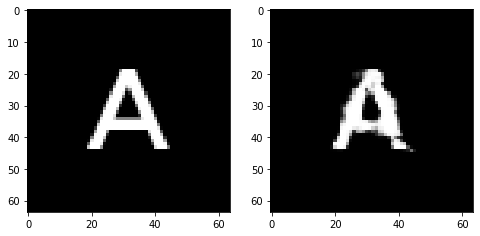

Epoch 79, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.538375150412321, Loss SSIM 2.0400277972221375, Loss Local 167.4124617576599


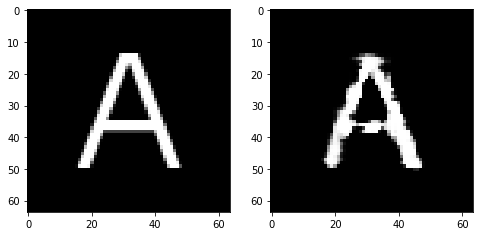

Epoch 79, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5619128569960594, Loss SSIM 2.008739173412323, Loss Local 178.91818714141846


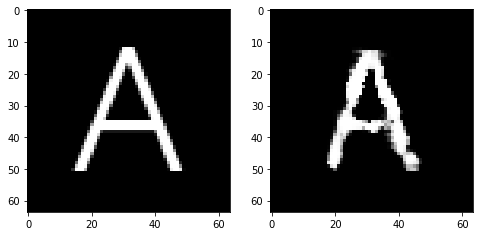

Epoch 79, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5484024100005627, Loss SSIM 2.0166112184524536, Loss Local 170.01242542266846


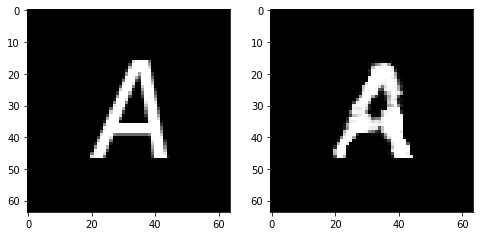

Epoch 79, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5703874789178371, Loss SSIM 2.0411497354507446, Loss Local 188.74556255340576


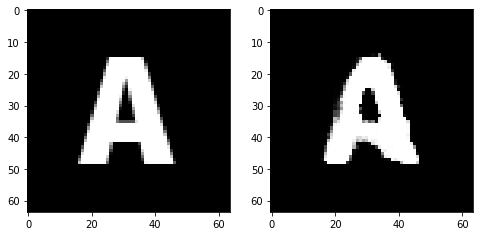

Epoch 79, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.521682571619749, Loss SSIM 2.0115045309066772, Loss Local 165.48507118225098


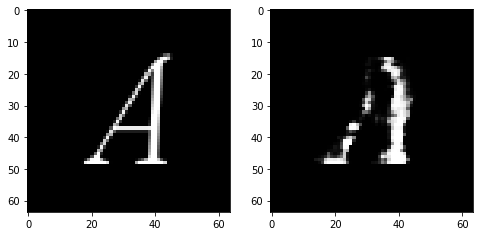

Epoch 79, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6002811752259731, Loss SSIM 2.107739508152008, Loss Local 184.73800897598267


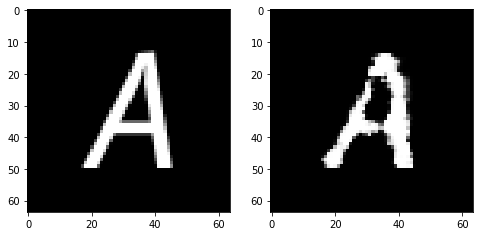

Epoch 79, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.547722339630127, Loss SSIM 2.022680938243866, Loss Local 179.99039554595947


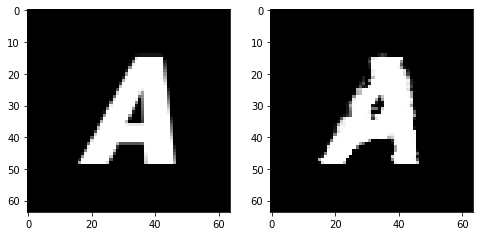

Epoch 80, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5764939561486244, Loss SSIM 2.072437882423401, Loss Local 183.9492964744568


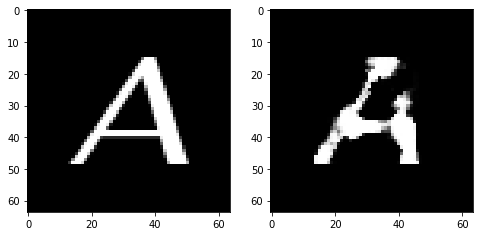

Epoch 80, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5306961722671986, Loss SSIM 2.0029831528663635, Loss Local 166.0168833732605


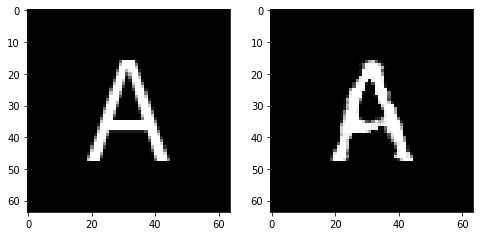

Epoch 80, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5737882740795612, Loss SSIM 2.0134525299072266, Loss Local 176.83599138259888


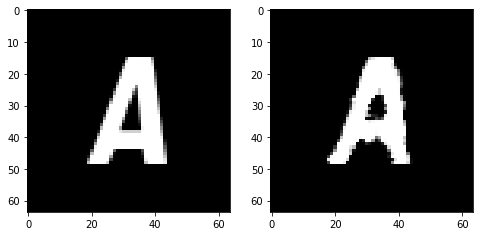

Epoch 80, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5344781130552292, Loss SSIM 2.0708338022232056, Loss Local 176.14699125289917


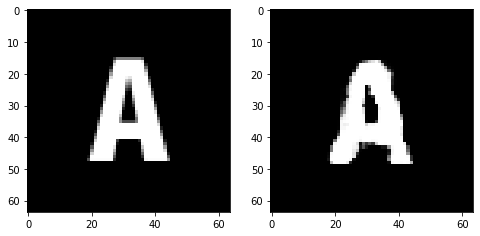

Epoch 80, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.542203139513731, Loss SSIM 2.06157249212265, Loss Local 172.44609880447388


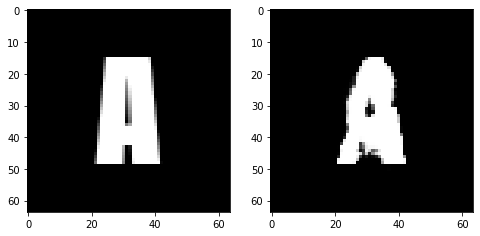

Epoch 80, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5535406693816185, Loss SSIM 1.9986856579780579, Loss Local 177.6116008758545


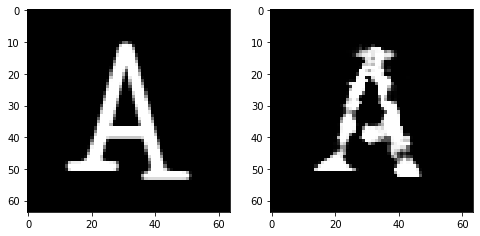

Epoch 80, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.579658791422844, Loss SSIM 2.0492364168167114, Loss Local 177.14165925979614


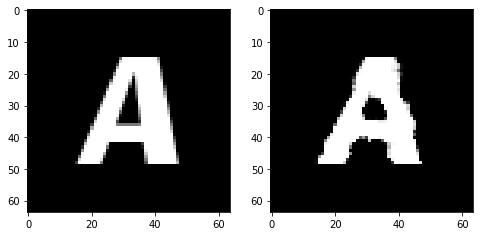

Epoch 81, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6080130189657211, Loss SSIM 2.1097370982170105, Loss Local 176.1420192718506


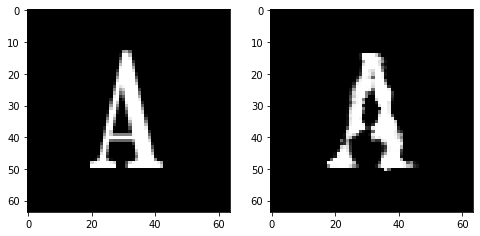

Epoch 81, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6180517487227917, Loss SSIM 2.148423433303833, Loss Local 180.53066492080688


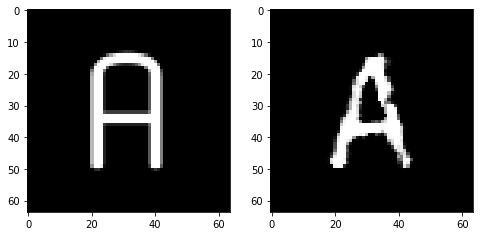

Epoch 81, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4928581565618515, Loss SSIM 2.0058974623680115, Loss Local 175.43701314926147


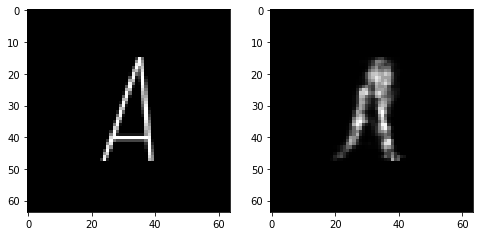

Epoch 81, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4927778132259846, Loss SSIM 1.9170247912406921, Loss Local 173.2115707397461


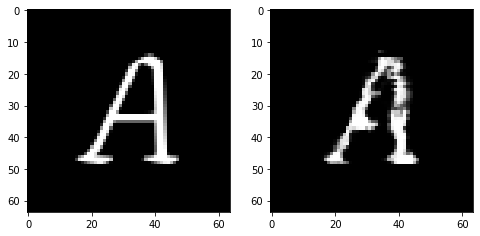

Epoch 81, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.522485937923193, Loss SSIM 1.954011857509613, Loss Local 172.39223861694336


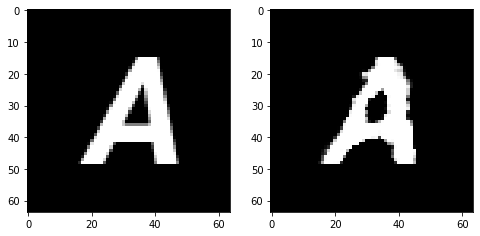

Epoch 81, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.573479913175106, Loss SSIM 2.046382248401642, Loss Local 177.3257818222046


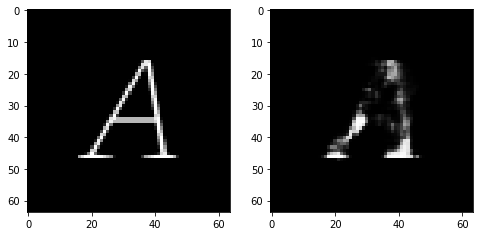

Epoch 81, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5924717225134373, Loss SSIM 2.112796902656555, Loss Local 184.35750722885132


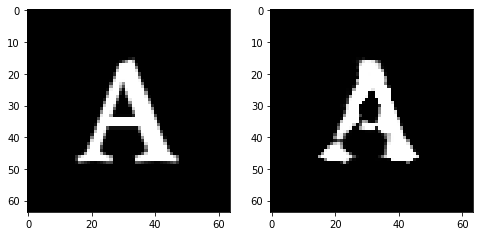

Epoch 82, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5313250720500946, Loss SSIM 1.9975449442863464, Loss Local 171.24531531333923


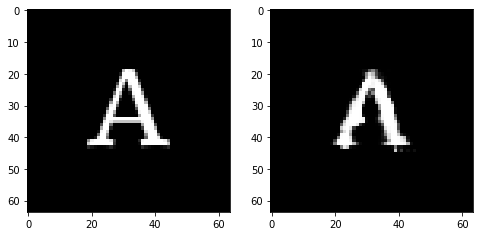

Epoch 82, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5217618606984615, Loss SSIM 1.9937633275985718, Loss Local 179.12321949005127


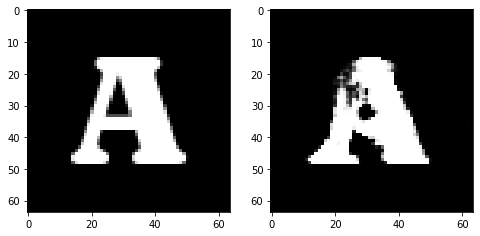

Epoch 82, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5246335938572884, Loss SSIM 1.9790291786193848, Loss Local 174.14949488639832


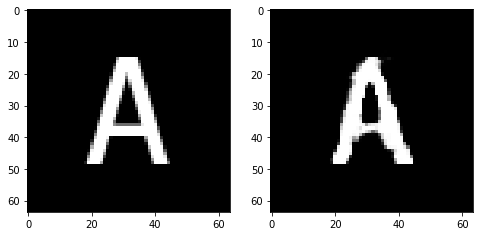

Epoch 82, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.580855417996645, Loss SSIM 2.056394040584564, Loss Local 172.36919856071472


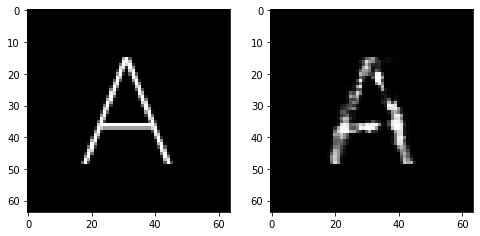

Epoch 82, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.53611533716321, Loss SSIM 2.03213632106781, Loss Local 168.1637978553772


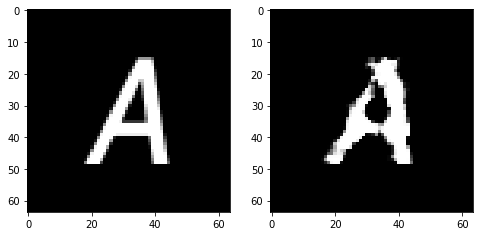

Epoch 82, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.596163410693407, Loss SSIM 2.1148939728736877, Loss Local 182.58388328552246


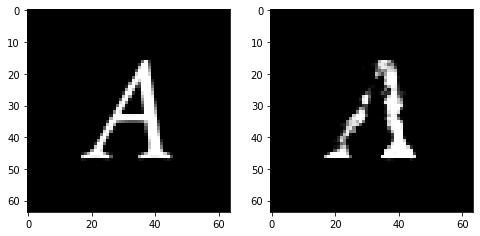

Epoch 82, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5925405770540237, Loss SSIM 2.0715416073799133, Loss Local 186.4638228416443


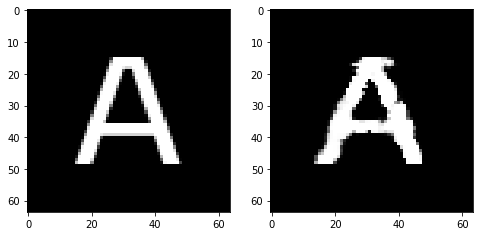

Epoch 83, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.572323977947235, Loss SSIM 2.0793429613113403, Loss Local 168.7564640045166


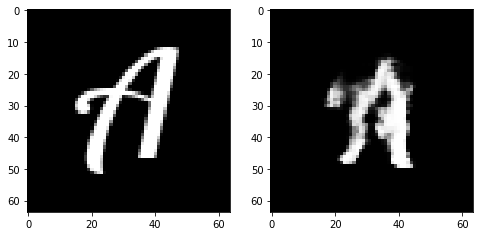

Epoch 83, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5390871167182922, Loss SSIM 1.9754221439361572, Loss Local 177.6109495162964


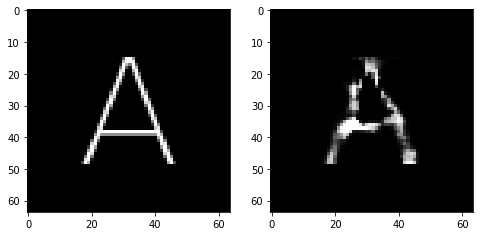

Epoch 83, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5620311461389065, Loss SSIM 2.1026323437690735, Loss Local 174.27656745910645


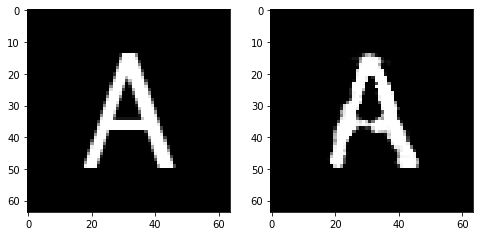

Epoch 83, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6062285378575325, Loss SSIM 2.1559250354766846, Loss Local 171.71815013885498


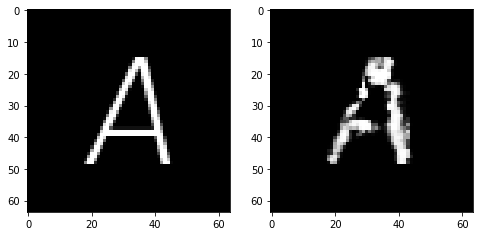

Epoch 83, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5851432047784328, Loss SSIM 2.0679089426994324, Loss Local 184.7645616531372


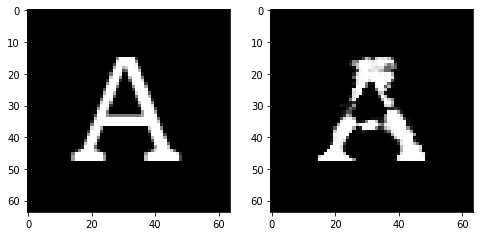

Epoch 83, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5153568424284458, Loss SSIM 2.007584571838379, Loss Local 175.00736474990845


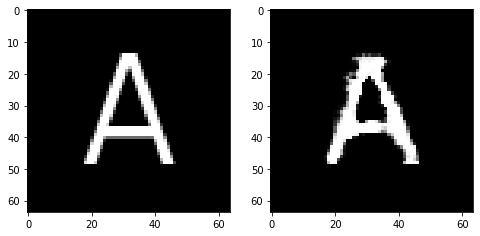

Epoch 83, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.513979509472847, Loss SSIM 1.9003998637199402, Loss Local 172.917414188385


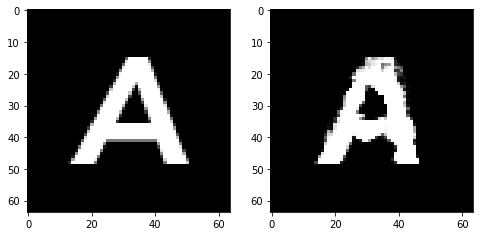

Epoch 84, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5085690952837467, Loss SSIM 1.932239830493927, Loss Local 169.02968549728394


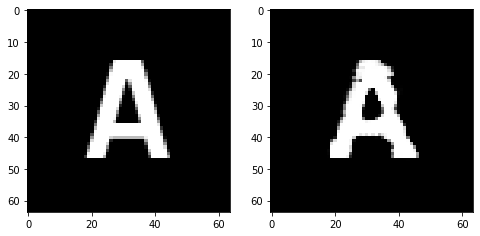

Epoch 84, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.61552619561553, Loss SSIM 2.118612825870514, Loss Local 177.00455474853516


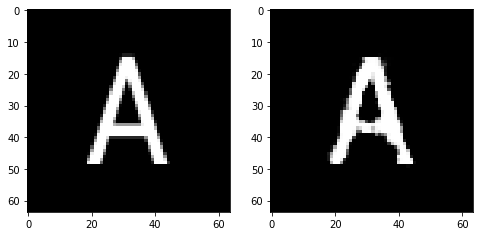

Epoch 84, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5161126293241978, Loss SSIM 1.961449921131134, Loss Local 170.66111612319946


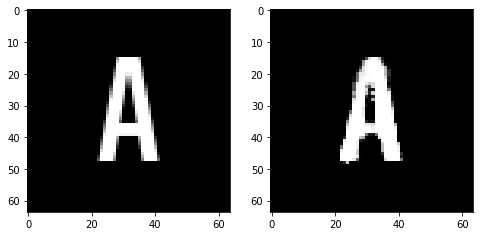

Epoch 84, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6025542728602886, Loss SSIM 2.1255970001220703, Loss Local 170.20914554595947


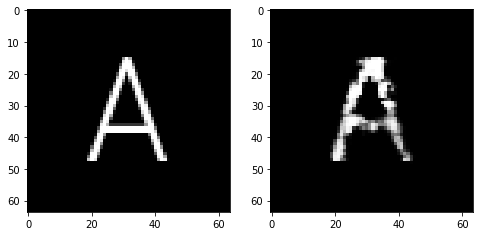

Epoch 84, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4970388635993004, Loss SSIM 1.951630413532257, Loss Local 160.417010307312


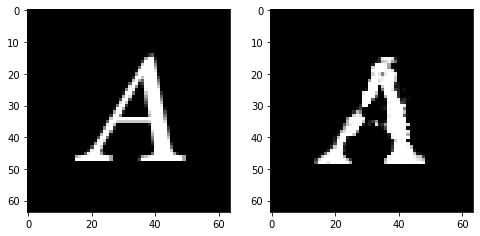

Epoch 84, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5596764236688614, Loss SSIM 2.0886106491088867, Loss Local 172.9955976009369


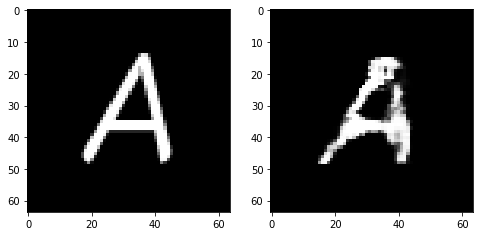

Epoch 84, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5615437738597393, Loss SSIM 2.0402336716651917, Loss Local 175.53994417190552


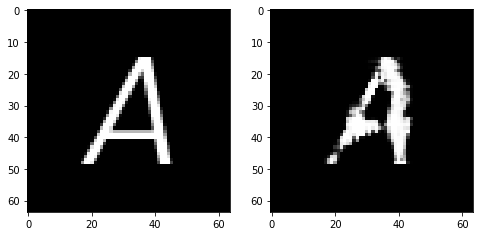

Epoch 85, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5648939684033394, Loss SSIM 2.013982594013214, Loss Local 172.24436616897583


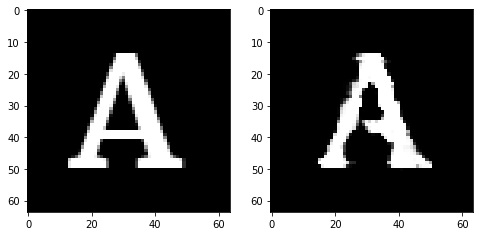

Epoch 85, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5344405695796013, Loss SSIM 2.0163419246673584, Loss Local 169.54146003723145


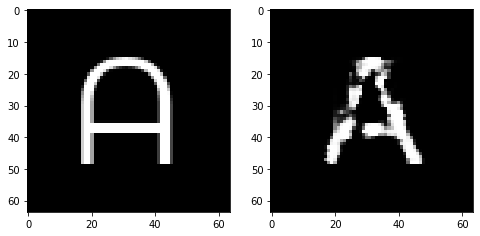

Epoch 85, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5512980595231056, Loss SSIM 2.0461674332618713, Loss Local 176.35253190994263


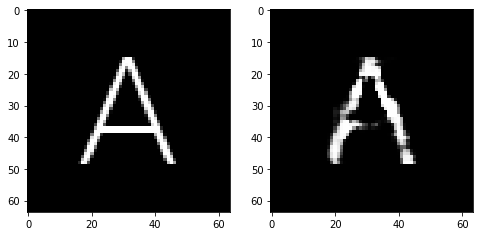

Epoch 85, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5616437457501888, Loss SSIM 2.0783039927482605, Loss Local 178.69980716705322


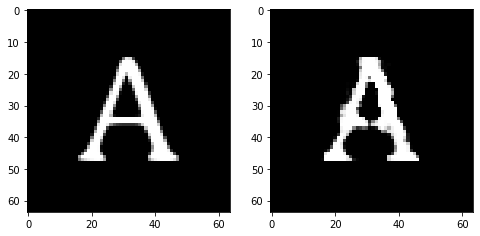

Epoch 85, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.513695389032364, Loss SSIM 1.9646499752998352, Loss Local 173.9891095161438


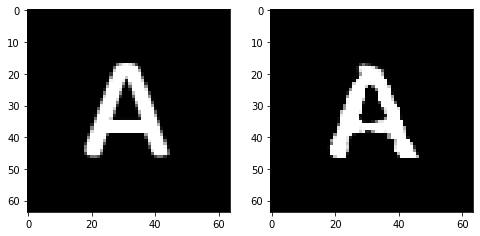

Epoch 85, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.543545238673687, Loss SSIM 1.994119942188263, Loss Local 172.82364511489868


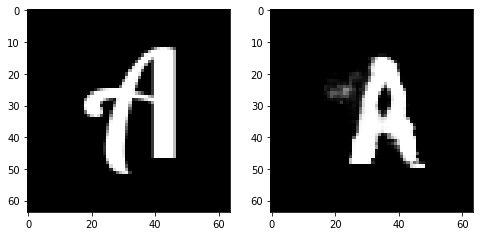

Epoch 85, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6055459827184677, Loss SSIM 2.108120024204254, Loss Local 179.110848903656


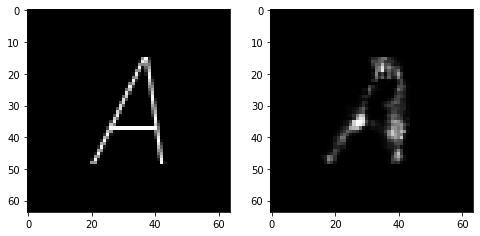

Epoch 86, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5557679124176502, Loss SSIM 2.0504640340805054, Loss Local 162.54692363739014


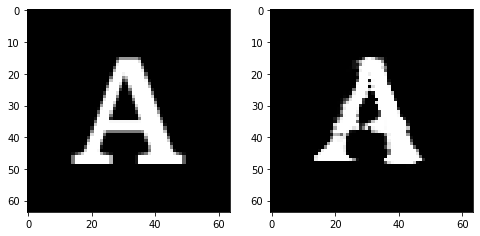

Epoch 86, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5705699436366558, Loss SSIM 2.0756423473358154, Loss Local 183.3201231956482


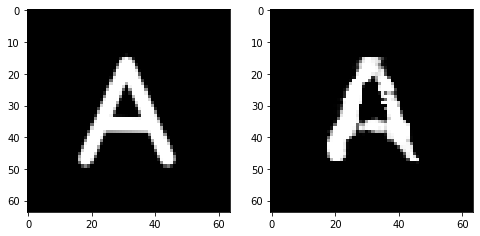

Epoch 86, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.553067784756422, Loss SSIM 2.0358028411865234, Loss Local 174.37321043014526


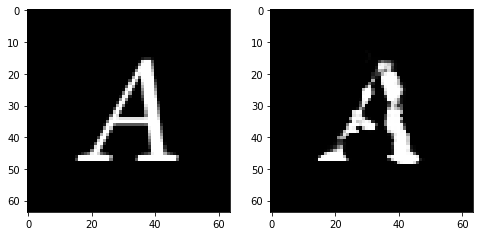

Epoch 86, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5497125126421452, Loss SSIM 1.9954427480697632, Loss Local 170.44751453399658


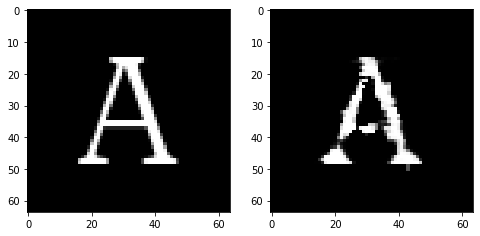

Epoch 86, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5559986419975758, Loss SSIM 2.0131930708885193, Loss Local 167.73196935653687


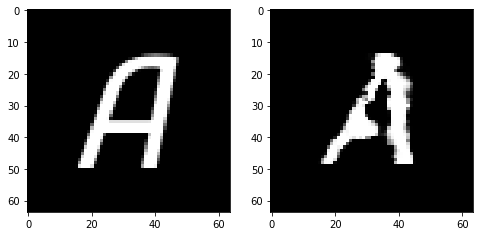

Epoch 86, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5995722338557243, Loss SSIM 2.089436173439026, Loss Local 181.01322650909424


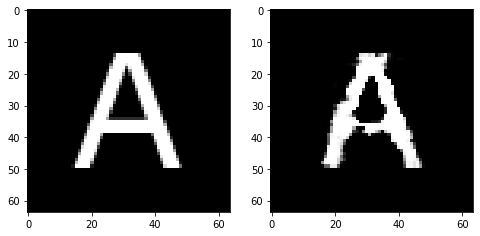

Epoch 86, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5281543657183647, Loss SSIM 2.0297645330429077, Loss Local 163.45041942596436


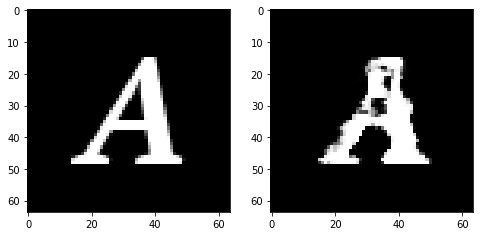

Epoch 87, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.532015684992075, Loss SSIM 2.0231314301490784, Loss Local 170.26099586486816


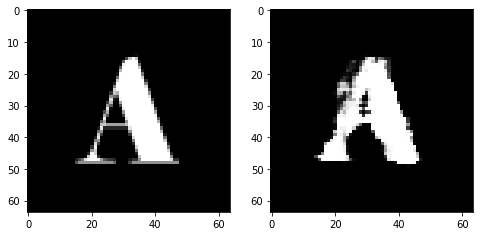

Epoch 87, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6042134650051594, Loss SSIM 2.073741137981415, Loss Local 182.21017265319824


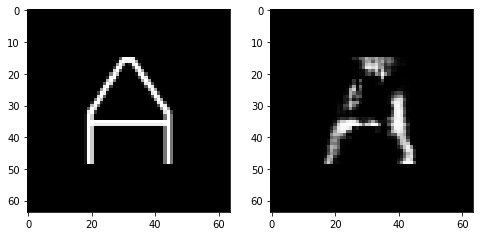

Epoch 87, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.514990657567978, Loss SSIM 1.9665250778198242, Loss Local 173.32248544692993


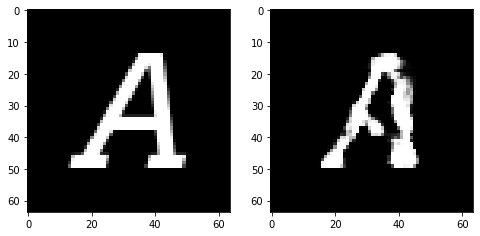

Epoch 87, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5540222860872746, Loss SSIM 2.0524824261665344, Loss Local 176.4937891960144


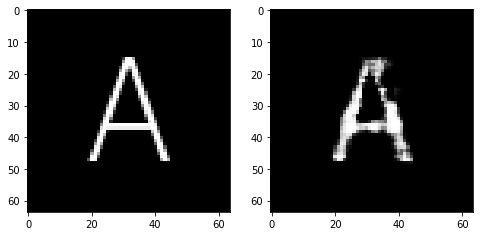

Epoch 87, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.582303799688816, Loss SSIM 2.0480427742004395, Loss Local 183.7990436553955


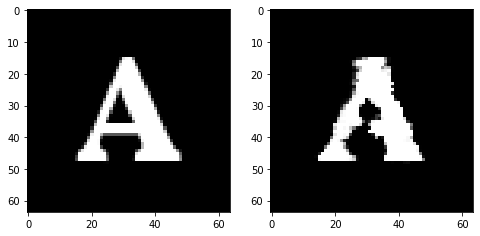

Epoch 87, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.540552280843258, Loss SSIM 2.011499583721161, Loss Local 172.79962682724


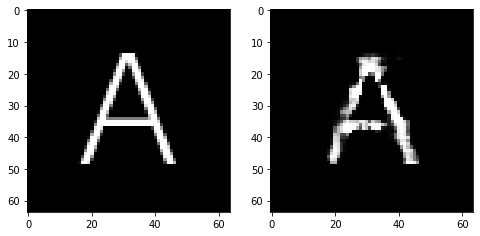

Epoch 87, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.563332486897707, Loss SSIM 2.053156793117523, Loss Local 169.8208270072937


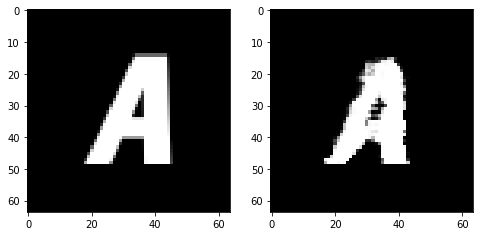

Epoch 88, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.571983978152275, Loss SSIM 2.0336551666259766, Loss Local 167.62518167495728


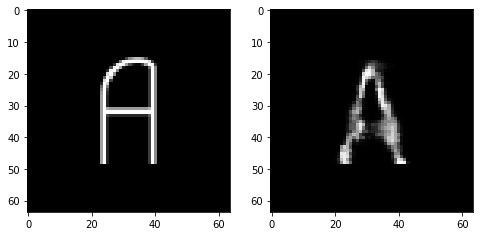

Epoch 88, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5193804912269115, Loss SSIM 1.9857628345489502, Loss Local 169.7664918899536


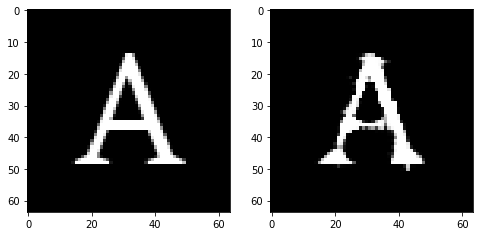

Epoch 88, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.575759656727314, Loss SSIM 2.0768356323242188, Loss Local 175.69344091415405


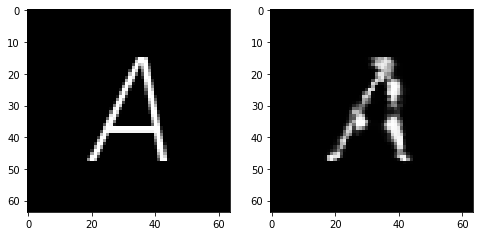

Epoch 88, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.553393680602312, Loss SSIM 2.096102237701416, Loss Local 179.19622039794922


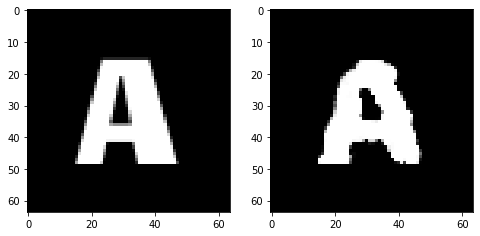

Epoch 88, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.576672974973917, Loss SSIM 2.073153078556061, Loss Local 176.40989780426025


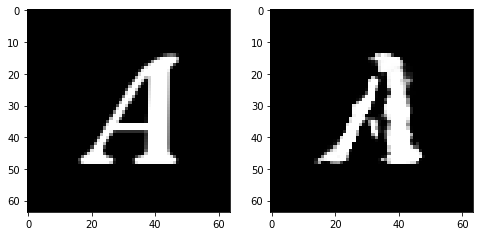

Epoch 88, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.575680885463953, Loss SSIM 2.0640165209770203, Loss Local 162.22157859802246


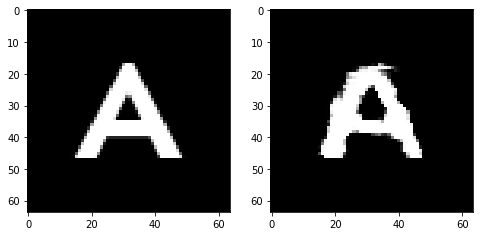

Epoch 88, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5358573012053967, Loss SSIM 1.979999840259552, Loss Local 172.589280128479


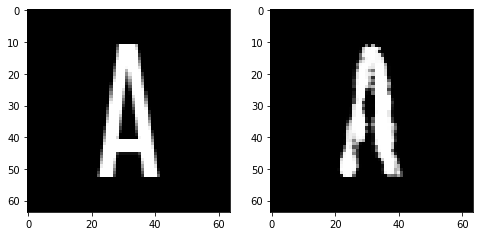

Epoch 89, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5894757770001888, Loss SSIM 2.1280657052993774, Loss Local 178.93849563598633


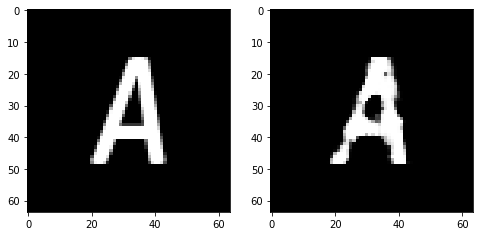

Epoch 89, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5533786825835705, Loss SSIM 2.06333726644516, Loss Local 180.02340269088745


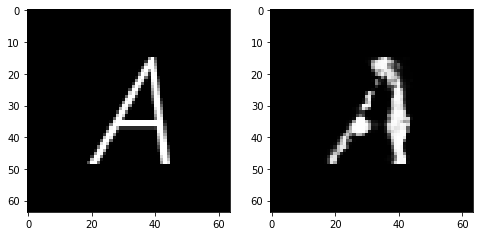

Epoch 89, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5620752684772015, Loss SSIM 2.0486244559288025, Loss Local 168.91134214401245


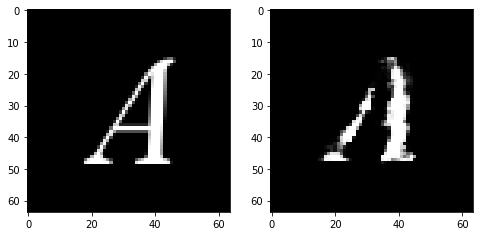

Epoch 89, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5348088592290878, Loss SSIM 2.0046613812446594, Loss Local 177.81342697143555


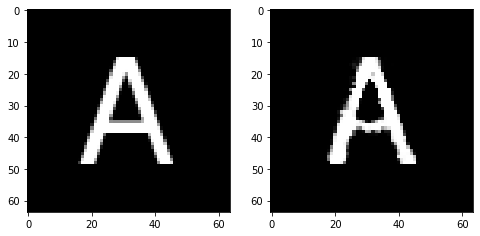

Epoch 89, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5290355272591114, Loss SSIM 1.955275058746338, Loss Local 170.86057567596436


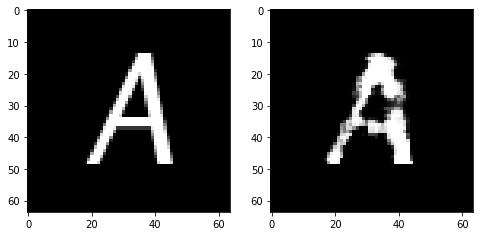

Epoch 89, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.624324508011341, Loss SSIM 2.12913578748703, Loss Local 186.52702856063843


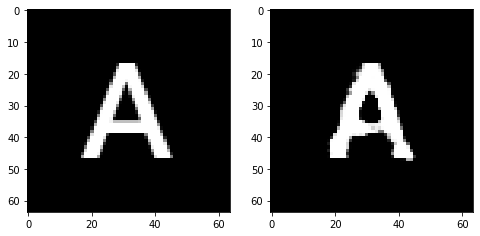

Epoch 89, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5046686865389347, Loss SSIM 1.945445954799652, Loss Local 172.55682182312012


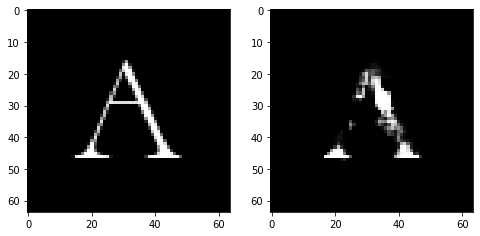

Epoch 90, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5696953870356083, Loss SSIM 2.0852391719818115, Loss Local 171.2859125137329


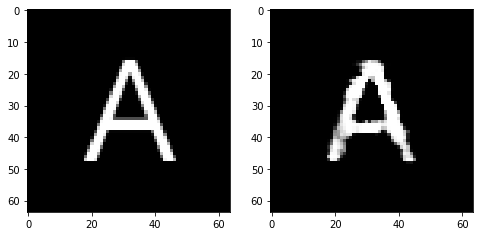

Epoch 90, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.520023062825203, Loss SSIM 1.9892499446868896, Loss Local 169.12010955810547


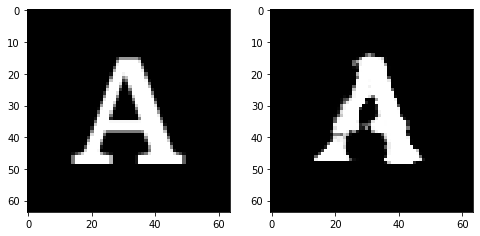

Epoch 90, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5478540398180485, Loss SSIM 1.9721224904060364, Loss Local 170.8265504837036


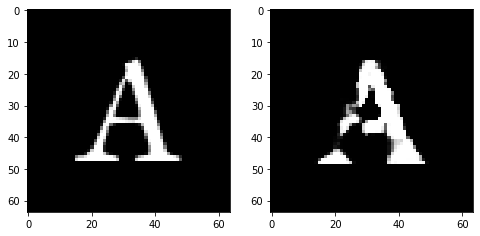

Epoch 90, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5604224912822247, Loss SSIM 2.0402846932411194, Loss Local 177.3466019630432


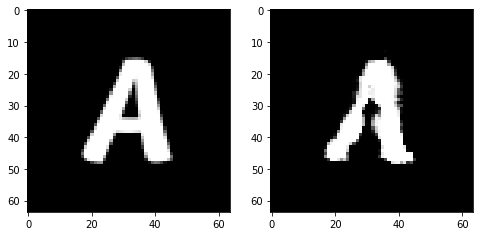

Epoch 90, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5726874805986881, Loss SSIM 2.109991669654846, Loss Local 173.81053018569946


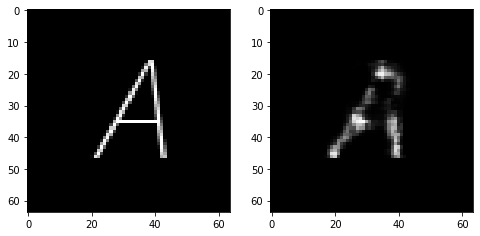

Epoch 90, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5436270758509636, Loss SSIM 2.0152506232261658, Loss Local 180.9358401298523


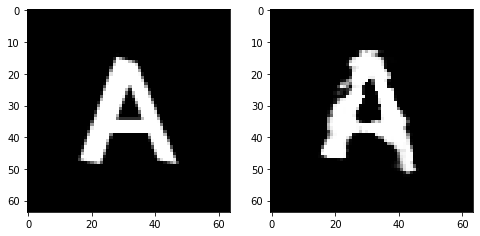

Epoch 90, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5719394385814667, Loss SSIM 2.0449438095092773, Loss Local 168.08791542053223


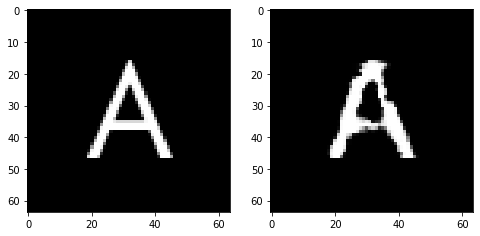

Epoch 91, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5453914515674114, Loss SSIM 2.0520488619804382, Loss Local 172.03814840316772


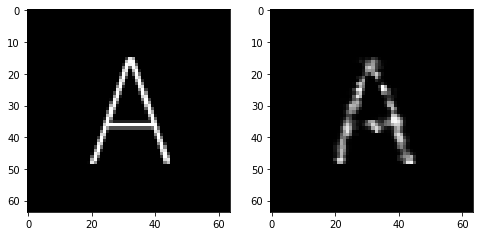

Epoch 91, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5766551233828068, Loss SSIM 2.0702750086784363, Loss Local 175.93345642089844


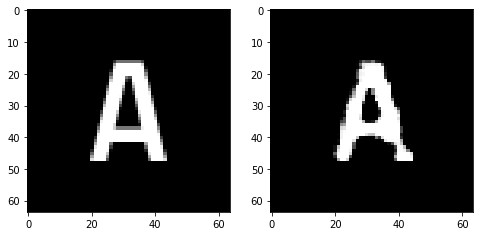

Epoch 91, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5582297444343567, Loss SSIM 2.0299640893936157, Loss Local 167.07154631614685


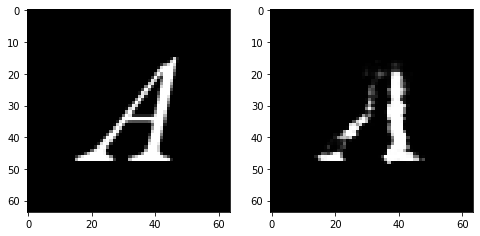

Epoch 91, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5681873485445976, Loss SSIM 2.0501996874809265, Loss Local 171.15599012374878


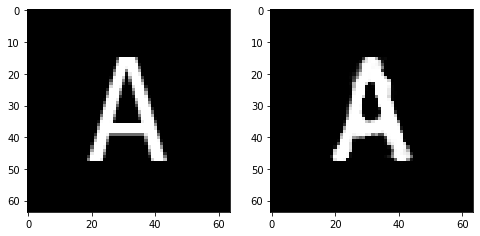

Epoch 91, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5556753799319267, Loss SSIM 2.013201892375946, Loss Local 170.88997983932495


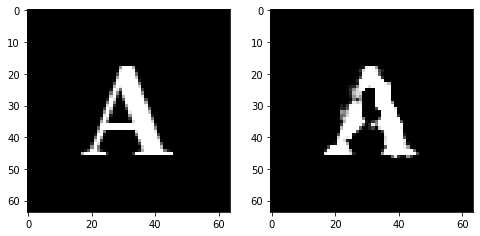

Epoch 91, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5346017070114613, Loss SSIM 2.0217642784118652, Loss Local 164.68828058242798


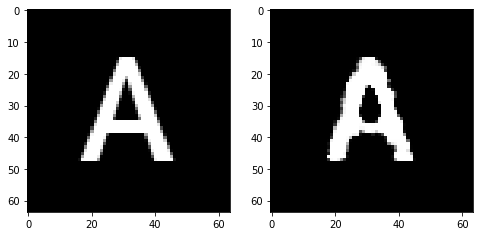

Epoch 91, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5607801675796509, Loss SSIM 2.0444819927215576, Loss Local 169.2168197631836


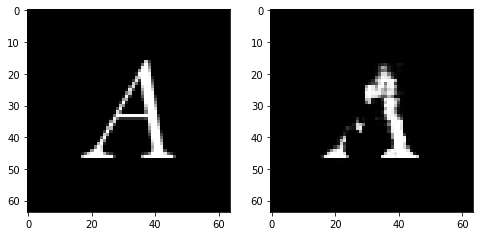

Epoch 92, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5765567943453789, Loss SSIM 2.011526107788086, Loss Local 185.39160013198853


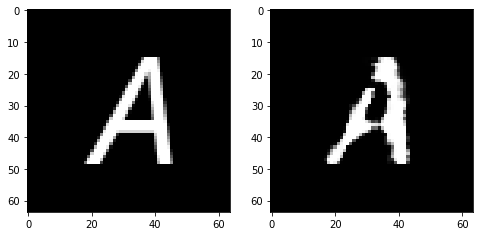

Epoch 92, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.52141248062253, Loss SSIM 2.0110124945640564, Loss Local 174.9227876663208


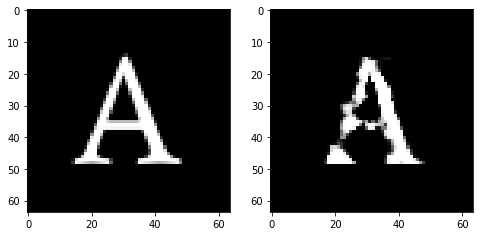

Epoch 92, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5854104943573475, Loss SSIM 2.093460261821747, Loss Local 174.0524868965149


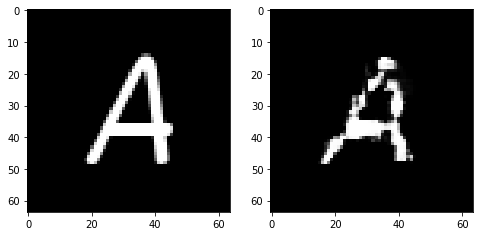

Epoch 92, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5108496136963367, Loss SSIM 2.0052188634872437, Loss Local 161.86351108551025


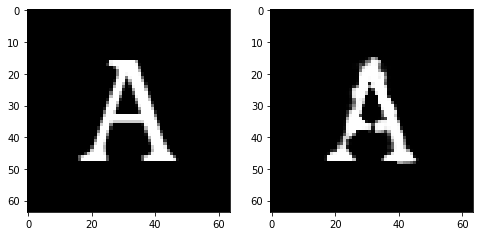

Epoch 92, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.619975857436657, Loss SSIM 2.1250112652778625, Loss Local 185.02141523361206


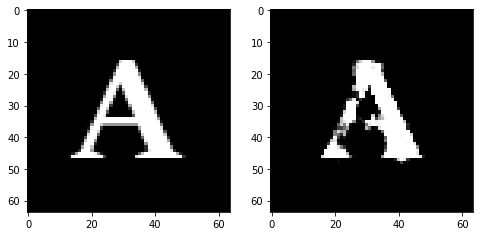

Epoch 92, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.552220743149519, Loss SSIM 2.0510582327842712, Loss Local 183.67654037475586


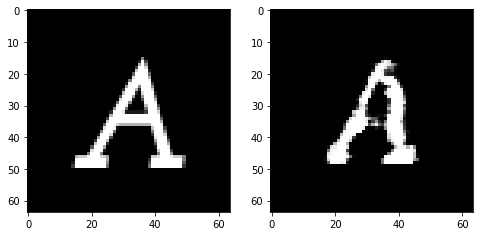

Epoch 92, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5349827893078327, Loss SSIM 1.9628164172172546, Loss Local 165.2895531654358


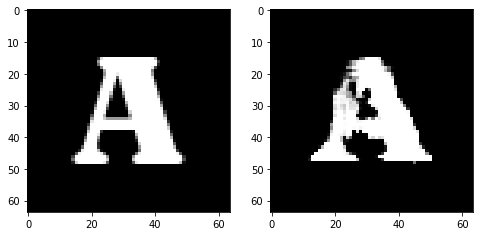

Epoch 93, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5543742440640926, Loss SSIM 2.0136367082595825, Loss Local 170.27856492996216


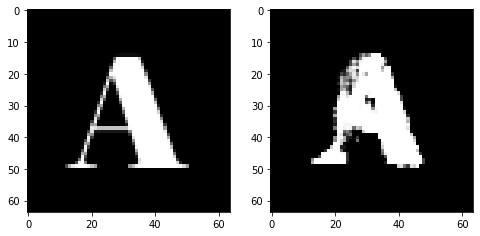

Epoch 93, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5246253460645676, Loss SSIM 1.9746152758598328, Loss Local 172.87599325180054


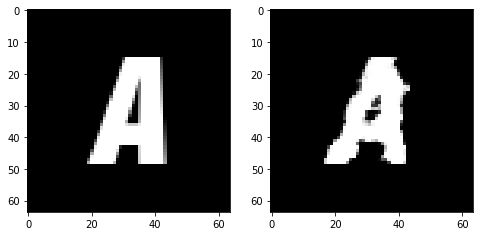

Epoch 93, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.583319291472435, Loss SSIM 2.1014844179153442, Loss Local 170.57323837280273


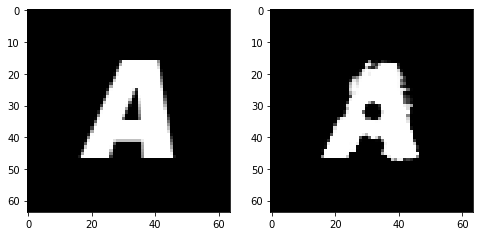

Epoch 93, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5542493276298046, Loss SSIM 2.0585240721702576, Loss Local 175.42896127700806


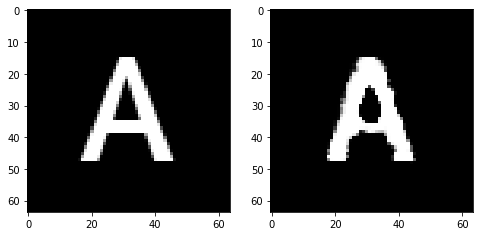

Epoch 93, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.537147019058466, Loss SSIM 1.9751222133636475, Loss Local 170.1750237941742


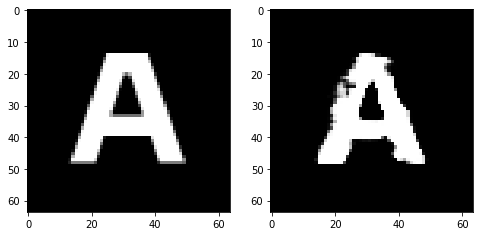

Epoch 93, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5327987633645535, Loss SSIM 1.9976596236228943, Loss Local 166.68791437149048


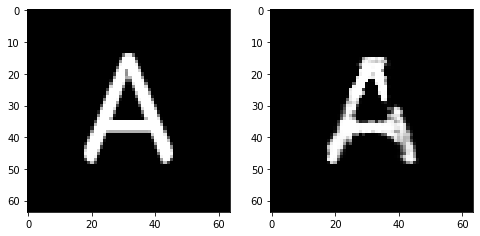

Epoch 93, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5871232710778713, Loss SSIM 2.146139442920685, Loss Local 187.11058568954468


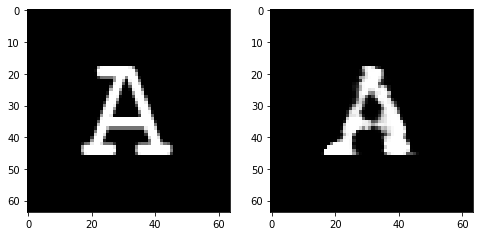

Epoch 94, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.551255226135254, Loss SSIM 2.018729269504547, Loss Local 165.34873867034912


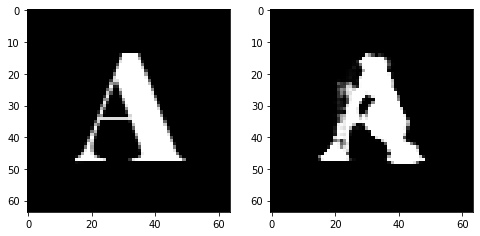

Epoch 94, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5238573215901852, Loss SSIM 1.982412338256836, Loss Local 168.9488649368286


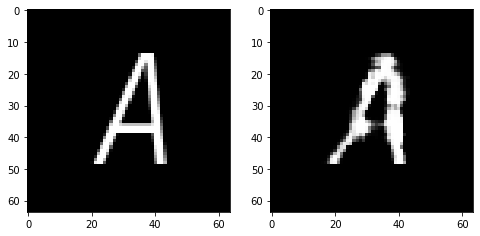

Epoch 94, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5721819996833801, Loss SSIM 2.1220601201057434, Loss Local 169.6219301223755


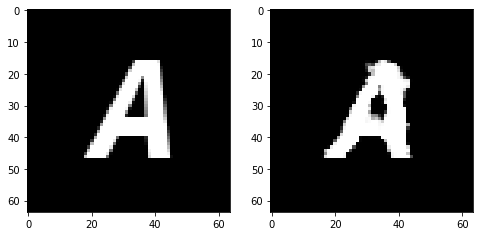

Epoch 94, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5639364309608936, Loss SSIM 2.056742787361145, Loss Local 180.17372798919678


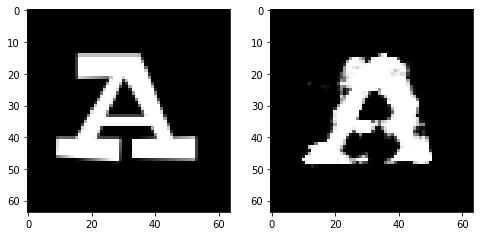

Epoch 94, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5807806551456451, Loss SSIM 2.053261160850525, Loss Local 172.79054856300354


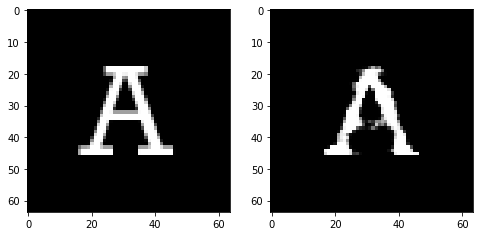

Epoch 94, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5790249519050121, Loss SSIM 2.0521721243858337, Loss Local 183.63340520858765


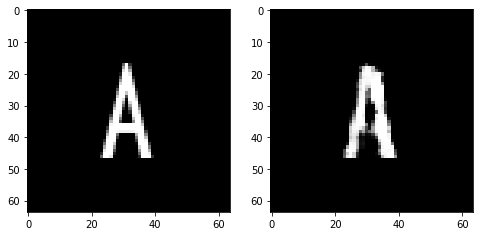

Epoch 94, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5800951048731804, Loss SSIM 2.091586410999298, Loss Local 190.04096174240112


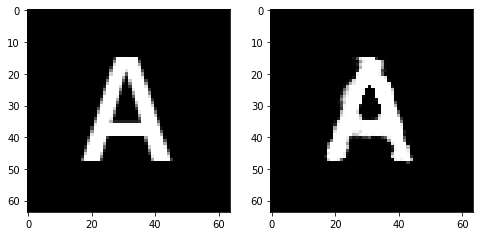

Epoch 95, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5606926120817661, Loss SSIM 2.0443126559257507, Loss Local 171.90021753311157


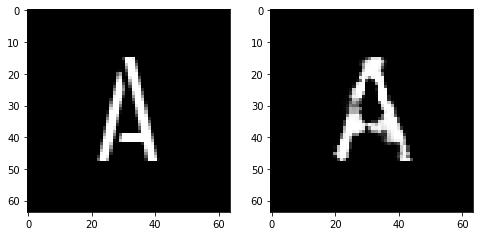

Epoch 95, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5678960010409355, Loss SSIM 2.105302631855011, Loss Local 173.33054399490356


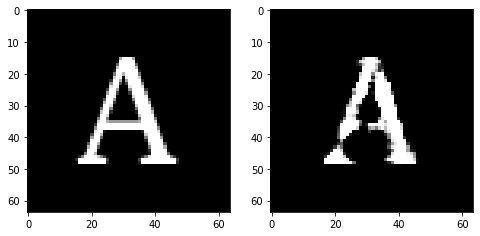

Epoch 95, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5646921321749687, Loss SSIM 2.0165253281593323, Loss Local 173.5835542678833


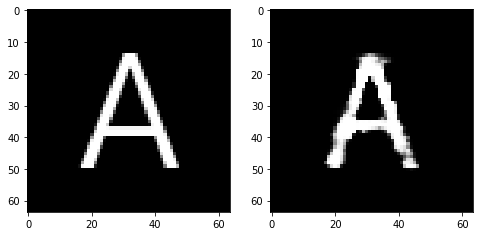

Epoch 95, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.626739114522934, Loss SSIM 2.1638485193252563, Loss Local 183.2666516304016


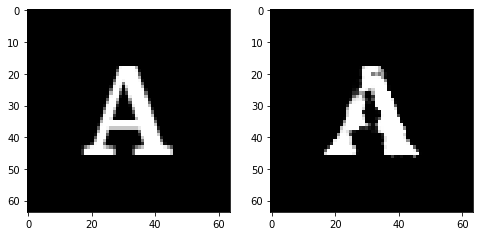

Epoch 95, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.515314768999815, Loss SSIM 1.9585716128349304, Loss Local 168.28925561904907


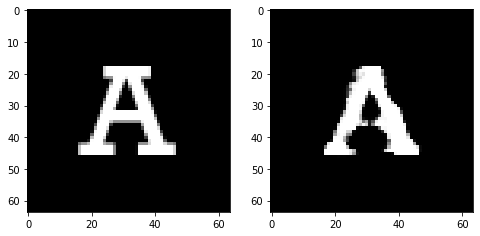

Epoch 95, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5522313006222248, Loss SSIM 2.0331591963768005, Loss Local 179.25626039505005


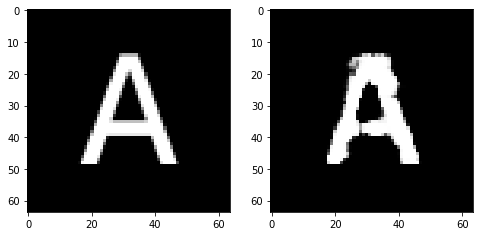

Epoch 95, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.530727043747902, Loss SSIM 1.9919713735580444, Loss Local 170.3524088859558


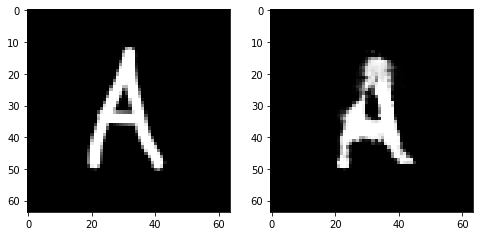

Epoch 96, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5888415575027466, Loss SSIM 2.1193504333496094, Loss Local 176.34794330596924


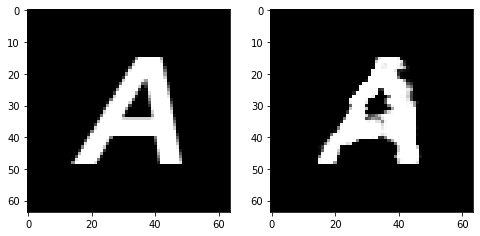

Epoch 96, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5321766808629036, Loss SSIM 2.0056487917900085, Loss Local 177.3068904876709


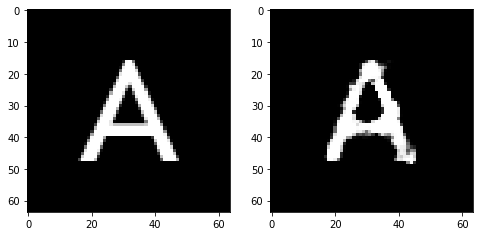

Epoch 96, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.507242627441883, Loss SSIM 1.9796814322471619, Loss Local 174.47724533081055


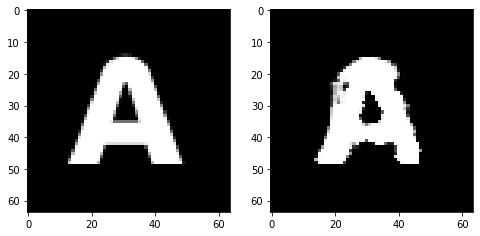

Epoch 96, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5420765802264214, Loss SSIM 1.9988032579421997, Loss Local 168.29416131973267


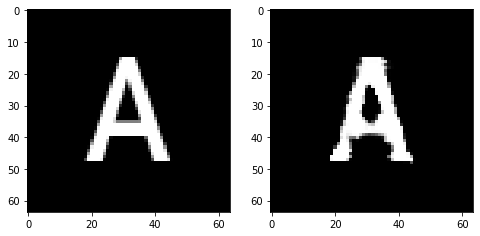

Epoch 96, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6489078886806965, Loss SSIM 2.183518350124359, Loss Local 170.31032729148865


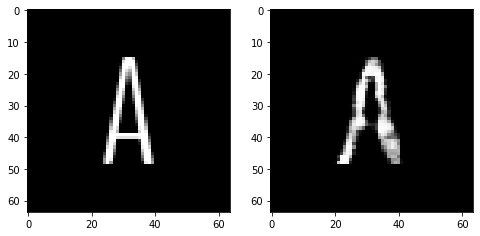

Epoch 96, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5700795128941536, Loss SSIM 2.0653920769691467, Loss Local 178.2156765460968


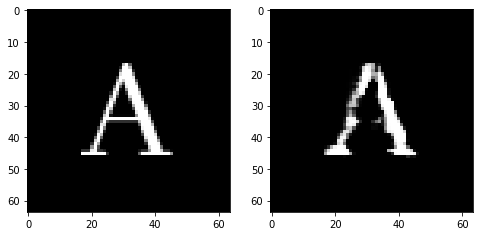

Epoch 96, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5421827100217342, Loss SSIM 1.9811781644821167, Loss Local 168.71109247207642


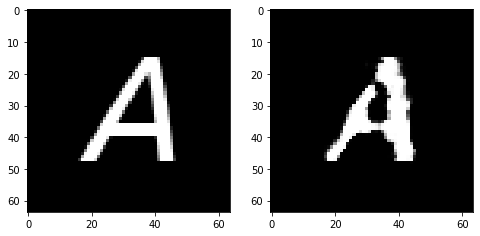

Epoch 97, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5319563038647175, Loss SSIM 1.9933597445487976, Loss Local 173.7628321647644


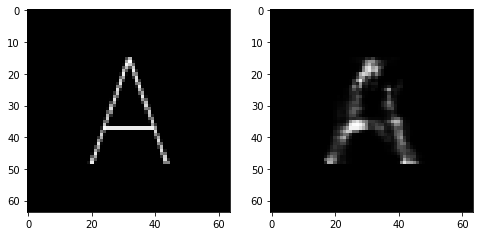

Epoch 97, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5286708138883114, Loss SSIM 1.990665853023529, Loss Local 171.27144408226013


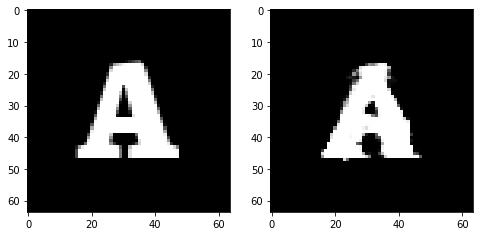

Epoch 97, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.575782172381878, Loss SSIM 2.0647215843200684, Loss Local 175.15245628356934


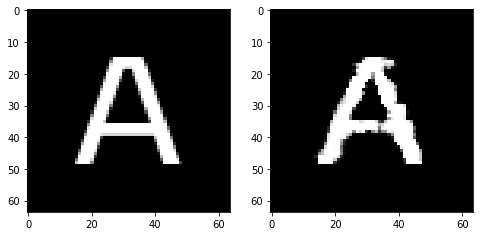

Epoch 97, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5949268974363804, Loss SSIM 2.1113571524620056, Loss Local 168.594313621521


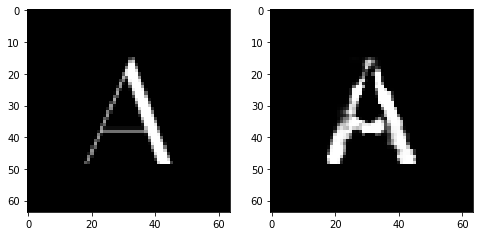

Epoch 97, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5074466727674007, Loss SSIM 1.9760595560073853, Loss Local 156.29278588294983


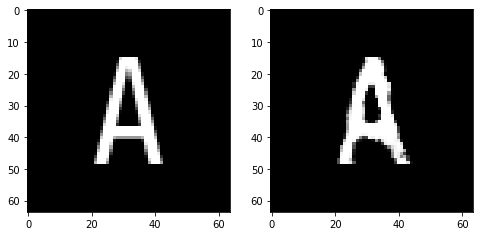

Epoch 97, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5659913644194603, Loss SSIM 2.056617856025696, Loss Local 180.49248552322388


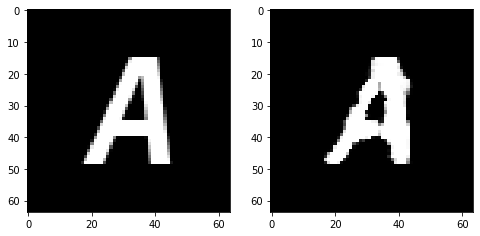

Epoch 97, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5496313571929932, Loss SSIM 2.0096153616905212, Loss Local 171.9486346244812


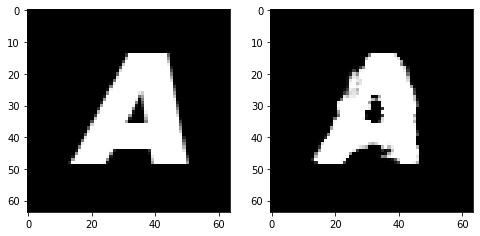

Epoch 98, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5631469786167145, Loss SSIM 2.078061878681183, Loss Local 173.23007202148438


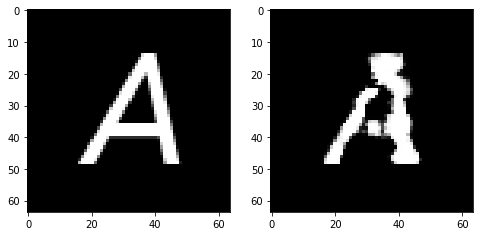

Epoch 98, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.556616935878992, Loss SSIM 1.9917035102844238, Loss Local 176.1775188446045


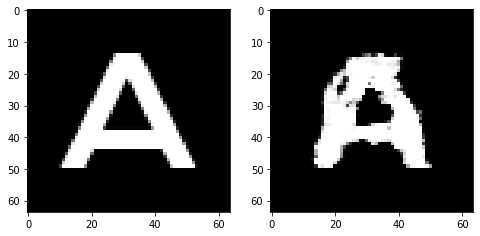

Epoch 98, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.540254145860672, Loss SSIM 2.0134137868881226, Loss Local 173.86205863952637


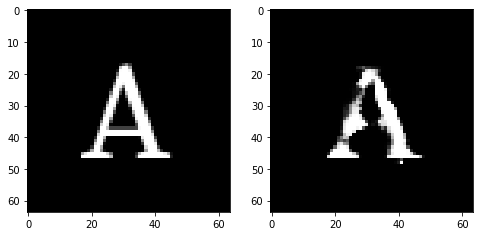

Epoch 98, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5445494800806046, Loss SSIM 1.9788373112678528, Loss Local 177.15559434890747


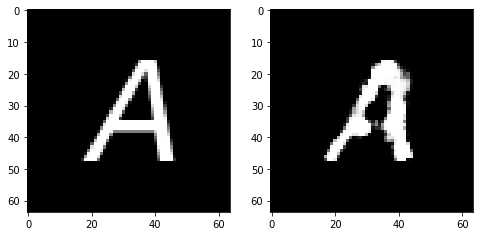

Epoch 98, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5542846024036407, Loss SSIM 2.0932658314704895, Loss Local 174.9233956336975


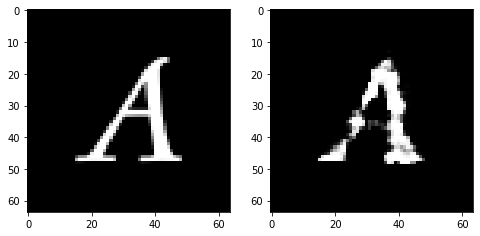

Epoch 98, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.553215492516756, Loss SSIM 2.011784851551056, Loss Local 171.96976566314697


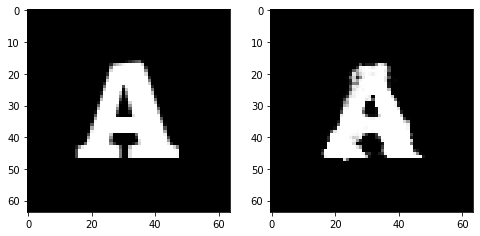

Epoch 98, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5540397316217422, Loss SSIM 2.063135087490082, Loss Local 180.2703309059143


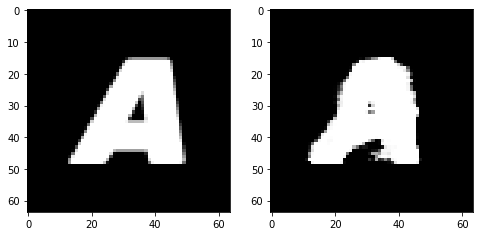

Epoch 99, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.561320949345827, Loss SSIM 2.0316004157066345, Loss Local 171.39153289794922


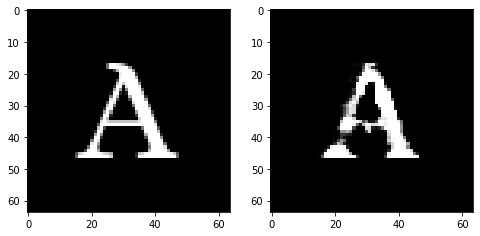

Epoch 99, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5984421111643314, Loss SSIM 2.0731602907180786, Loss Local 181.10168266296387


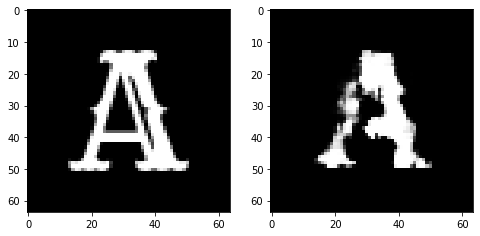

Epoch 99, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5511597134172916, Loss SSIM 1.9920663237571716, Loss Local 184.69250011444092


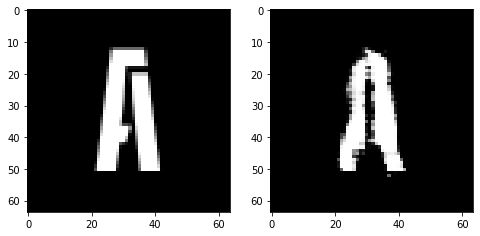

Epoch 99, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5296508483588696, Loss SSIM 2.025041162967682, Loss Local 169.7674880027771


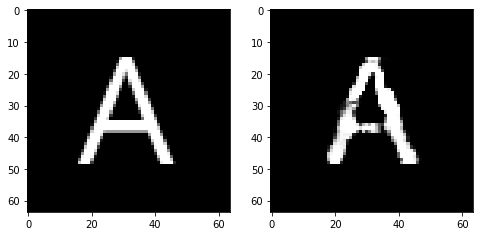

Epoch 99, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.579952947795391, Loss SSIM 2.093623459339142, Loss Local 177.23950004577637


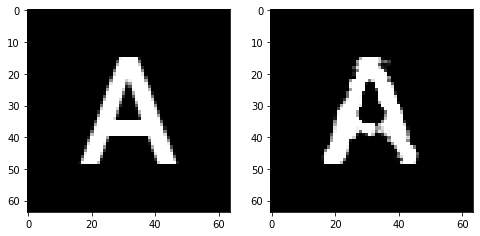

Epoch 99, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.567805290222168, Loss SSIM 2.071072280406952, Loss Local 184.4787573814392


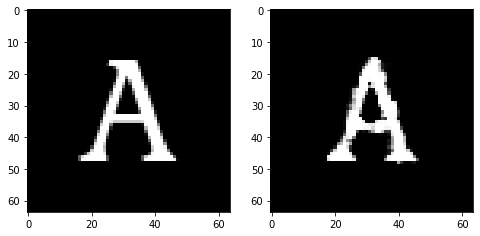

Epoch 99, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.548388633877039, Loss SSIM 2.0590174794197083, Loss Local 175.1625623703003


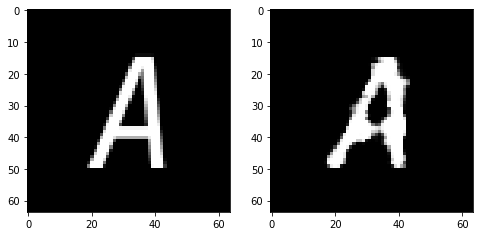

Epoch 100, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5577640384435654, Loss SSIM 2.0695314407348633, Loss Local 163.29001808166504


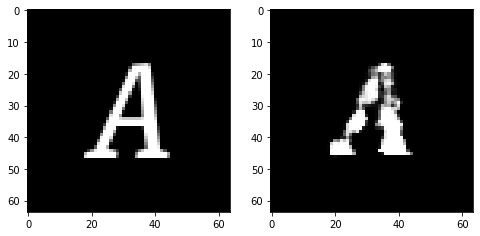

Epoch 100, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5238448344171047, Loss SSIM 1.9657095670700073, Loss Local 177.1139430999756


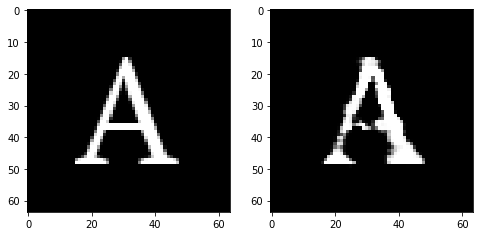

Epoch 100, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.564293958246708, Loss SSIM 2.090977370738983, Loss Local 173.69436359405518


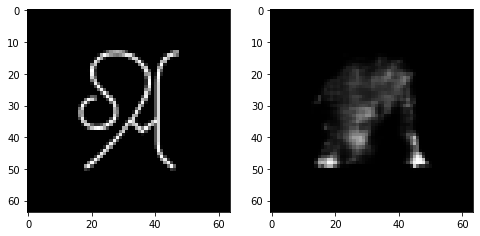

Epoch 100, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5306370258331299, Loss SSIM 2.005077600479126, Loss Local 167.51731061935425


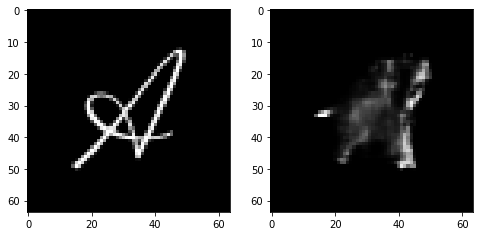

Epoch 100, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5777186155319214, Loss SSIM 2.052070200443268, Loss Local 183.96467542648315


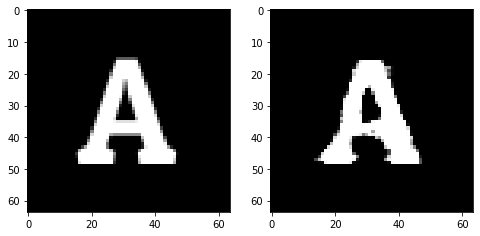

Epoch 100, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.59336207062006, Loss SSIM 2.1136985421180725, Loss Local 178.3223271369934


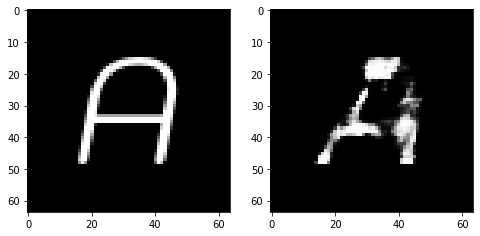

Epoch 100, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.545080479234457, Loss SSIM 1.9912393689155579, Loss Local 168.76833963394165


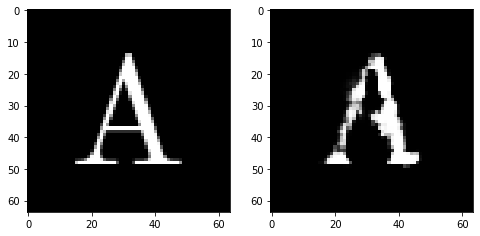

Epoch 101, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5963880121707916, Loss SSIM 2.090503752231598, Loss Local 173.65034437179565


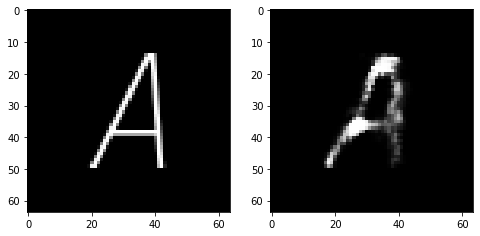

Epoch 101, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6098335683345795, Loss SSIM 2.1464784741401672, Loss Local 186.1163911819458


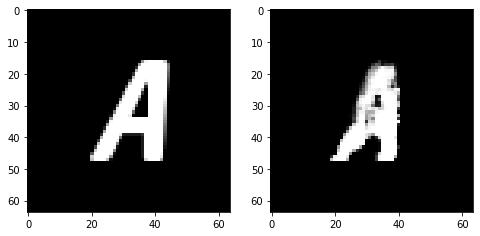

Epoch 101, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.529709830880165, Loss SSIM 1.96577650308609, Loss Local 171.27705669403076


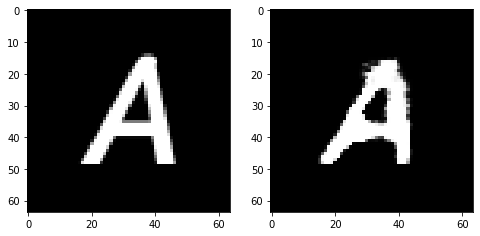

Epoch 101, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5171246081590652, Loss SSIM 1.9518506526947021, Loss Local 169.11658811569214


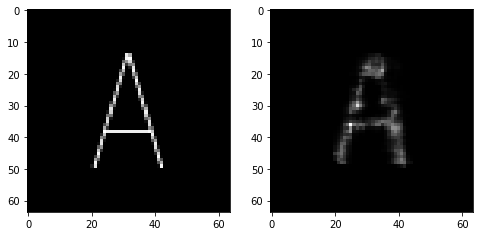

Epoch 101, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5803441517055035, Loss SSIM 2.117920935153961, Loss Local 171.9204707145691


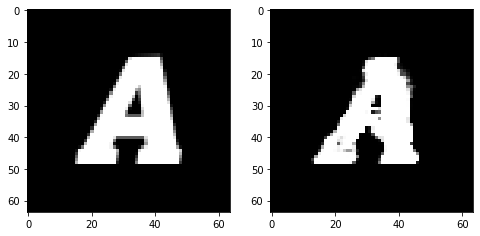

Epoch 101, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5369382910430431, Loss SSIM 1.985688328742981, Loss Local 175.46832370758057


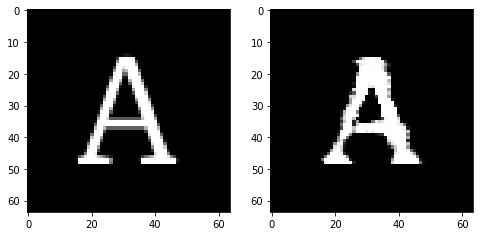

Epoch 101, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5260881781578064, Loss SSIM 2.0022338032722473, Loss Local 177.00939083099365


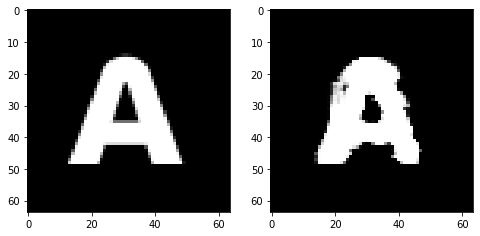

Epoch 102, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5538486763834953, Loss SSIM 2.036830484867096, Loss Local 167.12903690338135


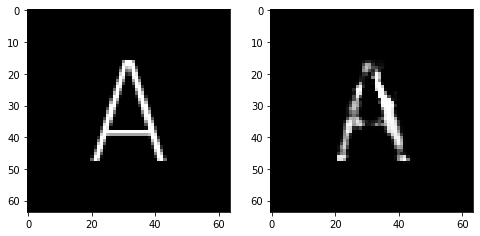

Epoch 102, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5742599479854107, Loss SSIM 2.058605134487152, Loss Local 175.24380493164062


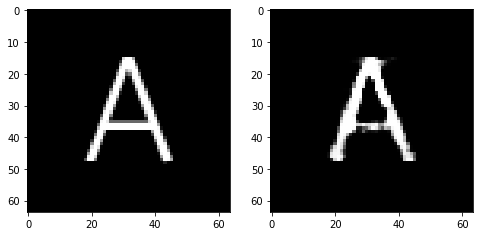

Epoch 102, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5177122466266155, Loss SSIM 1.955338954925537, Loss Local 169.93336534500122


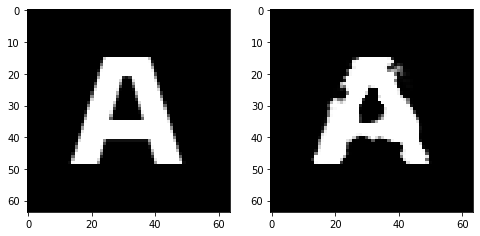

Epoch 102, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.565661195665598, Loss SSIM 2.0759711861610413, Loss Local 173.20041799545288


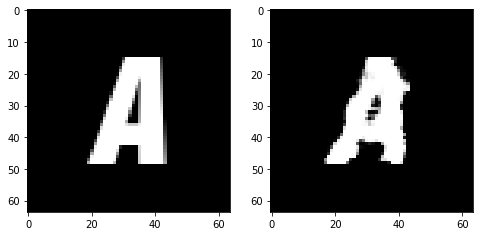

Epoch 102, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.605616059154272, Loss SSIM 2.0935720801353455, Loss Local 180.9723358154297


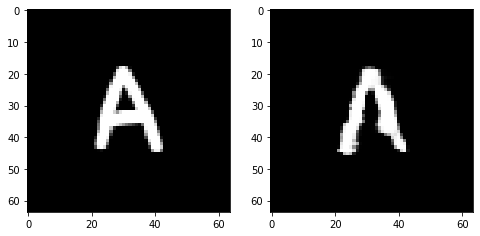

Epoch 102, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5514737702906132, Loss SSIM 2.042483866214752, Loss Local 172.54018640518188


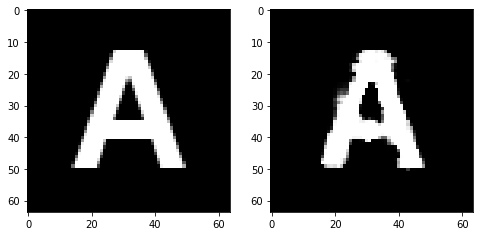

Epoch 102, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5724552758038044, Loss SSIM 2.1046003699302673, Loss Local 174.51323413848877


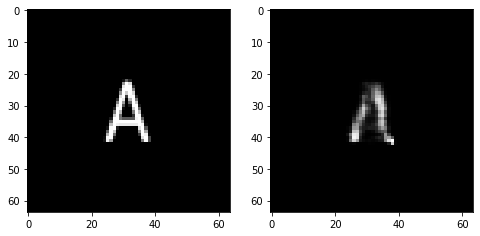

Epoch 103, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4932588450610638, Loss SSIM 1.9002198576927185, Loss Local 165.36192750930786


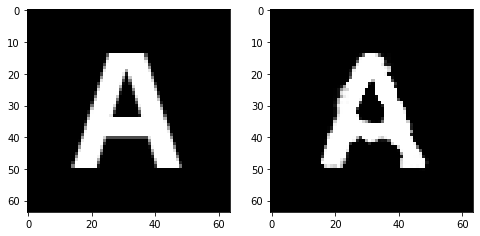

Epoch 103, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5235769599676132, Loss SSIM 1.979397177696228, Loss Local 173.5721616744995


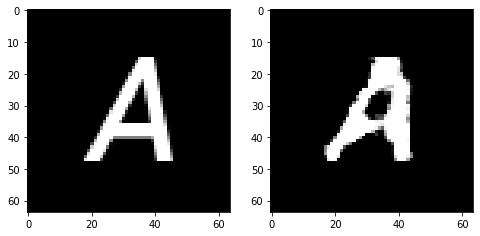

Epoch 103, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.61262072250247, Loss SSIM 2.157042443752289, Loss Local 184.5248155593872


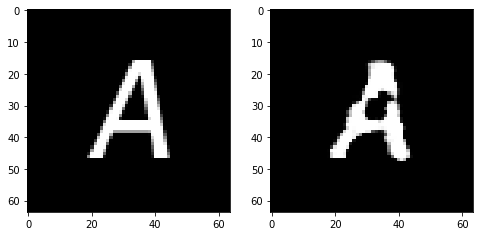

Epoch 103, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5454359166324139, Loss SSIM 2.026808738708496, Loss Local 184.74597549438477


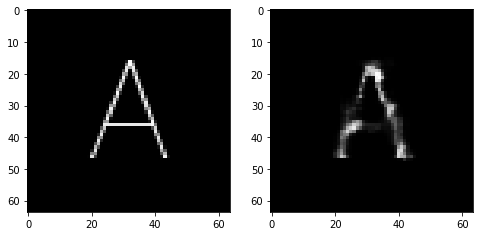

Epoch 103, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5425736717879772, Loss SSIM 2.01524555683136, Loss Local 172.23300504684448


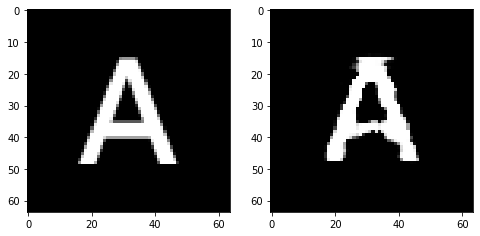

Epoch 103, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.57566112652421, Loss SSIM 2.0644046664237976, Loss Local 181.00385570526123


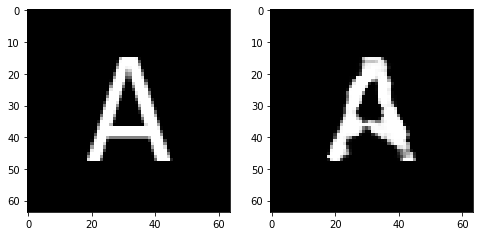

Epoch 103, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.599374059587717, Loss SSIM 2.1234408020973206, Loss Local 177.8780026435852


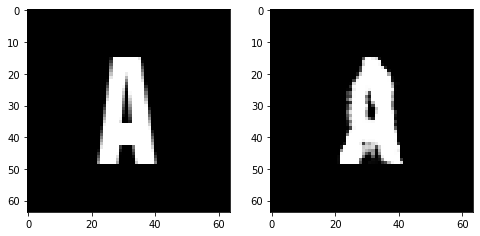

Epoch 104, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5931897647678852, Loss SSIM 2.0767372250556946, Loss Local 169.62022304534912


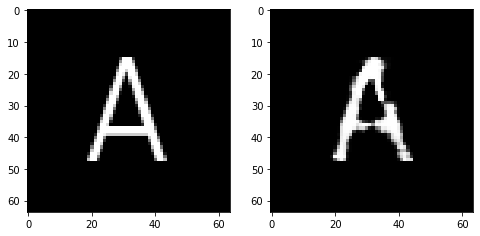

Epoch 104, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5105222202837467, Loss SSIM 1.9605067372322083, Loss Local 174.5124340057373


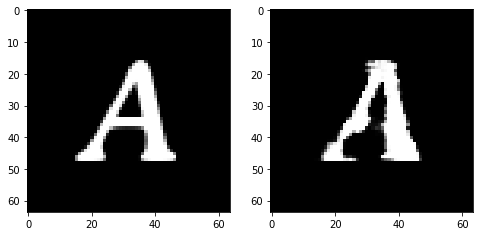

Epoch 104, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5997803658246994, Loss SSIM 2.1084079146385193, Loss Local 180.54819011688232


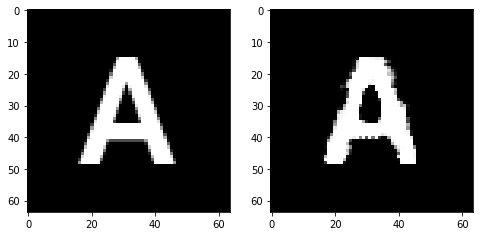

Epoch 104, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5341867059469223, Loss SSIM 1.9721845388412476, Loss Local 167.361896276474


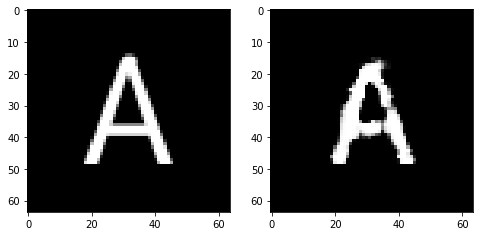

Epoch 104, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5358324088156223, Loss SSIM 2.036624491214752, Loss Local 170.34501123428345


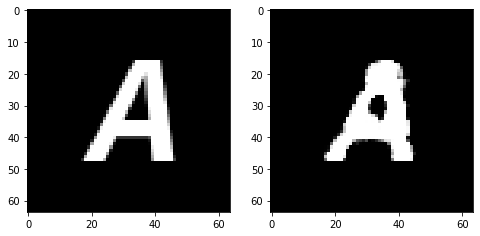

Epoch 104, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5430761985480785, Loss SSIM 2.055159568786621, Loss Local 174.35444116592407


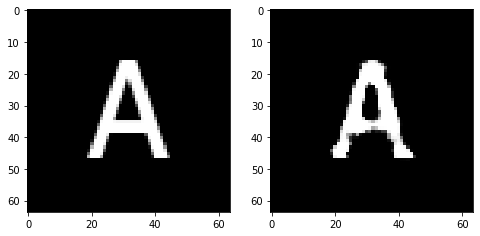

Epoch 104, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5545166321098804, Loss SSIM 2.0189578533172607, Loss Local 166.39148330688477


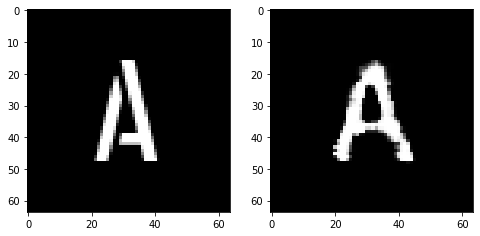

Epoch 105, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5588938258588314, Loss SSIM 2.013927459716797, Loss Local 175.1251425743103


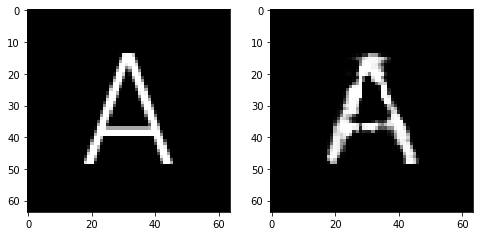

Epoch 105, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5750630758702755, Loss SSIM 2.092334806919098, Loss Local 171.14638137817383


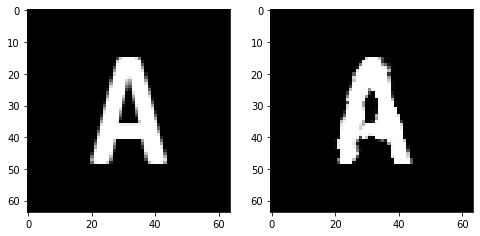

Epoch 105, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5512095130980015, Loss SSIM 2.029399335384369, Loss Local 179.24803638458252


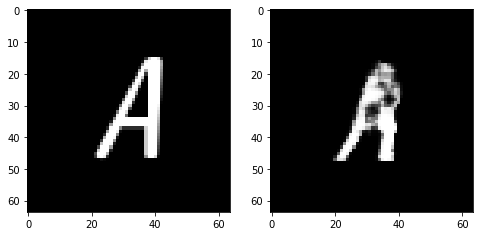

Epoch 105, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5338086262345314, Loss SSIM 2.0245527029037476, Loss Local 168.7327013015747


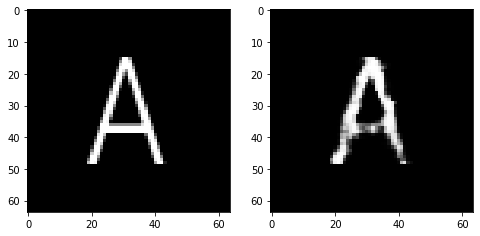

Epoch 105, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5394663587212563, Loss SSIM 2.009341835975647, Loss Local 163.37532091140747


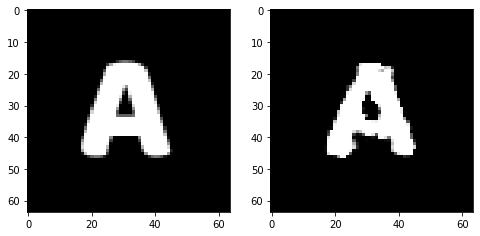

Epoch 105, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6020611338317394, Loss SSIM 2.0503492951393127, Loss Local 176.58120918273926


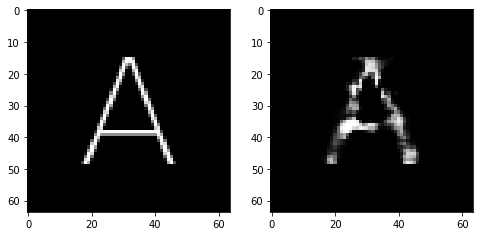

Epoch 105, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5680713467299938, Loss SSIM 2.05112761259079, Loss Local 168.26250839233398


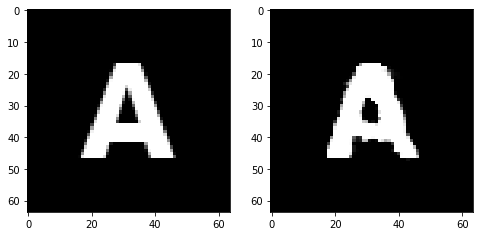

Epoch 106, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5719619058072567, Loss SSIM 2.0683419704437256, Loss Local 188.9410433769226


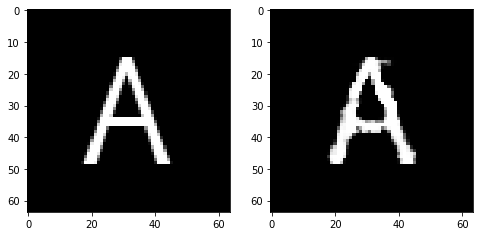

Epoch 106, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5273969694972038, Loss SSIM 2.0172991156578064, Loss Local 164.77929639816284


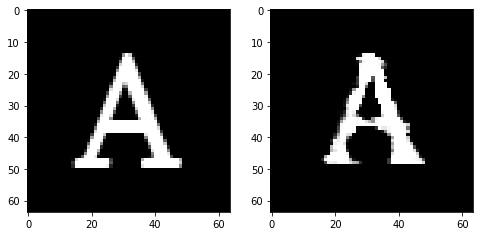

Epoch 106, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5755533874034882, Loss SSIM 2.0797025561332703, Loss Local 175.79387426376343


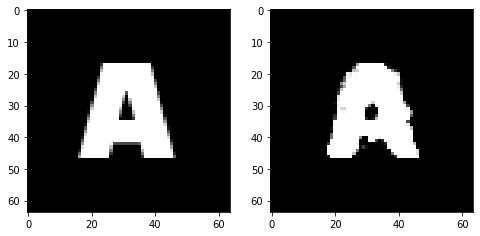

Epoch 106, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5106668397784233, Loss SSIM 1.9169126152992249, Loss Local 175.714515209198


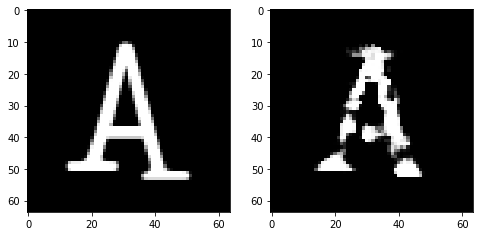

Epoch 106, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5924921669065952, Loss SSIM 2.075295925140381, Loss Local 178.7500705718994


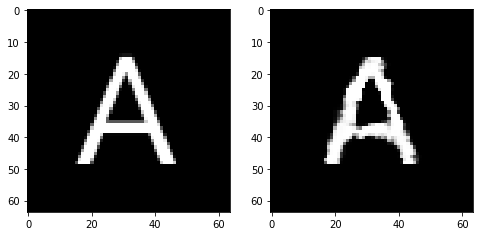

Epoch 106, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.515246257185936, Loss SSIM 1.938729703426361, Loss Local 176.40423011779785


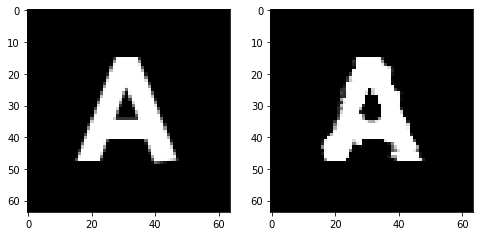

Epoch 106, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.603064388036728, Loss SSIM 2.1735342144966125, Loss Local 173.83221340179443


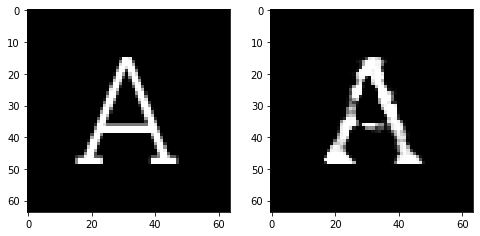

Epoch 107, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5280114077031612, Loss SSIM 1.988215148448944, Loss Local 177.5972990989685


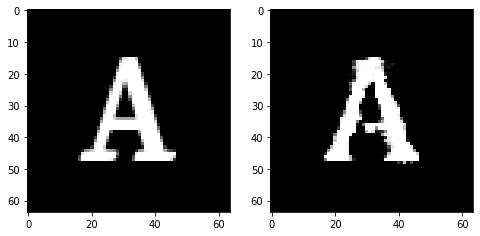

Epoch 107, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5625353939831257, Loss SSIM 2.045833170413971, Loss Local 164.06678199768066


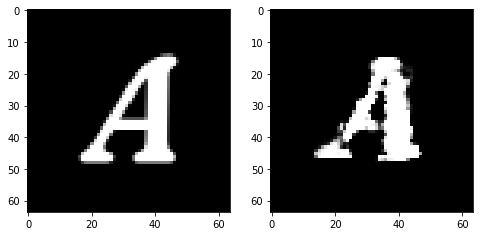

Epoch 107, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.600483477115631, Loss SSIM 2.1099554896354675, Loss Local 179.6797022819519


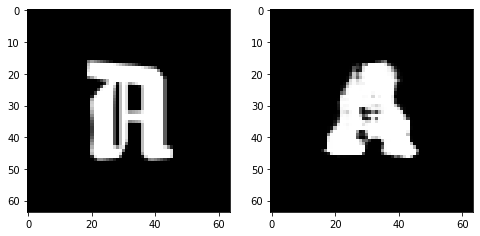

Epoch 107, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5465219393372536, Loss SSIM 2.0347536206245422, Loss Local 175.9119358062744


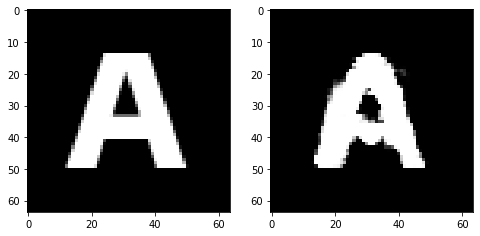

Epoch 107, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5587554797530174, Loss SSIM 1.9973465204238892, Loss Local 176.18212413787842


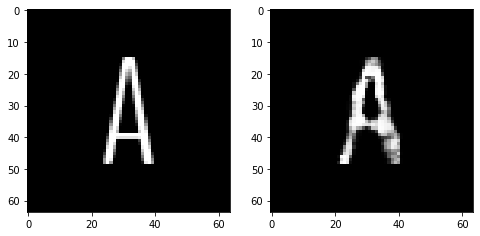

Epoch 107, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5381279215216637, Loss SSIM 1.9790852665901184, Loss Local 164.95189714431763


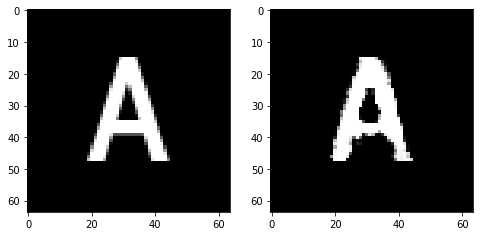

Epoch 107, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5425954684615135, Loss SSIM 2.044808864593506, Loss Local 165.85626435279846


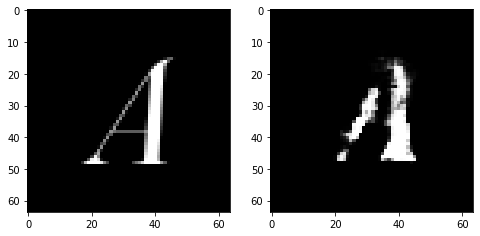

Epoch 108, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5369785763323307, Loss SSIM 1.9851949214935303, Loss Local 178.92398166656494


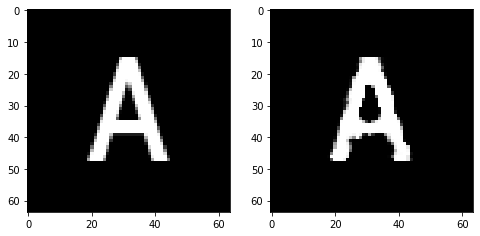

Epoch 108, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6171951070427895, Loss SSIM 2.155347764492035, Loss Local 181.90170288085938


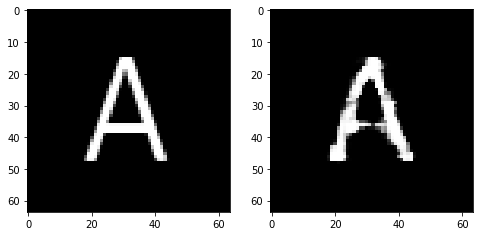

Epoch 108, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6089257635176182, Loss SSIM 2.115987181663513, Loss Local 181.9035530090332


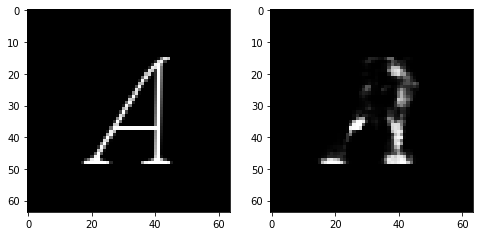

Epoch 108, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5227717980742455, Loss SSIM 1.9730202555656433, Loss Local 174.77040195465088


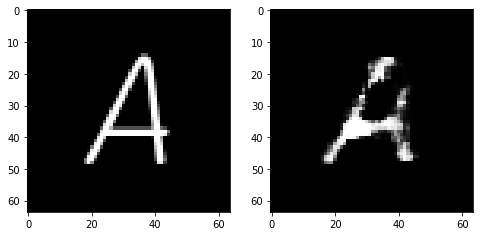

Epoch 108, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5610758773982525, Loss SSIM 2.0698790550231934, Loss Local 166.08088064193726


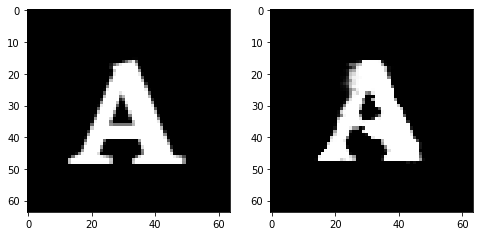

Epoch 108, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.527762908488512, Loss SSIM 1.992577850818634, Loss Local 170.94868183135986


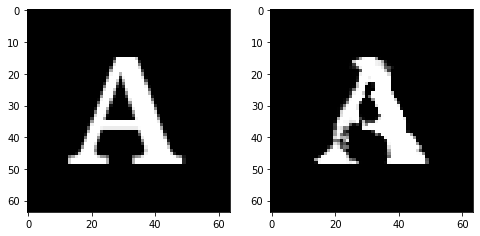

Epoch 108, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5176913551986217, Loss SSIM 1.9800087213516235, Loss Local 170.80599737167358


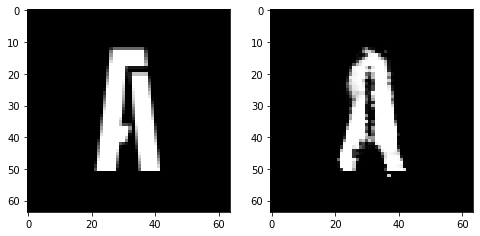

Epoch 109, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5502845086157322, Loss SSIM 1.9949190616607666, Loss Local 175.90352249145508


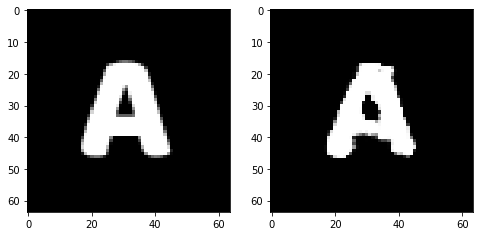

Epoch 109, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.526263602077961, Loss SSIM 1.9829436540603638, Loss Local 173.8940930366516


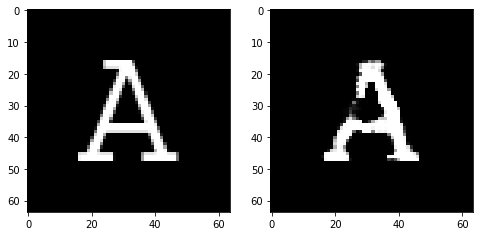

Epoch 109, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5858862213790417, Loss SSIM 2.080800235271454, Loss Local 179.71863508224487


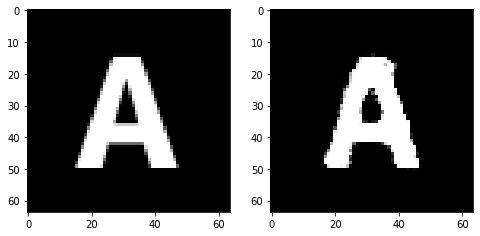

Epoch 109, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5499102100729942, Loss SSIM 2.009235680103302, Loss Local 171.3512568473816


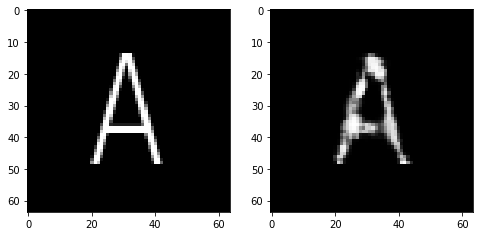

Epoch 109, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.539681538939476, Loss SSIM 1.9868298172950745, Loss Local 171.01272249221802


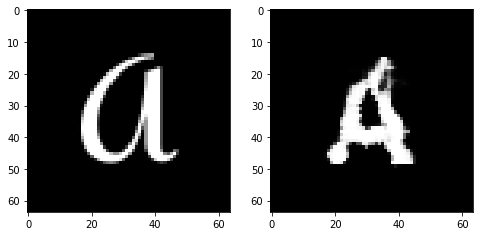

Epoch 109, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5669189803302288, Loss SSIM 2.091034173965454, Loss Local 177.63853693008423


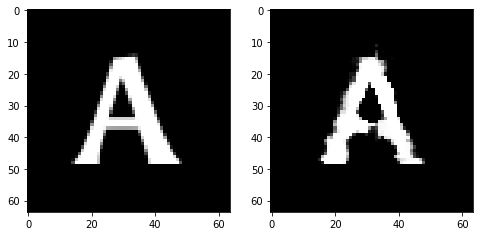

Epoch 109, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5770493410527706, Loss SSIM 2.0921274423599243, Loss Local 174.5428342819214


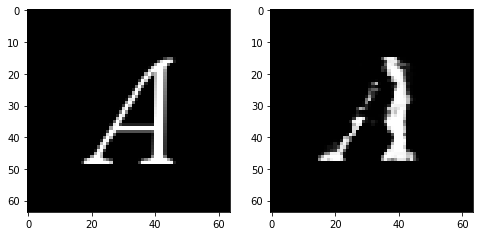

Epoch 110, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5473336391150951, Loss SSIM 2.0574023723602295, Loss Local 167.19407272338867


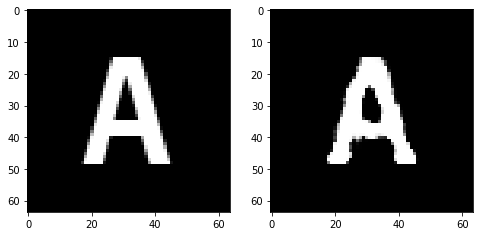

Epoch 110, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5481094904243946, Loss SSIM 2.023945391178131, Loss Local 162.1706714630127


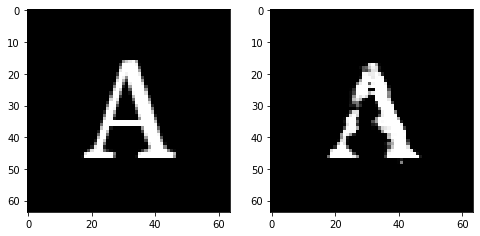

Epoch 110, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5526874922215939, Loss SSIM 2.016796350479126, Loss Local 169.63580560684204


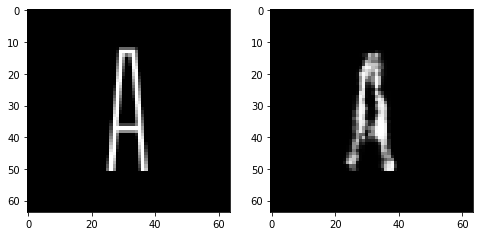

Epoch 110, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.566126074641943, Loss SSIM 2.0129358172416687, Loss Local 183.10639762878418


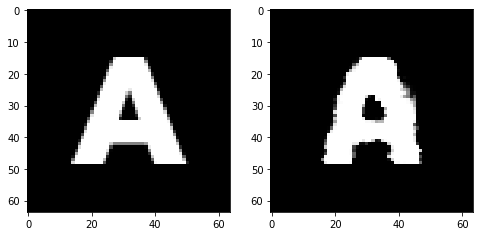

Epoch 110, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5923134721815586, Loss SSIM 2.0854114294052124, Loss Local 176.4677038192749


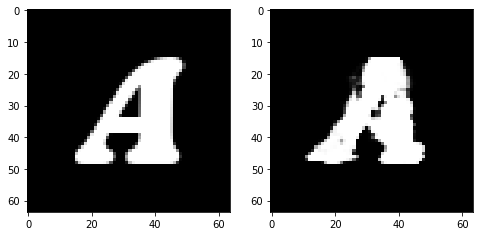

Epoch 110, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5744501911103725, Loss SSIM 2.093439996242523, Loss Local 170.76593136787415


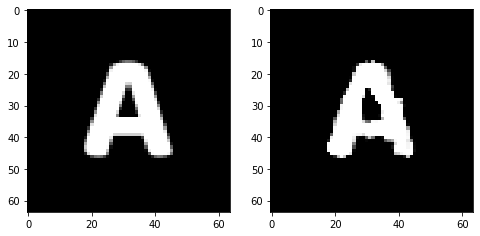

Epoch 110, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5016317926347256, Loss SSIM 1.9417507648468018, Loss Local 167.32742738723755


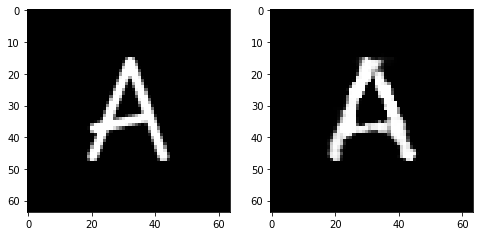

Epoch 111, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5518376789987087, Loss SSIM 2.025224804878235, Loss Local 171.592618227005


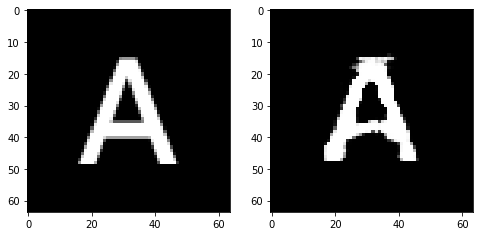

Epoch 111, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5302572958171368, Loss SSIM 1.9945817589759827, Loss Local 172.49271059036255


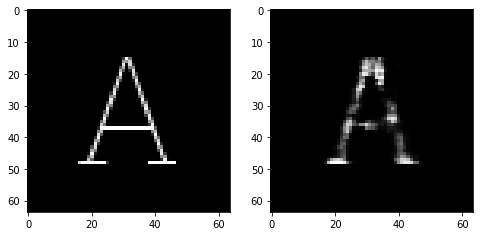

Epoch 111, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5565312691032887, Loss SSIM 2.0270130038261414, Loss Local 177.32151460647583


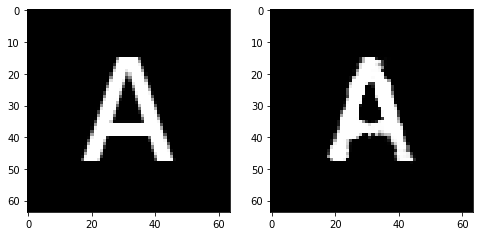

Epoch 111, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.53203184902668, Loss SSIM 1.992711067199707, Loss Local 165.10923147201538


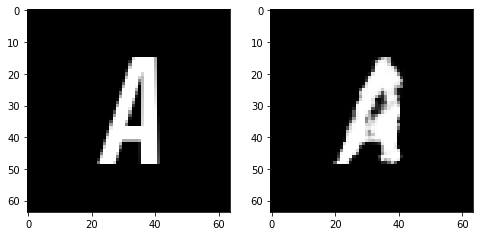

Epoch 111, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5946234352886677, Loss SSIM 2.067680597305298, Loss Local 175.5721297264099


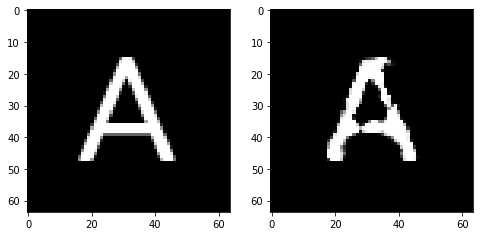

Epoch 111, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5341252461075783, Loss SSIM 2.0332998037338257, Loss Local 180.01263856887817


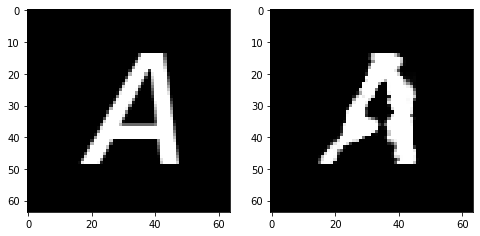

Epoch 111, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5684119537472725, Loss SSIM 2.0712168216705322, Loss Local 173.0237421989441


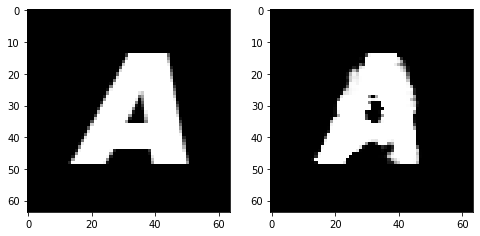

Epoch 112, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.519944466650486, Loss SSIM 1.9962523579597473, Loss Local 163.71807956695557


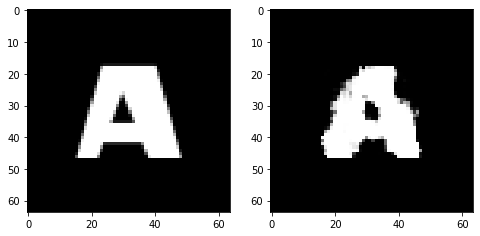

Epoch 112, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.56444738432765, Loss SSIM 2.0187670588493347, Loss Local 177.34755659103394


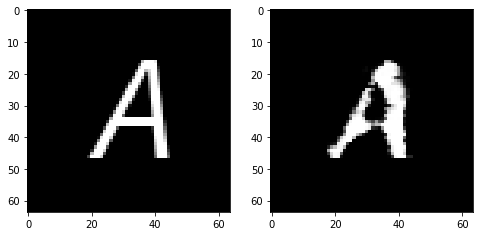

Epoch 112, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.548457220196724, Loss SSIM 2.028213083744049, Loss Local 170.0286717414856


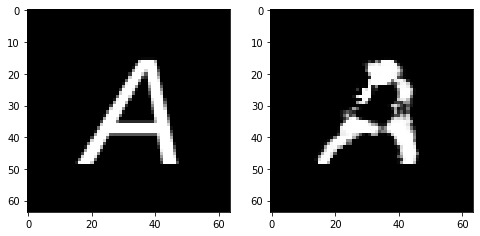

Epoch 112, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5703372620046139, Loss SSIM 2.0820621848106384, Loss Local 168.49221992492676


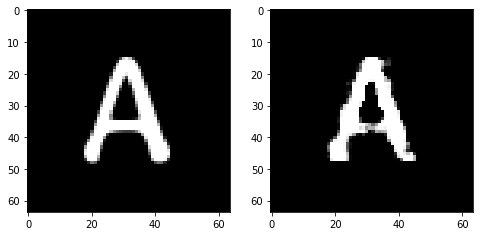

Epoch 112, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5892739668488503, Loss SSIM 2.074399769306183, Loss Local 171.04556226730347


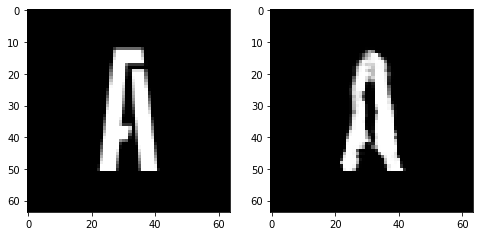

Epoch 112, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5341559574007988, Loss SSIM 1.998795747756958, Loss Local 169.90727043151855


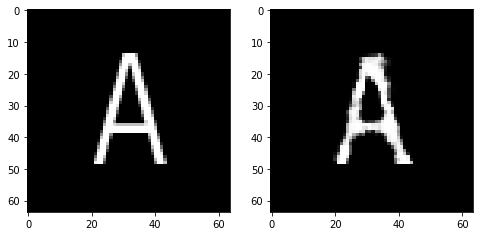

Epoch 112, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5576247312128544, Loss SSIM 2.0794853568077087, Loss Local 172.39756846427917


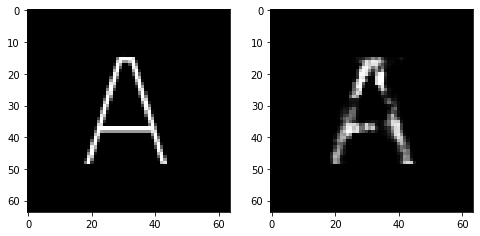

Epoch 113, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.55948156863451, Loss SSIM 2.0210996866226196, Loss Local 170.26282358169556


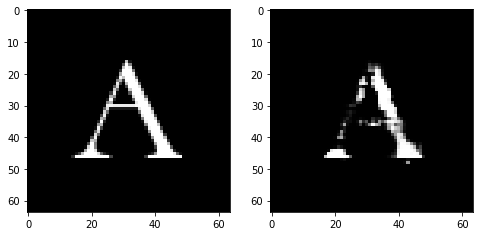

Epoch 113, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5143837481737137, Loss SSIM 1.9933329224586487, Loss Local 162.9560694694519


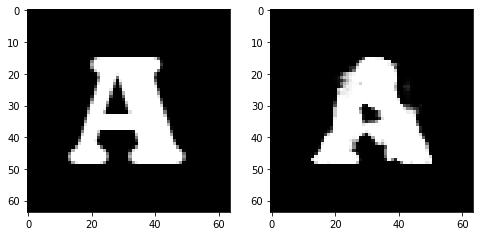

Epoch 113, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5521053820848465, Loss SSIM 2.046586751937866, Loss Local 171.13488817214966


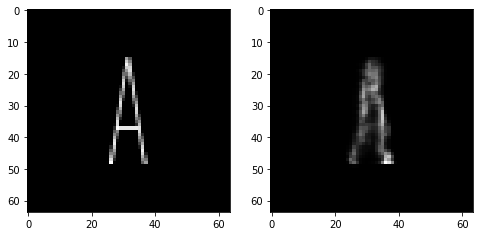

Epoch 113, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.56200585141778, Loss SSIM 2.0249412655830383, Loss Local 180.74590969085693


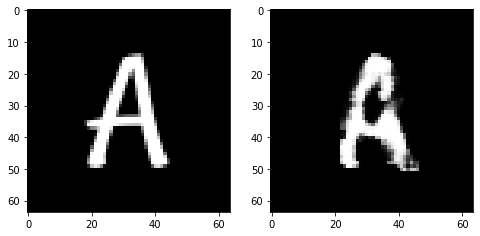

Epoch 113, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5940388701856136, Loss SSIM 2.1584076285362244, Loss Local 184.08259773254395


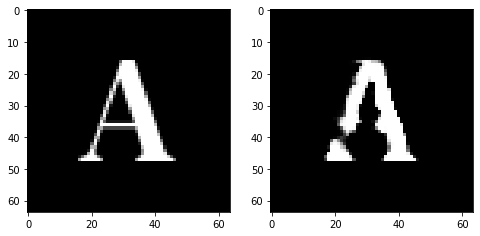

Epoch 113, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5559923648834229, Loss SSIM 2.0266051292419434, Loss Local 172.6109972000122


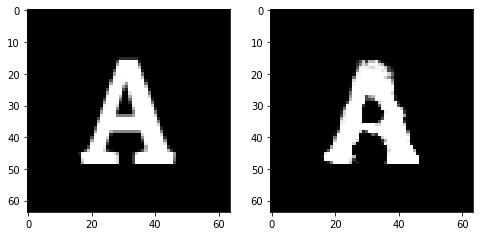

Epoch 113, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.561634786427021, Loss SSIM 2.0264705419540405, Loss Local 176.51278638839722


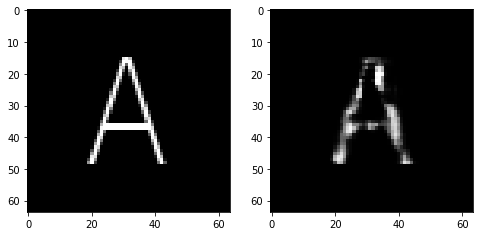

Epoch 114, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5493685938417912, Loss SSIM 2.041273295879364, Loss Local 159.78442907333374


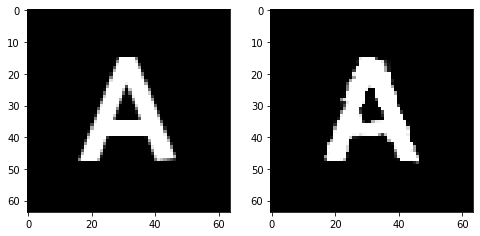

Epoch 114, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5970455706119537, Loss SSIM 2.1639451384544373, Loss Local 185.45283603668213


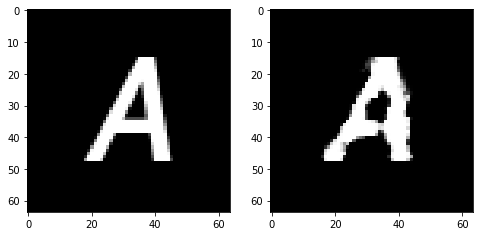

Epoch 114, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5385650806128979, Loss SSIM 1.9882805347442627, Loss Local 167.1770544052124


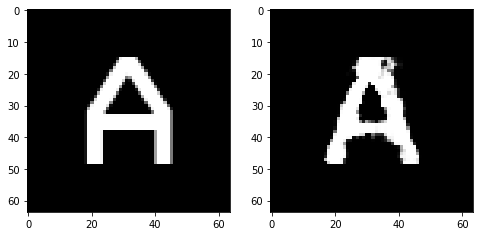

Epoch 114, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5640338696539402, Loss SSIM 2.0089151263237, Loss Local 183.11049127578735


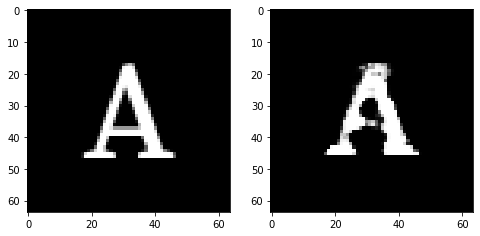

Epoch 114, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.584088772535324, Loss SSIM 2.0759891271591187, Loss Local 173.58034944534302


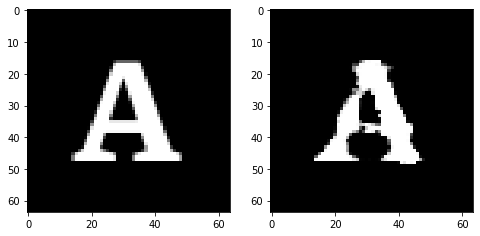

Epoch 114, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5271272547543049, Loss SSIM 2.0019052028656006, Loss Local 168.27978563308716


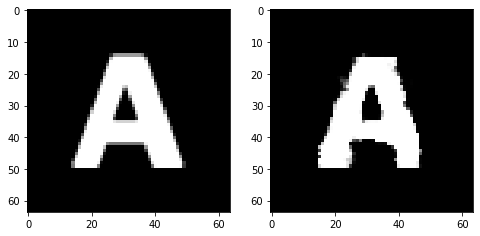

Epoch 114, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5241006314754486, Loss SSIM 1.99875807762146, Loss Local 175.56823015213013


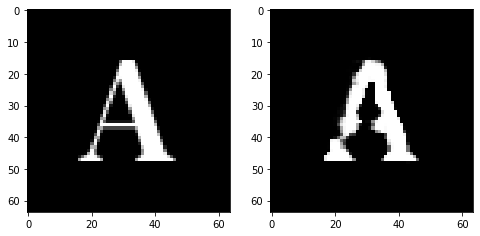

Epoch 115, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5264407061040401, Loss SSIM 1.981848657131195, Loss Local 176.79953336715698


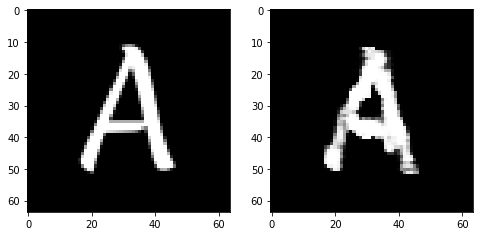

Epoch 115, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5400021821260452, Loss SSIM 2.0020411014556885, Loss Local 167.38114404678345


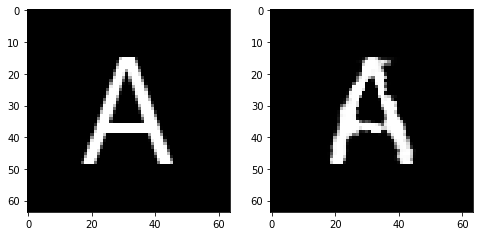

Epoch 115, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.579682532697916, Loss SSIM 2.0734723806381226, Loss Local 179.15003490447998


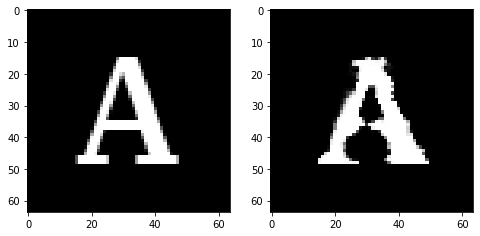

Epoch 115, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6043675616383553, Loss SSIM 2.1427343487739563, Loss Local 178.89227628707886


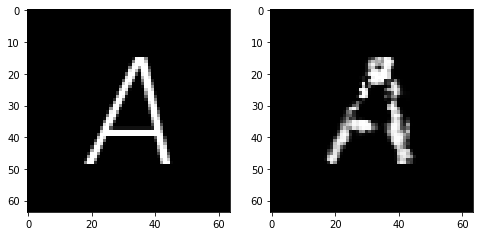

Epoch 115, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5180253311991692, Loss SSIM 1.9251857995986938, Loss Local 163.81506395339966


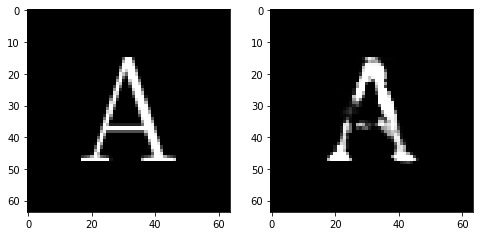

Epoch 115, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5270477198064327, Loss SSIM 1.9880669116973877, Loss Local 167.01845979690552


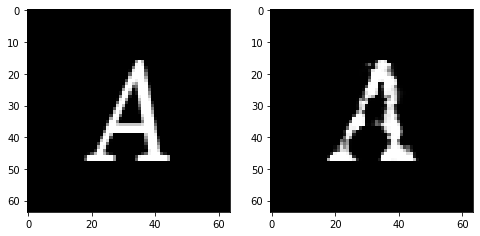

Epoch 115, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.544126071035862, Loss SSIM 2.020785391330719, Loss Local 174.6779007911682


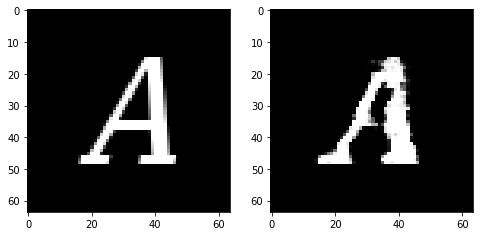

Epoch 116, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5901585146784782, Loss SSIM 2.0457552671432495, Loss Local 183.8516788482666


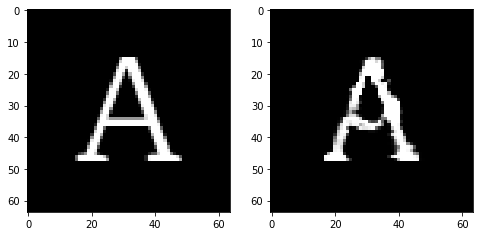

Epoch 116, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5566349849104881, Loss SSIM 1.9972385168075562, Loss Local 180.5000205039978


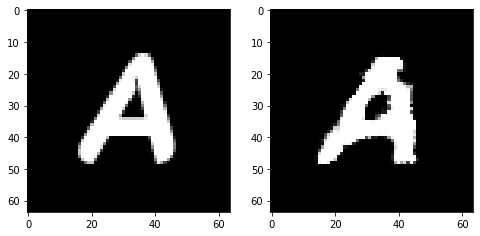

Epoch 116, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5684604309499264, Loss SSIM 2.0502893924713135, Loss Local 179.48685121536255


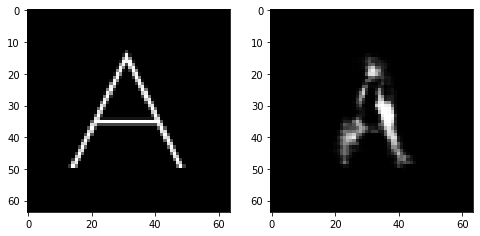

Epoch 116, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5298506654798985, Loss SSIM 1.9899647235870361, Loss Local 181.98690938949585


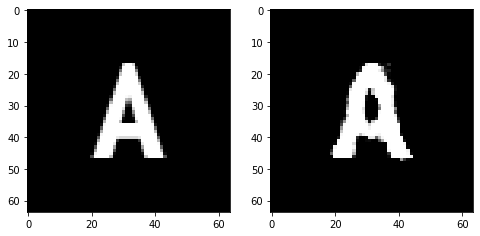

Epoch 116, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5536681897938251, Loss SSIM 2.043452560901642, Loss Local 179.53606796264648


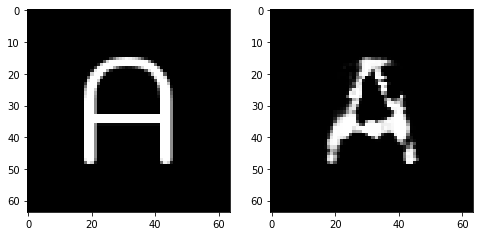

Epoch 116, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5022654458880424, Loss SSIM 2.0163087248802185, Loss Local 159.55033683776855


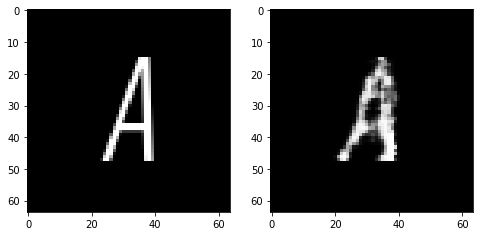

Epoch 116, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.573270209133625, Loss SSIM 2.084568679332733, Loss Local 172.61141300201416


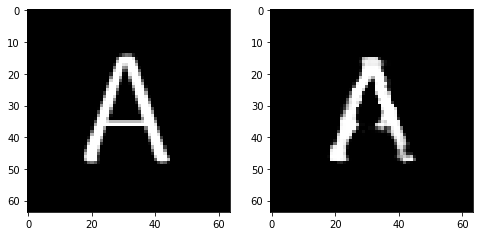

Epoch 117, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5651019774377346, Loss SSIM 2.0290520191192627, Loss Local 181.11110067367554


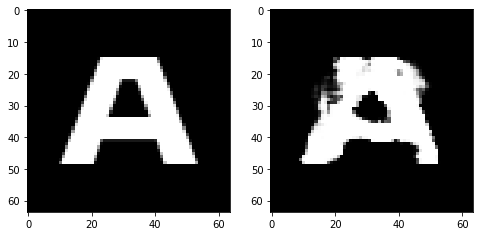

Epoch 117, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.567777194082737, Loss SSIM 2.057375133037567, Loss Local 171.97274494171143


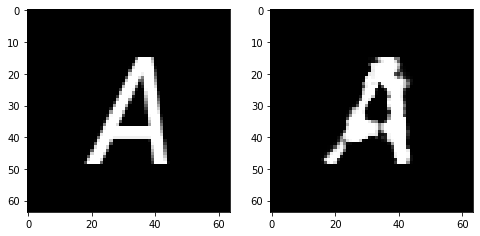

Epoch 117, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6130670458078384, Loss SSIM 2.114714801311493, Loss Local 183.65802240371704


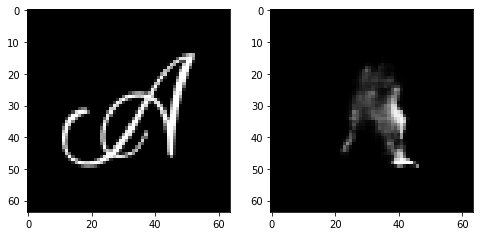

Epoch 117, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5016513168811798, Loss SSIM 1.9817650318145752, Loss Local 172.97953176498413


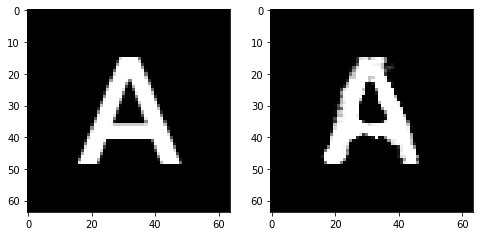

Epoch 117, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5010078512132168, Loss SSIM 1.9392123222351074, Loss Local 169.57883071899414


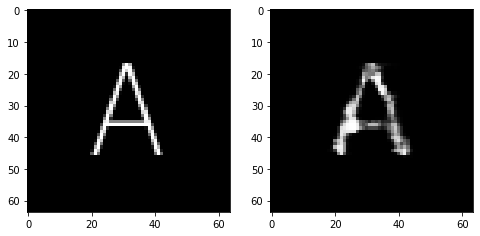

Epoch 117, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5327660106122494, Loss SSIM 2.0149205327033997, Loss Local 172.0189824104309


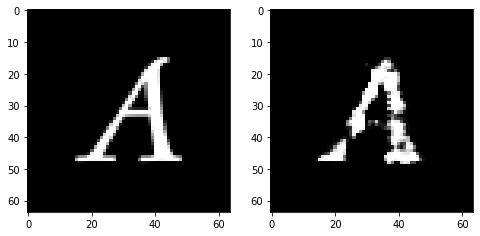

Epoch 117, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6132795959711075, Loss SSIM 2.132364511489868, Loss Local 177.3188977241516


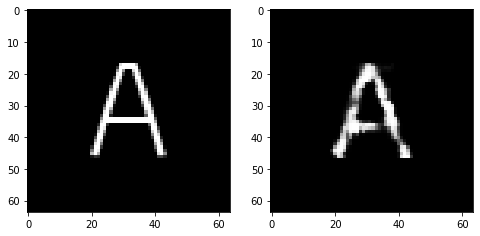

Epoch 118, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5271069929003716, Loss SSIM 1.970557451248169, Loss Local 170.01161766052246


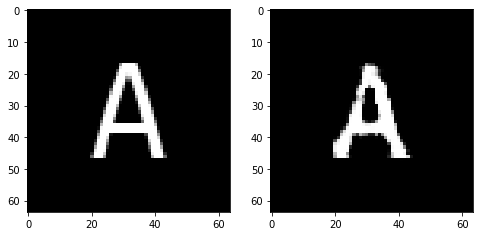

Epoch 118, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5854722894728184, Loss SSIM 2.0720810294151306, Loss Local 168.53631496429443


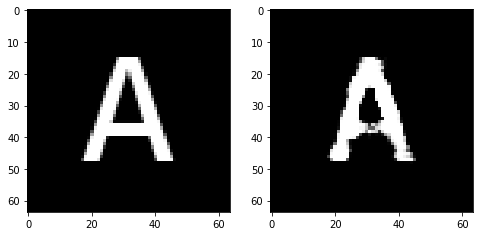

Epoch 118, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5397978760302067, Loss SSIM 2.048283100128174, Loss Local 165.63083124160767


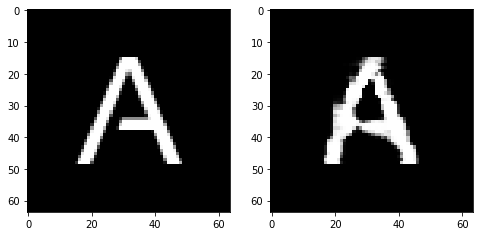

Epoch 118, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.568903662264347, Loss SSIM 2.0707420706748962, Loss Local 178.74630498886108


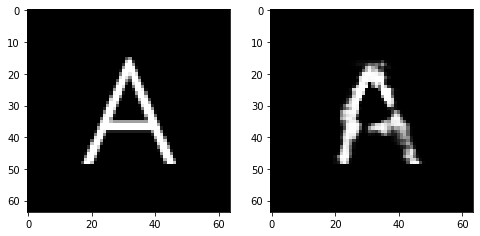

Epoch 118, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5950977504253387, Loss SSIM 2.0678733587265015, Loss Local 173.69911098480225


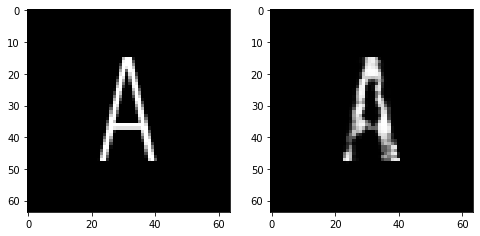

Epoch 118, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.543540745973587, Loss SSIM 2.054668664932251, Loss Local 168.70673942565918


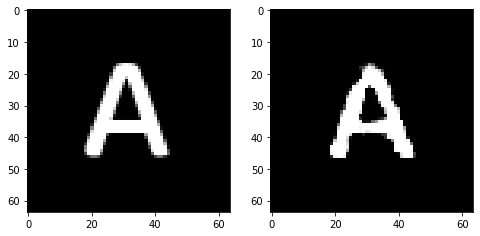

Epoch 118, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5455818250775337, Loss SSIM 2.02311909198761, Loss Local 171.04978847503662


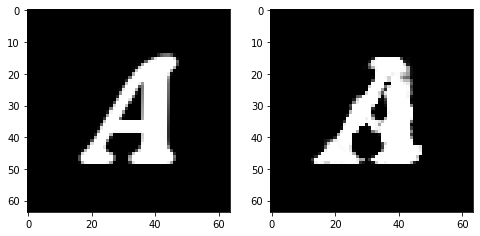

Epoch 119, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5420335717499256, Loss SSIM 2.0394526720046997, Loss Local 172.18786239624023


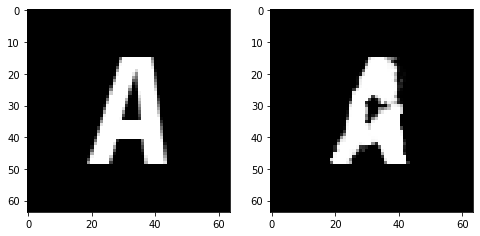

Epoch 119, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5315172038972378, Loss SSIM 1.9975340962409973, Loss Local 176.38898849487305


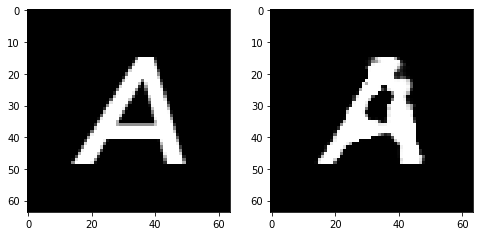

Epoch 119, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5274037010967731, Loss SSIM 2.0110756754875183, Loss Local 168.89796018600464


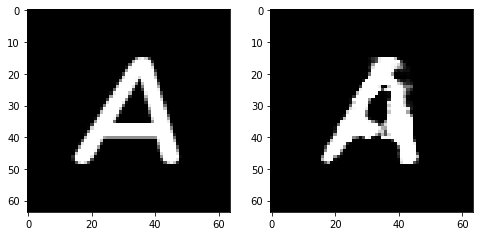

Epoch 119, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5430042669177055, Loss SSIM 2.0319612622261047, Loss Local 172.83855485916138


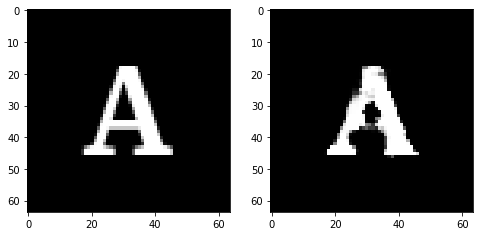

Epoch 119, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5646372735500336, Loss SSIM 2.0290398001670837, Loss Local 176.50927686691284


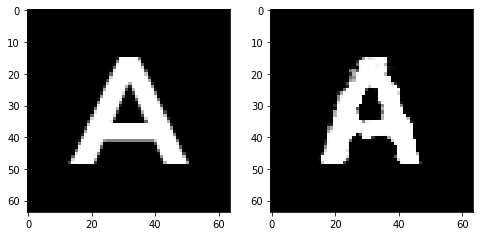

Epoch 119, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5306138060986996, Loss SSIM 1.9624537825584412, Loss Local 174.2435441017151


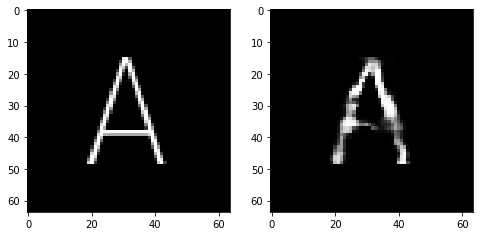

Epoch 119, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6099778451025486, Loss SSIM 2.1193066835403442, Loss Local 184.26368522644043


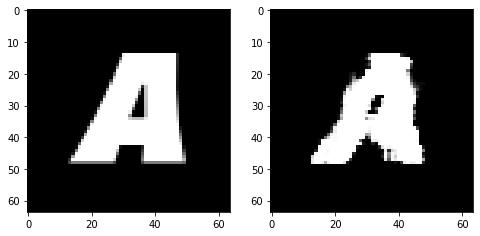

Epoch 120, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5091225765645504, Loss SSIM 1.9915619492530823, Loss Local 179.4443702697754


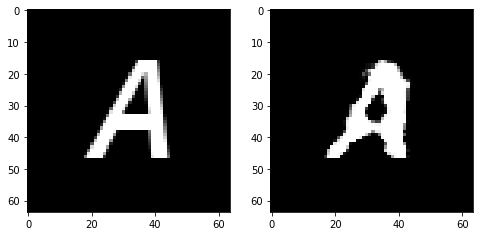

Epoch 120, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5915515199303627, Loss SSIM 2.090135157108307, Loss Local 179.11791276931763


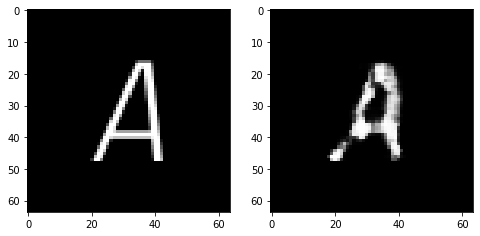

Epoch 120, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5534157305955887, Loss SSIM 2.0652538537979126, Loss Local 180.5255880355835


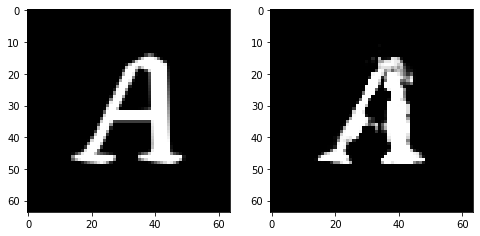

Epoch 120, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5564851686358452, Loss SSIM 2.029863953590393, Loss Local 167.41059494018555


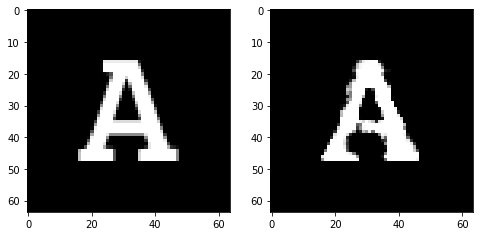

Epoch 120, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5526416935026646, Loss SSIM 2.0237263441085815, Loss Local 176.41364669799805


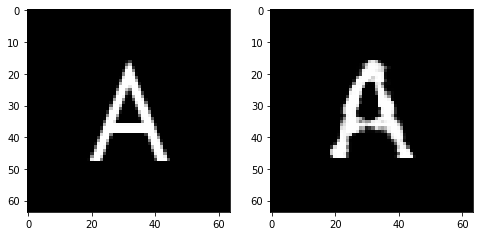

Epoch 120, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5703005939722061, Loss SSIM 2.073625087738037, Loss Local 177.76266622543335


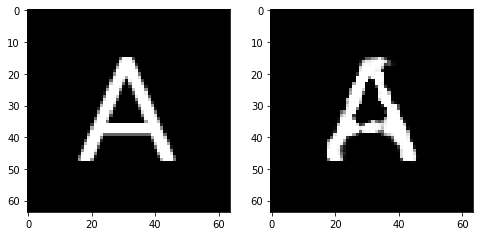

Epoch 120, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5447879545390606, Loss SSIM 2.010745048522949, Loss Local 176.30504989624023


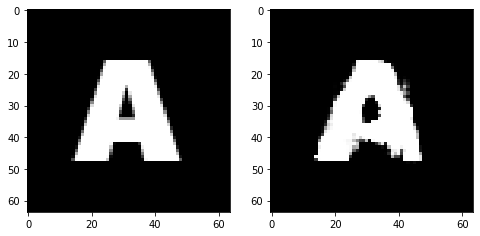

Epoch 121, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5784254781901836, Loss SSIM 2.0448012948036194, Loss Local 181.92784786224365


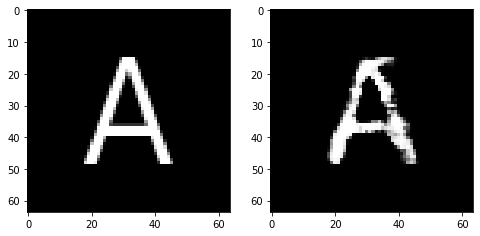

Epoch 121, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4932450242340565, Loss SSIM 1.9635499119758606, Loss Local 168.7201280593872


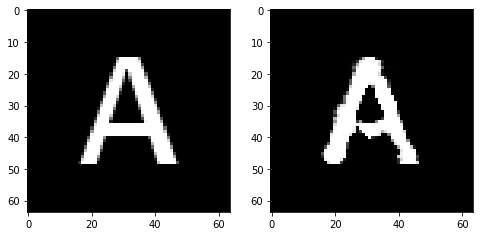

Epoch 121, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5620004013180733, Loss SSIM 2.0672112107276917, Loss Local 180.73195934295654


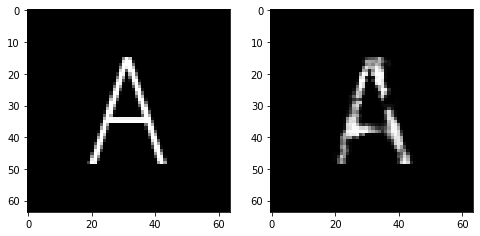

Epoch 121, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5363982059061527, Loss SSIM 1.9989972710609436, Loss Local 173.86125135421753


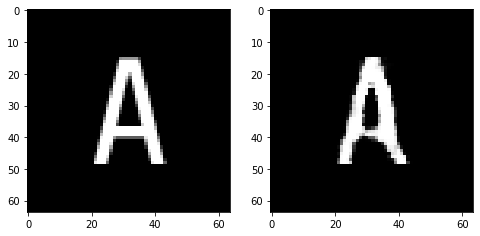

Epoch 121, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5666827075183392, Loss SSIM 2.0721890330314636, Loss Local 177.20677661895752


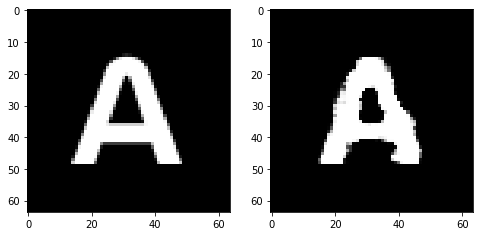

Epoch 121, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5825314410030842, Loss SSIM 2.0557928681373596, Loss Local 175.97011184692383


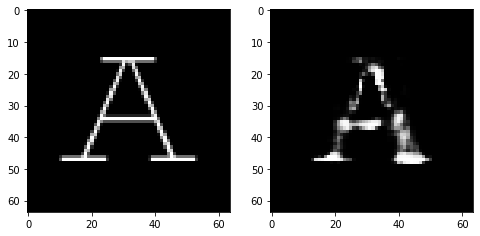

Epoch 121, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5594237484037876, Loss SSIM 2.036746561527252, Loss Local 177.1668210029602


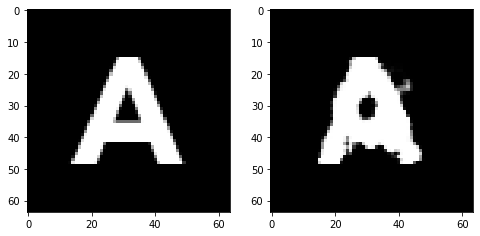

Epoch 122, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5683886297047138, Loss SSIM 2.0233301520347595, Loss Local 176.95267963409424


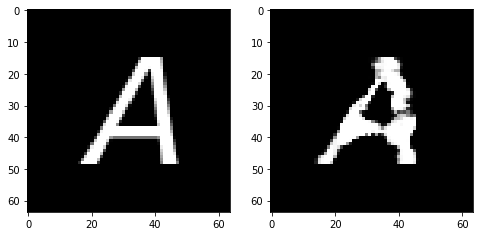

Epoch 122, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5678344294428825, Loss SSIM 2.075928032398224, Loss Local 178.73949098587036


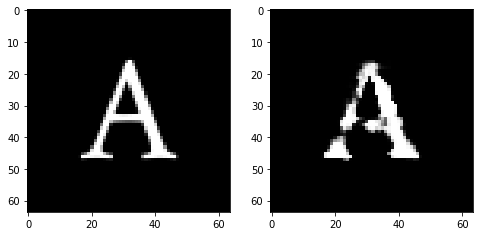

Epoch 122, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5517977699637413, Loss SSIM 2.058181941509247, Loss Local 166.72514295578003


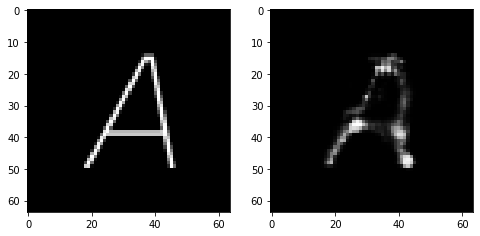

Epoch 122, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.575285866856575, Loss SSIM 2.069739878177643, Loss Local 173.56612586975098


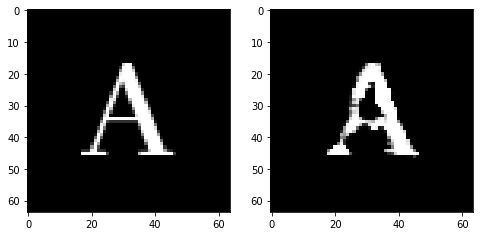

Epoch 122, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.536391668021679, Loss SSIM 1.9951607584953308, Loss Local 172.56937503814697


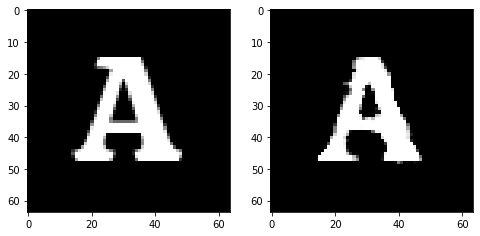

Epoch 122, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.542095847427845, Loss SSIM 1.9905238151550293, Loss Local 178.88913559913635


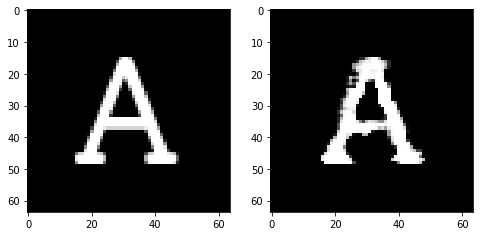

Epoch 122, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5458472780883312, Loss SSIM 2.026039719581604, Loss Local 174.04900741577148


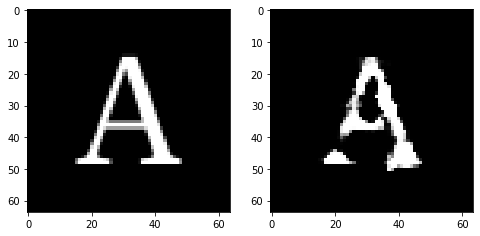

Epoch 123, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5919230952858925, Loss SSIM 2.128498673439026, Loss Local 179.72952890396118


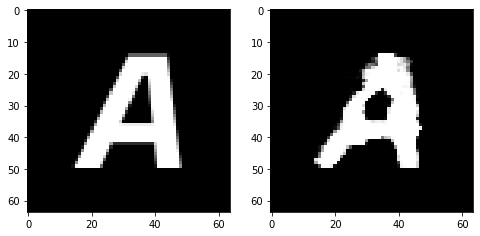

Epoch 123, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5084602981805801, Loss SSIM 1.9232285618782043, Loss Local 158.71234130859375


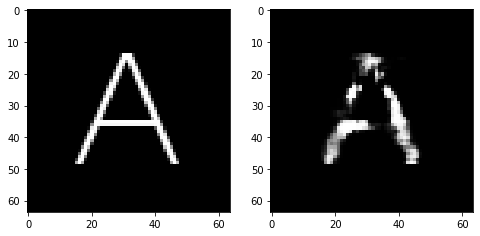

Epoch 123, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5242602303624153, Loss SSIM 1.9675650596618652, Loss Local 170.72509956359863


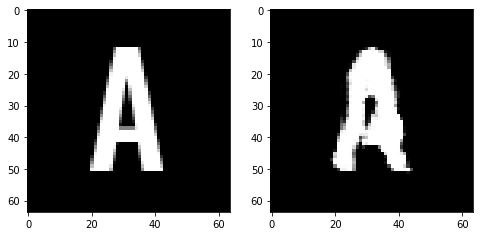

Epoch 123, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5852246582508087, Loss SSIM 2.039160370826721, Loss Local 174.30515336990356


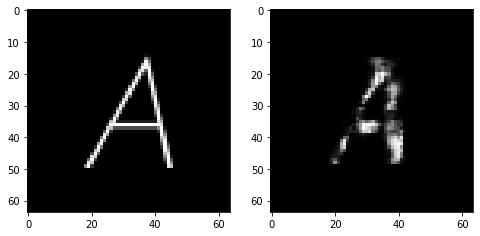

Epoch 123, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5496379733085632, Loss SSIM 2.0429991483688354, Loss Local 182.53236436843872


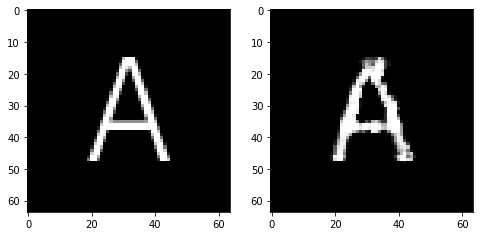

Epoch 123, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.543105598539114, Loss SSIM 2.0247443318367004, Loss Local 166.32126808166504


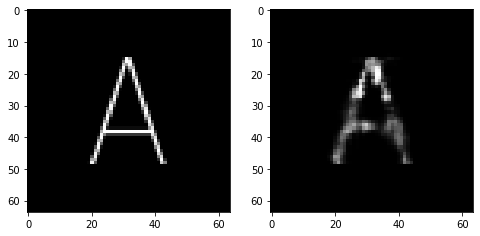

Epoch 123, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.593556884676218, Loss SSIM 2.1325913071632385, Loss Local 169.32928705215454


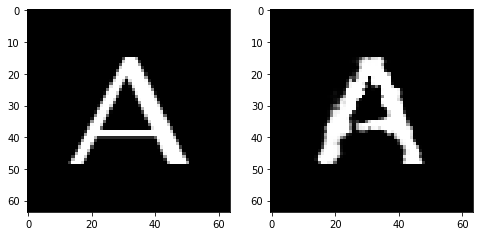

Epoch 124, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5314467512071133, Loss SSIM 2.008448839187622, Loss Local 174.69324111938477


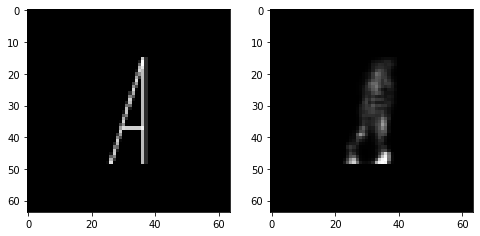

Epoch 124, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.581484042108059, Loss SSIM 2.0655094981193542, Loss Local 170.22612380981445


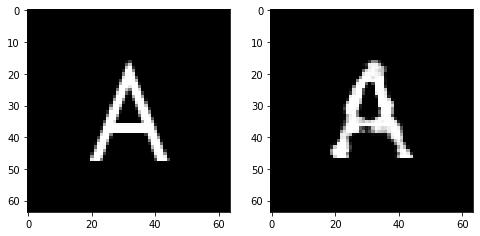

Epoch 124, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5059780068695545, Loss SSIM 1.9656385779380798, Loss Local 176.58965587615967


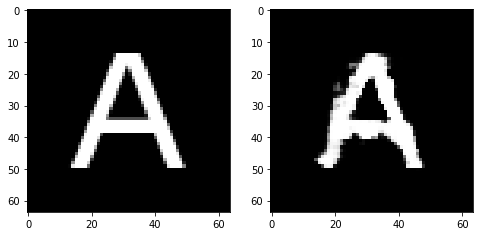

Epoch 124, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5518795438110828, Loss SSIM 2.0424994230270386, Loss Local 173.64076805114746


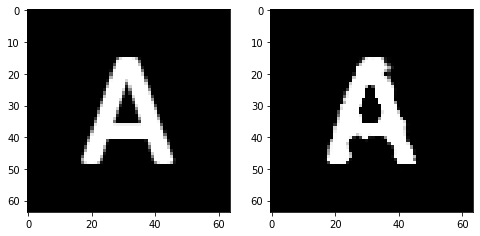

Epoch 124, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5604908727109432, Loss SSIM 2.008905827999115, Loss Local 186.3902006149292


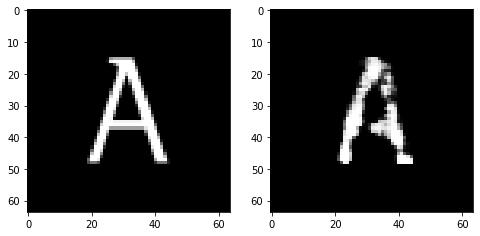

Epoch 124, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5812223702669144, Loss SSIM 2.101461708545685, Loss Local 181.45601511001587


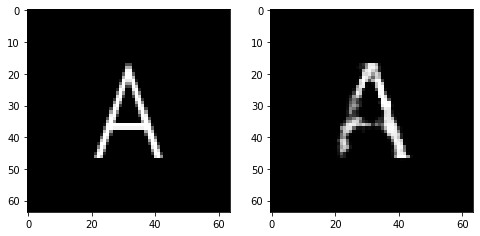

Epoch 124, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5710187405347824, Loss SSIM 2.0921796560287476, Loss Local 175.4392695426941


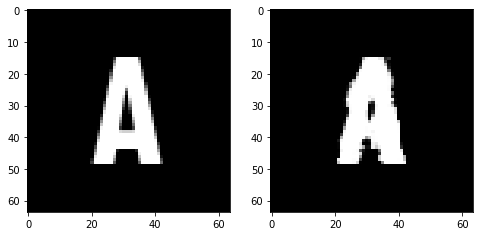

Epoch 125, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.502821195870638, Loss SSIM 1.9485082030296326, Loss Local 181.87842559814453


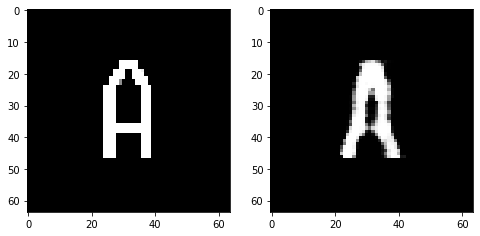

Epoch 125, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5838807485997677, Loss SSIM 2.0765233635902405, Loss Local 172.16990566253662


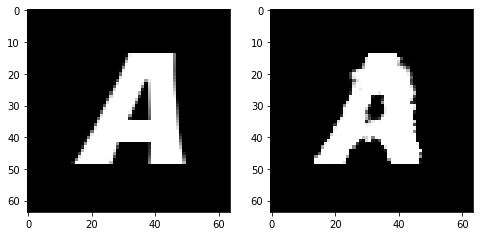

Epoch 125, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5494083985686302, Loss SSIM 2.0275811553001404, Loss Local 176.9994158744812


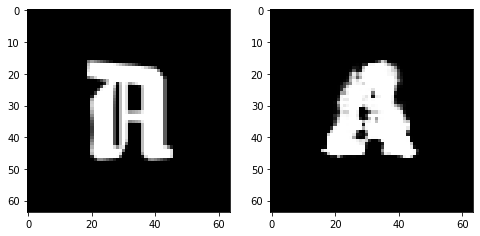

Epoch 125, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5311895906925201, Loss SSIM 2.008944094181061, Loss Local 177.0179705619812


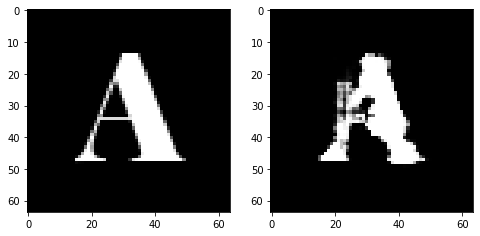

Epoch 125, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6271025203168392, Loss SSIM 2.2001858949661255, Loss Local 176.85679721832275


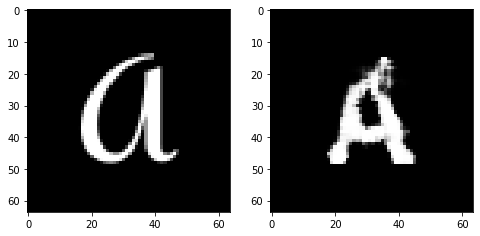

Epoch 125, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5555260330438614, Loss SSIM 2.0283077359199524, Loss Local 175.0557770729065


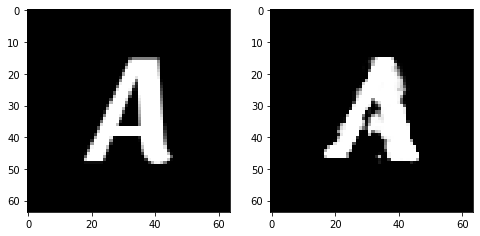

Epoch 125, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5385451093316078, Loss SSIM 2.0108097791671753, Loss Local 174.1260757446289


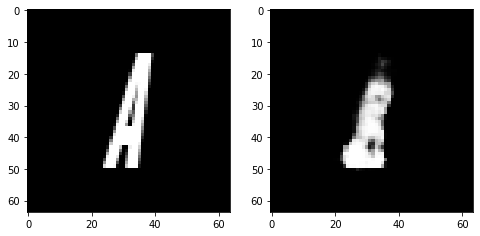

Epoch 126, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5943388789892197, Loss SSIM 2.098311483860016, Loss Local 170.07888269424438


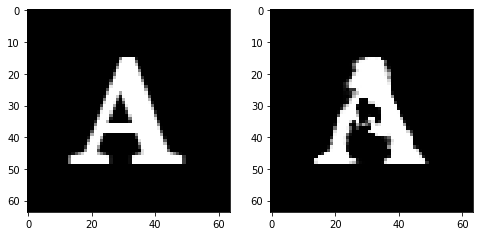

Epoch 126, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5634750463068485, Loss SSIM 2.0843191742897034, Loss Local 168.41337156295776


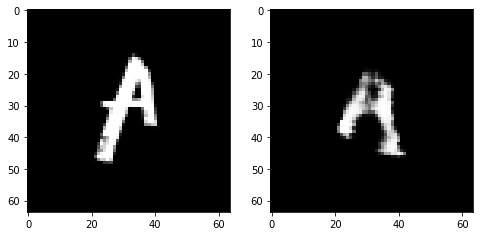

Epoch 126, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5335194803774357, Loss SSIM 2.025349259376526, Loss Local 175.0351119041443


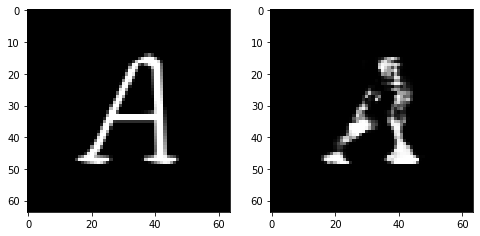

Epoch 126, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5290642715990543, Loss SSIM 2.0043460726737976, Loss Local 163.98934078216553


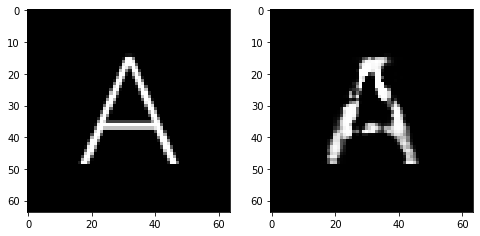

Epoch 126, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.550903532654047, Loss SSIM 2.013713836669922, Loss Local 175.85370588302612


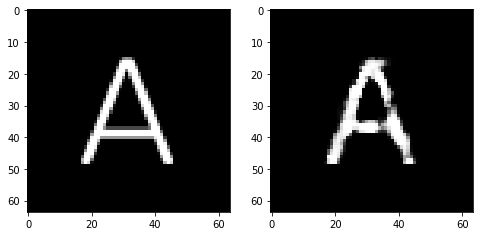

Epoch 126, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5415672697126865, Loss SSIM 1.9878145456314087, Loss Local 166.68962621688843


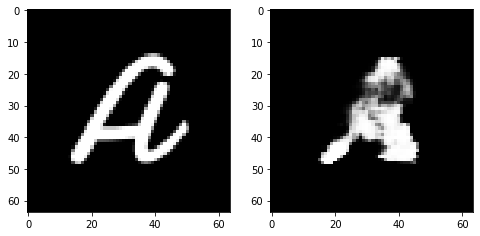

Epoch 126, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5603036880493164, Loss SSIM 2.0367953777313232, Loss Local 173.22160029411316


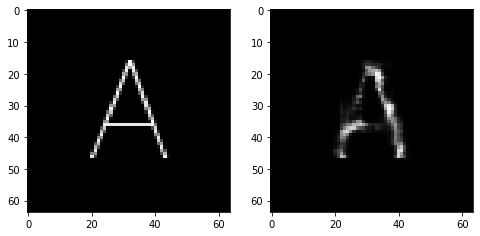

Epoch 127, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5180147476494312, Loss SSIM 1.989205539226532, Loss Local 177.8448600769043


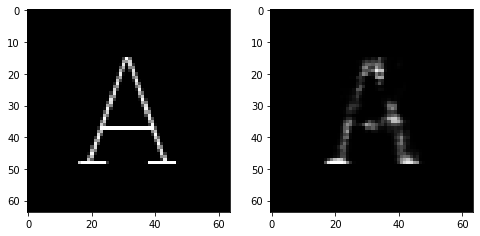

Epoch 127, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5359986796975136, Loss SSIM 1.9781178832054138, Loss Local 160.16897201538086


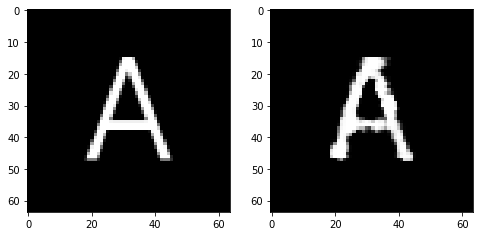

Epoch 127, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5882005430758, Loss SSIM 2.083916187286377, Loss Local 176.4988932609558


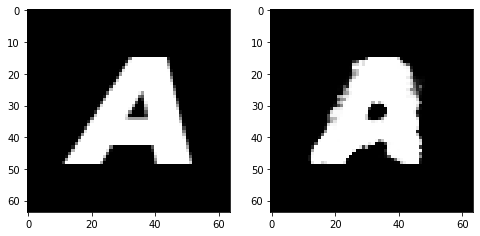

Epoch 127, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5312055200338364, Loss SSIM 2.039916455745697, Loss Local 178.5295057296753


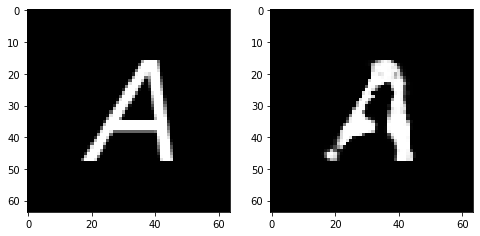

Epoch 127, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5647513419389725, Loss SSIM 2.0569714307785034, Loss Local 171.37278413772583


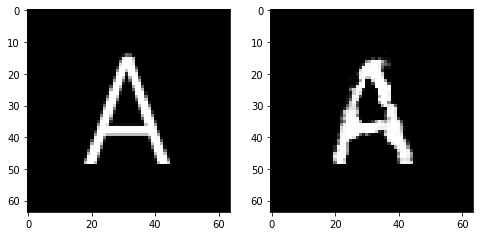

Epoch 127, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.560010027140379, Loss SSIM 2.0267263054847717, Loss Local 165.29310655593872


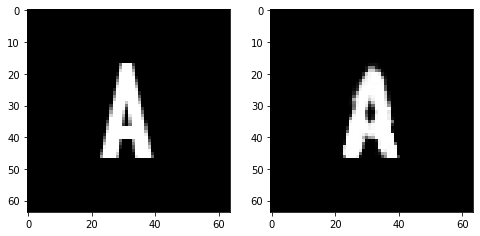

Epoch 127, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5593095608055592, Loss SSIM 2.02473521232605, Loss Local 177.44117188453674


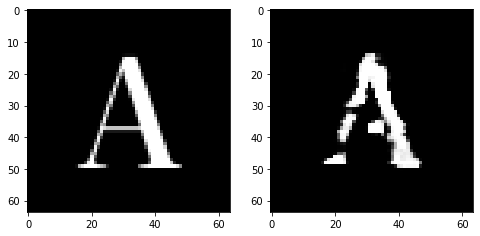

Epoch 128, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5801669098436832, Loss SSIM 2.064211845397949, Loss Local 184.8606777191162


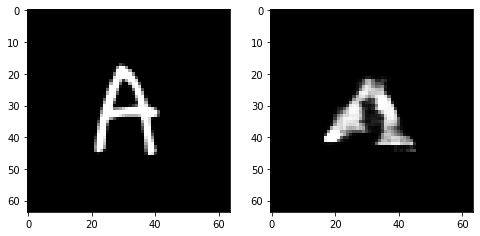

Epoch 128, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.535819835960865, Loss SSIM 2.033511221408844, Loss Local 177.42499542236328


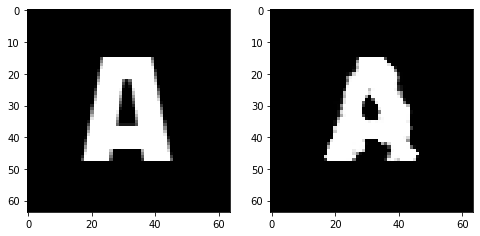

Epoch 128, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.529869481921196, Loss SSIM 1.9873236417770386, Loss Local 164.7178726196289


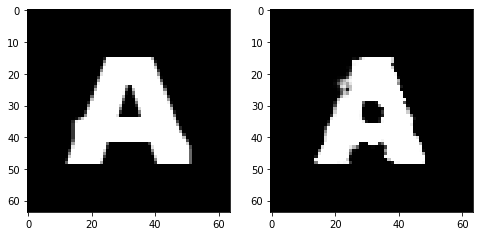

Epoch 128, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4998800307512283, Loss SSIM 1.9844228625297546, Loss Local 167.51030850410461


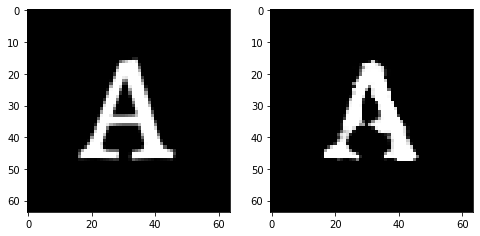

Epoch 128, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6074295602738857, Loss SSIM 2.126751720905304, Loss Local 179.6155343055725


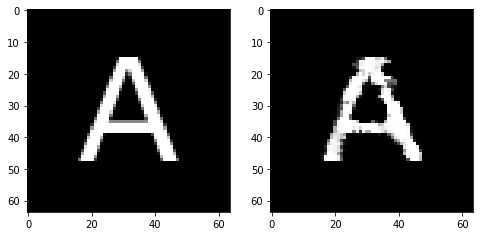

Epoch 128, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.547335285693407, Loss SSIM 2.0285946130752563, Loss Local 178.70193529129028


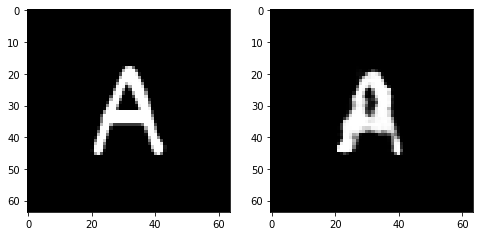

Epoch 128, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5624891966581345, Loss SSIM 2.026972472667694, Loss Local 168.5791482925415


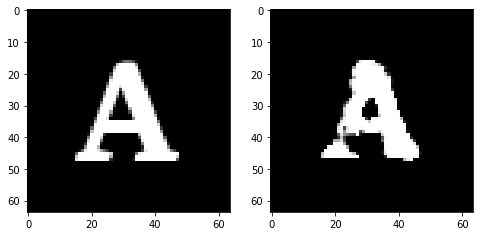

Epoch 129, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5923573821783066, Loss SSIM 2.093014121055603, Loss Local 178.15894889831543


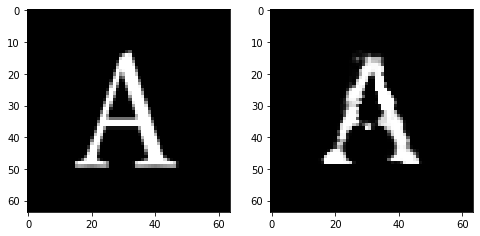

Epoch 129, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5383629649877548, Loss SSIM 1.944085419178009, Loss Local 166.01832056045532


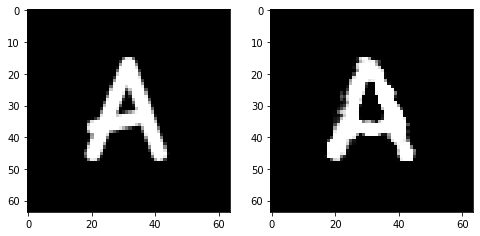

Epoch 129, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4949093349277973, Loss SSIM 1.9578396081924438, Loss Local 169.1140308380127


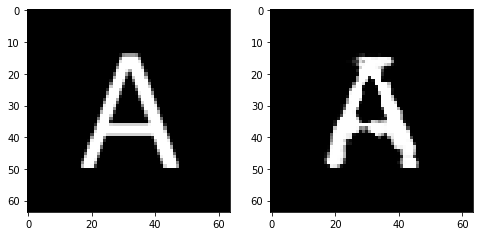

Epoch 129, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.567714910954237, Loss SSIM 2.0532527565956116, Loss Local 179.1676263809204


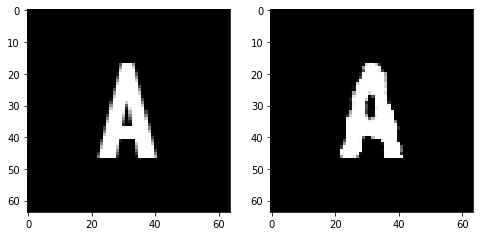

Epoch 129, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.612747449427843, Loss SSIM 2.19049072265625, Loss Local 180.42674207687378


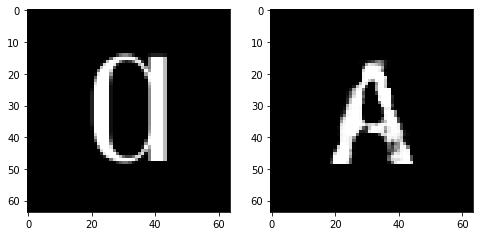

Epoch 129, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6016784943640232, Loss SSIM 2.135986030101776, Loss Local 172.951678276062


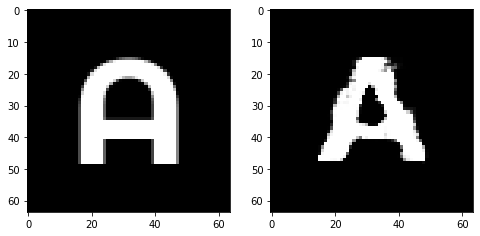

Epoch 129, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5226109586656094, Loss SSIM 1.9778788089752197, Loss Local 167.60012102127075


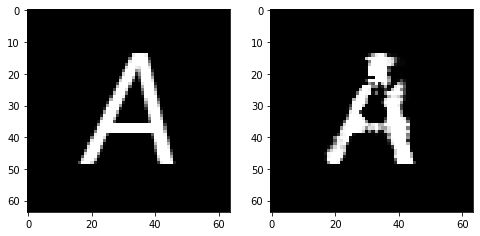

Epoch 130, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5651843436062336, Loss SSIM 2.061525285243988, Loss Local 174.89880466461182


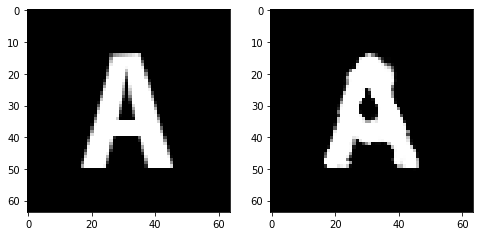

Epoch 130, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5399077869951725, Loss SSIM 1.994087278842926, Loss Local 168.33925771713257


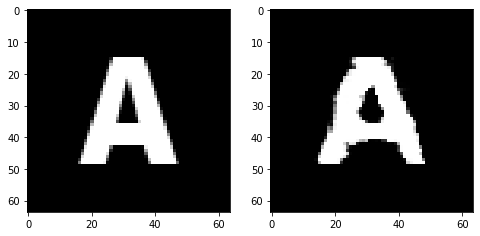

Epoch 130, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5028202757239342, Loss SSIM 1.940470814704895, Loss Local 170.72317028045654


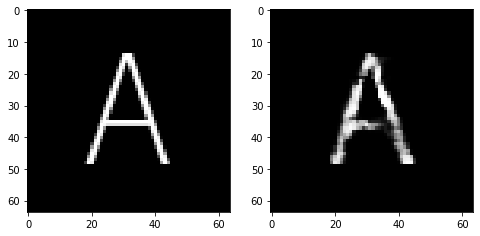

Epoch 130, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5506178177893162, Loss SSIM 2.0445017218589783, Loss Local 181.6128053665161


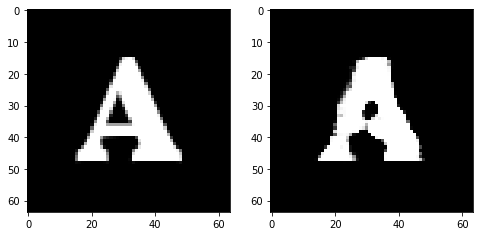

Epoch 130, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.643026139587164, Loss SSIM 2.1964803338050842, Loss Local 187.56014728546143


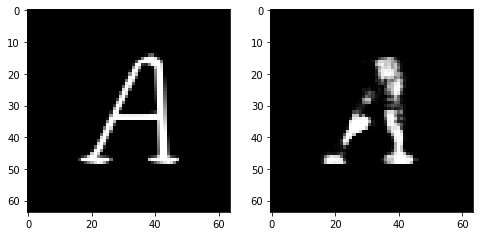

Epoch 130, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5460668131709099, Loss SSIM 2.0439749360084534, Loss Local 175.99737644195557


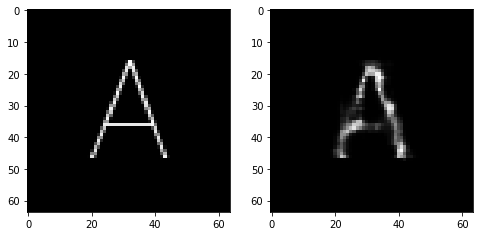

Epoch 130, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.542890265583992, Loss SSIM 1.9885382056236267, Loss Local 172.8211522102356


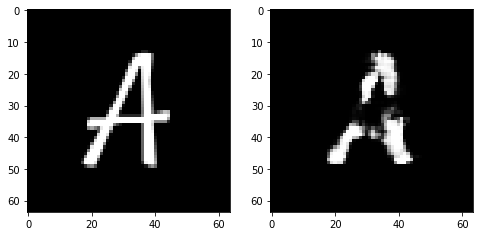

Epoch 131, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5359366573393345, Loss SSIM 1.9764970541000366, Loss Local 164.35049724578857


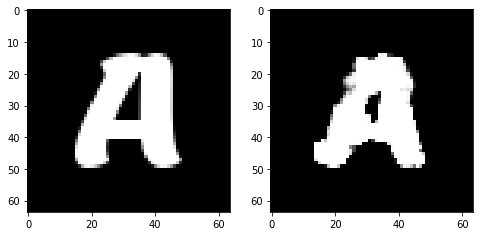

Epoch 131, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5352501049637794, Loss SSIM 2.0153090357780457, Loss Local 170.6217565536499


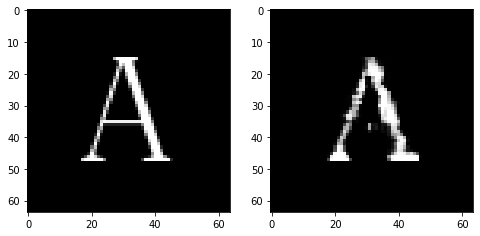

Epoch 131, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5974137671291828, Loss SSIM 2.091241776943207, Loss Local 181.6852102279663


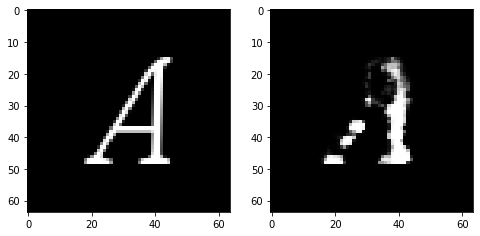

Epoch 131, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5610920637845993, Loss SSIM 2.099799692630768, Loss Local 176.7308292388916


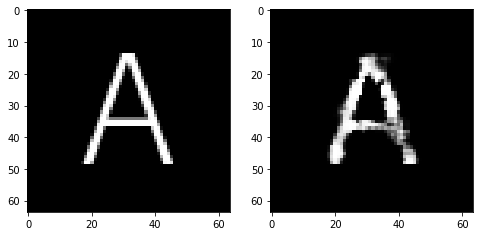

Epoch 131, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5692250803112984, Loss SSIM 2.0744552612304688, Loss Local 172.3817687034607


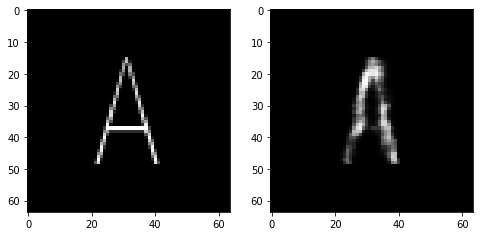

Epoch 131, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5566984750330448, Loss SSIM 2.065426766872406, Loss Local 179.7313265800476


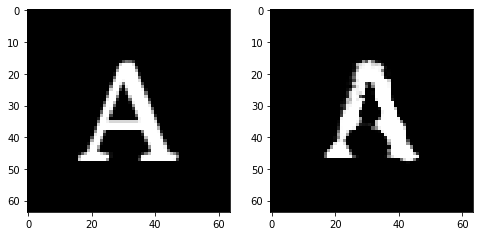

Epoch 131, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5106547214090824, Loss SSIM 1.9398247003555298, Loss Local 162.06974506378174


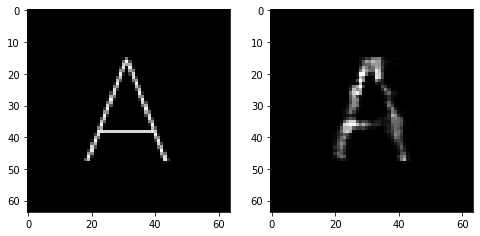

Epoch 132, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.600376132875681, Loss SSIM 2.1152153611183167, Loss Local 179.05307006835938


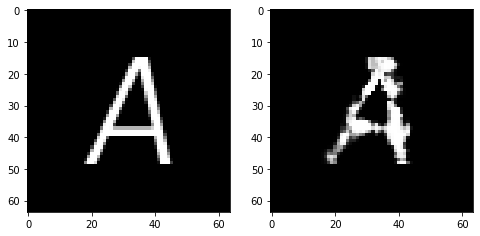

Epoch 132, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5808693133294582, Loss SSIM 2.0962321758270264, Loss Local 169.5963683128357


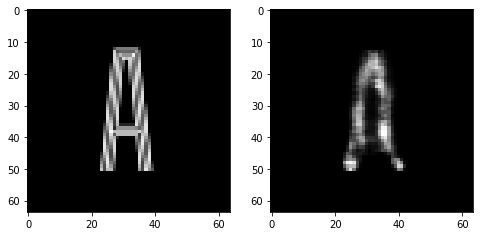

Epoch 132, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.591780785471201, Loss SSIM 2.08634489774704, Loss Local 178.4643759727478


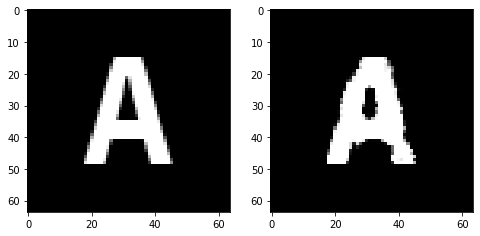

Epoch 132, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.571632482111454, Loss SSIM 2.1114612817764282, Loss Local 172.4202606678009


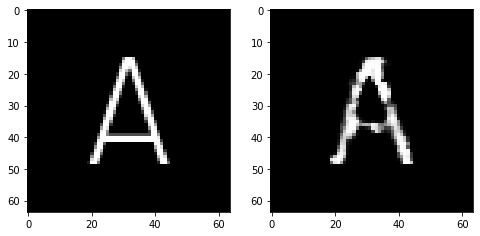

Epoch 132, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5298553258180618, Loss SSIM 1.9879990816116333, Loss Local 170.2194218635559


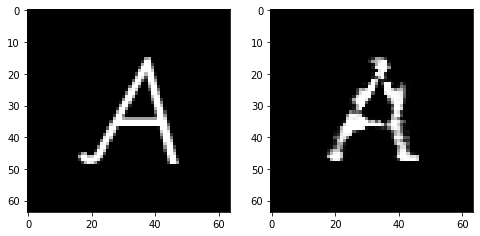

Epoch 132, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.46001410856843, Loss SSIM 1.8810364603996277, Loss Local 154.76742792129517


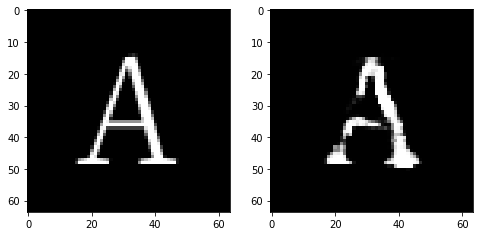

Epoch 132, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.582742739468813, Loss SSIM 2.0425036549568176, Loss Local 173.15719842910767


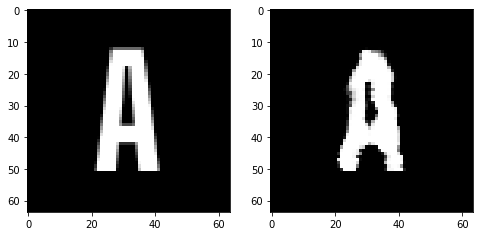

Epoch 133, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5522852316498756, Loss SSIM 2.040739595890045, Loss Local 173.62009477615356


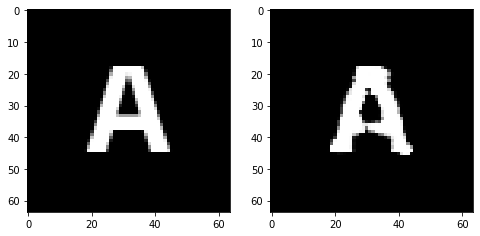

Epoch 133, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.506016280502081, Loss SSIM 1.932283341884613, Loss Local 169.0140838623047


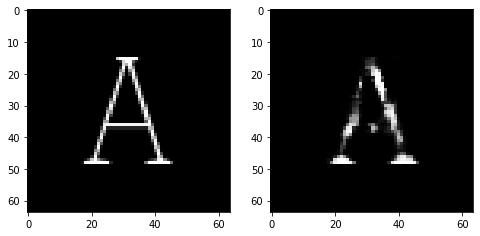

Epoch 133, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.600189071148634, Loss SSIM 2.1353309750556946, Loss Local 175.0462737083435


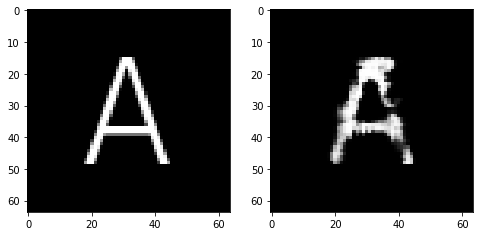

Epoch 133, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.562583178281784, Loss SSIM 2.0679555535316467, Loss Local 177.83636236190796


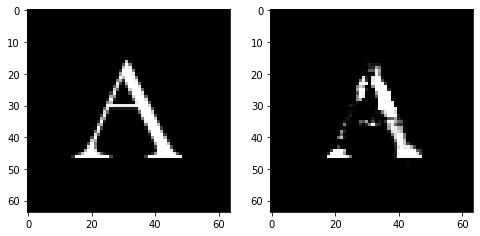

Epoch 133, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.539887573570013, Loss SSIM 1.9934837222099304, Loss Local 168.92548274993896


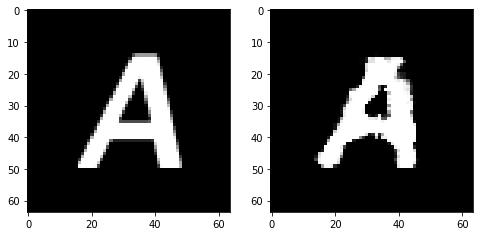

Epoch 133, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5524708665907383, Loss SSIM 2.0216205716133118, Loss Local 176.63256311416626


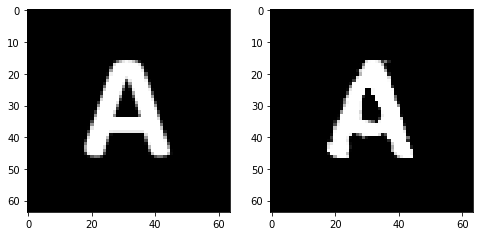

Epoch 133, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.574409380555153, Loss SSIM 2.0844000577926636, Loss Local 172.22719287872314


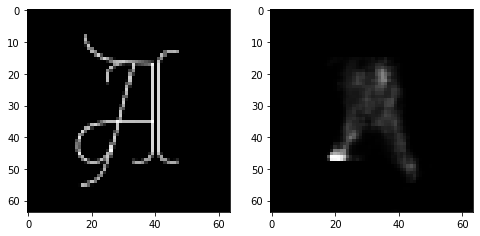

Epoch 134, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.539685696363449, Loss SSIM 2.075860321521759, Loss Local 171.96327757835388


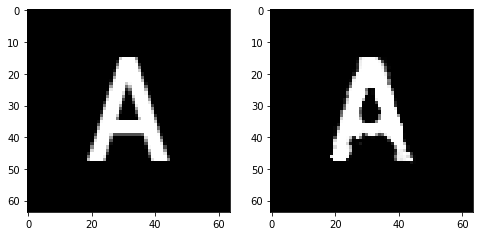

Epoch 134, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5966774374246597, Loss SSIM 2.04363876581192, Loss Local 179.49318265914917


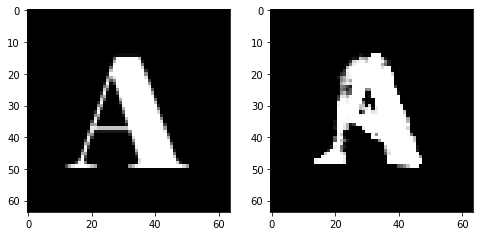

Epoch 134, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5698603875935078, Loss SSIM 2.052148461341858, Loss Local 170.07752060890198


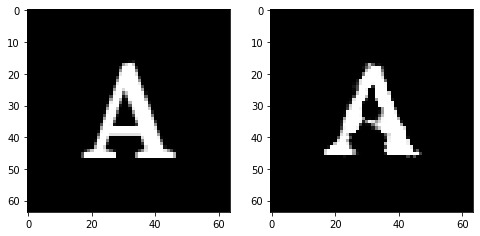

Epoch 134, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.545740645378828, Loss SSIM 2.0591330528259277, Loss Local 180.7509069442749


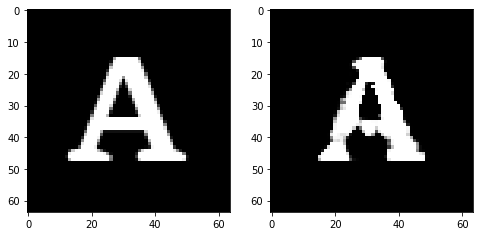

Epoch 134, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.519773192703724, Loss SSIM 1.9786956906318665, Loss Local 164.50265765190125


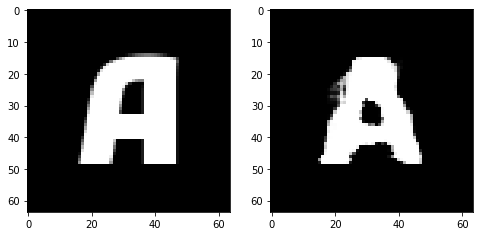

Epoch 134, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5555311441421509, Loss SSIM 2.048835575580597, Loss Local 166.62749481201172


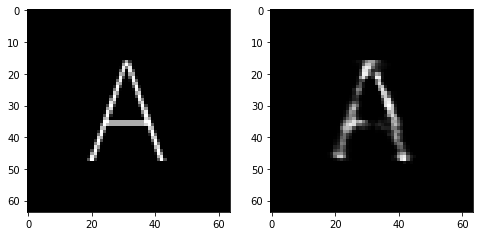

Epoch 134, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.576289378106594, Loss SSIM 2.058100998401642, Loss Local 178.0004916191101


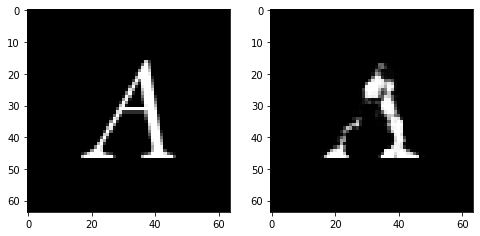

Epoch 135, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5855464823544025, Loss SSIM 2.070119559764862, Loss Local 181.27213764190674


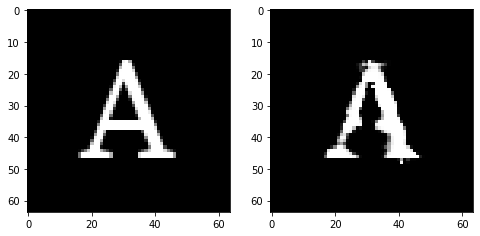

Epoch 135, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5641059018671513, Loss SSIM 2.0755966901779175, Loss Local 174.64762496948242


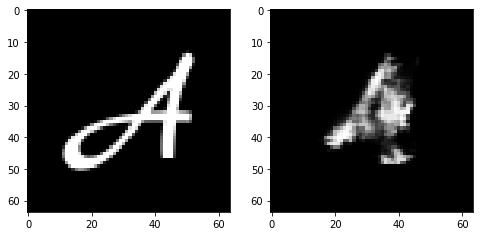

Epoch 135, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5197268426418304, Loss SSIM 1.9483115673065186, Loss Local 167.50464582443237


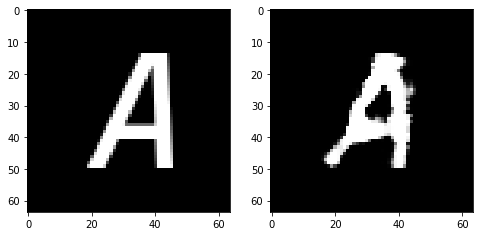

Epoch 135, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5509199760854244, Loss SSIM 2.041462242603302, Loss Local 177.2693305015564


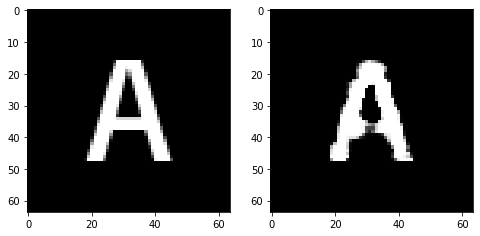

Epoch 135, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5505754500627518, Loss SSIM 2.045386254787445, Loss Local 171.71978664398193


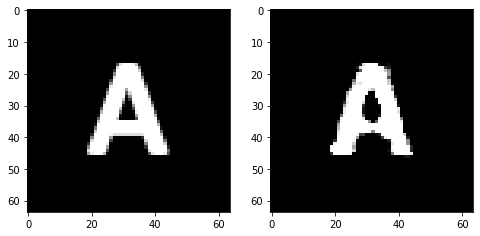

Epoch 135, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.570558950304985, Loss SSIM 2.0730321407318115, Loss Local 173.28519797325134


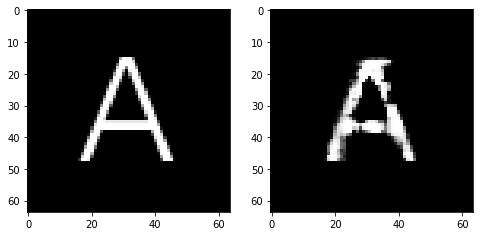

Epoch 135, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5214063599705696, Loss SSIM 1.981519341468811, Loss Local 177.48205709457397


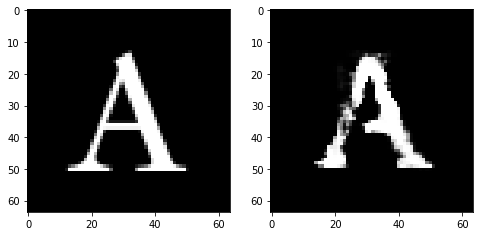

Epoch 136, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5583653561770916, Loss SSIM 2.05133455991745, Loss Local 178.78458642959595


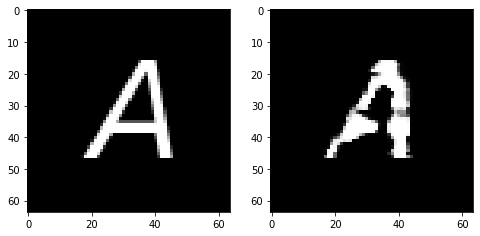

Epoch 136, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5284995064139366, Loss SSIM 1.9880864024162292, Loss Local 178.905601978302


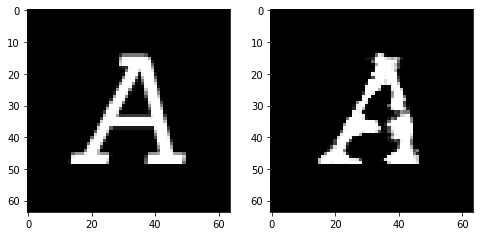

Epoch 136, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5672601498663425, Loss SSIM 2.0276947021484375, Loss Local 182.93047761917114


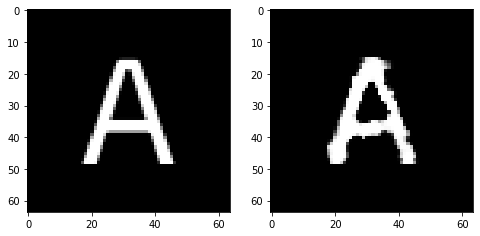

Epoch 136, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5478567332029343, Loss SSIM 2.006905972957611, Loss Local 176.43725728988647


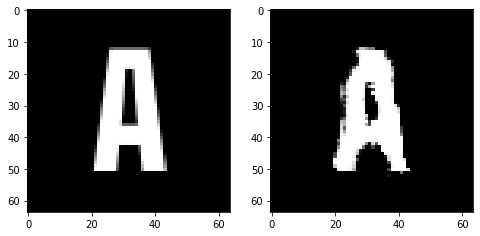

Epoch 136, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5521150082349777, Loss SSIM 2.071892201900482, Loss Local 181.41622829437256


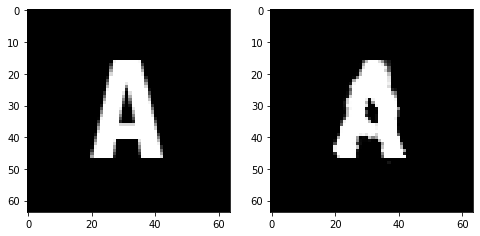

Epoch 136, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5741620995104313, Loss SSIM 2.0505515933036804, Loss Local 187.22981119155884


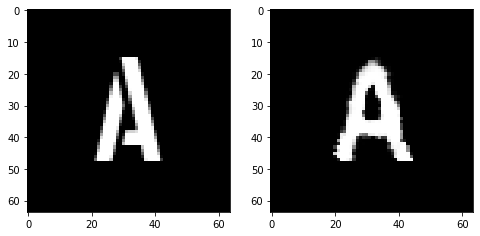

Epoch 136, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5458802804350853, Loss SSIM 2.0165746212005615, Loss Local 176.18062019348145


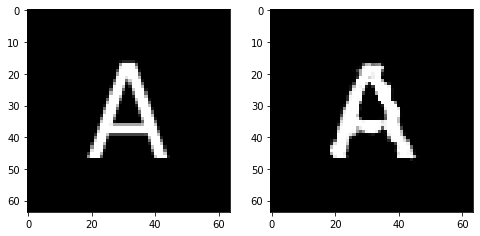

Epoch 137, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5683061480522156, Loss SSIM 2.1083329916000366, Loss Local 179.44981217384338


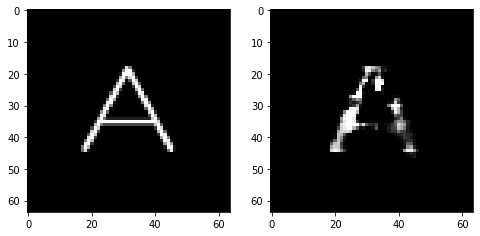

Epoch 137, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5939412340521812, Loss SSIM 2.060554027557373, Loss Local 178.47431468963623


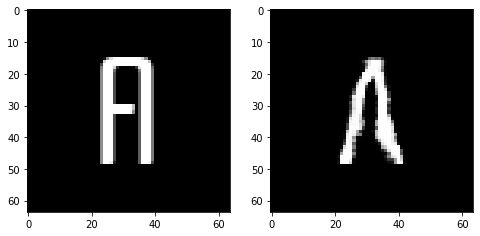

Epoch 137, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5441782288253307, Loss SSIM 2.0232916474342346, Loss Local 165.12138605117798


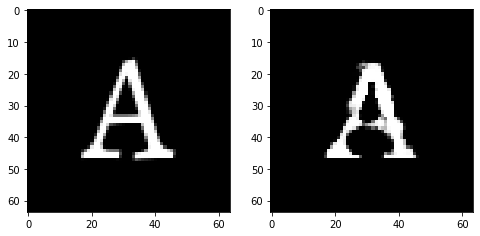

Epoch 137, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.536938738077879, Loss SSIM 1.994224190711975, Loss Local 181.52068710327148


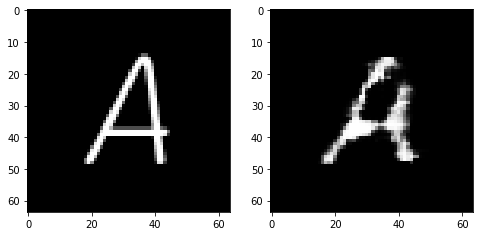

Epoch 137, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5503850877285004, Loss SSIM 1.9800056219100952, Loss Local 181.05012845993042


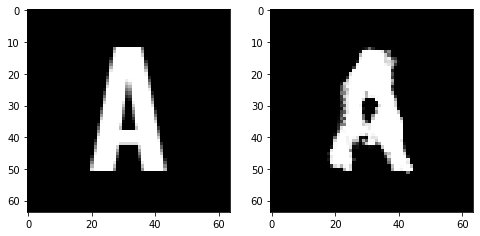

Epoch 137, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5431371107697487, Loss SSIM 2.0693812370300293, Loss Local 177.21327781677246


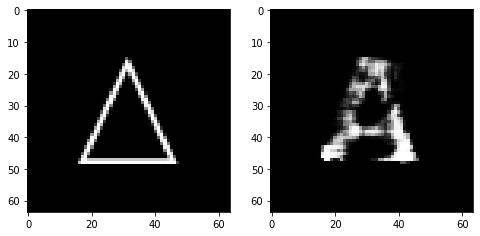

Epoch 137, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5480203106999397, Loss SSIM 1.9910637140274048, Loss Local 172.14795994758606


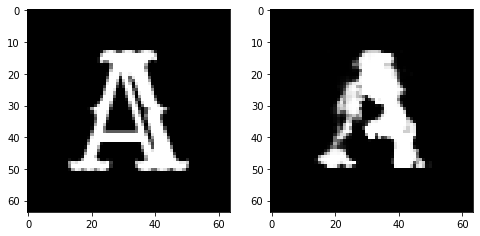

Epoch 138, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5575781166553497, Loss SSIM 2.0455708503723145, Loss Local 174.3480896949768


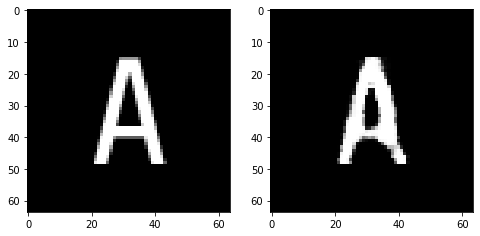

Epoch 138, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.578838985413313, Loss SSIM 2.0613866448402405, Loss Local 171.03897666931152


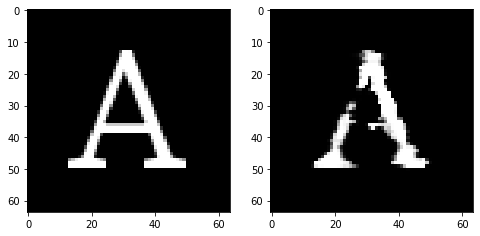

Epoch 138, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5846311561763287, Loss SSIM 2.0634201169013977, Loss Local 182.28922176361084


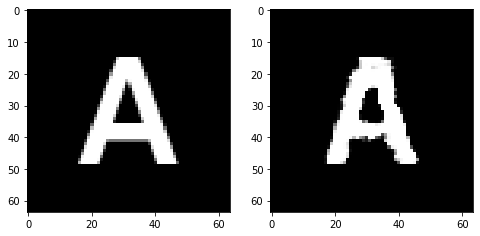

Epoch 138, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5577270612120628, Loss SSIM 2.0435381531715393, Loss Local 172.6522274017334


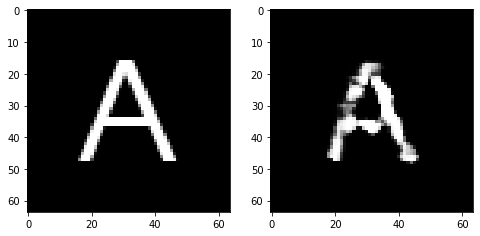

Epoch 138, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5175974443554878, Loss SSIM 1.9392364025115967, Loss Local 172.95815181732178


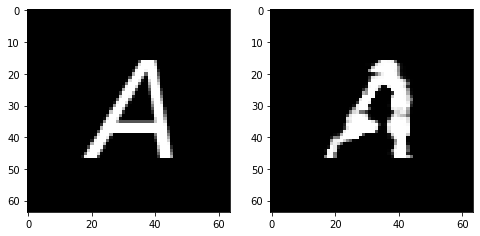

Epoch 138, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.51797703653574, Loss SSIM 2.0662646293640137, Loss Local 165.3247036933899


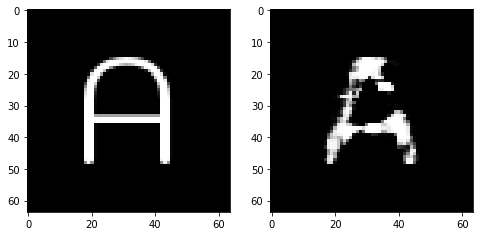

Epoch 138, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5594270527362823, Loss SSIM 2.0521957874298096, Loss Local 177.7318139076233


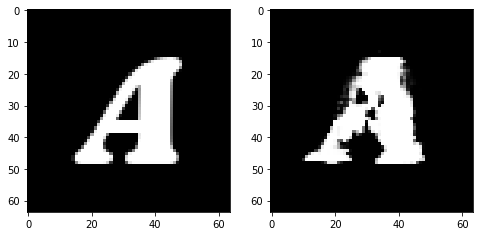

Epoch 139, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5404571704566479, Loss SSIM 2.0133424401283264, Loss Local 169.06935214996338


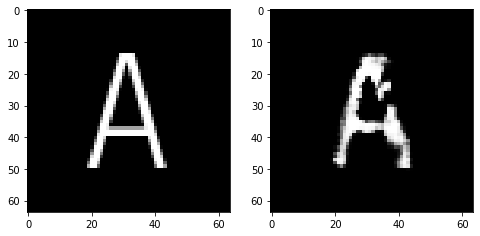

Epoch 139, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5586238652467728, Loss SSIM 2.0228229761123657, Loss Local 178.92774486541748


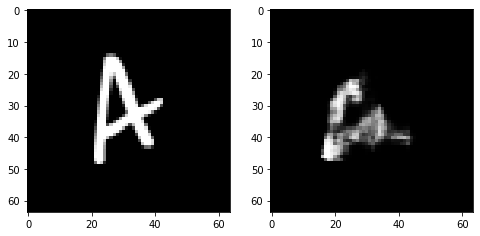

Epoch 139, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.535277146846056, Loss SSIM 1.9901009798049927, Loss Local 165.33371925354004


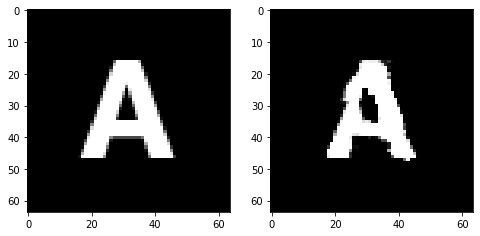

Epoch 139, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5368124470114708, Loss SSIM 2.0175147652626038, Loss Local 173.8473892211914


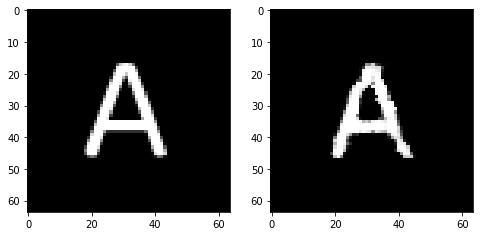

Epoch 139, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5911419242620468, Loss SSIM 2.097972810268402, Loss Local 176.33521366119385


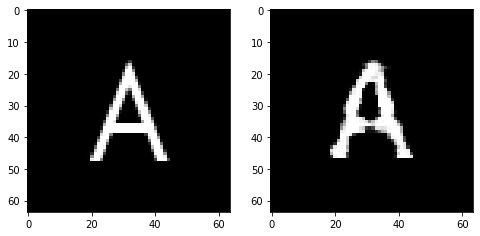

Epoch 139, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5387066341936588, Loss SSIM 2.0348703861236572, Loss Local 179.38484907150269


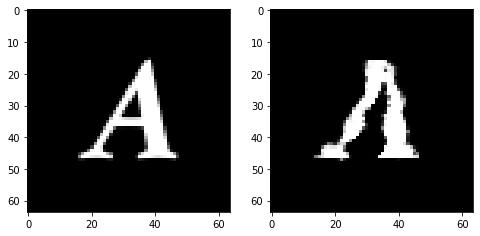

Epoch 139, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5768171548843384, Loss SSIM 2.0765942335128784, Loss Local 185.11475563049316


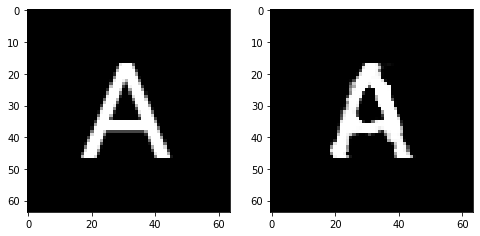

Epoch 140, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5785790421068668, Loss SSIM 2.0219324827194214, Loss Local 170.09914875030518


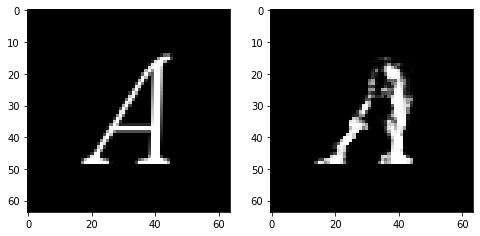

Epoch 140, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6061822809278965, Loss SSIM 2.178799092769623, Loss Local 177.75487899780273


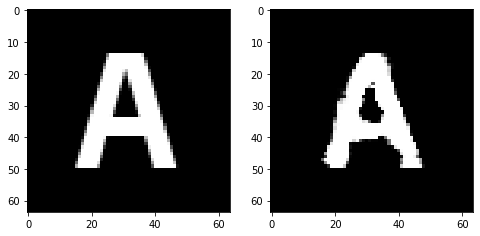

Epoch 140, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.570417556911707, Loss SSIM 2.0788938403129578, Loss Local 178.20544815063477


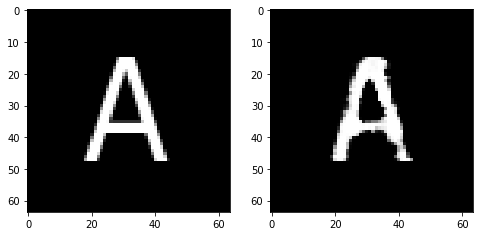

Epoch 140, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5374825187027454, Loss SSIM 2.0095630884170532, Loss Local 178.88051748275757


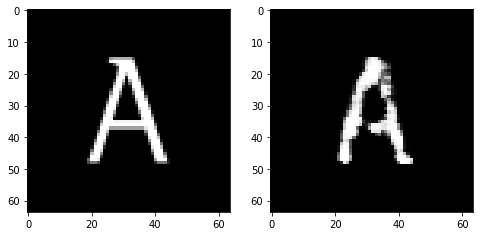

Epoch 140, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4866991005837917, Loss SSIM 1.9131572842597961, Loss Local 169.14107656478882


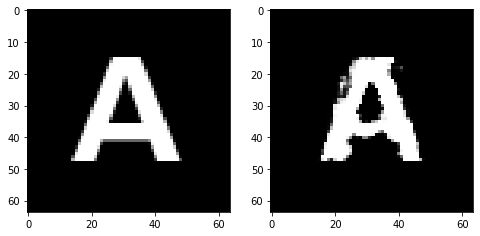

Epoch 140, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5409468412399292, Loss SSIM 2.0009845495224, Loss Local 173.91272401809692


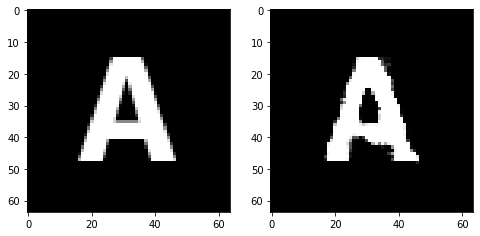

Epoch 140, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5979877971112728, Loss SSIM 2.126808524131775, Loss Local 172.7003207206726


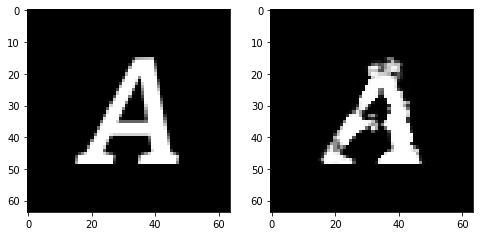

Epoch 141, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5167269557714462, Loss SSIM 1.9701722264289856, Loss Local 181.49247074127197


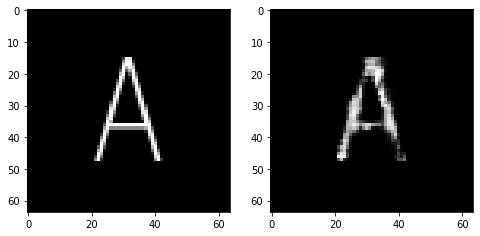

Epoch 141, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5486488416790962, Loss SSIM 2.113144636154175, Loss Local 182.08359384536743


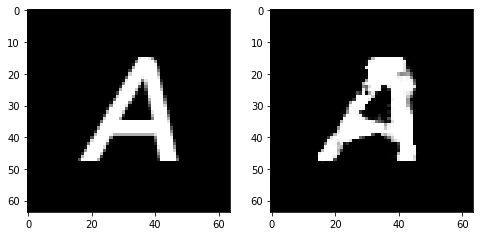

Epoch 141, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5485810674726963, Loss SSIM 2.0112081170082092, Loss Local 180.04555416107178


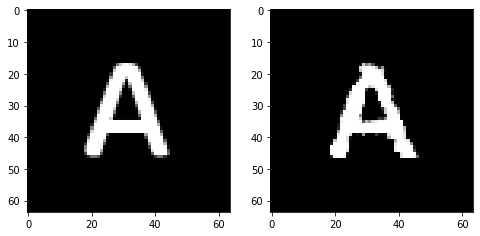

Epoch 141, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5885944068431854, Loss SSIM 2.060134768486023, Loss Local 182.5226526260376


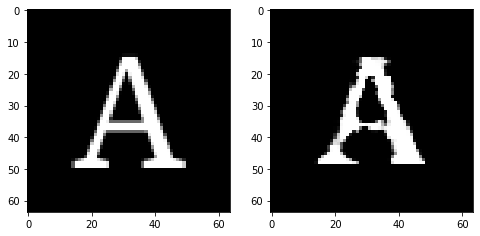

Epoch 141, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5852286964654922, Loss SSIM 2.1043801307678223, Loss Local 182.88999843597412


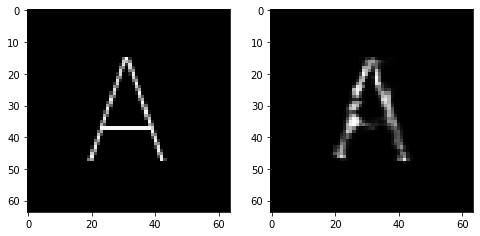

Epoch 141, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5588365271687508, Loss SSIM 1.9838157296180725, Loss Local 174.70570135116577


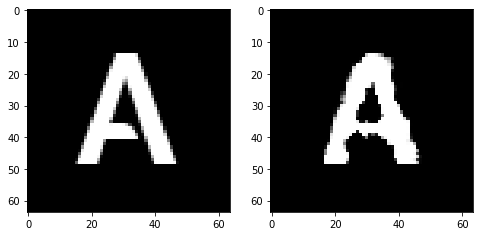

Epoch 141, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5090421847999096, Loss SSIM 1.9725990295410156, Loss Local 171.52587604522705


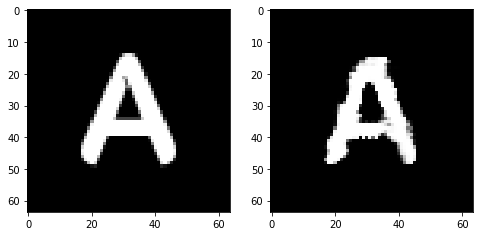

Epoch 142, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5614359490573406, Loss SSIM 2.0735479593276978, Loss Local 169.22924184799194


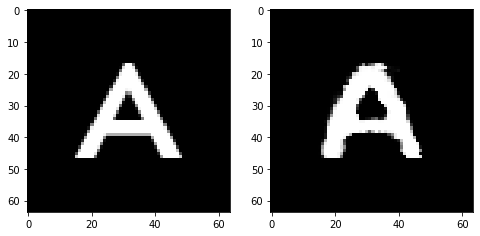

Epoch 142, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5700336061418056, Loss SSIM 2.0227993726730347, Loss Local 180.2704882621765


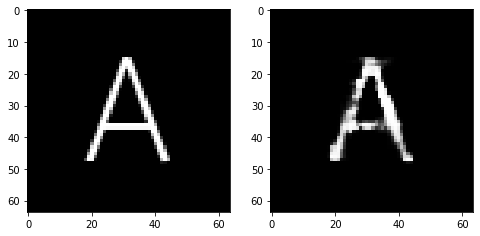

Epoch 142, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5860159806907177, Loss SSIM 2.08790522813797, Loss Local 173.4730134010315


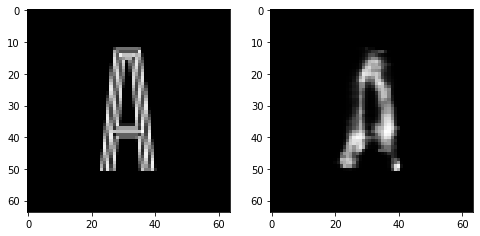

Epoch 142, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.538713313639164, Loss SSIM 2.062418222427368, Loss Local 177.54192662239075


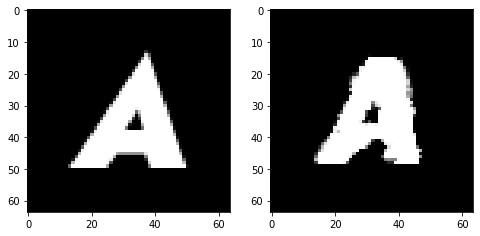

Epoch 142, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5049485638737679, Loss SSIM 1.9066137075424194, Loss Local 169.110924243927


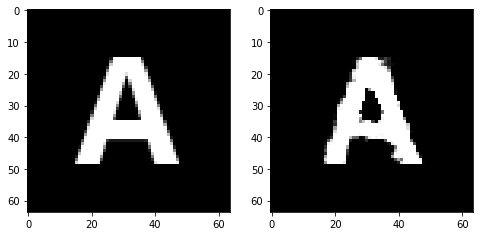

Epoch 142, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5761092938482761, Loss SSIM 2.0614233016967773, Loss Local 168.95656824111938


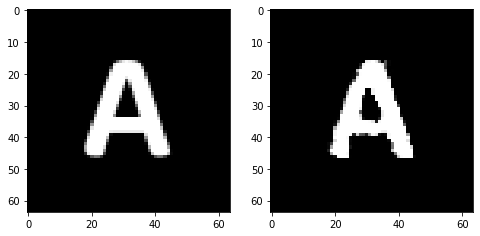

Epoch 142, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5516918413341045, Loss SSIM 2.0450439453125, Loss Local 173.4643588066101


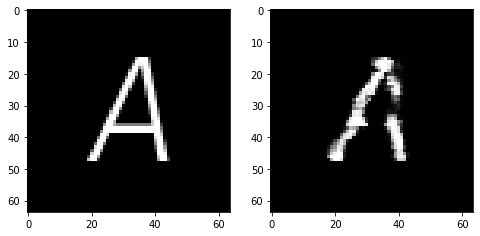

Epoch 143, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5551819056272507, Loss SSIM 2.0167303681373596, Loss Local 167.71640729904175


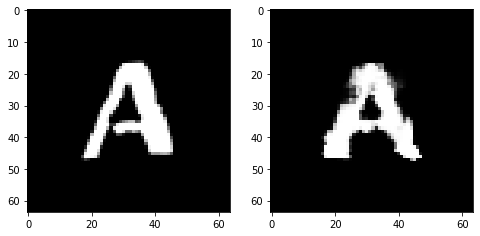

Epoch 143, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6055970676243305, Loss SSIM 2.1123873591423035, Loss Local 183.2993106842041


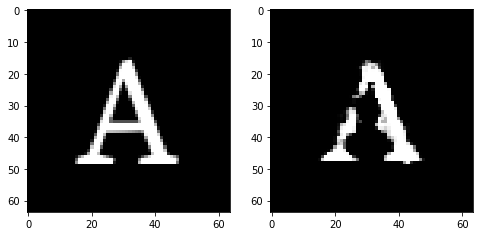

Epoch 143, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5256743431091309, Loss SSIM 2.019645094871521, Loss Local 172.9407377243042


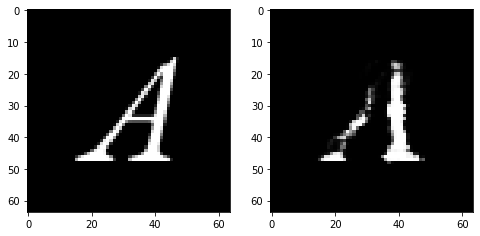

Epoch 143, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.537865113466978, Loss SSIM 1.991896152496338, Loss Local 174.5648274421692


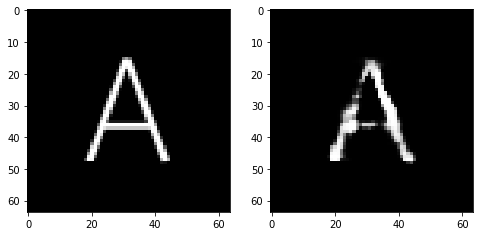

Epoch 143, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5403981357812881, Loss SSIM 1.965036690235138, Loss Local 169.70641803741455


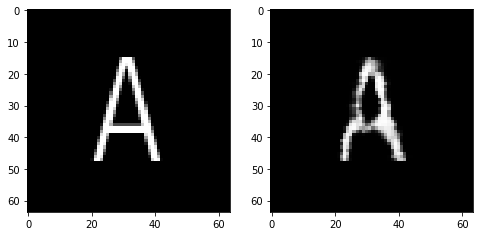

Epoch 143, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.576036423444748, Loss SSIM 2.110917806625366, Loss Local 178.36811637878418


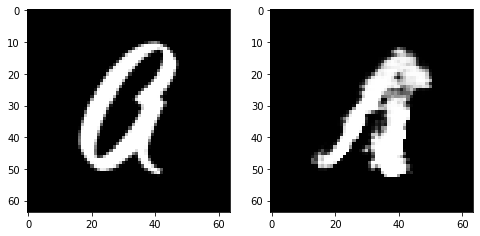

Epoch 143, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5513566248118877, Loss SSIM 2.0072556734085083, Loss Local 166.4875054359436


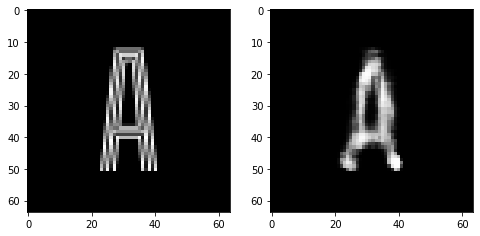

Epoch 144, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5523175038397312, Loss SSIM 1.9918631315231323, Loss Local 160.93197345733643


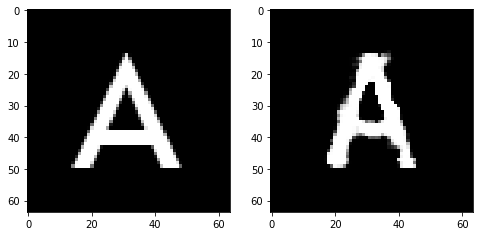

Epoch 144, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6045898906886578, Loss SSIM 2.0958849787712097, Loss Local 183.5135359764099


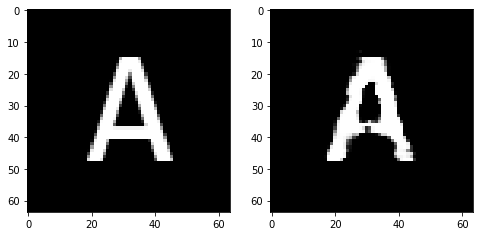

Epoch 144, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5895103700459003, Loss SSIM 2.104514479637146, Loss Local 171.10980939865112


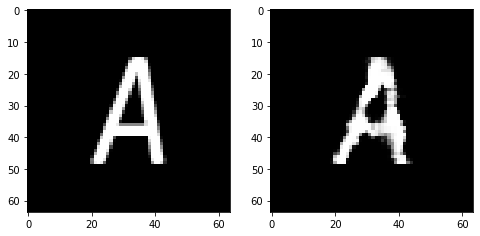

Epoch 144, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5615148916840553, Loss SSIM 2.047859311103821, Loss Local 175.3048791885376


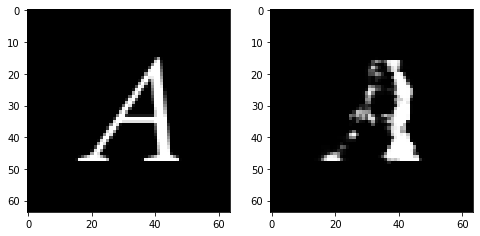

Epoch 144, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5112808048725128, Loss SSIM 1.9780595302581787, Loss Local 168.7822413444519


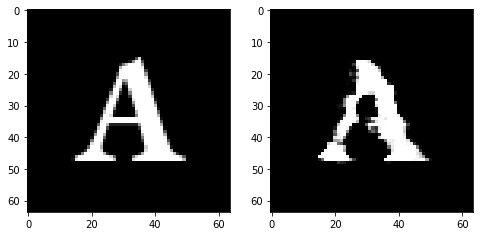

Epoch 144, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5298669636249542, Loss SSIM 2.01689475774765, Loss Local 175.27628993988037


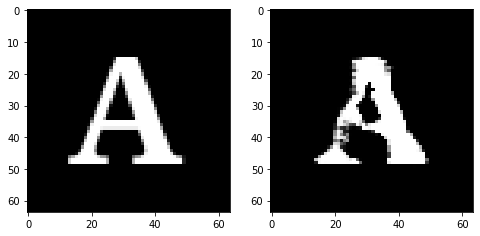

Epoch 144, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5511143654584885, Loss SSIM 2.0417564511299133, Loss Local 176.43221640586853


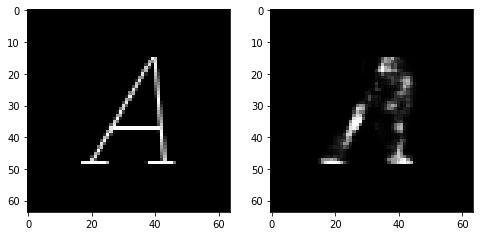

Epoch 145, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5716814883053303, Loss SSIM 2.046196162700653, Loss Local 179.73807859420776


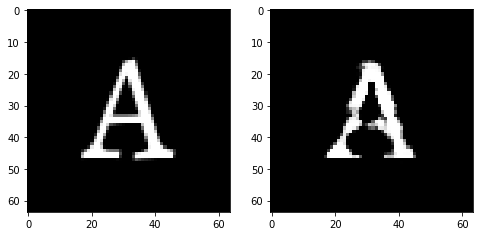

Epoch 145, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5589098073542118, Loss SSIM 2.0451826453208923, Loss Local 172.10083723068237


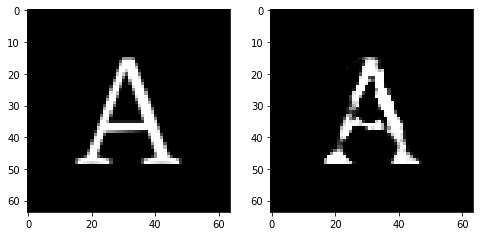

Epoch 145, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5695572532713413, Loss SSIM 2.05205237865448, Loss Local 181.57467699050903


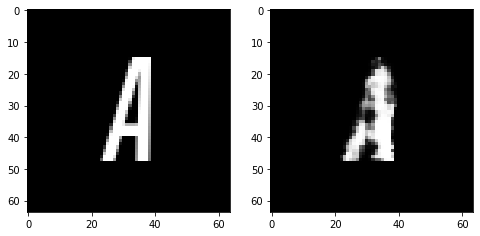

Epoch 145, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5363578908145428, Loss SSIM 1.9716094136238098, Loss Local 179.4215064048767


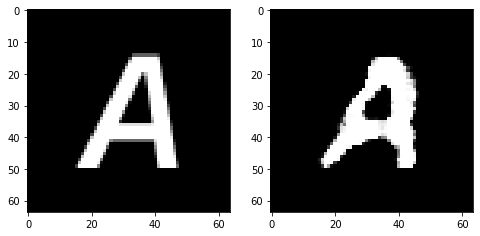

Epoch 145, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5907401368021965, Loss SSIM 2.120571732521057, Loss Local 175.29303169250488


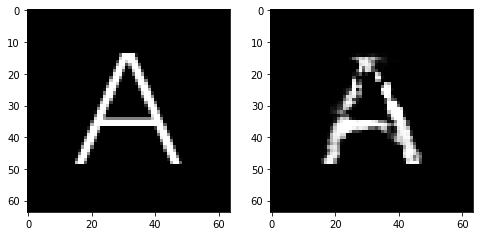

Epoch 145, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5451970808207989, Loss SSIM 2.0623592138290405, Loss Local 182.56512069702148


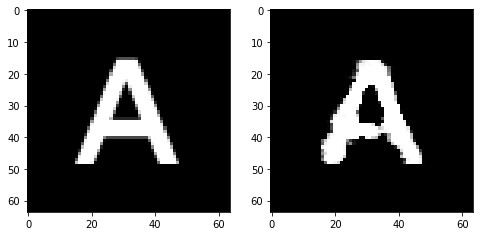

Epoch 145, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4903126955032349, Loss SSIM 1.9030888080596924, Loss Local 163.19161748886108


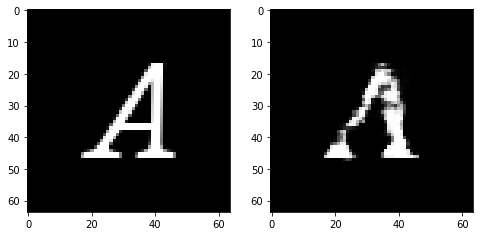

Epoch 146, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5673517547547817, Loss SSIM 2.072060227394104, Loss Local 178.72193956375122


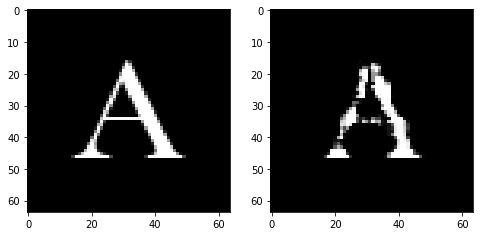

Epoch 146, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5550261288881302, Loss SSIM 2.066279888153076, Loss Local 180.36457109451294


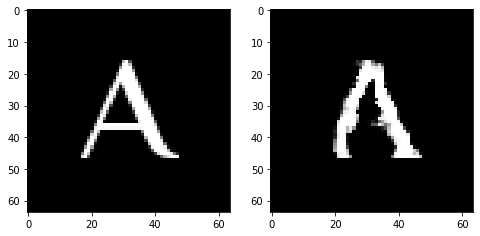

Epoch 146, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5746108368039131, Loss SSIM 2.054687023162842, Loss Local 176.14355993270874


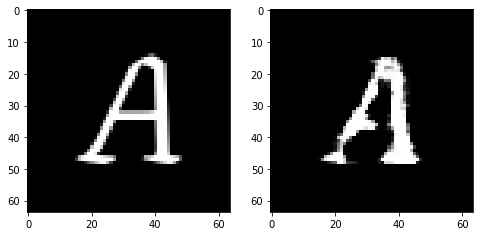

Epoch 146, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5134757235646248, Loss SSIM 1.9791474342346191, Loss Local 170.19307470321655


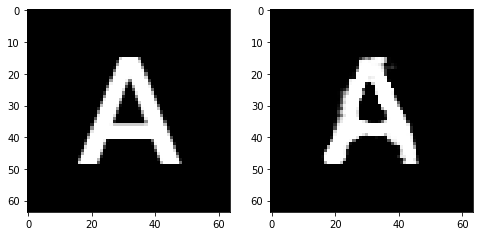

Epoch 146, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5813490636646748, Loss SSIM 2.049670159816742, Loss Local 183.5029377937317


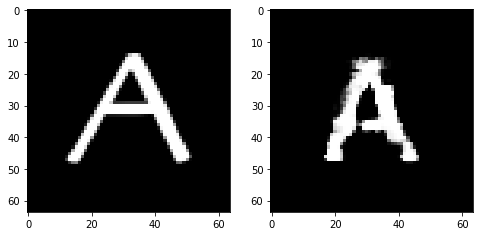

Epoch 146, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.572076603770256, Loss SSIM 2.061370015144348, Loss Local 172.5189070701599


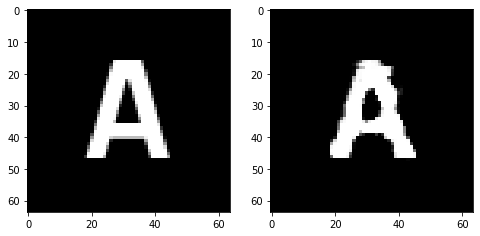

Epoch 146, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5397510714828968, Loss SSIM 2.0104138255119324, Loss Local 176.36337423324585


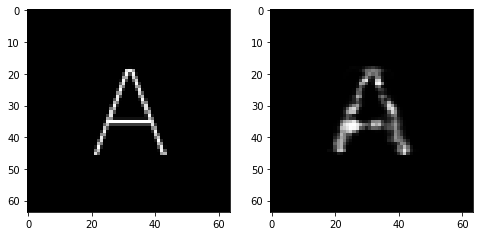

Epoch 147, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5502897873520851, Loss SSIM 2.0327985882759094, Loss Local 173.1047043800354


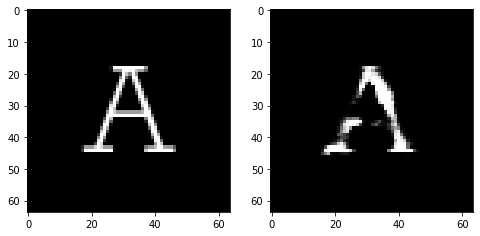

Epoch 147, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5085932686924934, Loss SSIM 1.9590148329734802, Loss Local 173.8083381652832


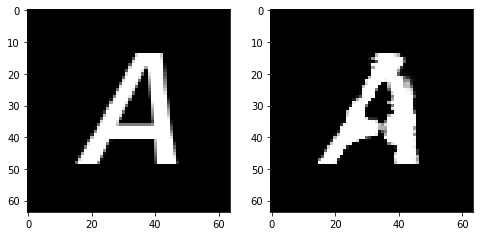

Epoch 147, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5615440271794796, Loss SSIM 2.0506622791290283, Loss Local 183.44177150726318


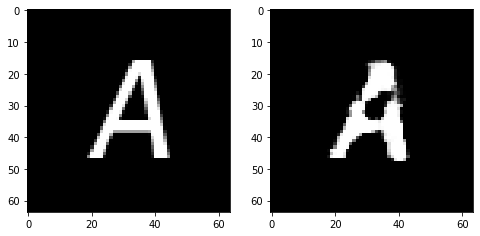

Epoch 147, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4882012009620667, Loss SSIM 1.9203285574913025, Loss Local 165.19320821762085


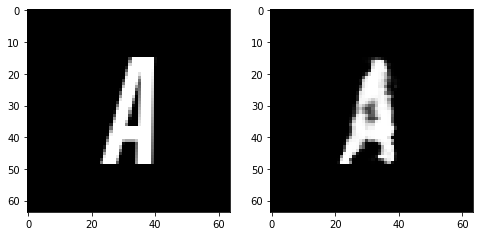

Epoch 147, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5839483588933945, Loss SSIM 2.084541082382202, Loss Local 177.29688453674316


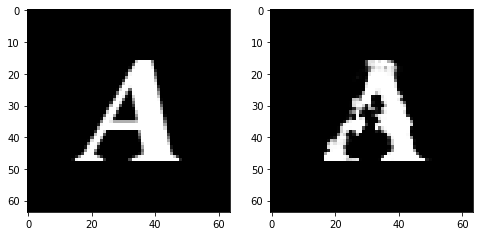

Epoch 147, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5561317168176174, Loss SSIM 2.04621285200119, Loss Local 176.09244537353516


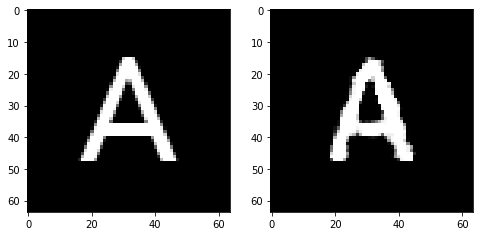

Epoch 147, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6208726651966572, Loss SSIM 2.1585511565208435, Loss Local 177.8396291732788


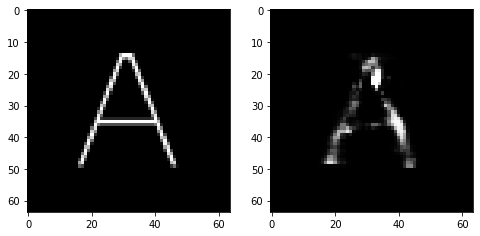

Epoch 148, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5570162497460842, Loss SSIM 2.045995533466339, Loss Local 169.74957370758057


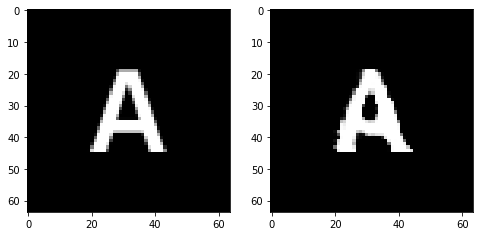

Epoch 148, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5537890270352364, Loss SSIM 2.0420042276382446, Loss Local 171.17579555511475


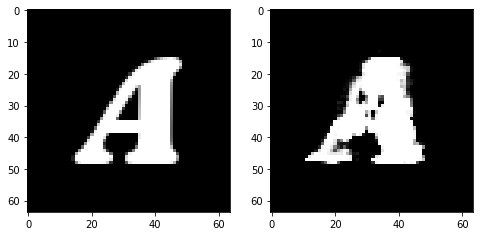

Epoch 148, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6001719906926155, Loss SSIM 2.1008154153823853, Loss Local 182.0562868118286


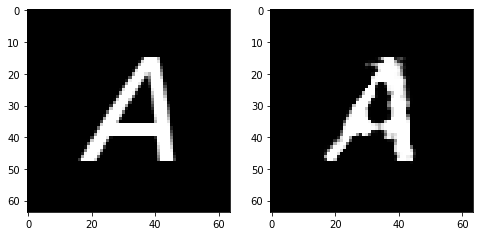

Epoch 148, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.557970553636551, Loss SSIM 2.031723201274872, Loss Local 177.988299369812


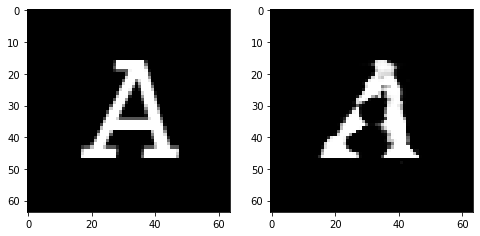

Epoch 148, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5320022702217102, Loss SSIM 2.0013065934181213, Loss Local 164.0855360031128


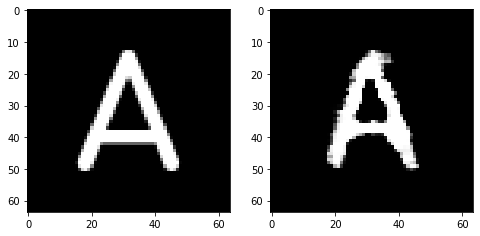

Epoch 148, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5952917709946632, Loss SSIM 2.104324221611023, Loss Local 175.4548215866089


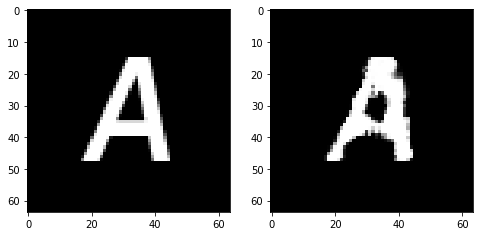

Epoch 148, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.513367984443903, Loss SSIM 1.9450371265411377, Loss Local 170.40812063217163


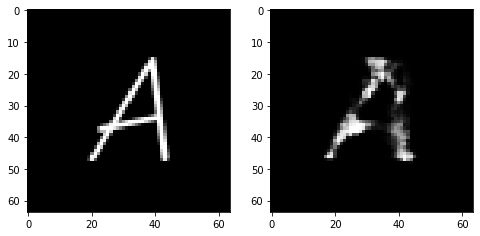

Epoch 149, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.589966792613268, Loss SSIM 2.102899968624115, Loss Local 176.73095560073853


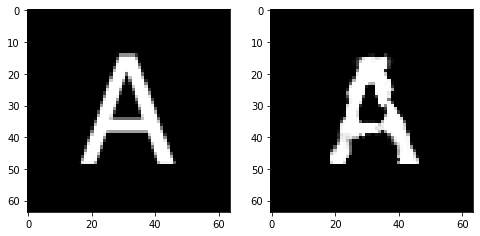

Epoch 149, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5403295420110226, Loss SSIM 2.0222803354263306, Loss Local 173.22304821014404


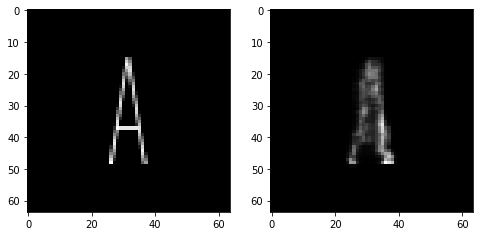

Epoch 149, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5218367241322994, Loss SSIM 2.0035693049430847, Loss Local 177.4890856742859


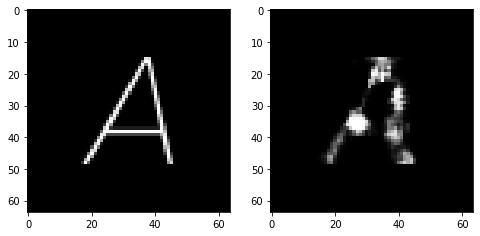

Epoch 149, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.515524372458458, Loss SSIM 1.9671434164047241, Loss Local 177.96768379211426


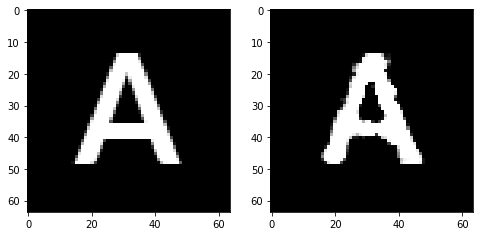

Epoch 149, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.520741082727909, Loss SSIM 2.0041908025741577, Loss Local 176.42386102676392


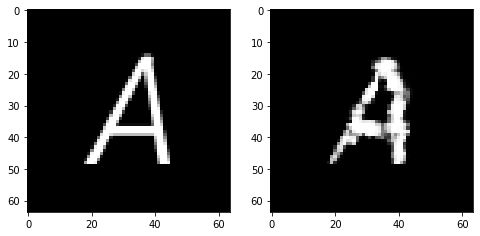

Epoch 149, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5239284224808216, Loss SSIM 1.968010663986206, Loss Local 171.26789093017578


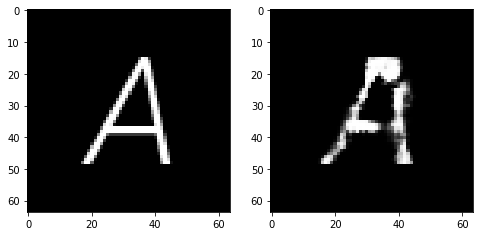

Epoch 149, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6285251826047897, Loss SSIM 2.129961669445038, Loss Local 170.55233144760132


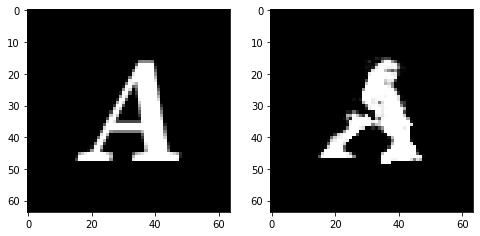

Epoch 150, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5540821626782417, Loss SSIM 2.0186623334884644, Loss Local 171.22640752792358


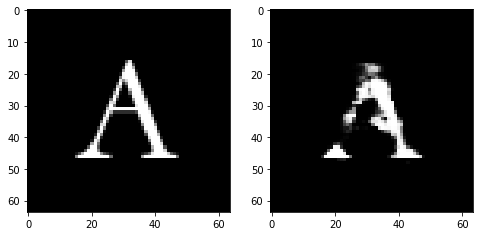

Epoch 150, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5767439901828766, Loss SSIM 2.0775484442710876, Loss Local 167.8979434967041


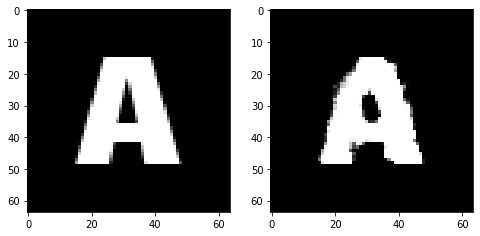

Epoch 150, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.537182841449976, Loss SSIM 2.0233049392700195, Loss Local 174.91743183135986


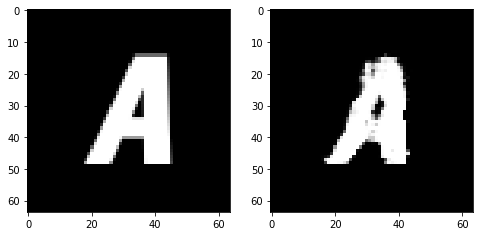

Epoch 150, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5421032905578613, Loss SSIM 2.0029870867729187, Loss Local 168.81443166732788


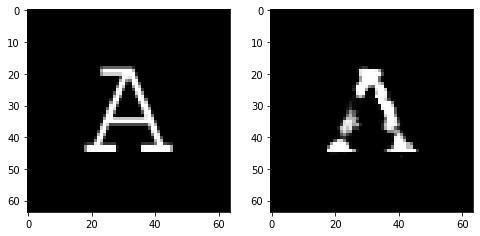

Epoch 150, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5614590533077717, Loss SSIM 2.049212157726288, Loss Local 177.67549467086792


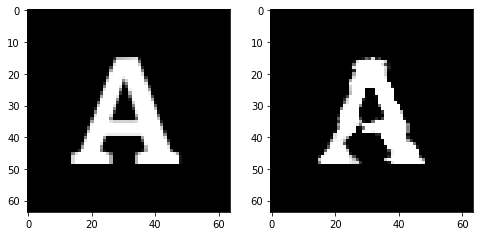

Epoch 150, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5606914833188057, Loss SSIM 2.0506423115730286, Loss Local 174.8288288116455


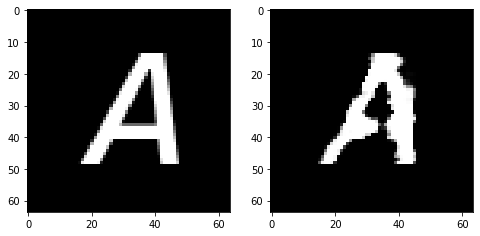

Epoch 150, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.549525611102581, Loss SSIM 2.031143069267273, Loss Local 171.42425680160522


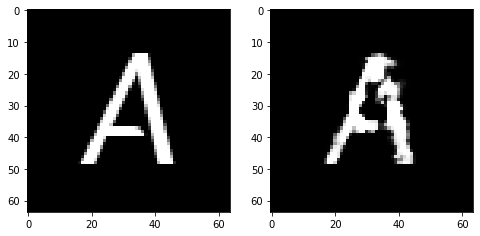

Epoch 151, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5565739758312702, Loss SSIM 2.0511011481285095, Loss Local 178.3300895690918


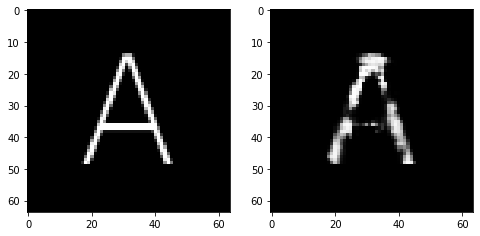

Epoch 151, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.617814403027296, Loss SSIM 2.1033669114112854, Loss Local 183.07543516159058


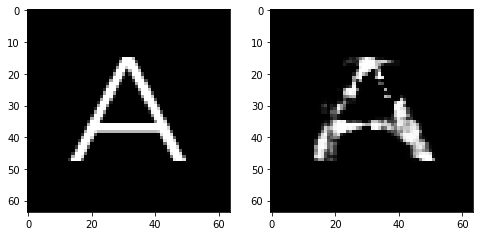

Epoch 151, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5569597147405148, Loss SSIM 2.0745341181755066, Loss Local 177.34467697143555


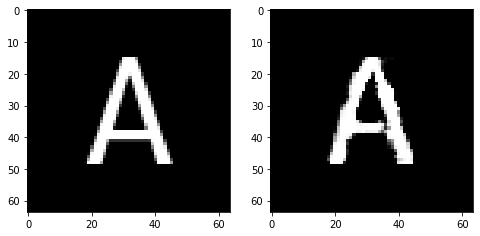

Epoch 151, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.514751672744751, Loss SSIM 1.9672840237617493, Loss Local 169.58069372177124


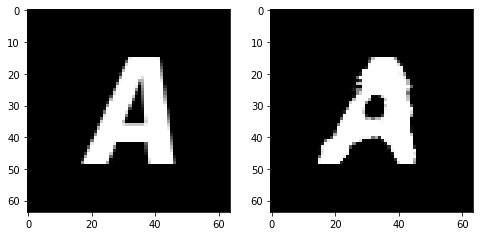

Epoch 151, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5468758009374142, Loss SSIM 2.0357019305229187, Loss Local 182.965961933136


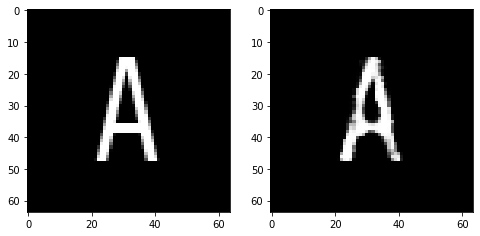

Epoch 151, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5596935749053955, Loss SSIM 2.0277612805366516, Loss Local 172.8586287498474


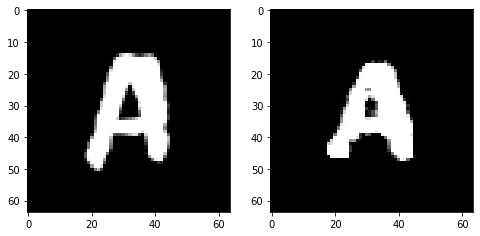

Epoch 151, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5379642732441425, Loss SSIM 2.014666736125946, Loss Local 170.77561807632446


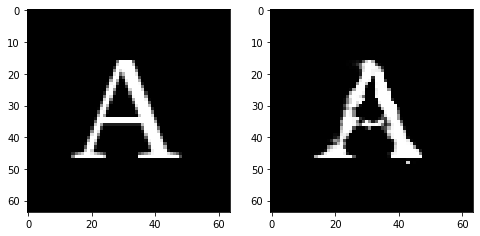

Epoch 152, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5569668151438236, Loss SSIM 2.019244074821472, Loss Local 161.97347784042358


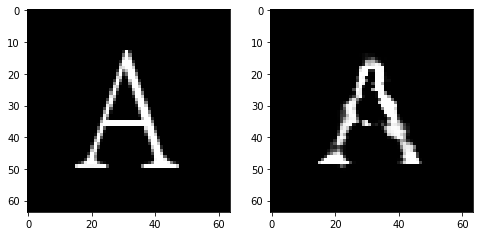

Epoch 152, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.589413583278656, Loss SSIM 2.0757791996002197, Loss Local 173.10820770263672


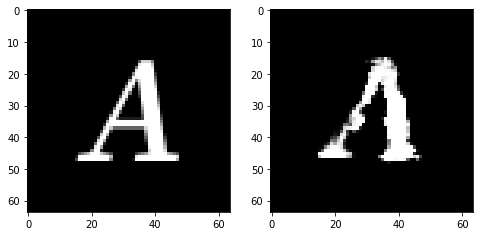

Epoch 152, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5470024272799492, Loss SSIM 2.0152968168258667, Loss Local 172.98620748519897


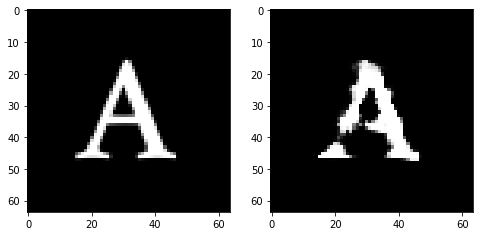

Epoch 152, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5775569342076778, Loss SSIM 2.0672624707221985, Loss Local 182.11144018173218


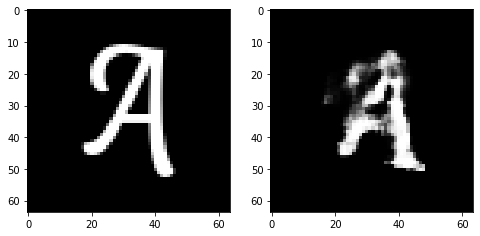

Epoch 152, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5589900501072407, Loss SSIM 2.0628791451454163, Loss Local 171.49023532867432


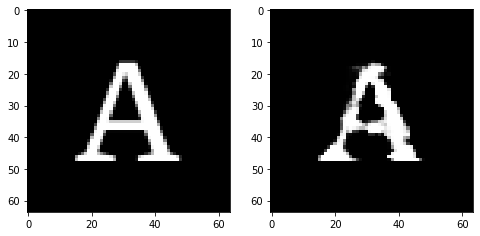

Epoch 152, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5421399362385273, Loss SSIM 2.011172354221344, Loss Local 165.8558588027954


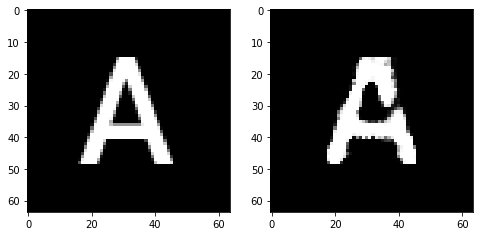

Epoch 152, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5335883498191833, Loss SSIM 2.0325106382369995, Loss Local 183.3371295928955


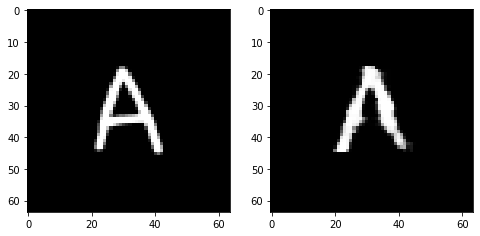

Epoch 153, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.596498154103756, Loss SSIM 2.117818295955658, Loss Local 173.46108675003052


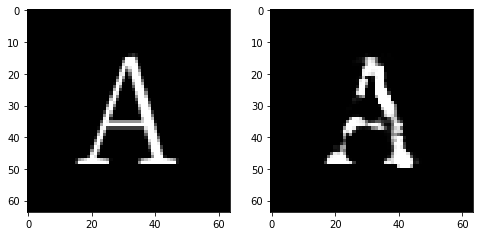

Epoch 153, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5744388848543167, Loss SSIM 2.1105793714523315, Loss Local 169.74114799499512


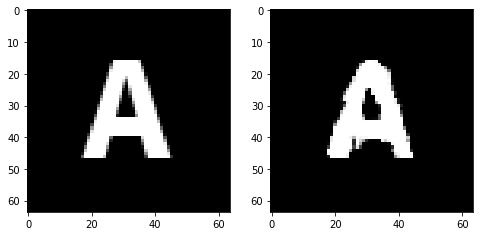

Epoch 153, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5103556476533413, Loss SSIM 1.9823094606399536, Loss Local 165.0066614151001


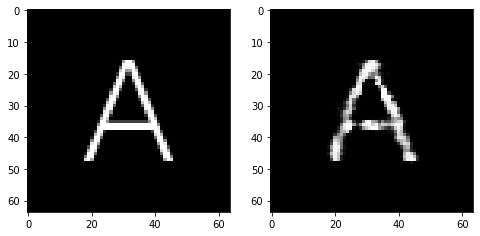

Epoch 153, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.551018662750721, Loss SSIM 2.0085489153862, Loss Local 176.41893243789673


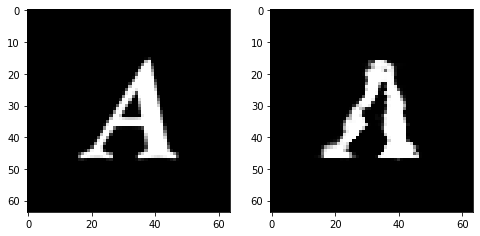

Epoch 153, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5455347001552582, Loss SSIM 2.038387894630432, Loss Local 171.2818808555603


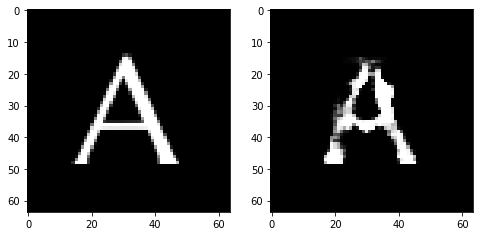

Epoch 153, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5494821481406689, Loss SSIM 2.0499802231788635, Loss Local 174.9684042930603


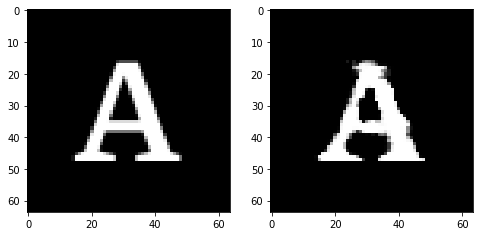

Epoch 153, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.565964162349701, Loss SSIM 1.968617558479309, Loss Local 174.88319492340088


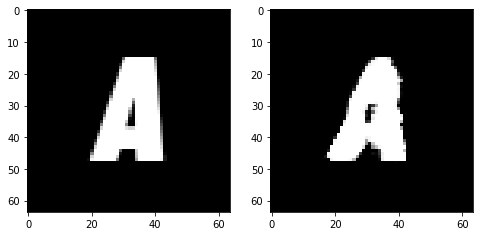

Epoch 154, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5206092856824398, Loss SSIM 1.978552520275116, Loss Local 177.46685600280762


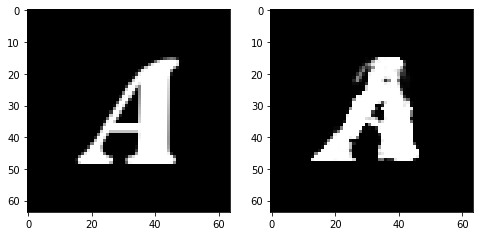

Epoch 154, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5186713375151157, Loss SSIM 1.978981614112854, Loss Local 172.80255031585693


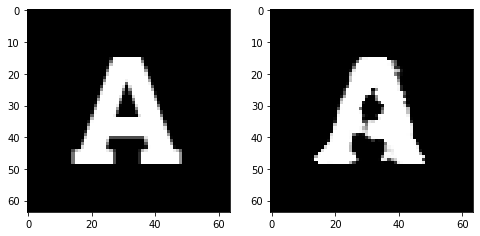

Epoch 154, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.535376489162445, Loss SSIM 1.9728540182113647, Loss Local 173.81651210784912


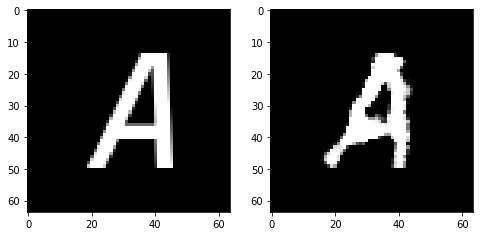

Epoch 154, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5642816089093685, Loss SSIM 2.0839611291885376, Loss Local 179.1493353843689


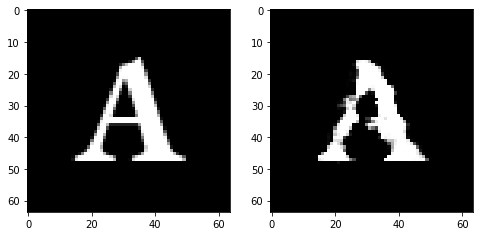

Epoch 154, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.57425132766366, Loss SSIM 2.038155436515808, Loss Local 177.2899260520935


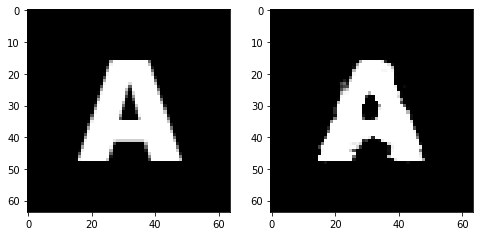

Epoch 154, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6091751754283905, Loss SSIM 2.1343082189559937, Loss Local 175.6347165107727


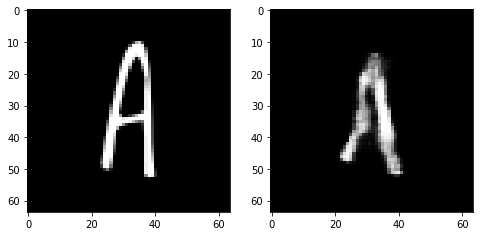

Epoch 154, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5998597890138626, Loss SSIM 2.1222683787345886, Loss Local 185.07304620742798


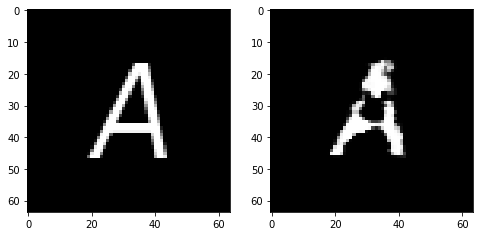

Epoch 155, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.526283636689186, Loss SSIM 2.0151392221450806, Loss Local 172.78437280654907


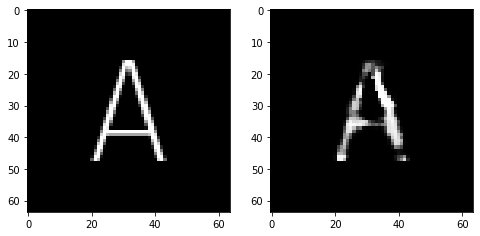

Epoch 155, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5850559622049332, Loss SSIM 2.087549924850464, Loss Local 170.93635606765747


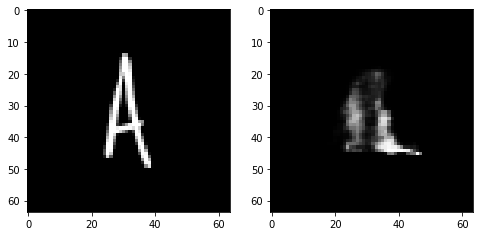

Epoch 155, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5807469673454762, Loss SSIM 2.038660764694214, Loss Local 167.13005304336548


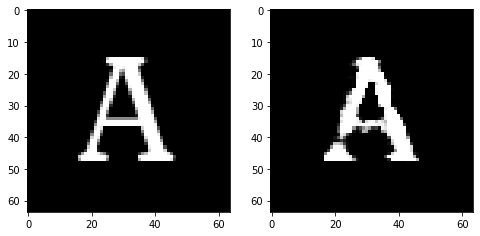

Epoch 155, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5520008131861687, Loss SSIM 2.0491830706596375, Loss Local 173.46521711349487


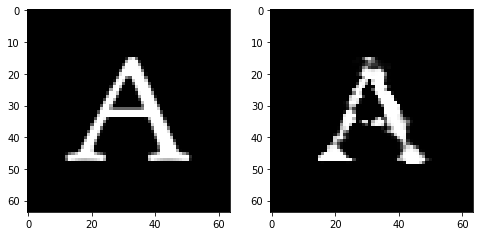

Epoch 155, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.604821391403675, Loss SSIM 2.130414843559265, Loss Local 174.26210641860962


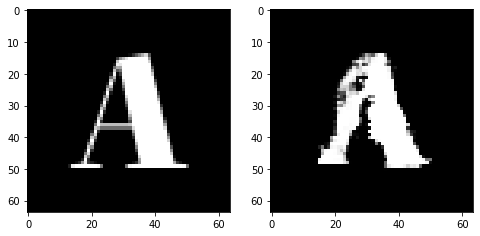

Epoch 155, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5129577293992043, Loss SSIM 1.96635901927948, Loss Local 170.0838418006897


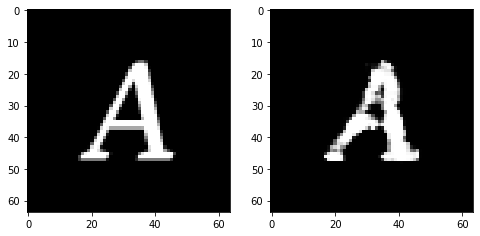

Epoch 155, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5416408330202103, Loss SSIM 2.0283972024917603, Loss Local 176.7526912689209


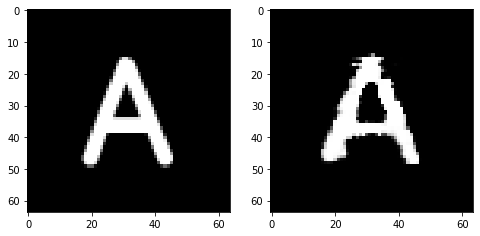

Epoch 156, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6066589653491974, Loss SSIM 2.1616974472999573, Loss Local 183.15524530410767


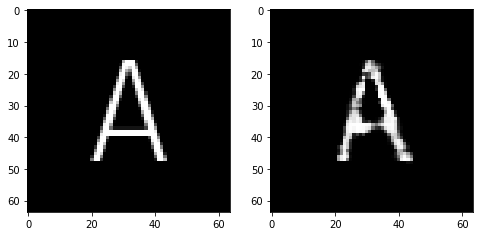

Epoch 156, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5487789772450924, Loss SSIM 2.0001970529556274, Loss Local 182.4955496788025


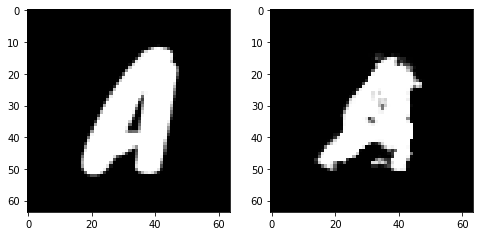

Epoch 156, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5529694929718971, Loss SSIM 2.029996931552887, Loss Local 171.95272493362427


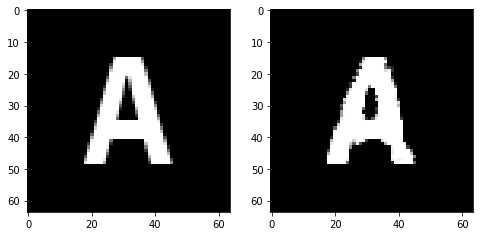

Epoch 156, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.536698054522276, Loss SSIM 2.0063526034355164, Loss Local 174.7997441291809


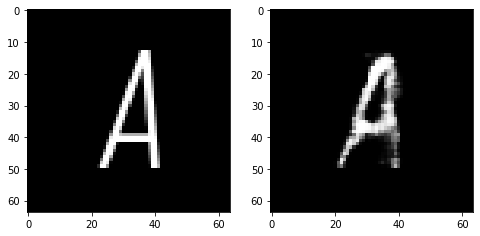

Epoch 156, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.511912651360035, Loss SSIM 1.974700689315796, Loss Local 169.97394847869873


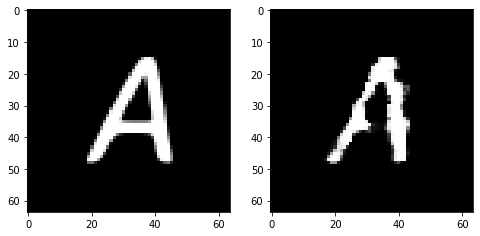

Epoch 156, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.573678843677044, Loss SSIM 2.0789559483528137, Loss Local 179.14879894256592


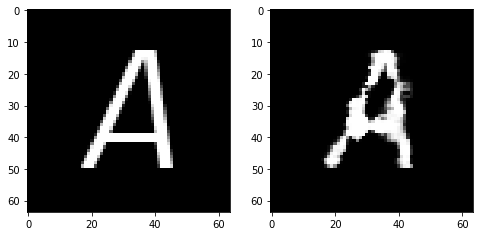

Epoch 156, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5976071134209633, Loss SSIM 2.070921301841736, Loss Local 163.9155399799347


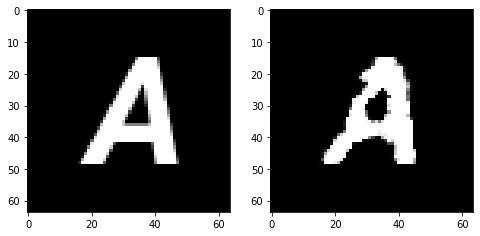

Epoch 157, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5347990803420544, Loss SSIM 2.0079784393310547, Loss Local 177.7704839706421


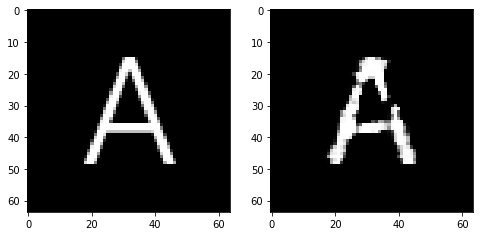

Epoch 157, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5235244445502758, Loss SSIM 2.041660785675049, Loss Local 176.88143730163574


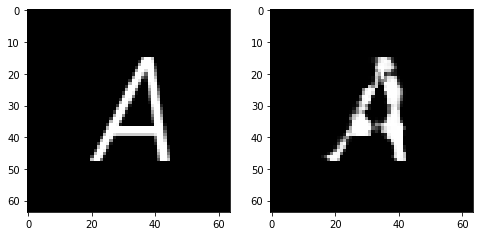

Epoch 157, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5812422446906567, Loss SSIM 2.1016775369644165, Loss Local 175.57410287857056


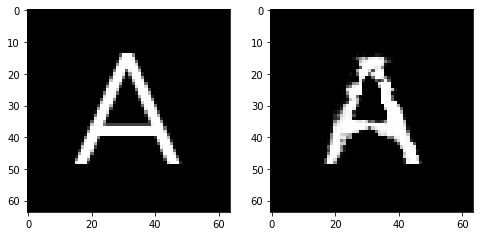

Epoch 157, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5805026926100254, Loss SSIM 2.074857473373413, Loss Local 181.39788818359375


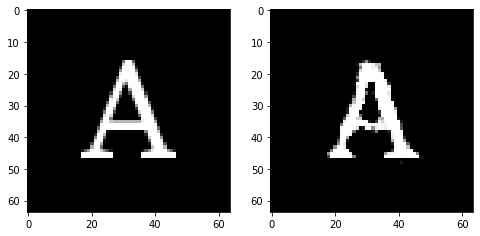

Epoch 157, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.534417301416397, Loss SSIM 1.9506767392158508, Loss Local 173.42875003814697


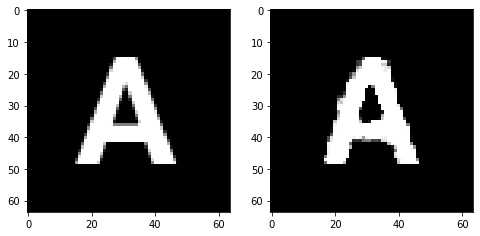

Epoch 157, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5690624825656414, Loss SSIM 2.077766239643097, Loss Local 179.81351613998413


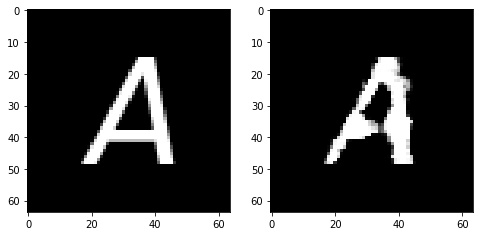

Epoch 157, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5556739419698715, Loss SSIM 2.0310769081115723, Loss Local 173.47285842895508


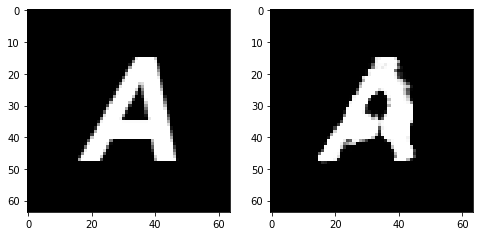

Epoch 158, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5993313416838646, Loss SSIM 2.102681338787079, Loss Local 180.57181072235107


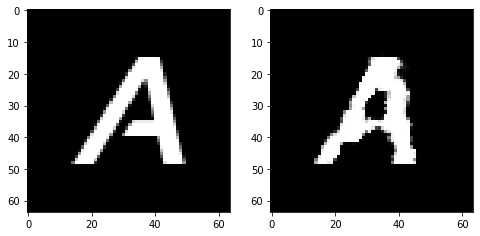

Epoch 158, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5212959572672844, Loss SSIM 1.966579794883728, Loss Local 172.42719793319702


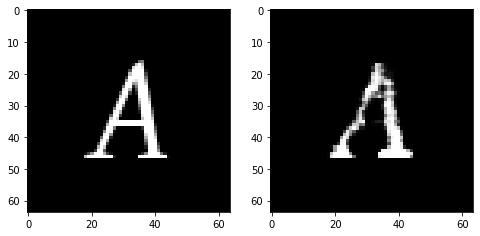

Epoch 158, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4936175979673862, Loss SSIM 1.9451637864112854, Loss Local 162.96867609024048


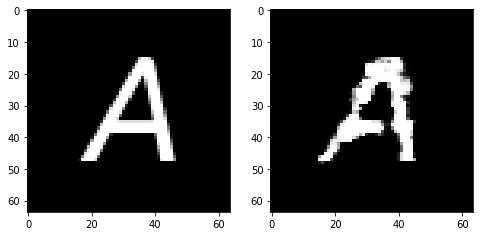

Epoch 158, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6062507592141628, Loss SSIM 2.1518985629081726, Loss Local 186.59453868865967


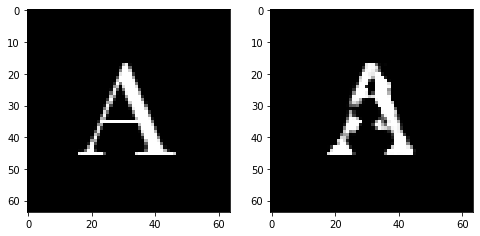

Epoch 158, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5076965019106865, Loss SSIM 2.0010116696357727, Loss Local 171.1892066001892


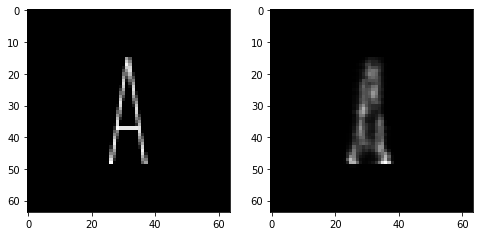

Epoch 158, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5429309234023094, Loss SSIM 1.9921170473098755, Loss Local 180.44691467285156


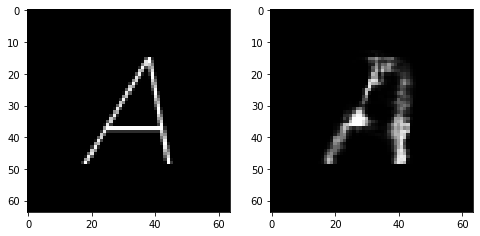

Epoch 158, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.593658410012722, Loss SSIM 2.0912211537361145, Loss Local 177.34037351608276


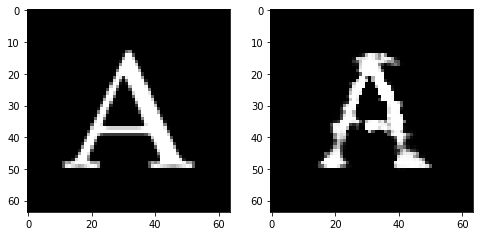

Epoch 159, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5407699830830097, Loss SSIM 1.9981228709220886, Loss Local 173.52286624908447


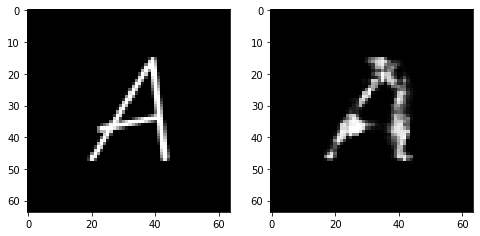

Epoch 159, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5545647740364075, Loss SSIM 2.0158042311668396, Loss Local 175.12314224243164


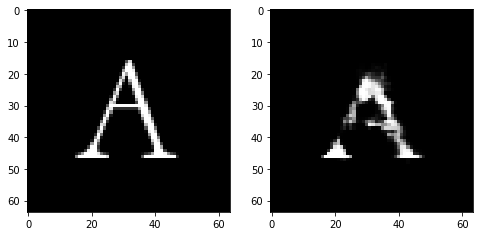

Epoch 159, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.525708019733429, Loss SSIM 2.042619526386261, Loss Local 169.43300247192383


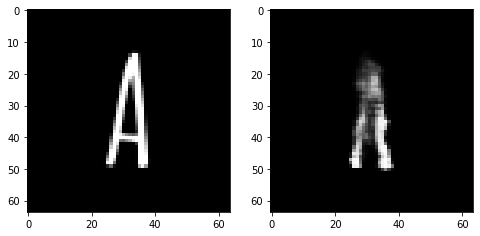

Epoch 159, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.545401182025671, Loss SSIM 2.022400915622711, Loss Local 175.70278120040894


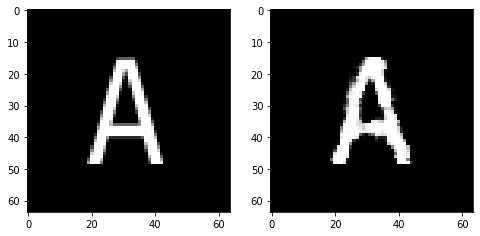

Epoch 159, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5901432894170284, Loss SSIM 2.1015756726264954, Loss Local 184.54915237426758


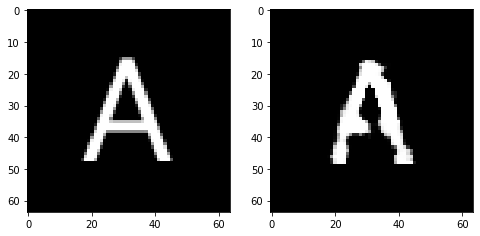

Epoch 159, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5306692980229855, Loss SSIM 1.9928456544876099, Loss Local 178.70172786712646


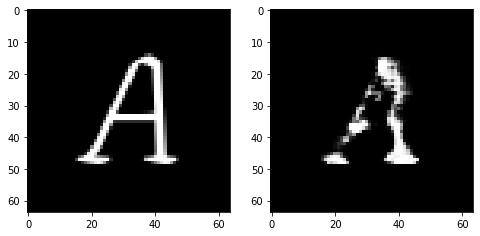

Epoch 159, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6208570003509521, Loss SSIM 2.1746132373809814, Loss Local 186.77071332931519


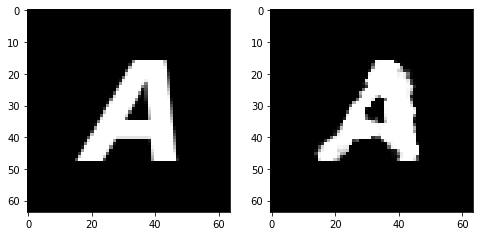

Epoch 160, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5793354734778404, Loss SSIM 2.062041223049164, Loss Local 180.0880913734436


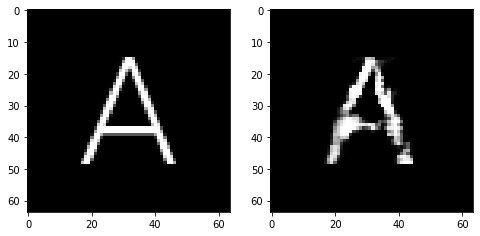

Epoch 160, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.544616561383009, Loss SSIM 2.01746267080307, Loss Local 166.86294746398926


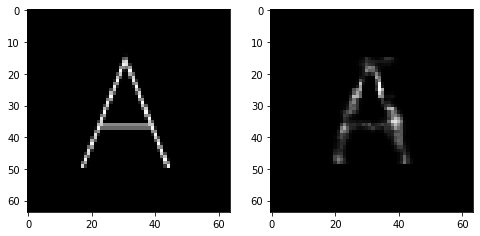

Epoch 160, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5265124551951885, Loss SSIM 1.990605652332306, Loss Local 170.5818452835083


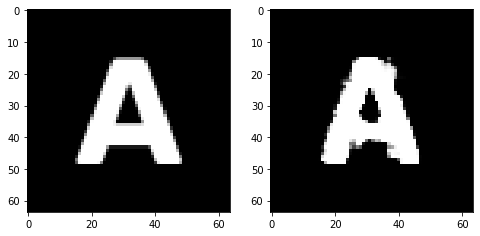

Epoch 160, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.530194703489542, Loss SSIM 2.0232681035995483, Loss Local 173.03133630752563


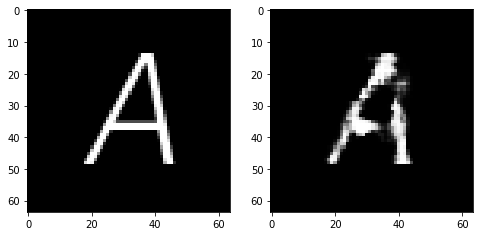

Epoch 160, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.530944138765335, Loss SSIM 1.959627389907837, Loss Local 171.55373287200928


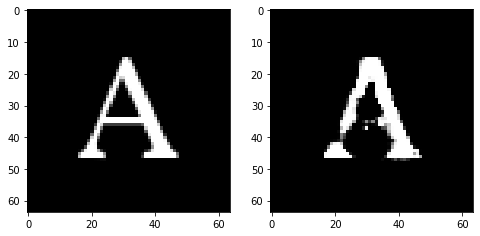

Epoch 160, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5472855679690838, Loss SSIM 2.0222615003585815, Loss Local 174.58992433547974


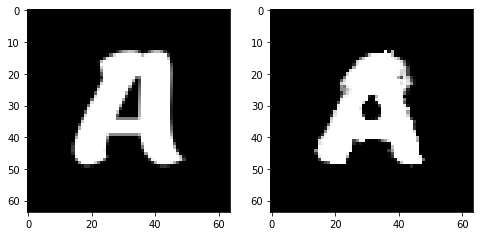

Epoch 160, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6424216069281101, Loss SSIM 2.1615713238716125, Loss Local 175.66205978393555


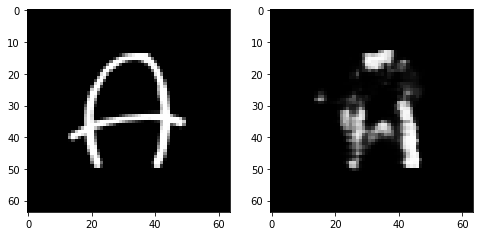

Epoch 161, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5289648734033108, Loss SSIM 2.027803421020508, Loss Local 167.79543900489807


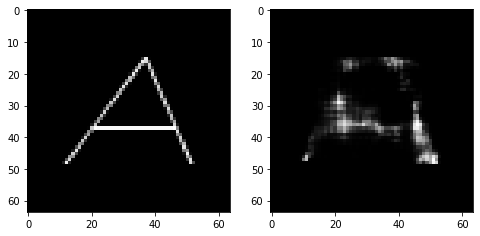

Epoch 161, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5688829608261585, Loss SSIM 2.051259756088257, Loss Local 181.2422218322754


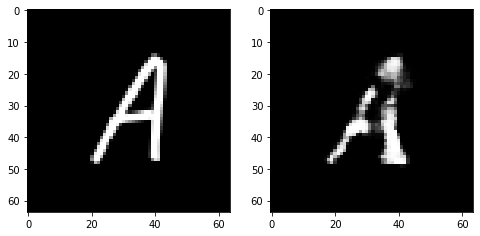

Epoch 161, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.562367357313633, Loss SSIM 2.054187059402466, Loss Local 178.8299217224121


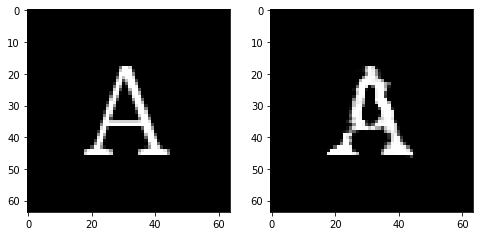

Epoch 161, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5572666488587856, Loss SSIM 2.062126874923706, Loss Local 172.97971105575562


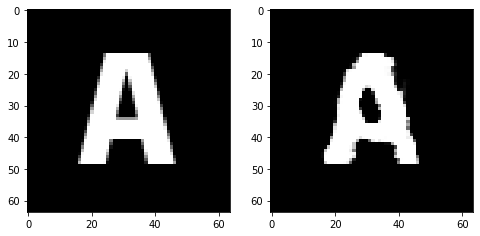

Epoch 161, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.551038596779108, Loss SSIM 1.9818427562713623, Loss Local 170.31722164154053


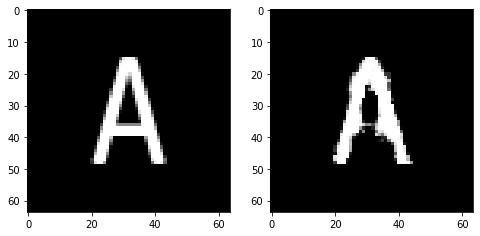

Epoch 161, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5324321128427982, Loss SSIM 2.00340473651886, Loss Local 166.0207018852234


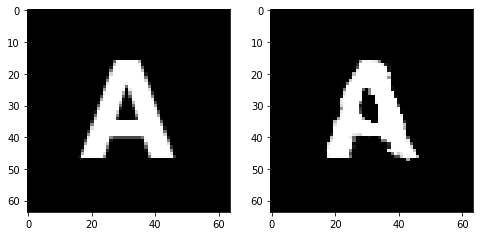

Epoch 161, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5727527290582657, Loss SSIM 2.0424875020980835, Loss Local 174.26054668426514


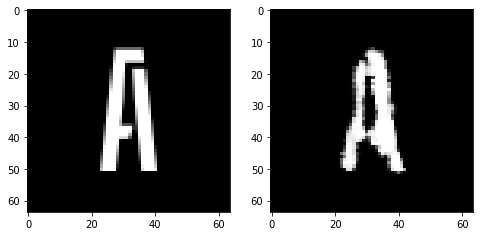

Epoch 162, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5213496945798397, Loss SSIM 2.0083900690078735, Loss Local 178.89531087875366


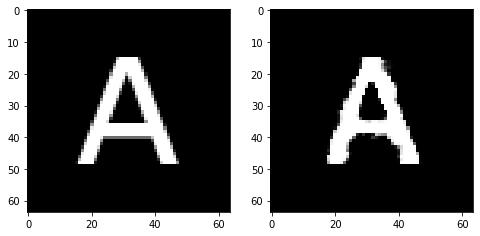

Epoch 162, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5836436301469803, Loss SSIM 2.049587845802307, Loss Local 174.80177068710327


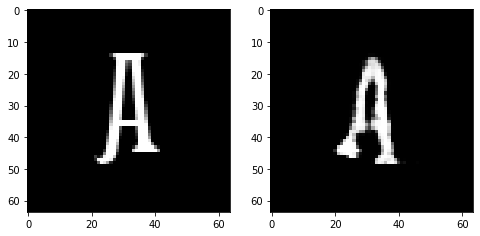

Epoch 162, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.539511602371931, Loss SSIM 2.0451554656028748, Loss Local 174.10158777236938


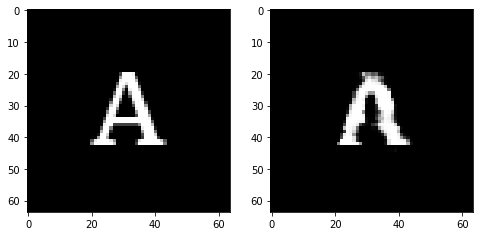

Epoch 162, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5551069043576717, Loss SSIM 1.9884416460990906, Loss Local 166.6412229537964


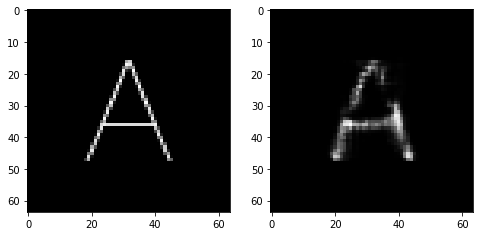

Epoch 162, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5064520984888077, Loss SSIM 1.9707552194595337, Loss Local 170.62943029403687


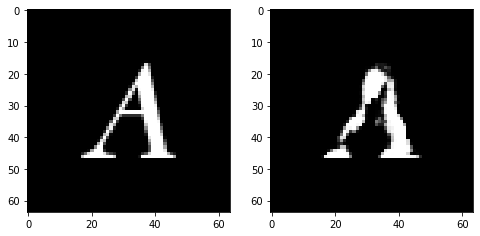

Epoch 162, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5577523335814476, Loss SSIM 2.0321014523506165, Loss Local 182.78146314620972


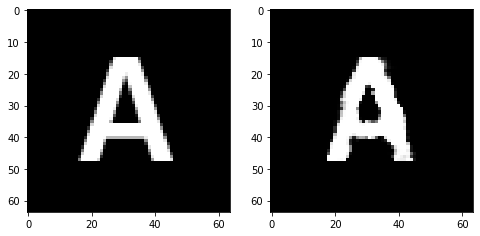

Epoch 162, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5927545502781868, Loss SSIM 2.098604679107666, Loss Local 180.29872226715088


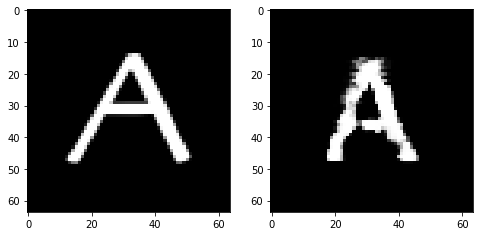

Epoch 163, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5576568767428398, Loss SSIM 2.08442223072052, Loss Local 186.84942770004272


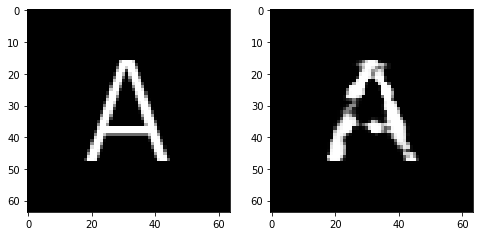

Epoch 163, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5138012282550335, Loss SSIM 1.9495542645454407, Loss Local 165.69811344146729


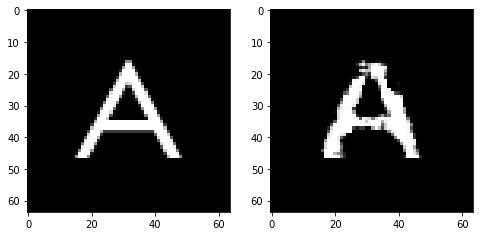

Epoch 163, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5774667039513588, Loss SSIM 2.065683960914612, Loss Local 180.12529754638672


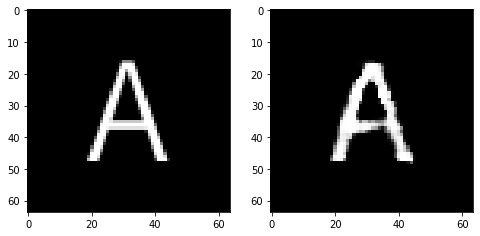

Epoch 163, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5558252930641174, Loss SSIM 2.0560010075569153, Loss Local 175.1116623878479


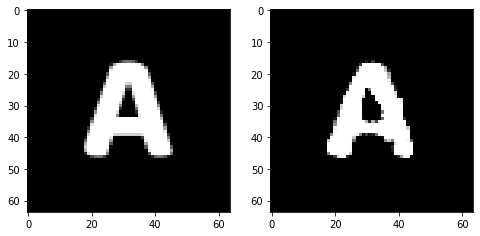

Epoch 163, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5237141363322735, Loss SSIM 1.9975013136863708, Loss Local 174.8250026702881


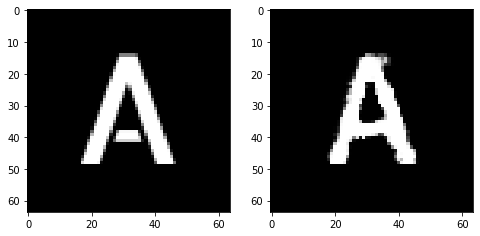

Epoch 163, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5587195865809917, Loss SSIM 2.0306925177574158, Loss Local 166.90621948242188


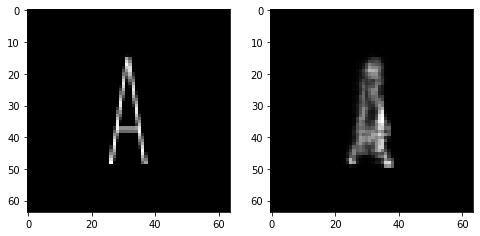

Epoch 163, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5851234272122383, Loss SSIM 2.096449553966522, Loss Local 176.27195143699646


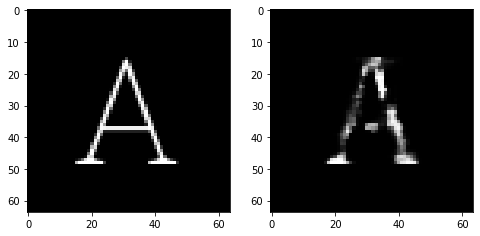

Epoch 164, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5552457384765148, Loss SSIM 2.041003108024597, Loss Local 176.63713550567627


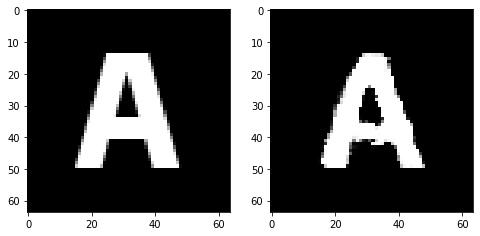

Epoch 164, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5670904070138931, Loss SSIM 2.0653834342956543, Loss Local 173.3200135231018


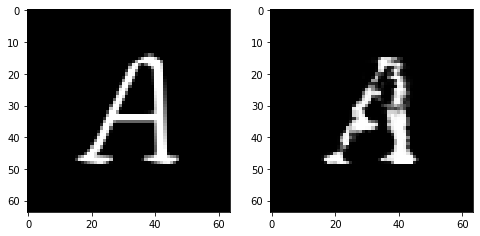

Epoch 164, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5261950083076954, Loss SSIM 1.987303376197815, Loss Local 167.8350281715393


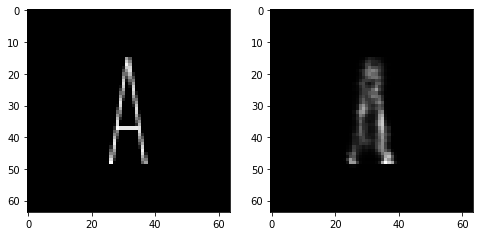

Epoch 164, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5793736800551414, Loss SSIM 2.112668752670288, Loss Local 176.8316149711609


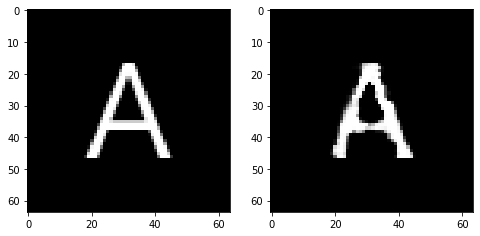

Epoch 164, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5271950997412205, Loss SSIM 1.9944584369659424, Loss Local 175.68849325180054


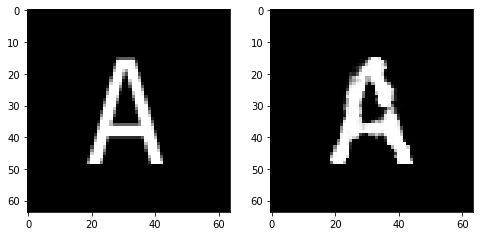

Epoch 164, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5416296236217022, Loss SSIM 1.9712445735931396, Loss Local 166.67641305923462


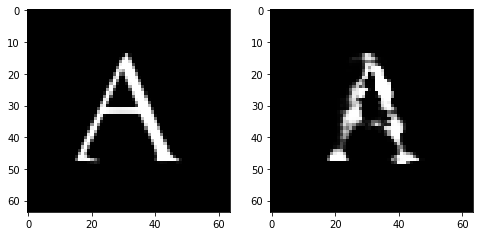

Epoch 164, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5483797453343868, Loss SSIM 1.9838327169418335, Loss Local 180.6648383140564


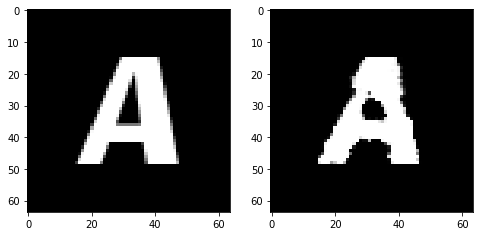

Epoch 165, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6182131841778755, Loss SSIM 2.1449920535087585, Loss Local 181.73287391662598


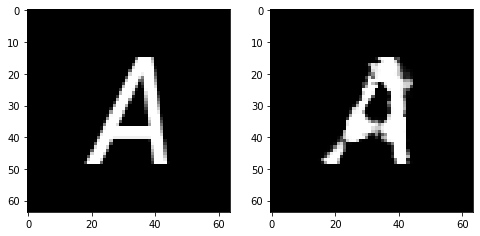

Epoch 165, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5775410421192646, Loss SSIM 2.0609708428382874, Loss Local 176.3859100341797


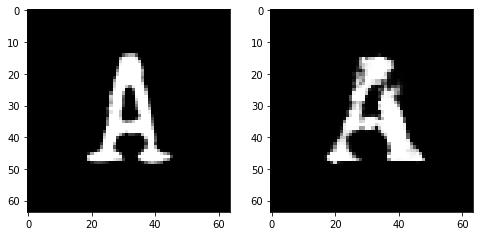

Epoch 165, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.500672321766615, Loss SSIM 1.91764634847641, Loss Local 168.7367033958435


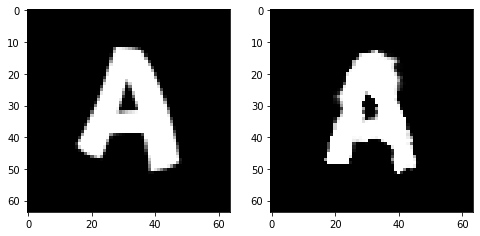

Epoch 165, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5299618542194366, Loss SSIM 1.9663098454475403, Loss Local 169.25423645973206


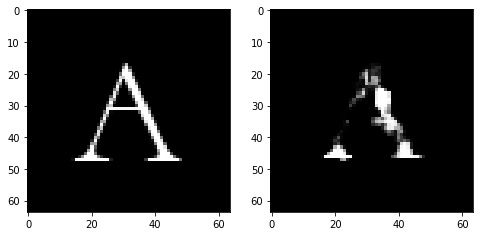

Epoch 165, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5559599250555038, Loss SSIM 2.068998396396637, Loss Local 178.31203413009644


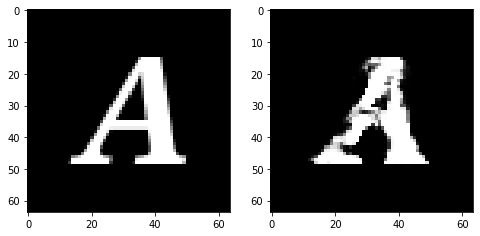

Epoch 165, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5551818162202835, Loss SSIM 2.018445312976837, Loss Local 174.65710592269897


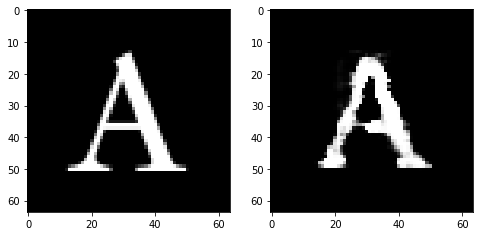

Epoch 165, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5022854954004288, Loss SSIM 1.978607952594757, Loss Local 172.43380546569824


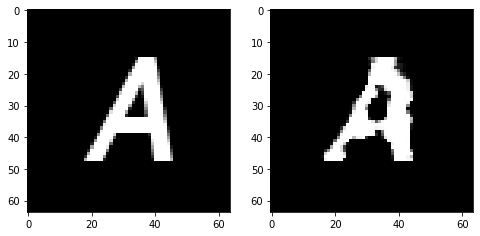

Epoch 166, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5702738985419273, Loss SSIM 2.098877489566803, Loss Local 180.1159119606018


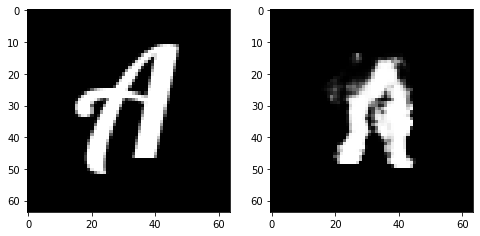

Epoch 166, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.554579608142376, Loss SSIM 2.0565780997276306, Loss Local 174.86195468902588


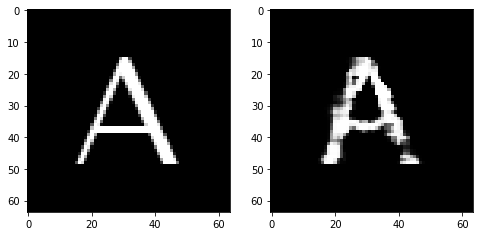

Epoch 166, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5678351819515228, Loss SSIM 2.0302690863609314, Loss Local 172.37653160095215


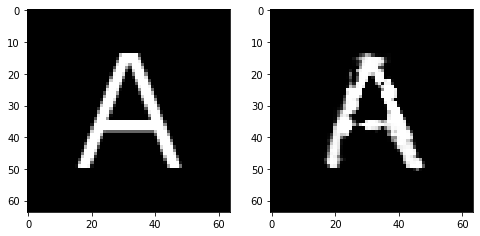

Epoch 166, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5719832442700863, Loss SSIM 2.070086359977722, Loss Local 177.81551694869995


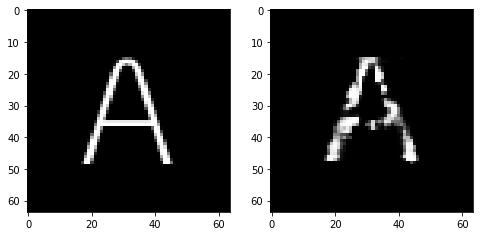

Epoch 166, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5930287390947342, Loss SSIM 2.0830078721046448, Loss Local 183.55004978179932


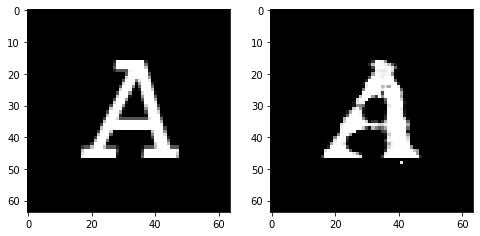

Epoch 166, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5009889416396618, Loss SSIM 1.9245402812957764, Loss Local 157.1536157131195


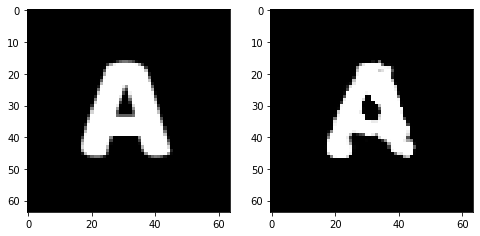

Epoch 166, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5218453370034695, Loss SSIM 1.9758971333503723, Loss Local 166.26385736465454


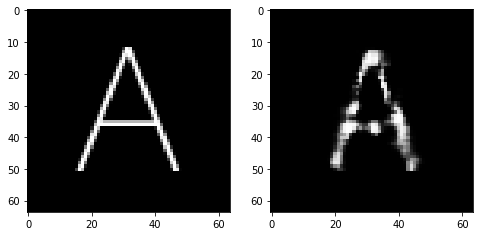

Epoch 167, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5013220496475697, Loss SSIM 1.9398457407951355, Loss Local 164.35516786575317


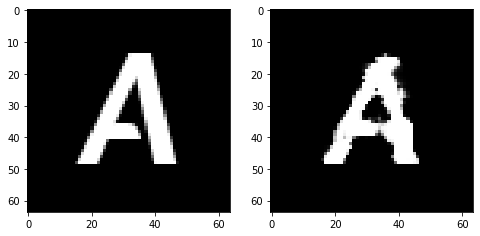

Epoch 167, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5301517881453037, Loss SSIM 2.0203120708465576, Loss Local 170.64545011520386


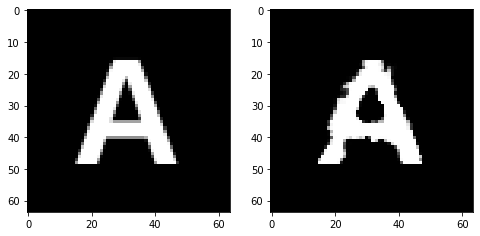

Epoch 167, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5594749599695206, Loss SSIM 2.055360734462738, Loss Local 173.18947982788086


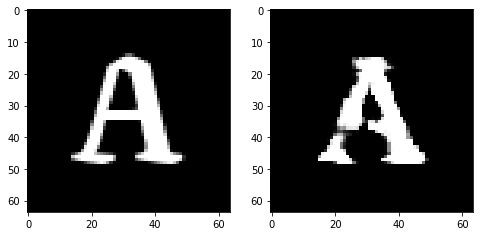

Epoch 167, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5583028756082058, Loss SSIM 2.006793439388275, Loss Local 171.73637008666992


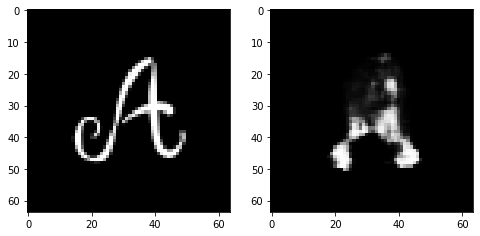

Epoch 167, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5664720311760902, Loss SSIM 2.0217873454093933, Loss Local 175.45866632461548


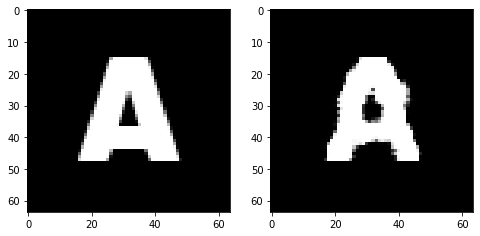

Epoch 167, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5830841027200222, Loss SSIM 2.0941089391708374, Loss Local 175.88278722763062


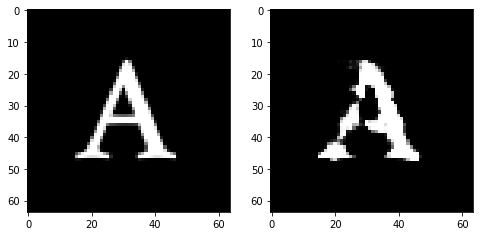

Epoch 167, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5638438872992992, Loss SSIM 2.0649821758270264, Loss Local 171.63857507705688


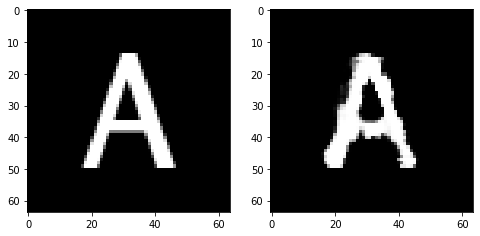

Epoch 168, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5920843444764614, Loss SSIM 2.082270622253418, Loss Local 179.8980073928833


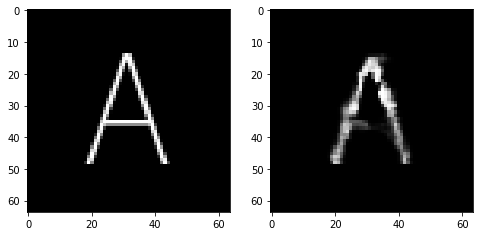

Epoch 168, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5658742636442184, Loss SSIM 2.0819928646087646, Loss Local 165.6576747894287


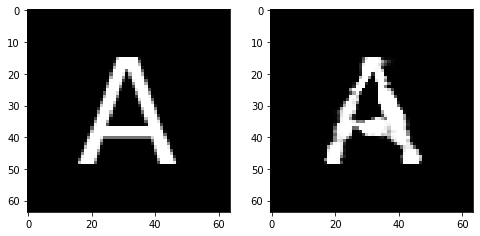

Epoch 168, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6139243803918362, Loss SSIM 2.1102353930473328, Loss Local 179.6889591217041


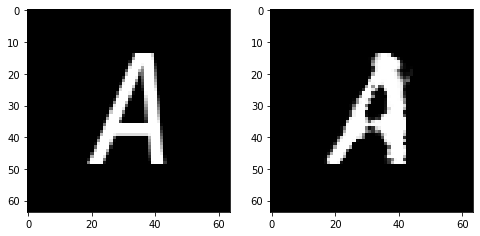

Epoch 168, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5557131431996822, Loss SSIM 2.0402933955192566, Loss Local 181.19228267669678


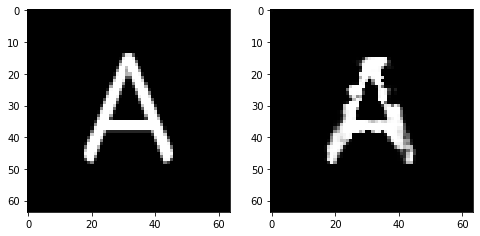

Epoch 168, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5587403662502766, Loss SSIM 2.035171926021576, Loss Local 173.0391869544983


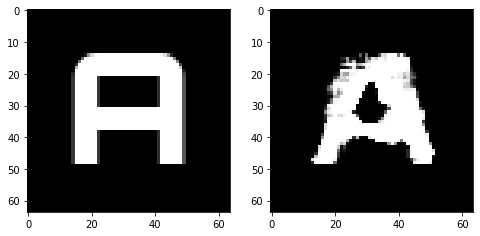

Epoch 168, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5136724263429642, Loss SSIM 1.9869235157966614, Loss Local 166.92690181732178


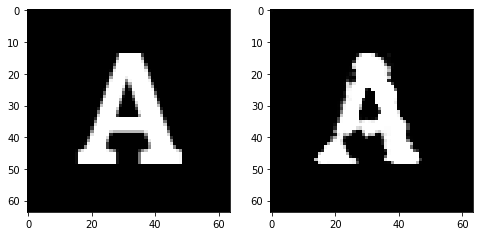

Epoch 168, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5055794306099415, Loss SSIM 1.9649937152862549, Loss Local 183.54238367080688


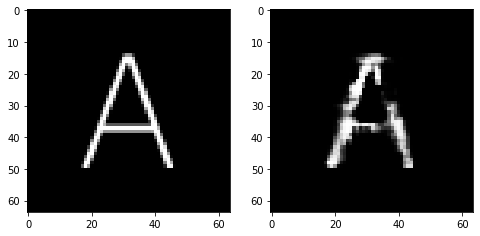

Epoch 169, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5010260082781315, Loss SSIM 1.9374024271965027, Loss Local 179.71209907531738


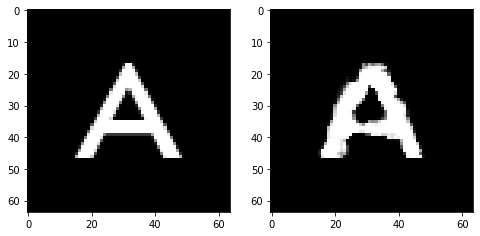

Epoch 169, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5927555076777935, Loss SSIM 2.161135256290436, Loss Local 178.08287954330444


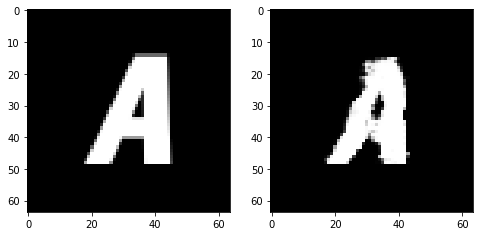

Epoch 169, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5432364270091057, Loss SSIM 1.979969561100006, Loss Local 177.55696964263916


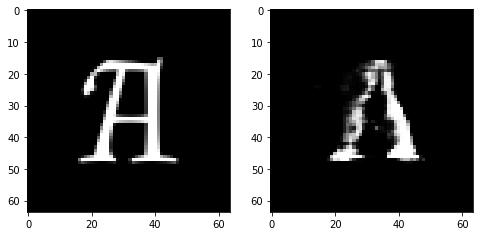

Epoch 169, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5722398906946182, Loss SSIM 2.0690965056419373, Loss Local 169.61128664016724


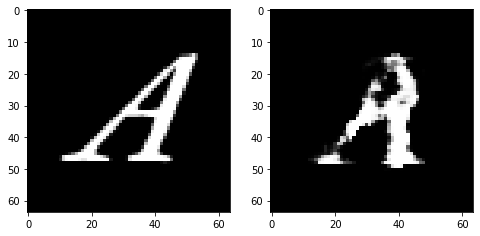

Epoch 169, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5690546184778214, Loss SSIM 2.0165790915489197, Loss Local 176.86652994155884


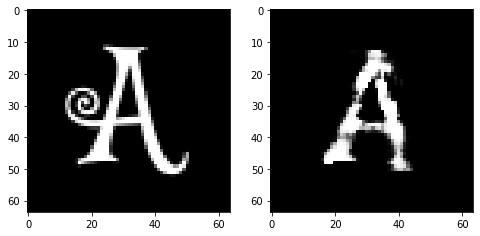

Epoch 169, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5666888654232025, Loss SSIM 2.066847801208496, Loss Local 178.70325803756714


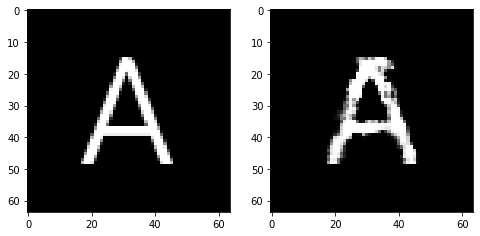

Epoch 169, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5414846986532211, Loss SSIM 2.055354952812195, Loss Local 174.99939012527466


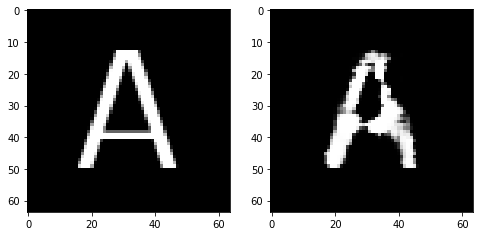

Epoch 170, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5666545033454895, Loss SSIM 2.089483141899109, Loss Local 174.4446816444397


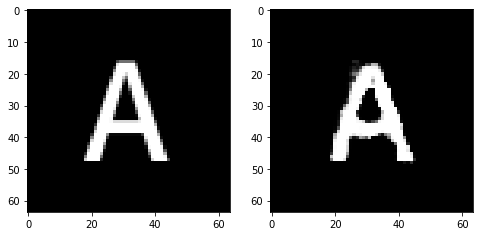

Epoch 170, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5469504930078983, Loss SSIM 1.9758253693580627, Loss Local 170.432945728302


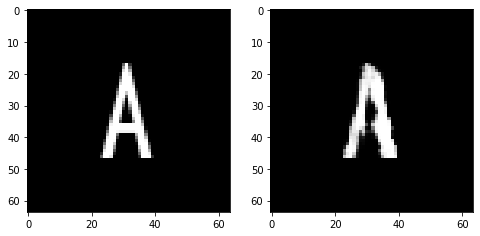

Epoch 170, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5592787489295006, Loss SSIM 2.0452096462249756, Loss Local 170.08580589294434


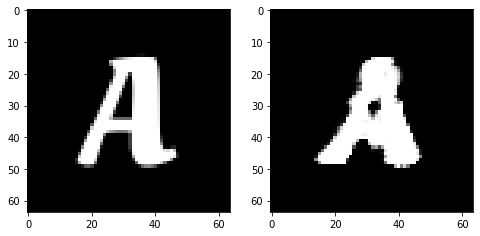

Epoch 170, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5732794366776943, Loss SSIM 2.0644097924232483, Loss Local 172.2566556930542


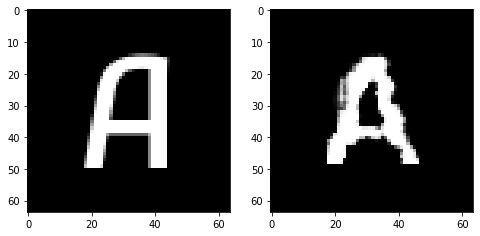

Epoch 170, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5955277048051357, Loss SSIM 2.1003949642181396, Loss Local 179.92535829544067


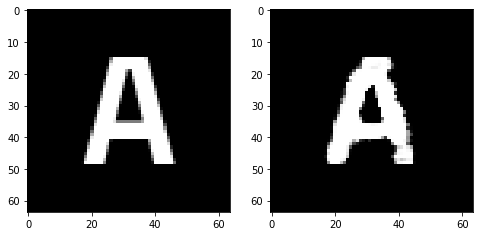

Epoch 170, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.529894020408392, Loss SSIM 1.9695473313331604, Loss Local 173.47431659698486


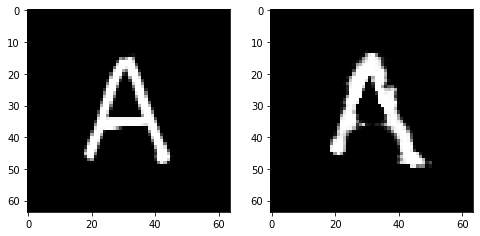

Epoch 170, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.52027577906847, Loss SSIM 1.9959553480148315, Loss Local 172.81318378448486


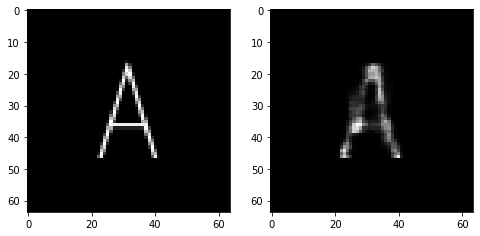

Epoch 171, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5567688941955566, Loss SSIM 2.008545756340027, Loss Local 172.0837779045105


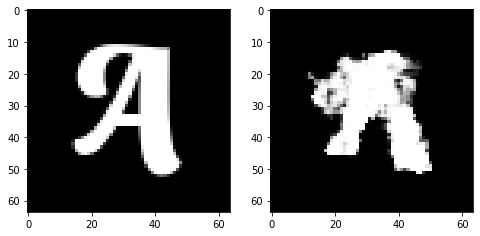

Epoch 171, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5623260885477066, Loss SSIM 2.063107669353485, Loss Local 174.30249643325806


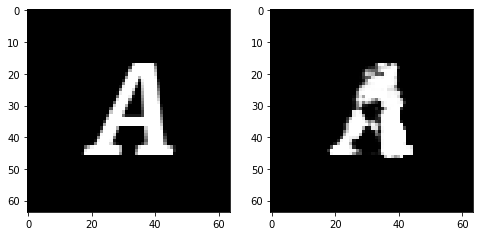

Epoch 171, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5689407251775265, Loss SSIM 2.05287104845047, Loss Local 186.35858869552612


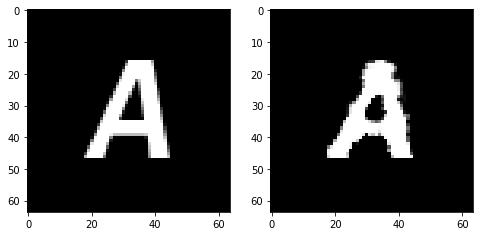

Epoch 171, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5730326138436794, Loss SSIM 2.121183454990387, Loss Local 171.56021404266357


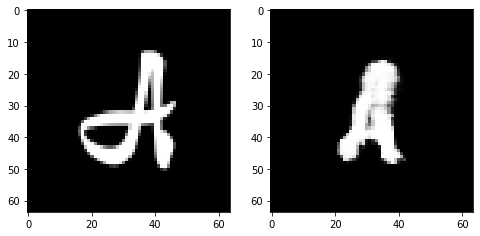

Epoch 171, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5756714381277561, Loss SSIM 2.0947033166885376, Loss Local 179.5416121482849


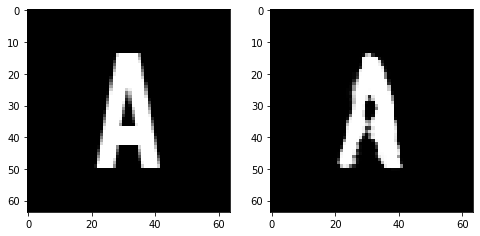

Epoch 171, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5335361286997795, Loss SSIM 1.9349455833435059, Loss Local 172.81720638275146


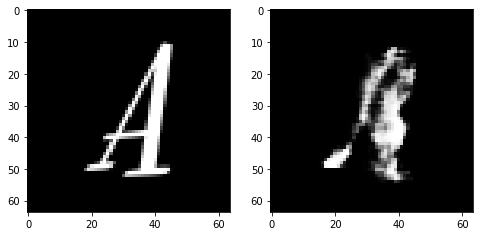

Epoch 171, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5427063703536987, Loss SSIM 2.0197407007217407, Loss Local 175.03046131134033


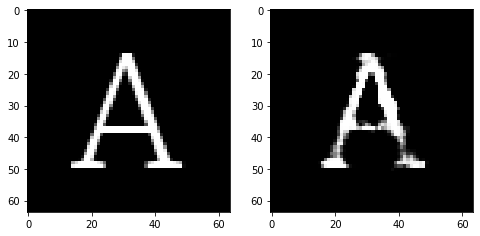

Epoch 172, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5474691279232502, Loss SSIM 2.068007707595825, Loss Local 168.82825469970703


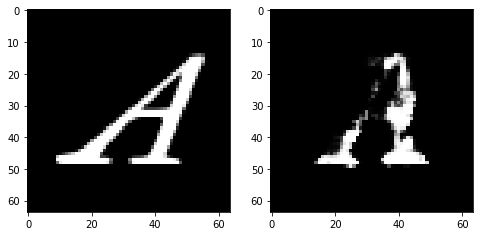

Epoch 172, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5123520568013191, Loss SSIM 2.004605770111084, Loss Local 176.04677391052246


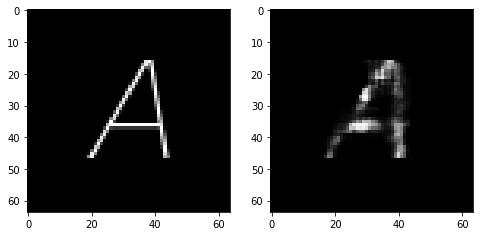

Epoch 172, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5850904323160648, Loss SSIM 2.0741193890571594, Loss Local 186.32124280929565


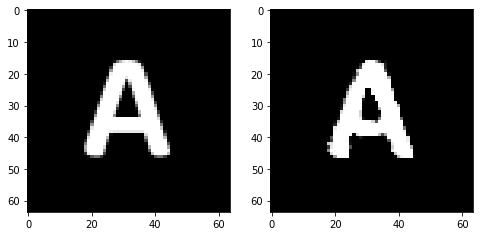

Epoch 172, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5804035104811192, Loss SSIM 2.065260112285614, Loss Local 171.1368703842163


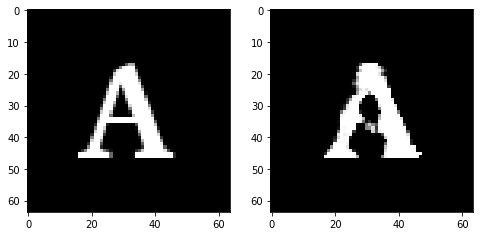

Epoch 172, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5874204114079475, Loss SSIM 2.054233968257904, Loss Local 171.67344856262207


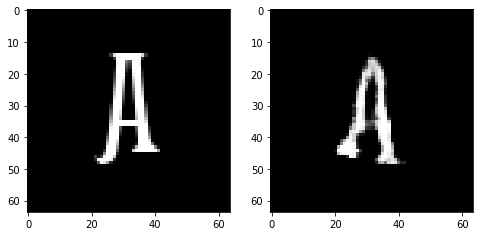

Epoch 172, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5156920440495014, Loss SSIM 1.9339830875396729, Loss Local 170.88481521606445


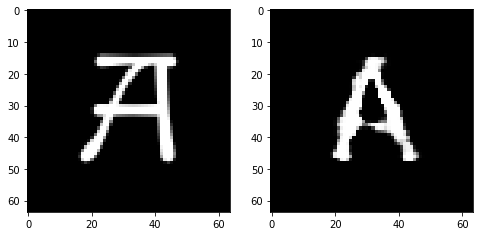

Epoch 172, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5429431796073914, Loss SSIM 2.0337201952934265, Loss Local 171.47415018081665


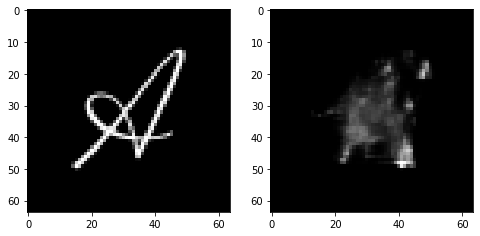

Epoch 173, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5764665231108665, Loss SSIM 2.0376205444335938, Loss Local 175.18775272369385


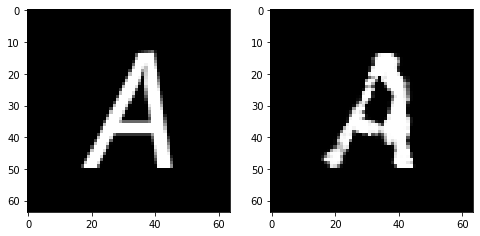

Epoch 173, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.578563142567873, Loss SSIM 2.096949577331543, Loss Local 178.55719900131226


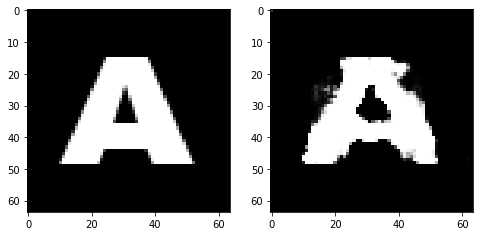

Epoch 173, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5342006161808968, Loss SSIM 2.019241988658905, Loss Local 166.93642616271973


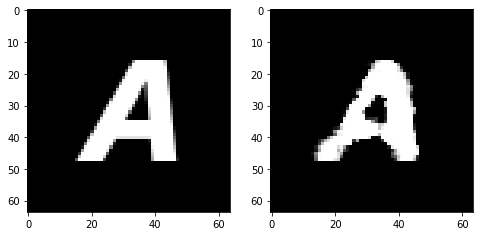

Epoch 173, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5326946526765823, Loss SSIM 2.009436249732971, Loss Local 164.5465271472931


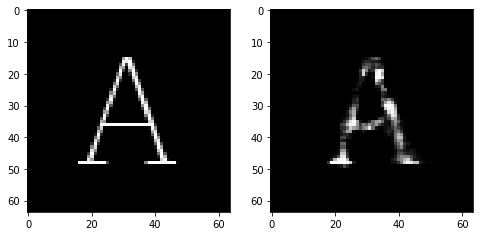

Epoch 173, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5552931800484657, Loss SSIM 2.0049704909324646, Loss Local 165.50775599479675


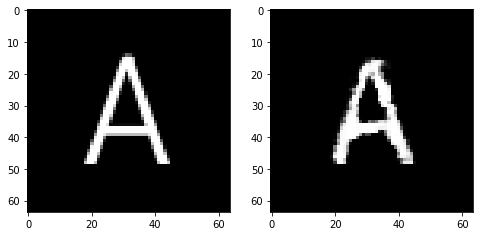

Epoch 173, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4949244111776352, Loss SSIM 1.9290058016777039, Loss Local 178.86423635482788


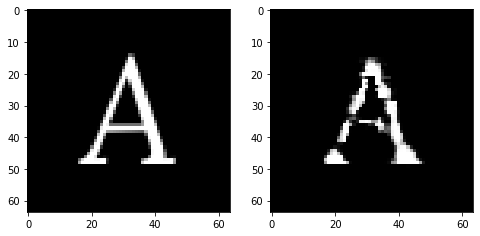

Epoch 173, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.55600506067276, Loss SSIM 2.037360906600952, Loss Local 178.94592475891113


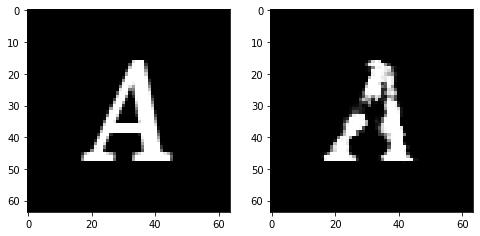

Epoch 174, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.548642311245203, Loss SSIM 2.0163007378578186, Loss Local 168.91463947296143


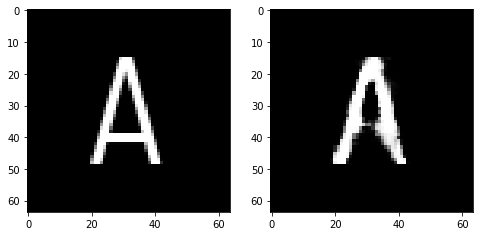

Epoch 174, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5343869142234325, Loss SSIM 2.030391573905945, Loss Local 176.6269829273224


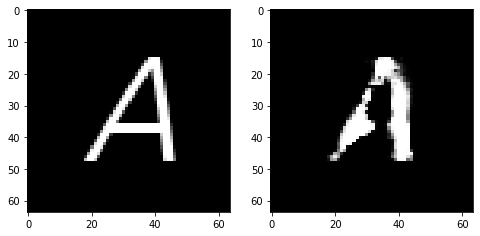

Epoch 174, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.52333789691329, Loss SSIM 1.954647719860077, Loss Local 163.71356916427612


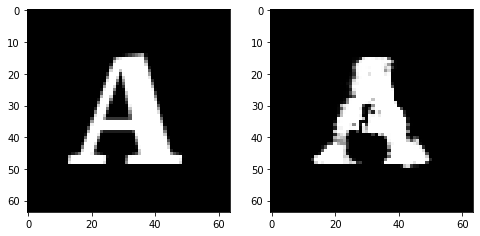

Epoch 174, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5387287996709347, Loss SSIM 2.032155394554138, Loss Local 175.04103326797485


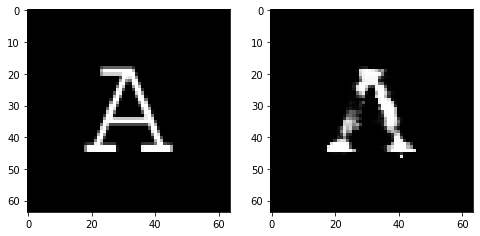

Epoch 174, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5608478374779224, Loss SSIM 1.9947182536125183, Loss Local 179.86594247817993


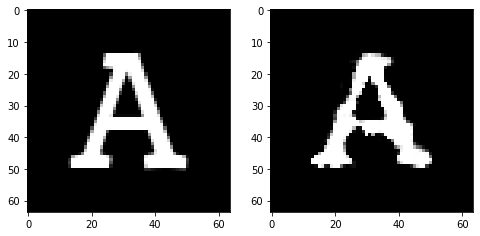

Epoch 174, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6206273287534714, Loss SSIM 2.177274227142334, Loss Local 175.0354495048523


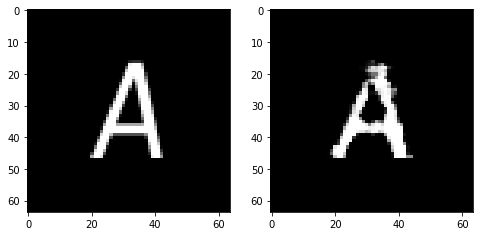

Epoch 174, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5517649203538895, Loss SSIM 2.061668813228607, Loss Local 174.13473081588745


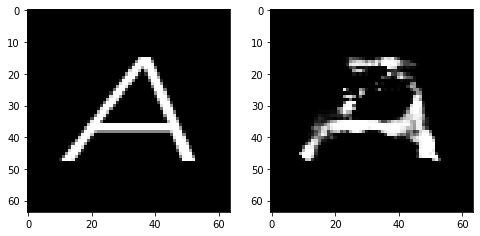

Epoch 175, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.583318267017603, Loss SSIM 2.082737684249878, Loss Local 177.6766061782837


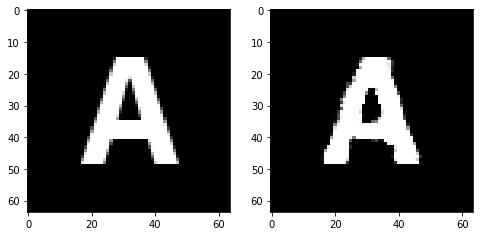

Epoch 175, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5199157781898975, Loss SSIM 1.9660184383392334, Loss Local 165.32434487342834


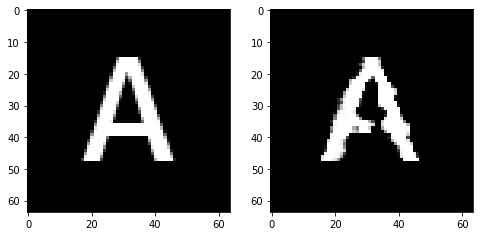

Epoch 175, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5822775959968567, Loss SSIM 2.087210953235626, Loss Local 170.48090648651123


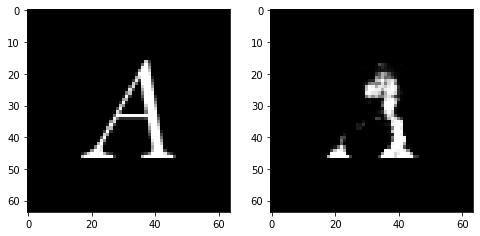

Epoch 175, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.538443148136139, Loss SSIM 2.0347864031791687, Loss Local 169.09585428237915


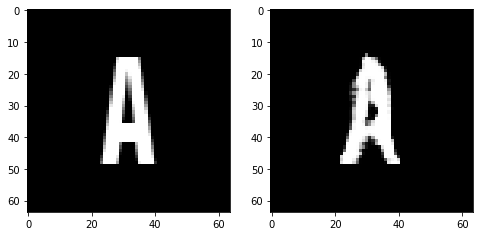

Epoch 175, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5387890078127384, Loss SSIM 1.9945210814476013, Loss Local 179.3756194114685


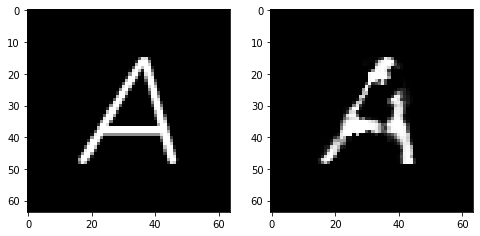

Epoch 175, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5398611985147, Loss SSIM 1.9903650283813477, Loss Local 181.99081134796143


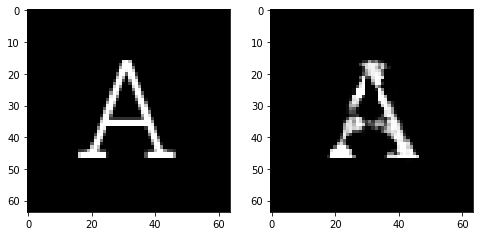

Epoch 175, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5381897129118443, Loss SSIM 2.0377811789512634, Loss Local 184.8805103302002


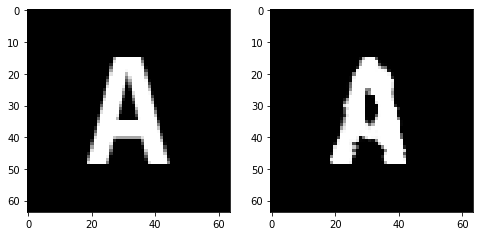

Epoch 176, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5978315621614456, Loss SSIM 2.045590102672577, Loss Local 174.84319400787354


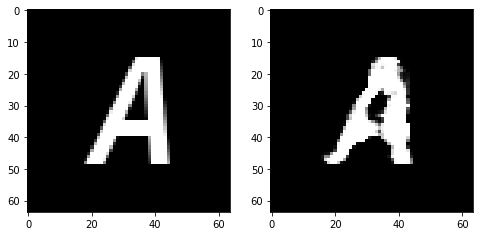

Epoch 176, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5517148412764072, Loss SSIM 2.0462501645088196, Loss Local 170.47362542152405


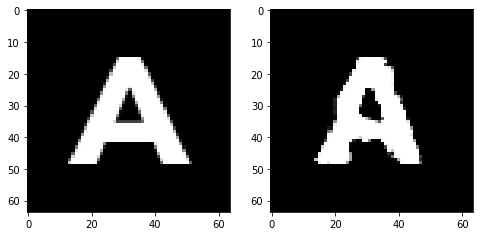

Epoch 176, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5249933451414108, Loss SSIM 2.0163300037384033, Loss Local 173.5009150505066


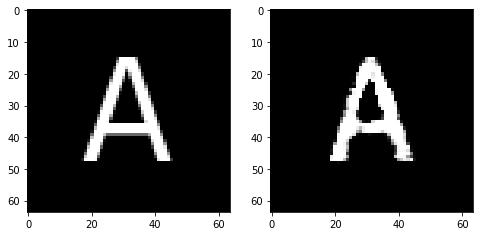

Epoch 176, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6246035769581795, Loss SSIM 2.1034027338027954, Loss Local 183.09570407867432


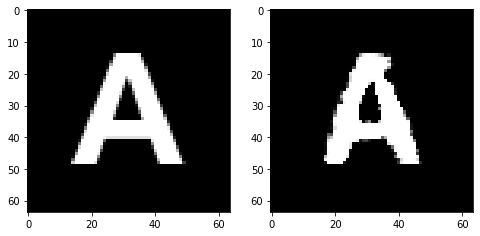

Epoch 176, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.520118374377489, Loss SSIM 1.997098982334137, Loss Local 174.98092603683472


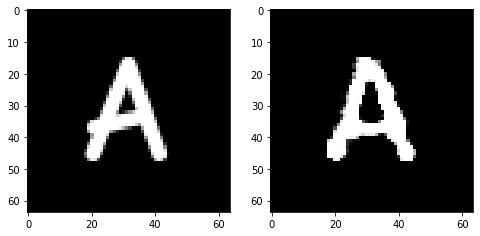

Epoch 176, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.568379957228899, Loss SSIM 2.1246760487556458, Loss Local 178.7800154685974


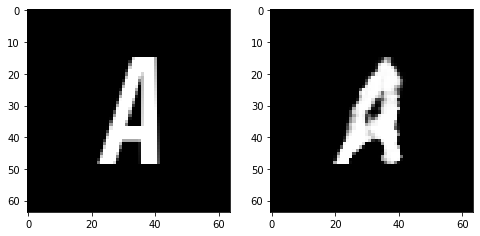

Epoch 176, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4959224238991737, Loss SSIM 1.932255208492279, Loss Local 172.18901705741882


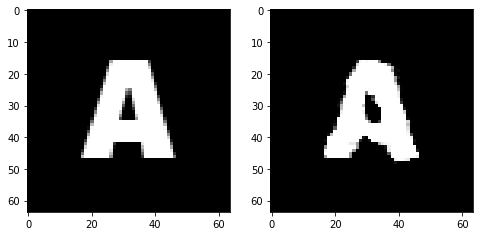

Epoch 177, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5683527775108814, Loss SSIM 2.0652160048484802, Loss Local 170.8120994567871


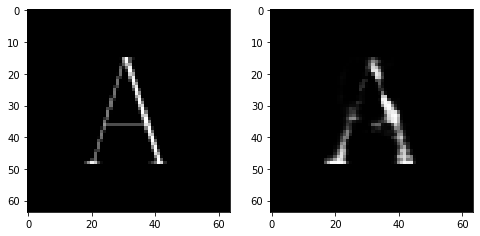

Epoch 177, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5722480937838554, Loss SSIM 2.036013960838318, Loss Local 172.57201099395752


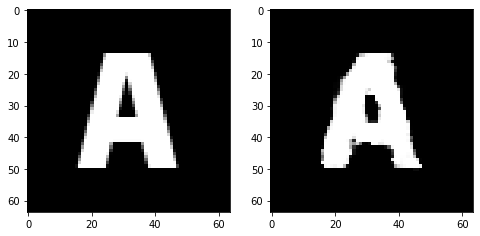

Epoch 177, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5250706858932972, Loss SSIM 1.9595159888267517, Loss Local 163.6960792541504


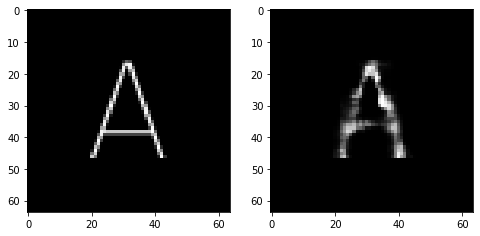

Epoch 177, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5378499887883663, Loss SSIM 2.0561598539352417, Loss Local 167.25927639007568


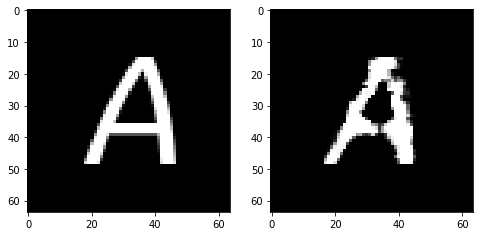

Epoch 177, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5260722301900387, Loss SSIM 1.9382973313331604, Loss Local 165.7955183982849


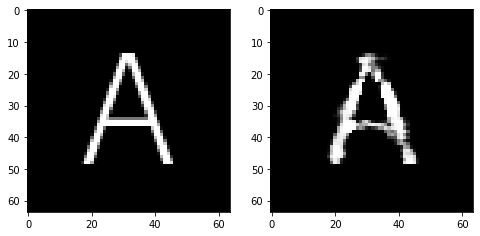

Epoch 177, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5640618838369846, Loss SSIM 2.0726375579833984, Loss Local 171.18706560134888


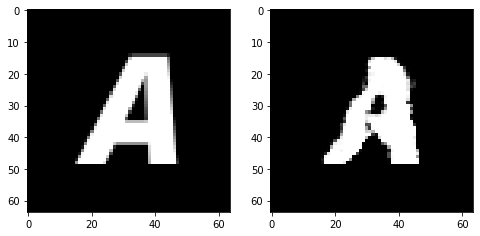

Epoch 177, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5876989215612411, Loss SSIM 2.1114449501037598, Loss Local 180.68303298950195


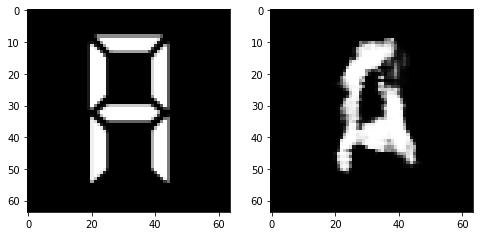

Epoch 178, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.535052351653576, Loss SSIM 1.9867017269134521, Loss Local 176.46920537948608


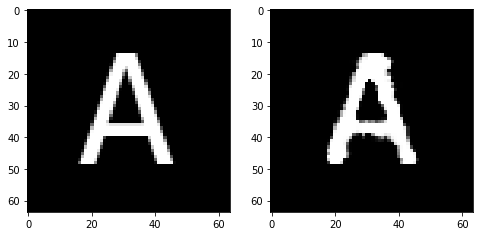

Epoch 178, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5782818049192429, Loss SSIM 2.069894790649414, Loss Local 180.62694644927979


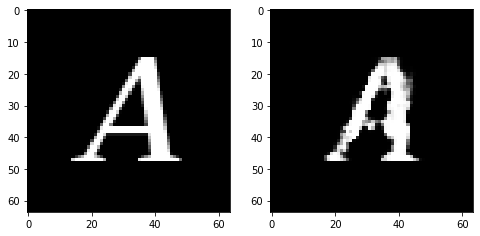

Epoch 178, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5661578848958015, Loss SSIM 2.030592978000641, Loss Local 172.536283493042


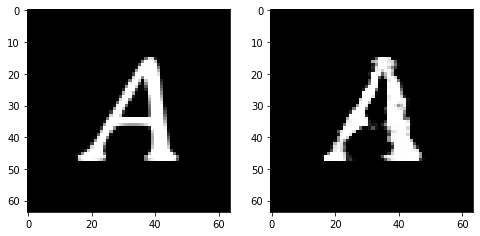

Epoch 178, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.576292797923088, Loss SSIM 2.0897695422172546, Loss Local 194.0331573486328


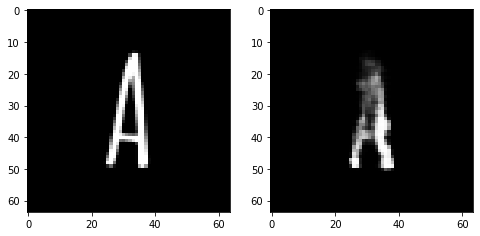

Epoch 178, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6419939287006855, Loss SSIM 2.176575720310211, Loss Local 179.1369390487671


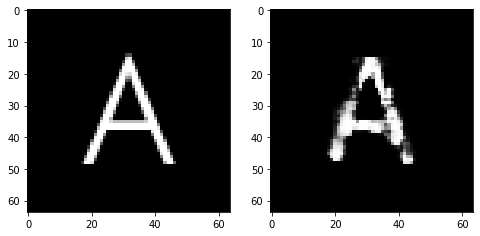

Epoch 178, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5053005293011665, Loss SSIM 1.9753275513648987, Loss Local 175.91634273529053


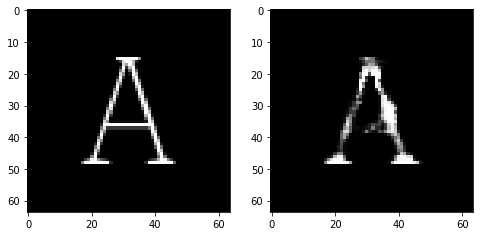

Epoch 178, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5198248513042927, Loss SSIM 2.0040287375450134, Loss Local 173.02354621887207


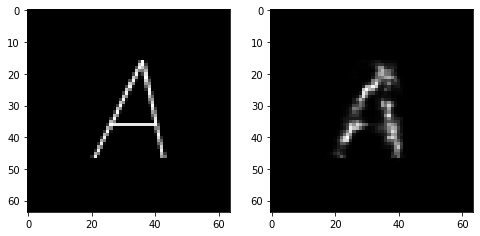

Epoch 179, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5934861116111279, Loss SSIM 2.097377359867096, Loss Local 174.4544415473938


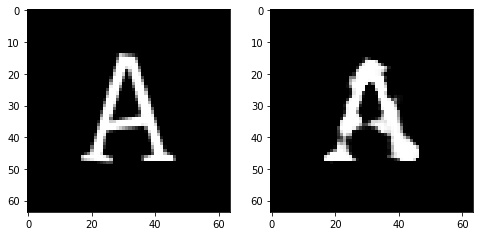

Epoch 179, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.541225578635931, Loss SSIM 1.9801193475723267, Loss Local 169.34163904190063


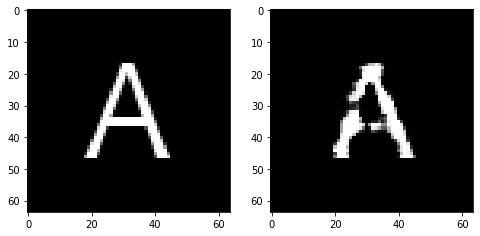

Epoch 179, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5232583619654179, Loss SSIM 1.9992443919181824, Loss Local 173.578595161438


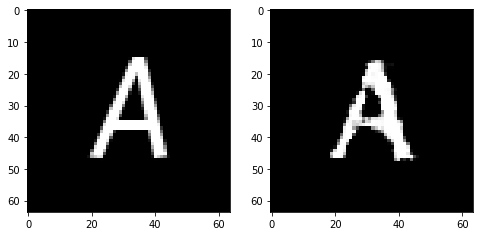

Epoch 179, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5155713334679604, Loss SSIM 1.9514350891113281, Loss Local 165.86053609848022


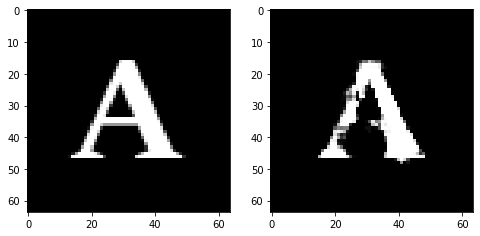

Epoch 179, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5562244728207588, Loss SSIM 2.0166987776756287, Loss Local 164.94749093055725


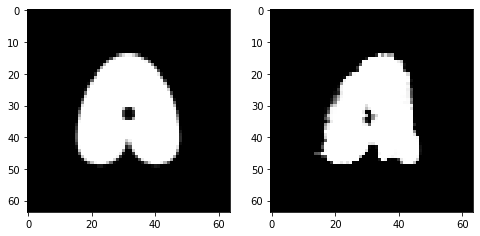

Epoch 179, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5798151977360249, Loss SSIM 2.0717843174934387, Loss Local 173.4678816795349


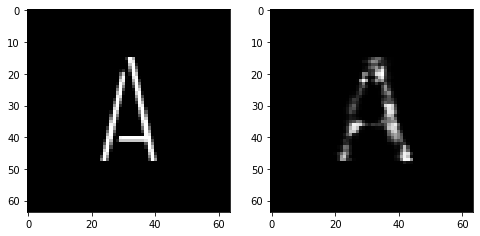

Epoch 179, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.579706832766533, Loss SSIM 2.1060149669647217, Loss Local 181.67701148986816


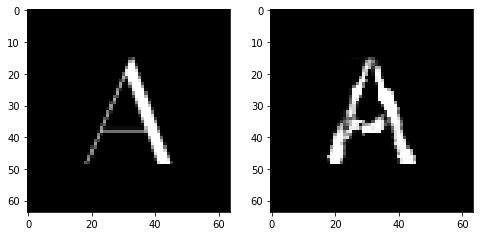

Epoch 180, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5575806945562363, Loss SSIM 2.0523282289505005, Loss Local 178.91653394699097


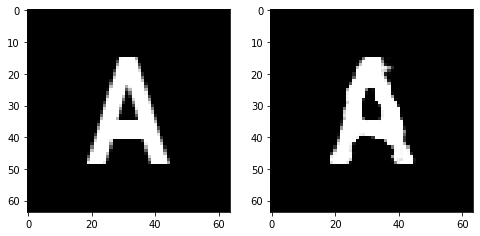

Epoch 180, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5741057209670544, Loss SSIM 2.1079015731811523, Loss Local 169.58446335792542


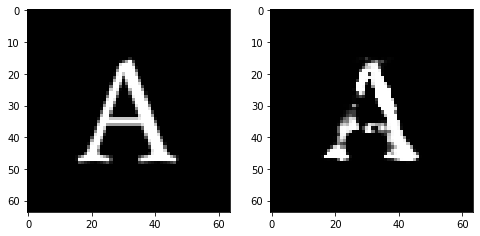

Epoch 180, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5099031515419483, Loss SSIM 1.9528112411499023, Loss Local 163.12488794326782


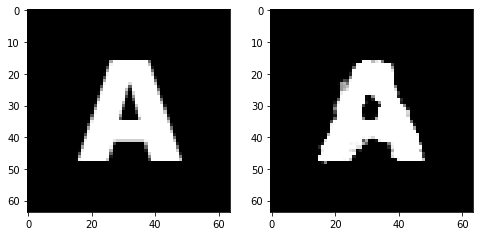

Epoch 180, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5475197173655033, Loss SSIM 2.0368640422821045, Loss Local 174.24311542510986


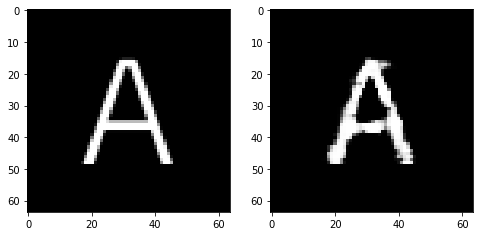

Epoch 180, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5179748758673668, Loss SSIM 1.9842673540115356, Loss Local 170.65681505203247


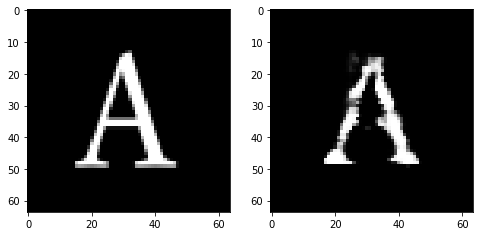

Epoch 180, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6145114973187447, Loss SSIM 2.0678356885910034, Loss Local 191.25862169265747


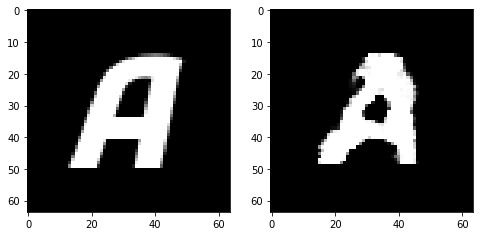

Epoch 180, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.540872074663639, Loss SSIM 2.0381776690483093, Loss Local 173.43166589736938


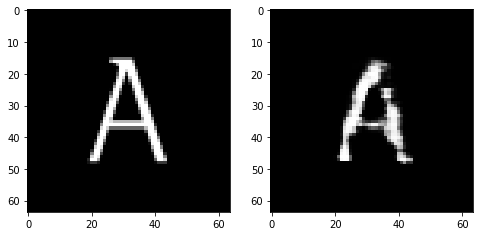

Epoch 181, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5564597770571709, Loss SSIM 2.057709574699402, Loss Local 173.45451021194458


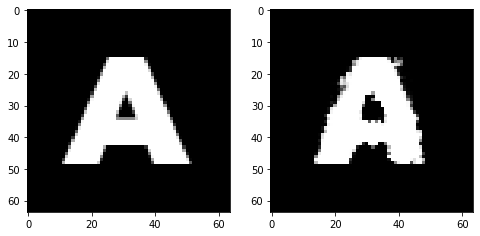

Epoch 181, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5646218433976173, Loss SSIM 2.0289788842201233, Loss Local 166.78206205368042


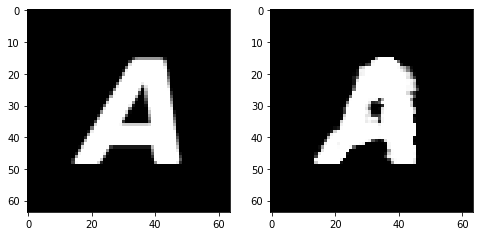

Epoch 181, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5743208937346935, Loss SSIM 2.0807794332504272, Loss Local 178.0192198753357


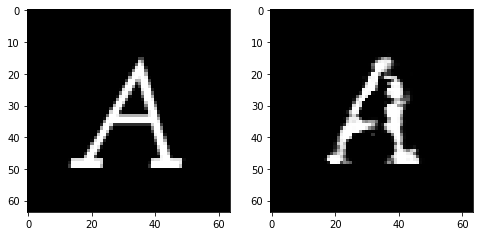

Epoch 181, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4995034225285053, Loss SSIM 1.9596718549728394, Loss Local 171.73861408233643


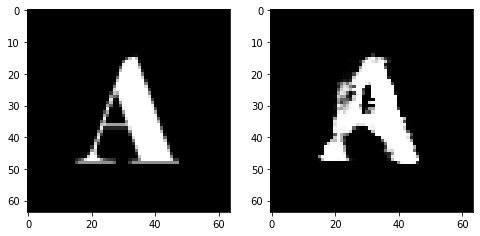

Epoch 181, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5951199494302273, Loss SSIM 2.1279951333999634, Loss Local 181.5437307357788


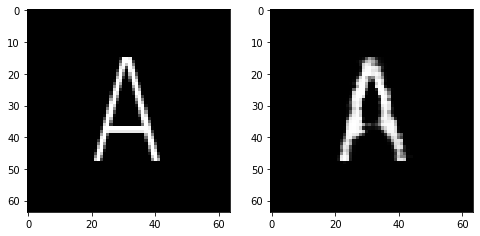

Epoch 181, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5065476074814796, Loss SSIM 1.944925308227539, Loss Local 165.26902294158936


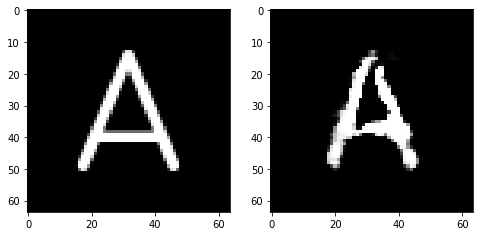

Epoch 181, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5933277010917664, Loss SSIM 2.0897132754325867, Loss Local 180.53681087493896


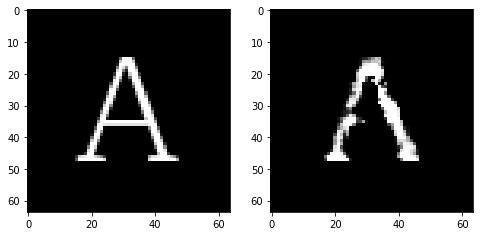

Epoch 182, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5820176899433136, Loss SSIM 2.086957335472107, Loss Local 183.57032251358032


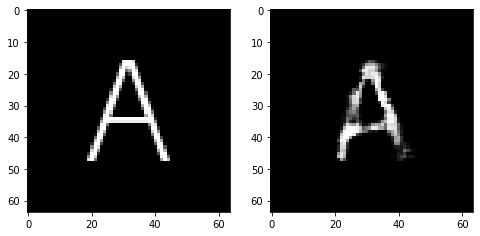

Epoch 182, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5680508688092232, Loss SSIM 2.057820677757263, Loss Local 172.11575841903687


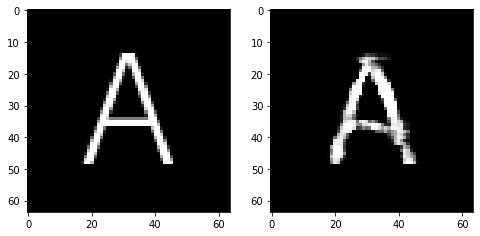

Epoch 182, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.535266499966383, Loss SSIM 2.0126914381980896, Loss Local 182.15538215637207


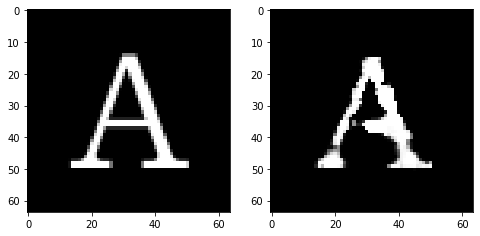

Epoch 182, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5456212759017944, Loss SSIM 2.0320980548858643, Loss Local 170.97571563720703


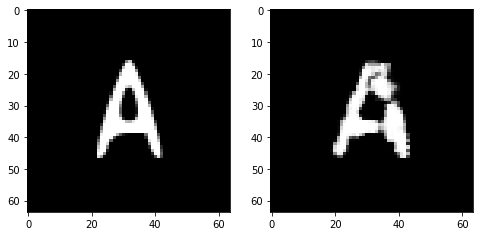

Epoch 182, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.523425653576851, Loss SSIM 1.98542058467865, Loss Local 173.36815214157104


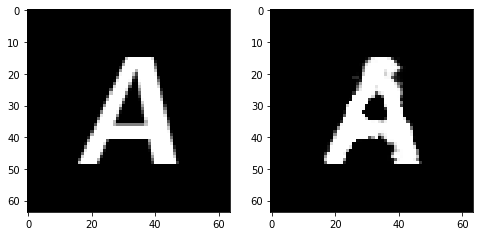

Epoch 182, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5516892820596695, Loss SSIM 1.994445264339447, Loss Local 180.43140411376953


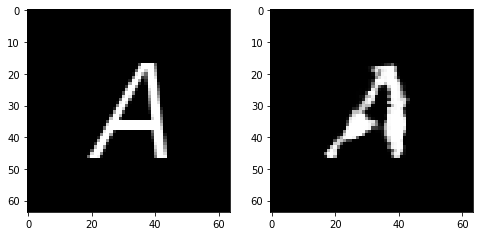

Epoch 182, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.566806972026825, Loss SSIM 2.0611332058906555, Loss Local 176.94701480865479


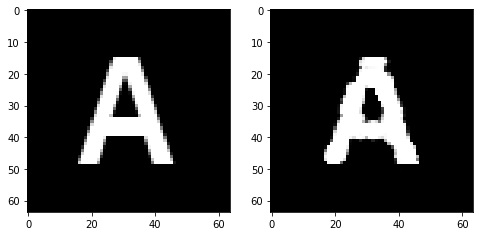

Epoch 183, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.568331878632307, Loss SSIM 2.0113314390182495, Loss Local 174.9676547050476


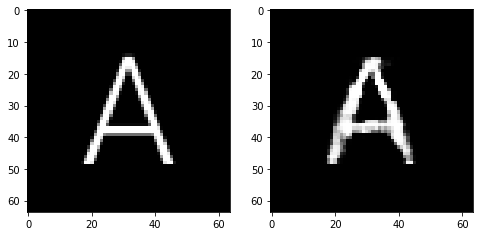

Epoch 183, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.57356958091259, Loss SSIM 2.0759003162384033, Loss Local 177.2687430381775


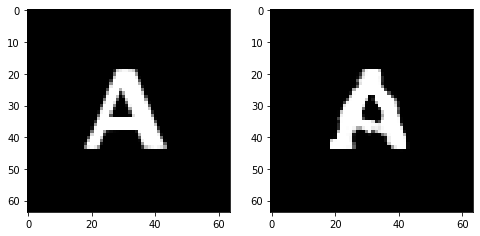

Epoch 183, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5376756452023983, Loss SSIM 2.009884834289551, Loss Local 168.3029396533966


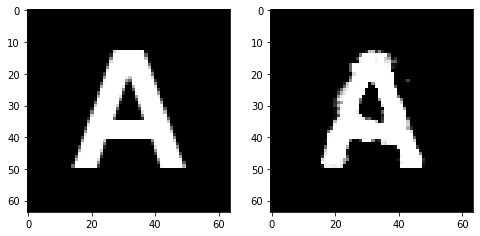

Epoch 183, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5637730844318867, Loss SSIM 2.0590614080429077, Loss Local 174.03306078910828


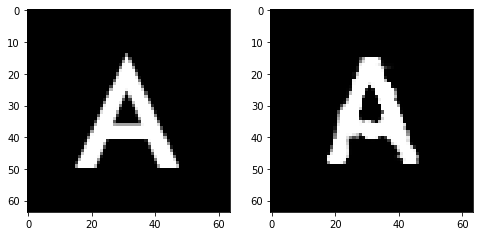

Epoch 183, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5492180921137333, Loss SSIM 1.9939522743225098, Loss Local 178.14905452728271


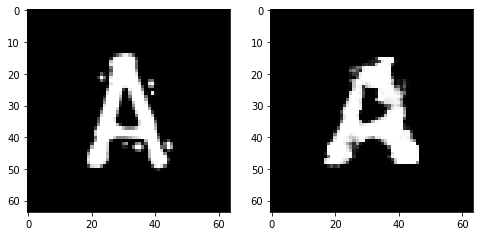

Epoch 183, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.519379273056984, Loss SSIM 2.0246713757514954, Loss Local 169.73338270187378


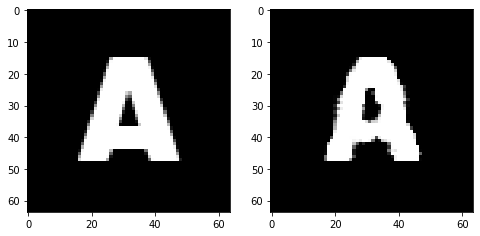

Epoch 183, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5329064317047596, Loss SSIM 2.004690110683441, Loss Local 180.62915754318237


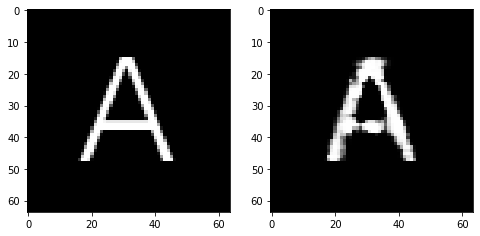

Epoch 184, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5957087837159634, Loss SSIM 2.103683114051819, Loss Local 178.141704082489


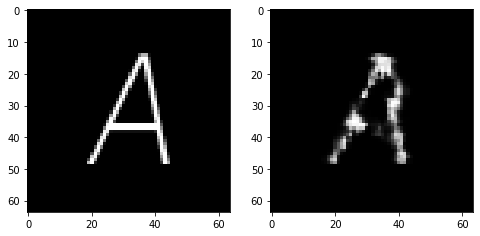

Epoch 184, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5936670005321503, Loss SSIM 2.0723339319229126, Loss Local 190.73667669296265


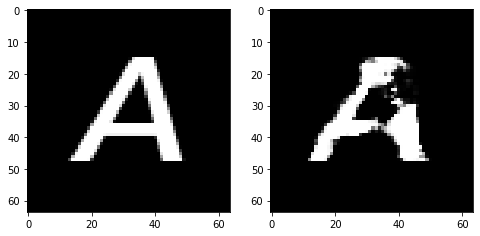

Epoch 184, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5112530291080475, Loss SSIM 2.0007275342941284, Loss Local 162.20280838012695


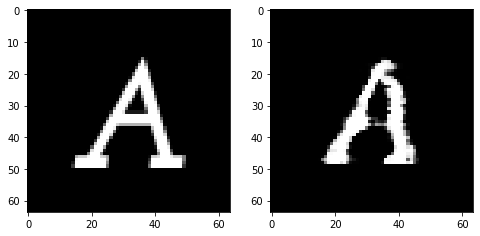

Epoch 184, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5193538255989552, Loss SSIM 1.987915277481079, Loss Local 168.01073741912842


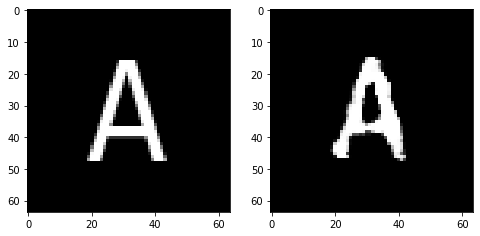

Epoch 184, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5564335770905018, Loss SSIM 2.0483221411705017, Loss Local 172.46947050094604


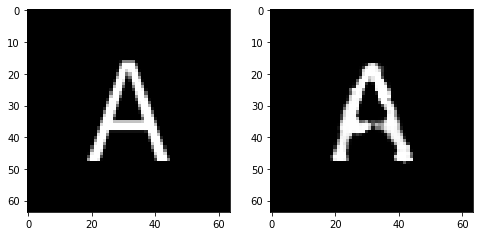

Epoch 184, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.553390983492136, Loss SSIM 2.0187716484069824, Loss Local 170.5452916622162


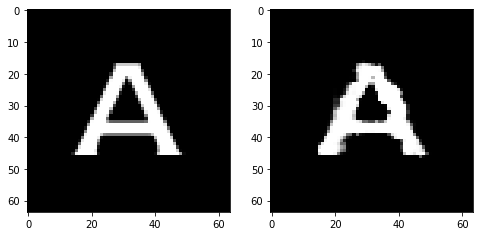

Epoch 184, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.538808148354292, Loss SSIM 2.0108490586280823, Loss Local 176.42930698394775


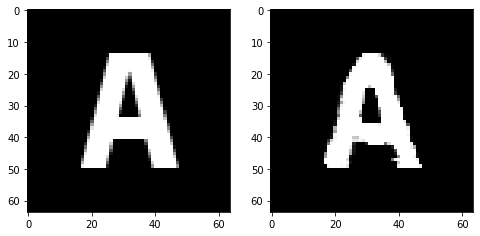

Epoch 185, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5707366429269314, Loss SSIM 2.07847398519516, Loss Local 178.44504594802856


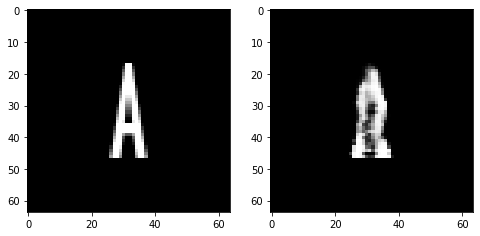

Epoch 185, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5747034214437008, Loss SSIM 2.0705230832099915, Loss Local 174.9999918937683


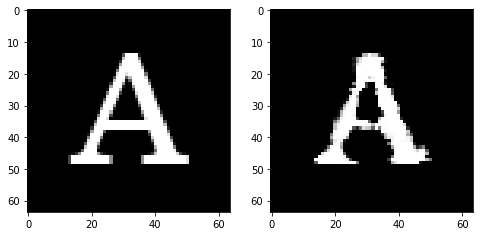

Epoch 185, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5073918253183365, Loss SSIM 1.9305163025856018, Loss Local 171.1158618927002


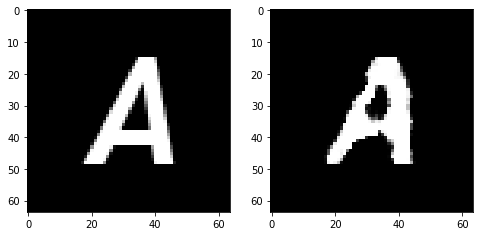

Epoch 185, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5688295178115368, Loss SSIM 2.09011173248291, Loss Local 171.85175132751465


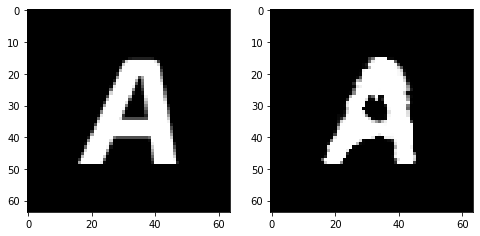

Epoch 185, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6023651324212551, Loss SSIM 2.107424020767212, Loss Local 181.27285385131836


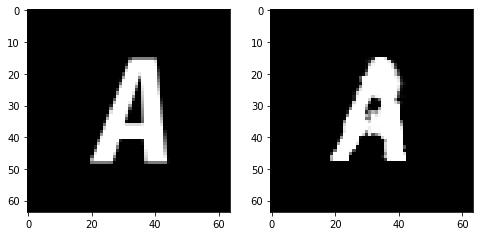

Epoch 185, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5361700914800167, Loss SSIM 1.9868126511573792, Loss Local 177.17110347747803


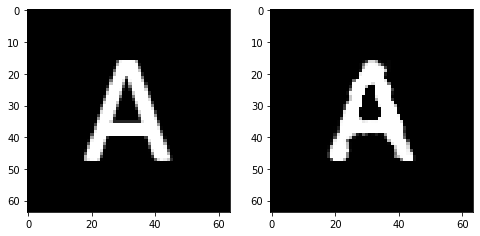

Epoch 185, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5620379820466042, Loss SSIM 2.049030065536499, Loss Local 181.93124389648438


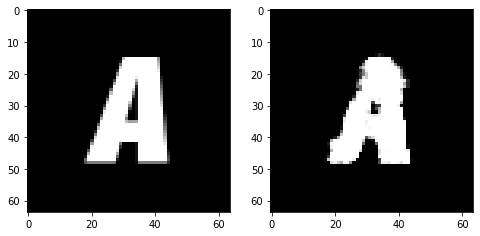

Epoch 186, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5863500125706196, Loss SSIM 2.0871845483779907, Loss Local 183.47773265838623


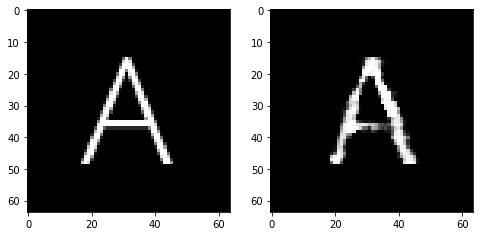

Epoch 186, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.555733934044838, Loss SSIM 2.007594108581543, Loss Local 167.53778076171875


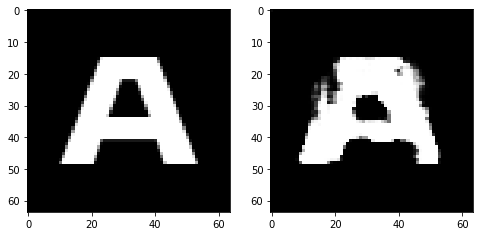

Epoch 186, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5299695655703545, Loss SSIM 2.0071309208869934, Loss Local 163.03253030776978


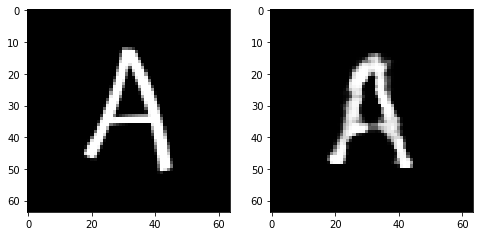

Epoch 186, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5761726573109627, Loss SSIM 2.079480826854706, Loss Local 178.21238374710083


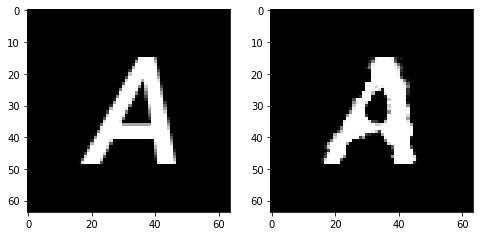

Epoch 186, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5782446675002575, Loss SSIM 2.1110140085220337, Loss Local 181.09245347976685


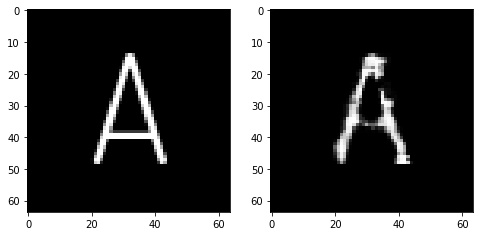

Epoch 186, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5416549034416676, Loss SSIM 2.040743589401245, Loss Local 174.740581035614


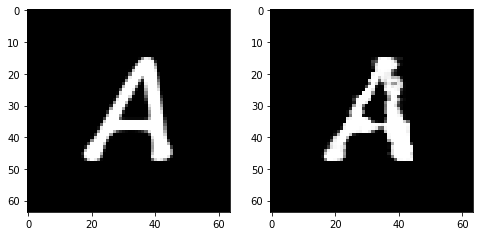

Epoch 186, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.519960306584835, Loss SSIM 1.9188221096992493, Loss Local 167.15087795257568


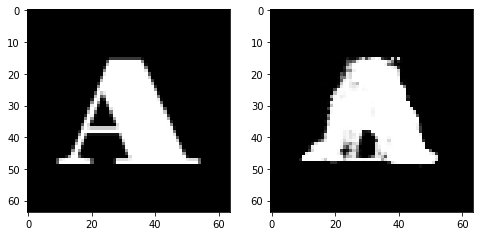

Epoch 187, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5741869807243347, Loss SSIM 2.042623460292816, Loss Local 176.59185457229614


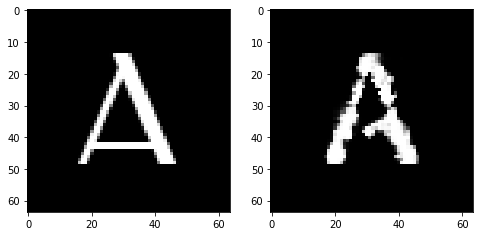

Epoch 187, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5961846634745598, Loss SSIM 2.0778071880340576, Loss Local 178.1904764175415


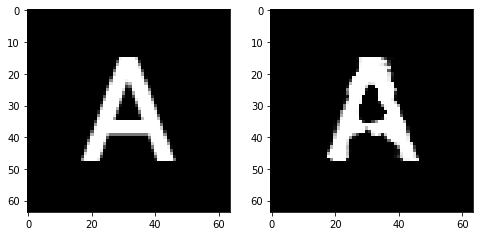

Epoch 187, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5082912929356098, Loss SSIM 2.001912236213684, Loss Local 164.8421540260315


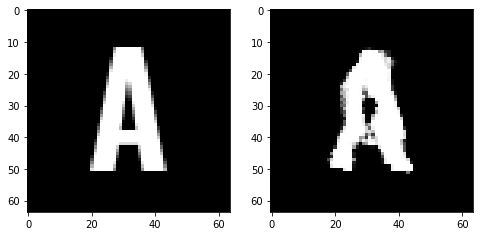

Epoch 187, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5505560487508774, Loss SSIM 2.0424143075942993, Loss Local 178.0938777923584


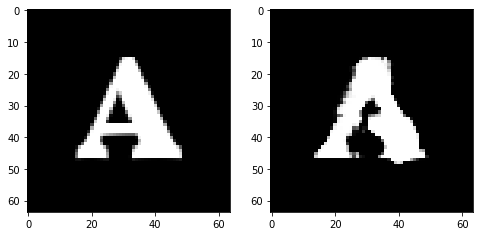

Epoch 187, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5487527623772621, Loss SSIM 2.059176504611969, Loss Local 178.86981439590454


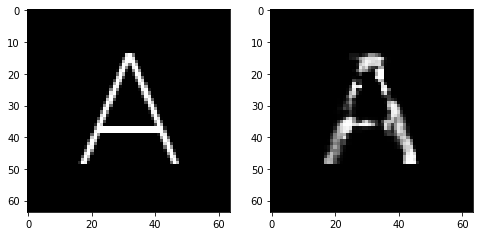

Epoch 187, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5724672637879848, Loss SSIM 2.0088887214660645, Loss Local 169.7180037498474


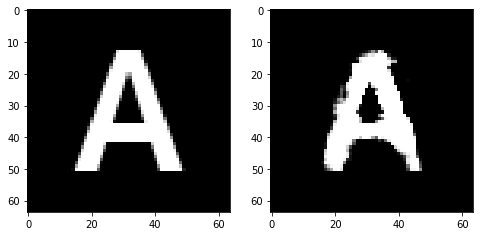

Epoch 187, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.543417427688837, Loss SSIM 2.022277355194092, Loss Local 165.93600463867188


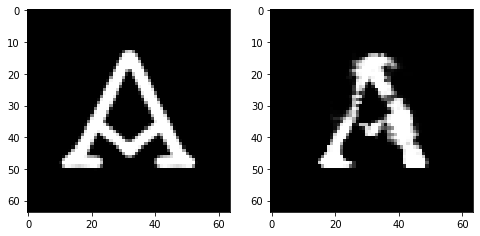

Epoch 188, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5409868136048317, Loss SSIM 2.0430992245674133, Loss Local 179.95179224014282


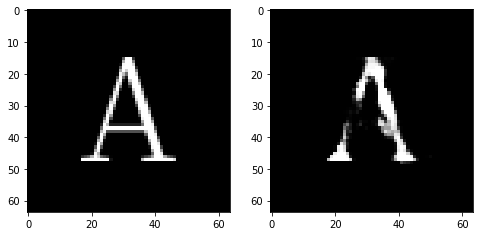

Epoch 188, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.576099630445242, Loss SSIM 2.056282341480255, Loss Local 170.4660816192627


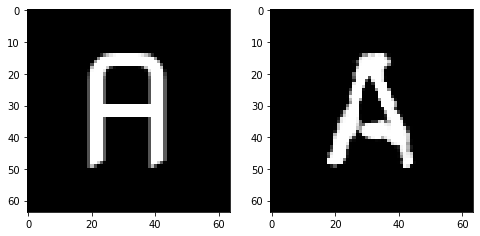

Epoch 188, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5461823754012585, Loss SSIM 2.0334060192108154, Loss Local 182.10676431655884


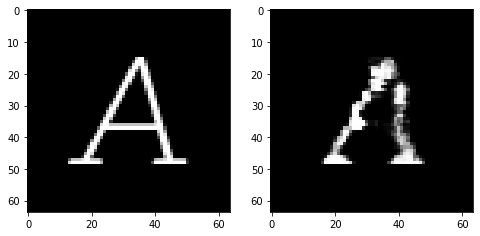

Epoch 188, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.538875326514244, Loss SSIM 1.9933784008026123, Loss Local 172.81302213668823


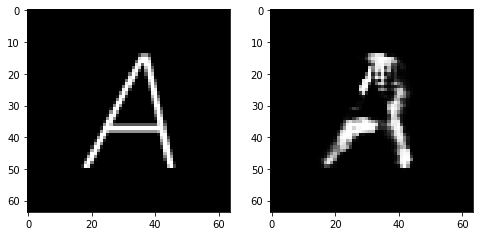

Epoch 188, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.554716482758522, Loss SSIM 2.047520697116852, Loss Local 175.79953956604004


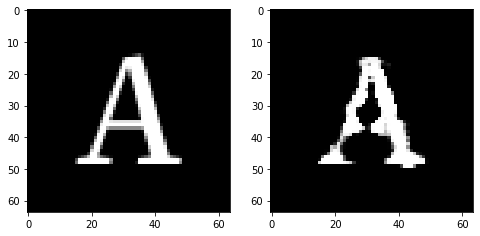

Epoch 188, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5790093317627907, Loss SSIM 2.0770315527915955, Loss Local 184.11795806884766


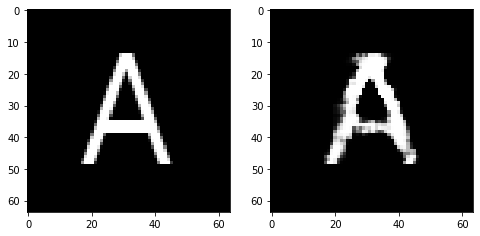

Epoch 188, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5710309818387032, Loss SSIM 2.0226871371269226, Loss Local 169.91524934768677


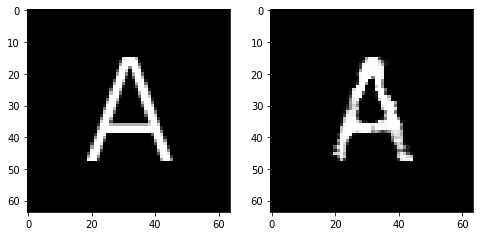

Epoch 189, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5743103511631489, Loss SSIM 2.0466643571853638, Loss Local 174.8620376586914


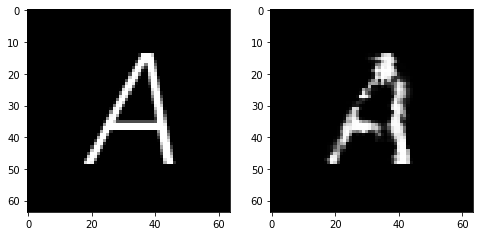

Epoch 189, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5530285499989986, Loss SSIM 2.0168015360832214, Loss Local 172.51365494728088


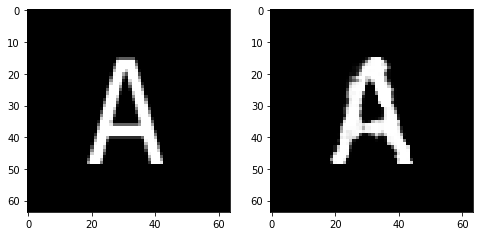

Epoch 189, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.584918424487114, Loss SSIM 2.0957080125808716, Loss Local 170.54055547714233


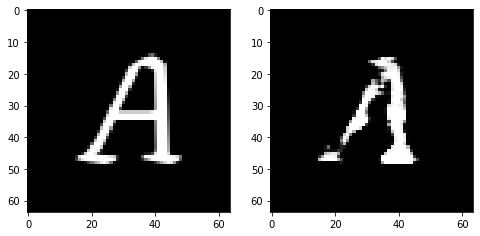

Epoch 189, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5078250356018543, Loss SSIM 1.957332730293274, Loss Local 163.4510269165039


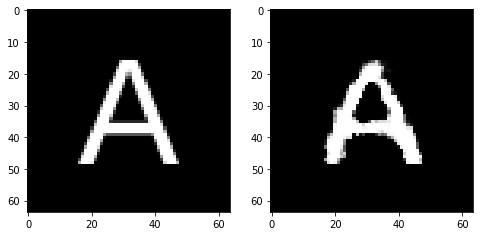

Epoch 189, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5694954507052898, Loss SSIM 2.056532323360443, Loss Local 171.38497877120972


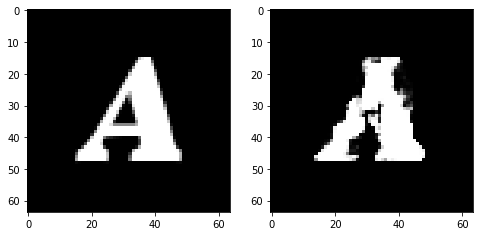

Epoch 189, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5561925806105137, Loss SSIM 2.0369234681129456, Loss Local 172.74233627319336


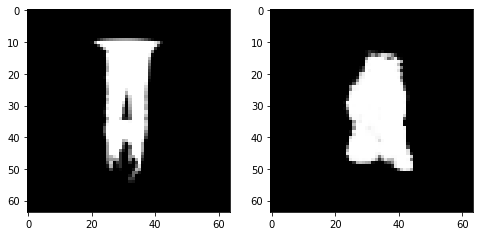

Epoch 189, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5684017539024353, Loss SSIM 2.089134454727173, Loss Local 176.69153594970703


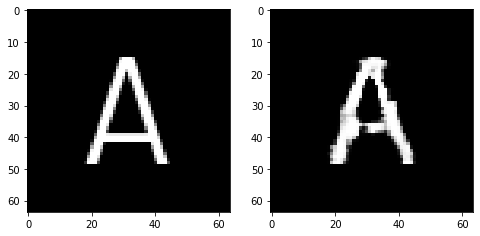

Epoch 190, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.557920590043068, Loss SSIM 2.0175307989120483, Loss Local 178.65791940689087


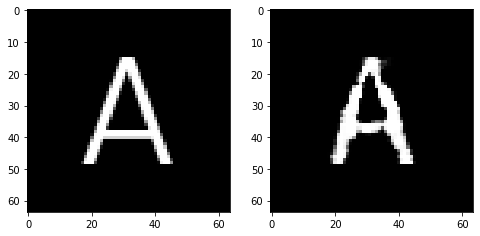

Epoch 190, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5587250031530857, Loss SSIM 2.0225406885147095, Loss Local 169.44206190109253


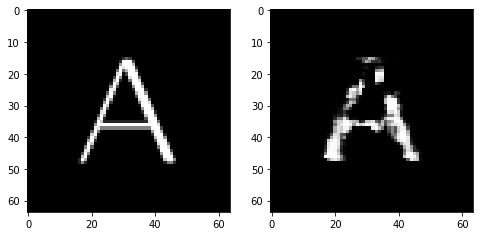

Epoch 190, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5667224563658237, Loss SSIM 2.0752174854278564, Loss Local 180.3812608718872


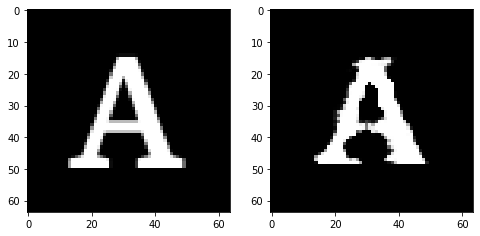

Epoch 190, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5543254427611828, Loss SSIM 2.0162203907966614, Loss Local 177.64949464797974


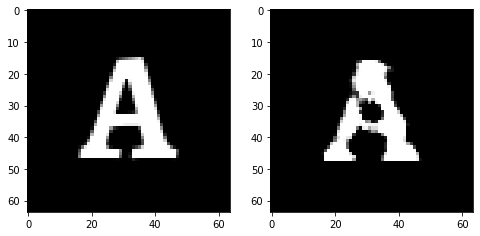

Epoch 190, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5292344391345978, Loss SSIM 2.010582149028778, Loss Local 168.99471068382263


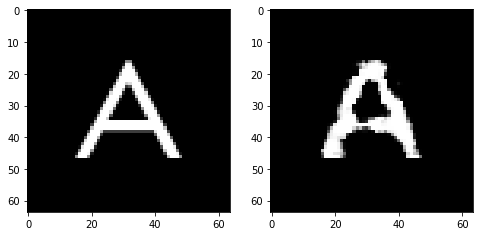

Epoch 190, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5589006692171097, Loss SSIM 2.06181538105011, Loss Local 187.26683855056763


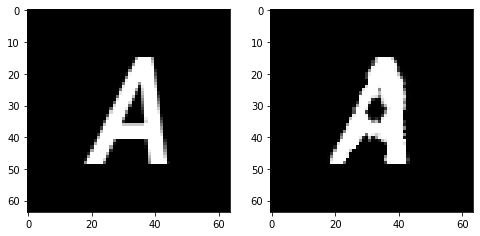

Epoch 190, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5606860518455505, Loss SSIM 2.0566359162330627, Loss Local 177.2982053756714


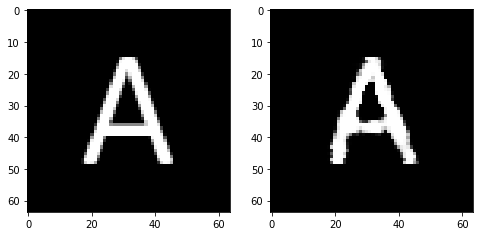

Epoch 191, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5616960972547531, Loss SSIM 2.0665509700775146, Loss Local 165.6917018890381


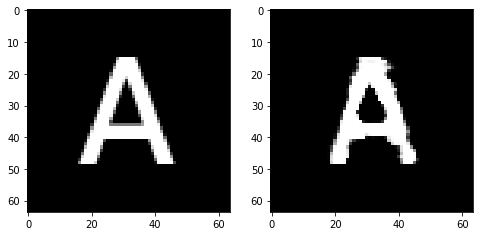

Epoch 191, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5305585451424122, Loss SSIM 1.9617981910705566, Loss Local 172.11302089691162


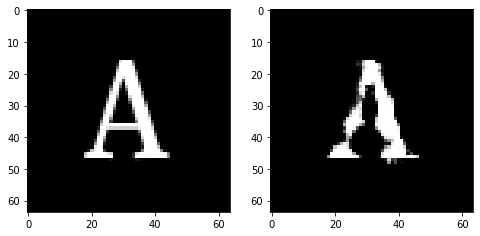

Epoch 191, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4996921569108963, Loss SSIM 1.9571740627288818, Loss Local 163.11095762252808


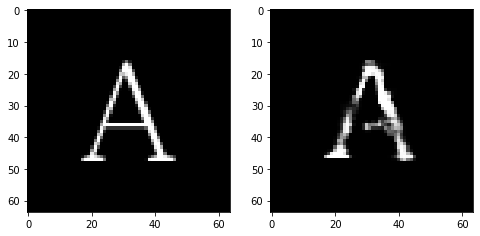

Epoch 191, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.611756820231676, Loss SSIM 2.1102355122566223, Loss Local 179.57924222946167


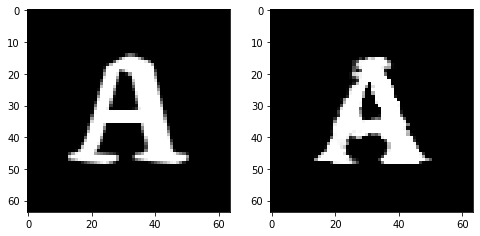

Epoch 191, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5477035827934742, Loss SSIM 2.0038071870803833, Loss Local 173.77608394622803


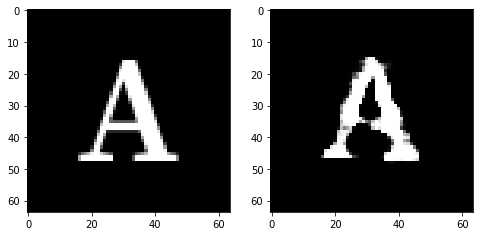

Epoch 191, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.553980253636837, Loss SSIM 2.043341338634491, Loss Local 176.23122024536133


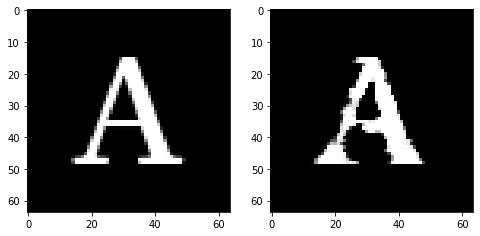

Epoch 191, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5499252267181873, Loss SSIM 2.0560569763183594, Loss Local 178.06991481781006


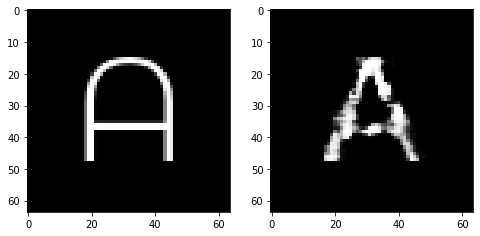

Epoch 192, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.578200552612543, Loss SSIM 2.1184327602386475, Loss Local 173.25633335113525


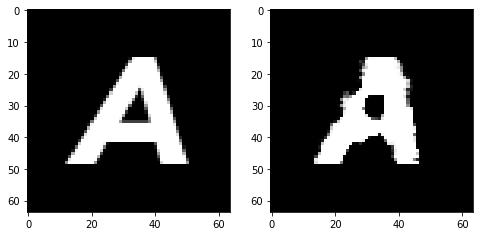

Epoch 192, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.540516547858715, Loss SSIM 1.9817366003990173, Loss Local 174.56653022766113


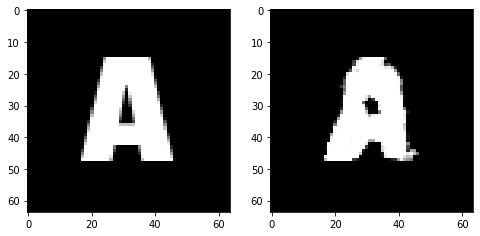

Epoch 192, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5582079626619816, Loss SSIM 2.07368403673172, Loss Local 171.9157567024231


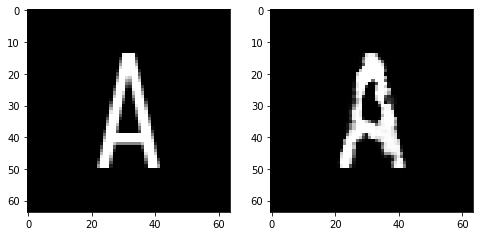

Epoch 192, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6445903331041336, Loss SSIM 2.1883170008659363, Loss Local 180.68164157867432


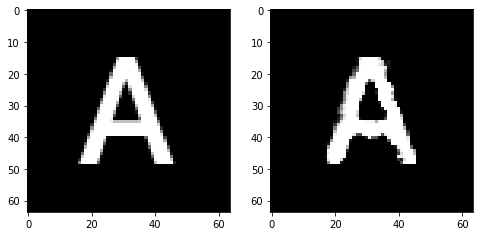

Epoch 192, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5160870775580406, Loss SSIM 1.9967710971832275, Loss Local 167.35944819450378


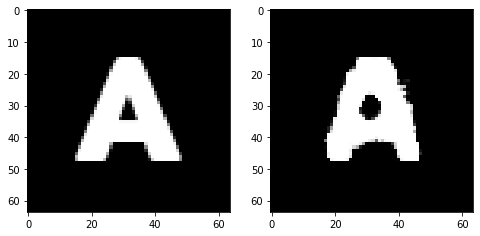

Epoch 192, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5007771402597427, Loss SSIM 1.9336774349212646, Loss Local 174.74505805969238


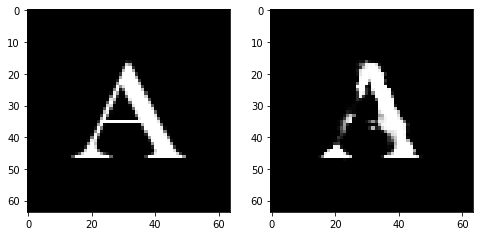

Epoch 192, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5351925007998943, Loss SSIM 1.9579945802688599, Loss Local 170.79930353164673


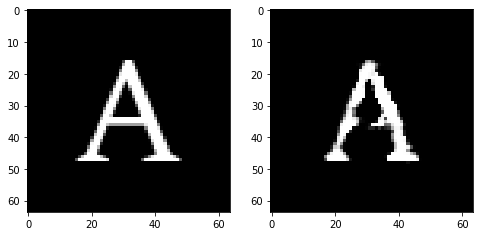

Epoch 193, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.4939747042953968, Loss SSIM 1.9195535778999329, Loss Local 168.43673419952393


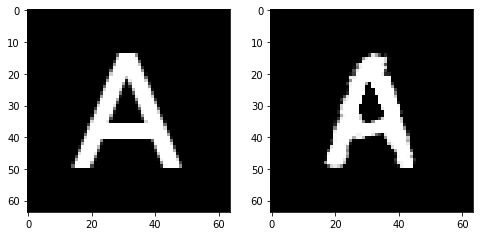

Epoch 193, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5601105988025665, Loss SSIM 2.020427942276001, Loss Local 176.43009090423584


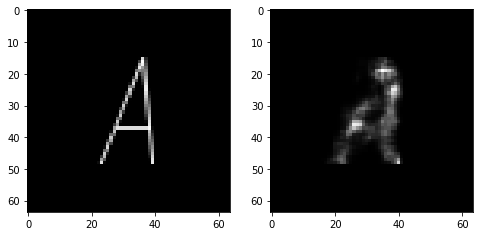

Epoch 193, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.6504502184689045, Loss SSIM 2.218043327331543, Loss Local 187.59607458114624


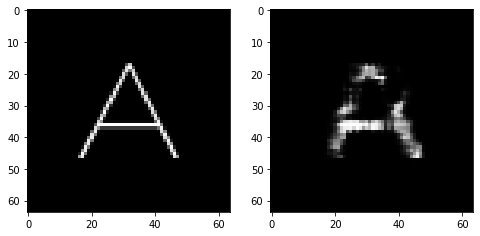

Epoch 193, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5705275684595108, Loss SSIM 2.098639667034149, Loss Local 174.84311819076538


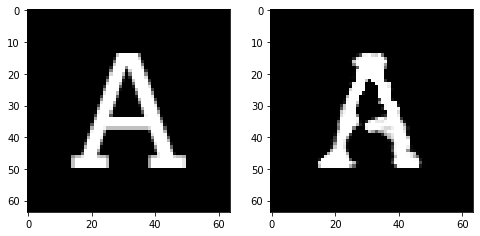

Epoch 193, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5962914153933525, Loss SSIM 2.1236847639083862, Loss Local 181.7768154144287


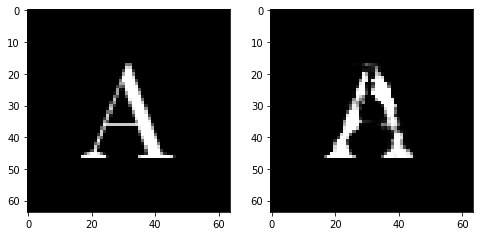

Epoch 193, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5432568341493607, Loss SSIM 2.034154534339905, Loss Local 165.6359486579895


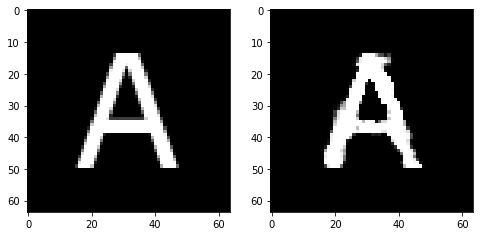

Epoch 193, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5110115110874176, Loss SSIM 1.9608157277107239, Loss Local 167.23711729049683


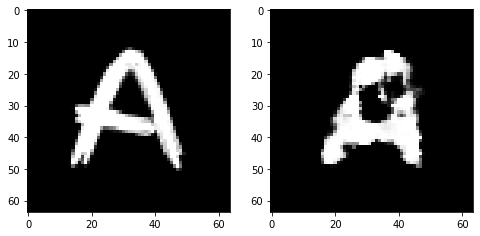

Epoch 194, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5730761028826237, Loss SSIM 2.070790946483612, Loss Local 185.78154754638672


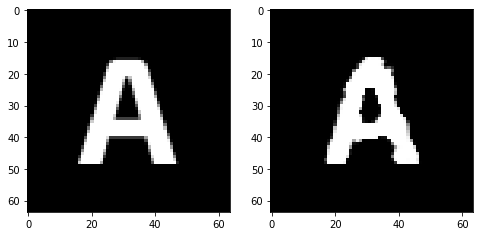

Epoch 194, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5112355947494507, Loss SSIM 1.9854571223258972, Loss Local 161.4215726852417


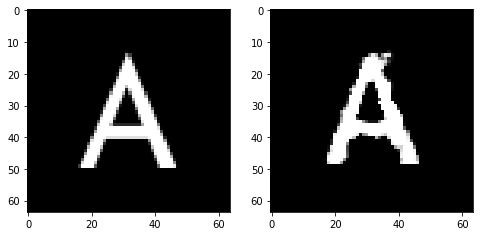

Epoch 194, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5508995614945889, Loss SSIM 2.0423142313957214, Loss Local 169.88909006118774


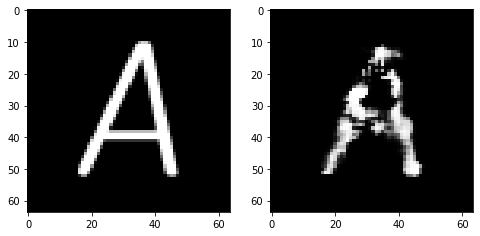

Epoch 194, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5584064833819866, Loss SSIM 2.0560588240623474, Loss Local 170.50030851364136


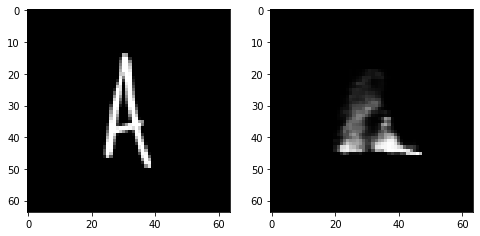

Epoch 194, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5319933481514454, Loss SSIM 1.9939590692520142, Loss Local 182.41027307510376


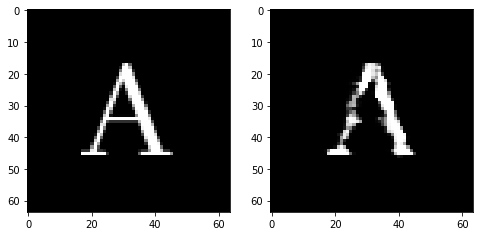

Epoch 194, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5614339746534824, Loss SSIM 2.0497987270355225, Loss Local 169.03403902053833


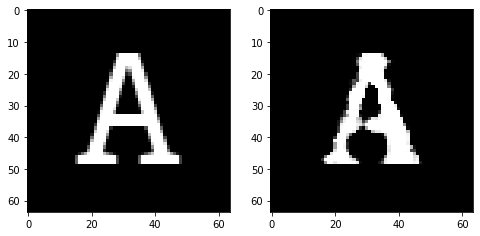

Epoch 194, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5307737179100513, Loss SSIM 1.964333415031433, Loss Local 177.26830673217773


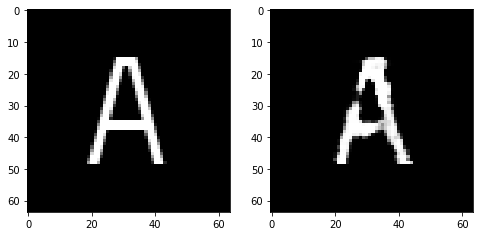

Epoch 195, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5923026278614998, Loss SSIM 2.0782917141914368, Loss Local 177.82875061035156


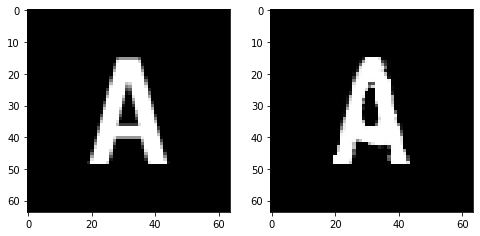

Epoch 195, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.592331986874342, Loss SSIM 2.0745421051979065, Loss Local 183.53629446029663


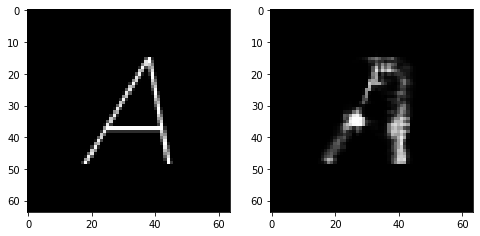

Epoch 195, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5501511245965958, Loss SSIM 2.0335420966148376, Loss Local 177.56143712997437


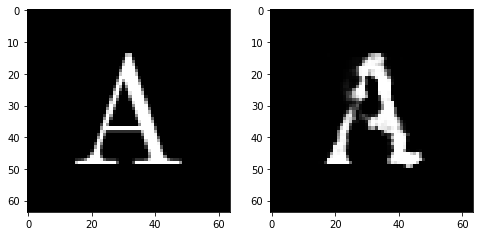

Epoch 195, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5301277451217175, Loss SSIM 1.988591730594635, Loss Local 171.48365545272827


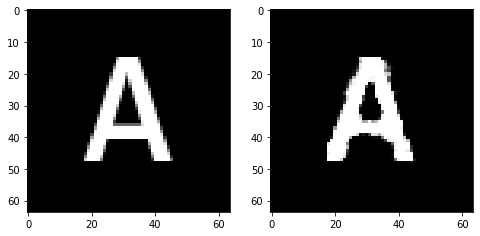

Epoch 195, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5337232872843742, Loss SSIM 1.9778801202774048, Loss Local 165.369131565094


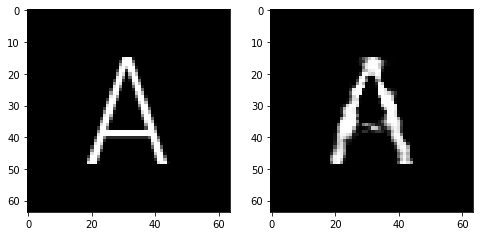

Epoch 195, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5307849645614624, Loss SSIM 1.9995296597480774, Loss Local 172.8251531124115


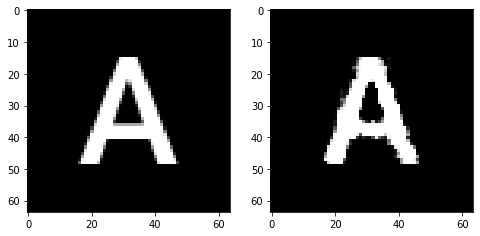

Epoch 195, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5532923601567745, Loss SSIM 2.0945613980293274, Loss Local 178.44578218460083


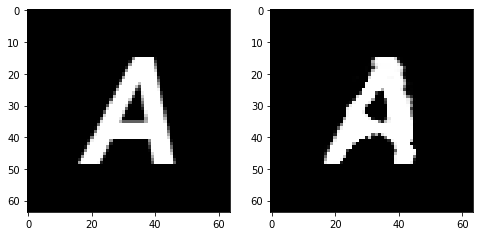

Epoch 196, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5589096285402775, Loss SSIM 2.091761827468872, Loss Local 181.2761254310608


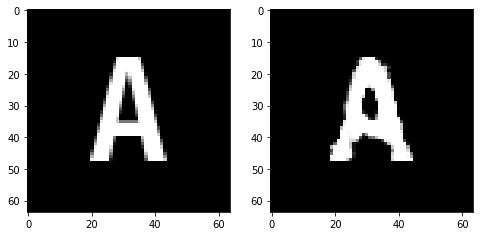

Epoch 196, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.568583432585001, Loss SSIM 2.1037129163742065, Loss Local 169.60334157943726


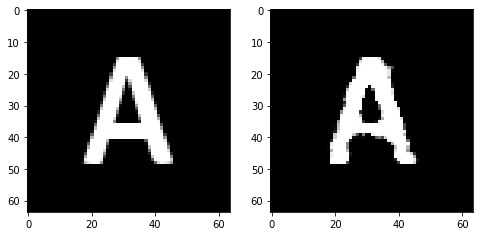

Epoch 196, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5573125295341015, Loss SSIM 2.0200923085212708, Loss Local 171.10754108428955


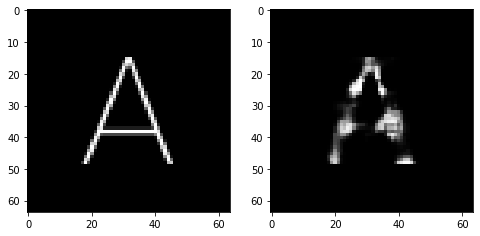

Epoch 196, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.529686275869608, Loss SSIM 1.9677671194076538, Loss Local 173.19967603683472


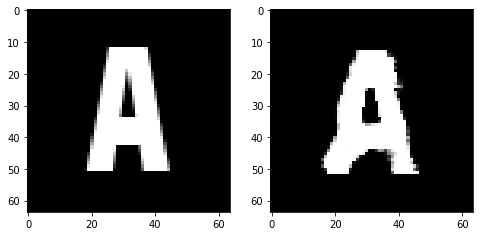

Epoch 196, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5126912593841553, Loss SSIM 1.9747071266174316, Loss Local 167.70913791656494


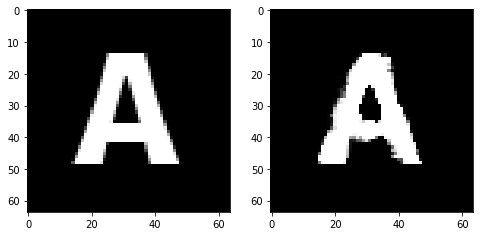

Epoch 196, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5953879915177822, Loss SSIM 2.082623779773712, Loss Local 171.40557861328125


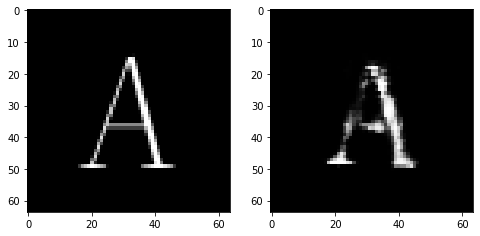

Epoch 196, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5355783514678478, Loss SSIM 1.989307165145874, Loss Local 177.2967014312744


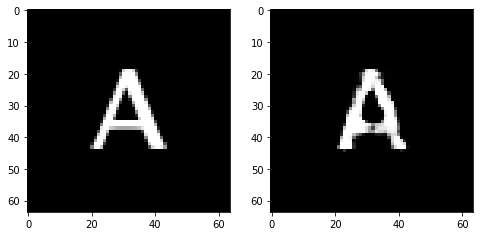

Epoch 197, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5434485115110874, Loss SSIM 2.0175914764404297, Loss Local 172.03268241882324


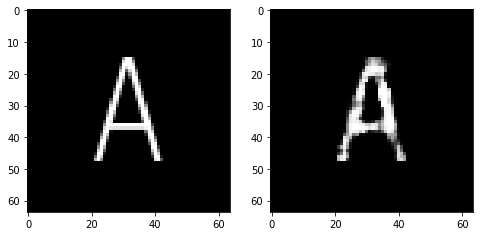

Epoch 197, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5843406580388546, Loss SSIM 2.096208691596985, Loss Local 177.6874713897705


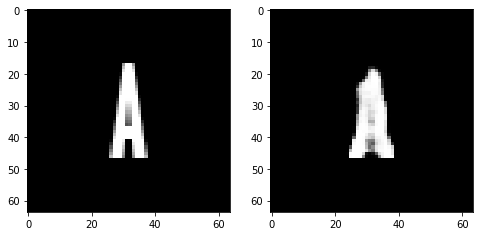

Epoch 197, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5461560040712357, Loss SSIM 2.0007277727127075, Loss Local 160.55516052246094


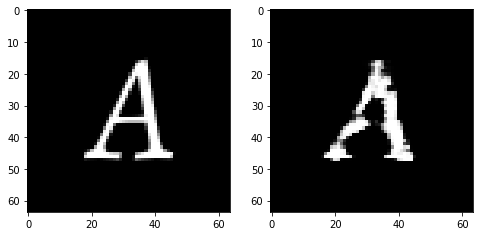

Epoch 197, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.549628909677267, Loss SSIM 2.0085381865501404, Loss Local 170.6614875793457


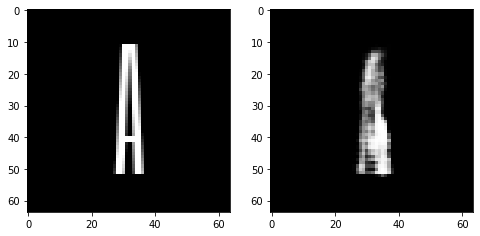

Epoch 197, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.535059317946434, Loss SSIM 2.0118035674095154, Loss Local 171.6055817604065


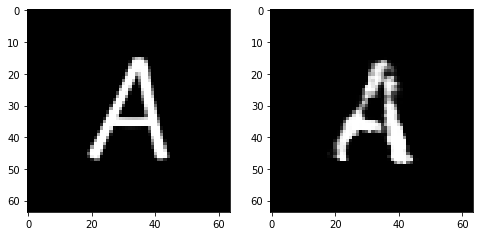

Epoch 197, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5696482211351395, Loss SSIM 2.0253214240074158, Loss Local 176.67238330841064


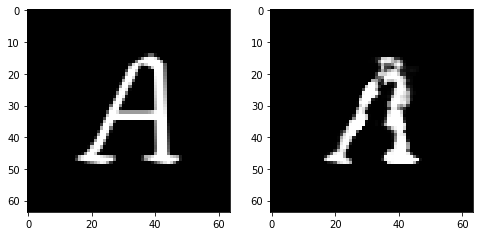

Epoch 197, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5335437655448914, Loss SSIM 1.9976876974105835, Loss Local 164.63539457321167


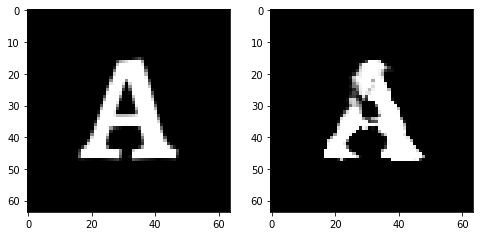

Epoch 198, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5527431853115559, Loss SSIM 2.018825948238373, Loss Local 175.25272274017334


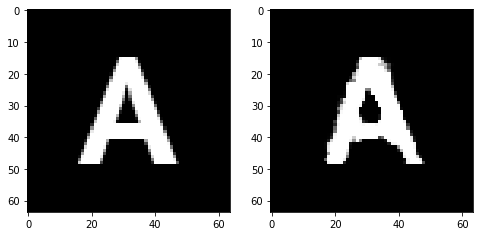

Epoch 198, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5331653207540512, Loss SSIM 1.965656042098999, Loss Local 170.8373475074768


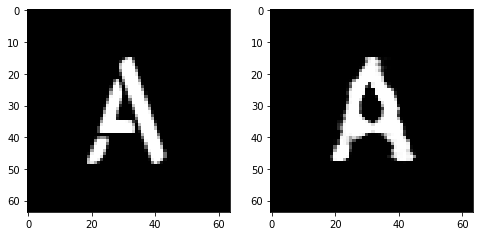

Epoch 198, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5120239183306694, Loss SSIM 1.9591058492660522, Loss Local 173.45717096328735


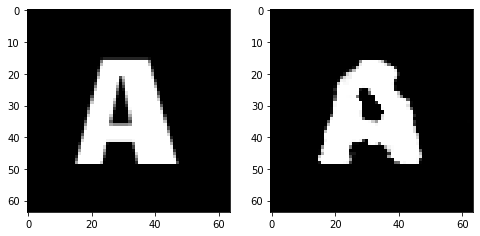

Epoch 198, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5909584797918797, Loss SSIM 2.072231650352478, Loss Local 178.65222358703613


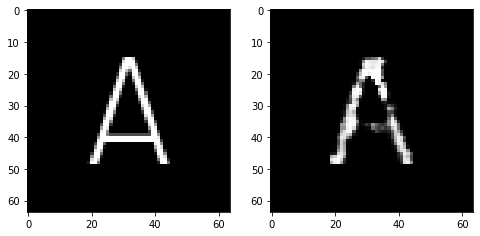

Epoch 198, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.525820478796959, Loss SSIM 1.9995151162147522, Loss Local 175.94988250732422


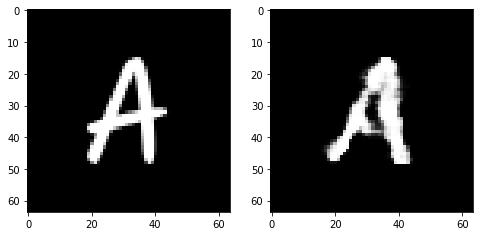

Epoch 198, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5517705157399178, Loss SSIM 2.059439539909363, Loss Local 176.3872013092041


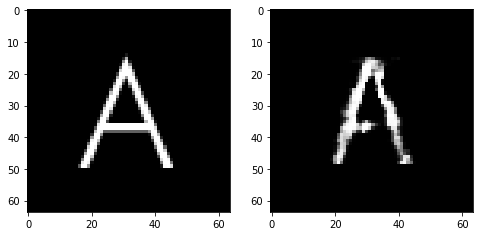

Epoch 198, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5922836288809776, Loss SSIM 2.1487634778022766, Loss Local 193.41776657104492


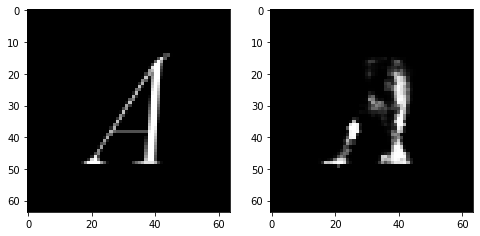

Epoch 199, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5702319964766502, Loss SSIM 2.028536319732666, Loss Local 161.95198583602905


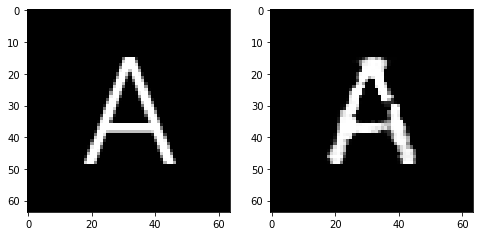

Epoch 199, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5039251111447811, Loss SSIM 1.9304741024971008, Loss Local 164.82631540298462


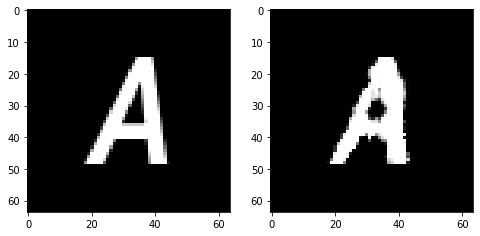

Epoch 199, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5885124877095222, Loss SSIM 2.100773572921753, Loss Local 172.86162090301514


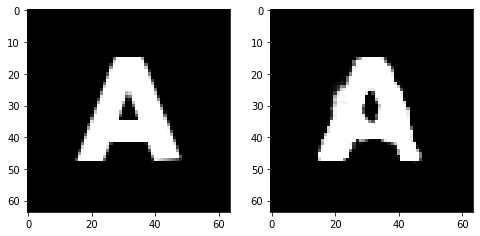

Epoch 199, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.601415753364563, Loss SSIM 2.1208314895629883, Loss Local 177.5814290046692


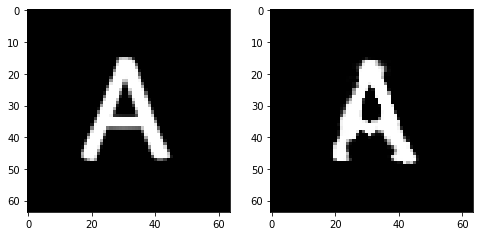

Epoch 199, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.506425578147173, Loss SSIM 1.9490826725959778, Loss Local 172.078351020813


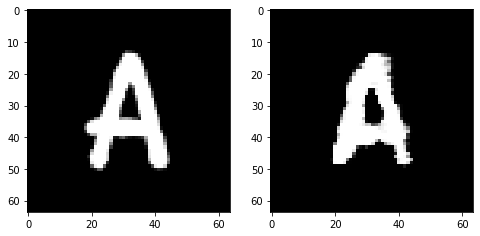

Epoch 199, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.544198166579008, Loss SSIM 2.00983065366745, Loss Local 171.81675815582275


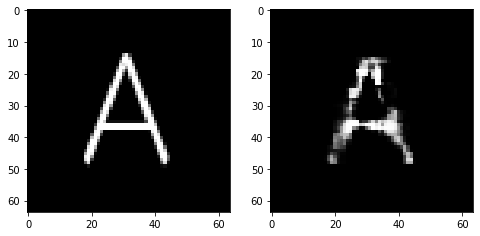

Epoch 199, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5548816472291946, Loss SSIM 2.0626394152641296, Loss Local 183.00940370559692


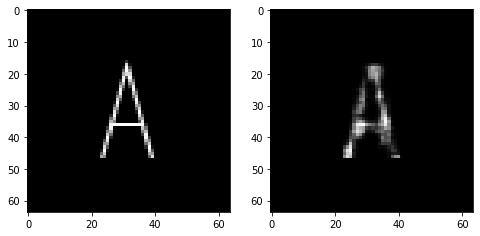

Epoch 200, Iteration 25, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5929707437753677, Loss SSIM 2.0701109766960144, Loss Local 172.98488759994507


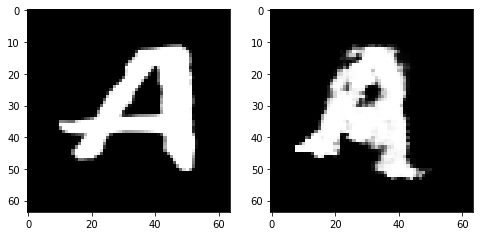

Epoch 200, Iteration 50, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5385859236121178, Loss SSIM 1.9789433479309082, Loss Local 175.2478928565979


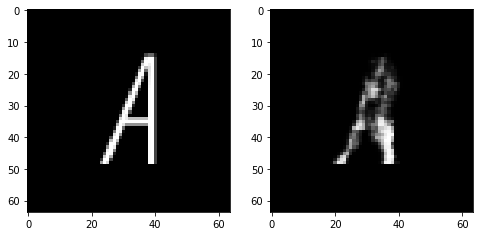

Epoch 200, Iteration 75, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5174673162400723, Loss SSIM 1.9787095785140991, Loss Local 173.07275819778442


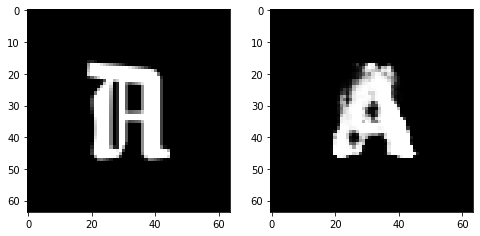

Epoch 200, Iteration 100, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5677684247493744, Loss SSIM 2.076664984226227, Loss Local 173.46567916870117


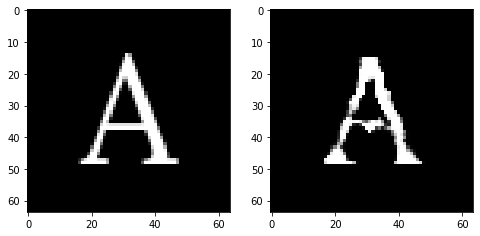

Epoch 200, Iteration 125, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5361368395388126, Loss SSIM 2.0086580514907837, Loss Local 175.81031894683838


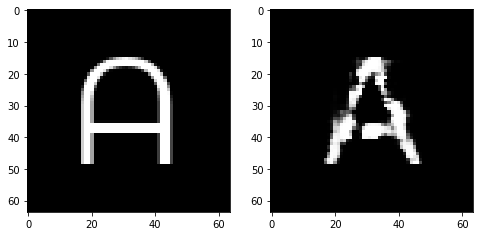

Epoch 200, Iteration 150, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5593758784234524, Loss SSIM 2.052375912666321, Loss Local 165.99435997009277


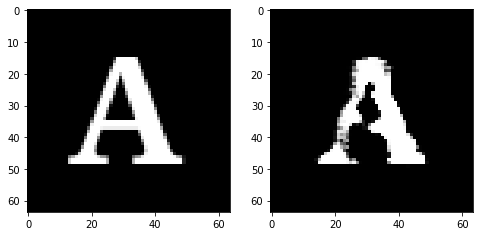

Epoch 200, Iteration 175, Loss D 0.0, Loss Disc 0.0, Loss L1 1.5099941231310368, Loss SSIM 1.974916398525238, Loss Local 165.2244167327881


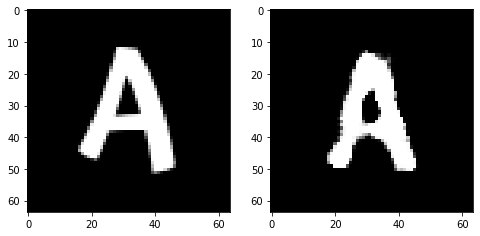

Done


In [16]:
main()

In [99]:
import pickle

with open("loss_l1", "wb") as f:
    pickle.dump(loss_l1_list, f)
    
with open("lossD", "wb") as f:
    pickle.dump(lossD_list, f)

with open("loss_disc", "wb") as f:
    pickle.dump(loss_disc_list, f)

with open("loss_ssim", "wb") as f:
    pickle.dump(loss_ssim_list, f)

with open("loss_local", "wb") as f:
    pickle.dump(loss_local_list, f)

In [101]:
with open("loss_local", "rb") as f:
    x=pickle.load(f)
print(x)

[9.243646621704102, 218.0563063621521, 203.68489170074463, 198.48784351348877, 191.1583046913147, 187.16174173355103, 198.00935173034668, 182.52338981628418, 8.36069393157959, 195.3824906349182, 188.2991762161255, 186.1348261833191, 197.03971195220947, 185.4544620513916, 185.84451913833618, 195.24149179458618, 8.31648063659668, 179.86744928359985, 189.60192155838013, 181.3233733177185, 210.0362811088562, 197.71534061431885, 185.91996812820435, 194.18498992919922, 7.657258987426758, 193.21198558807373, 199.61026906967163, 203.4915328025818, 190.94805765151978, 181.51752948760986, 189.41818523406982, 189.36254405975342, 7.913196563720703, 212.30988597869873, 204.1824870109558, 204.76843547821045, 186.15672254562378, 195.93063640594482, 193.82592391967773, 177.01421785354614, 5.819516658782959, 199.82619762420654, 188.94516897201538, 196.25567150115967, 188.5474362373352, 184.7133708000183, 188.6804642677307, 187.23670482635498, 7.308694362640381, 185.4726128578186, 183.87713432312012, 18

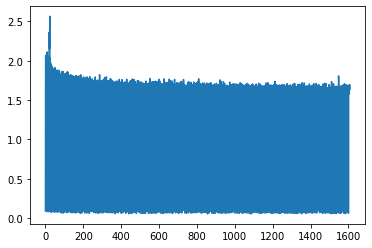

In [209]:
# plot losses
plt.plot(loss_l1_list)
plt.show()

In [102]:
# path to font list
fonts_csv = "fonts.csv"
# root directory for dataset
dataroot = "images"
# number of workers for dataloader
workers = 0

dataset = FontDataset(csv_file=fonts_csv, 
                      root_dir=dataroot, 
                      transform=transforms.Compose([
                          transforms.ToTensor(),
                          transforms.Normalize(0.5, 0.5),
                      ]))

In [103]:
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=workers)

encdec = EncoderDecoder()
encdec.load_state_dict(torch.load('encdec.pt'))
encdec.eval()

EncoderDecoder(
  (conv01): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv12): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv23): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv33): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv32): Conv2d(32, 26, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv0same): Conv2d(26, 26, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (unpool): MaxUnpool2d(kernel_size=(2, 2), stride=(2, 2), padding=(0, 0))
  (relu): ReLU(inplace=True)
  (leakyrelu): LeakyReLU(negative_slope=0.2, inplace=True)
  (sigmoid): Sigmoid()
  (tanh): Tanh()
  (threshold): Threshold(threshold=0, value=0)
  (gaussian_filter): Conv2d(26, 26, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=26, bias=False)
)

In [104]:
#look at result and ground truth side by side
for i, data in enumerate(dataloader):
    if i > 50:
        break
    fig = plt.figure(figsize=(8, 8))
    output = encdec(data['c1'])
    fig.add_subplot(1, 2, 1)
    plt.imshow(data['c2'][0].permute(1, 2, 0).detach().numpy(), cmap='gray')
    fig.add_subplot(1, 2, 2)
    plt.imshow(output[0].permute(1, 2, 0).detach().numpy(), cmap='gray')
    plt.show()

KeyError: 'c1'

<Figure size 576x576 with 0 Axes>

In [166]:
#set up for evaluation
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=workers)

encdec = EncoderDecoder()
encdec.load_state_dict(torch.load('encdec-Copy1.pt'))
encdec.eval()
criterion_L1 = nn.L1Loss()
criterion_ssim = MS_SSIM(win_size=3, data_range=1, size_average=True, channel=1)

In [168]:
#evaluate accuracy using L1 loss
for i, data in enumerate(dataloader):
    output = encdec(data['c1'])
    truth = data['c2']
    loss_L1 = criterion_L1(output, truth)
    
    output_norm = (output + 1) / 2
    truth_norm = (truth+1) / 2
    loss_ssim = 1 - criterion_ssim(output_norm, truth_norm)
    
    print(f'{i}, L1: {loss_L1}, ssim: {loss_ssim}')

0, L1: 0.11039647459983826, ssim: 0.17747068405151367
1, L1: 0.08089693635702133, ssim: 0.09386289119720459
2, L1: 0.06853260844945908, ssim: 0.08297383785247803
3, L1: 0.11089372634887695, ssim: 0.23213541507720947
4, L1: 0.038106516003608704, ssim: 0.027527153491973877
5, L1: 0.0792616680264473, ssim: 0.11540257930755615
6, L1: 0.04213376343250275, ssim: 0.03352046012878418
7, L1: 0.059157781302928925, ssim: 0.07703202962875366
8, L1: 0.24022439122200012, ssim: 0.4588257670402527
9, L1: 0.06825708597898483, ssim: 0.07667970657348633
10, L1: 0.051598817110061646, ssim: 0.051001548767089844
11, L1: 0.2085886001586914, ssim: 0.2567775249481201
12, L1: 0.07073262333869934, ssim: 0.0784960389137268
13, L1: 0.08040574193000793, ssim: 0.09605830907821655
14, L1: 0.05451987311244011, ssim: 0.058758437633514404
15, L1: 0.08923070132732391, ssim: 0.15772056579589844
16, L1: 0.11131218075752258, ssim: 0.13691407442092896
17, L1: 0.2438725084066391, ssim: 0.4737599492073059
18, L1: 0.08858506381

152, L1: 0.06889532506465912, ssim: 0.06919312477111816
153, L1: 0.0607423260807991, ssim: 0.06934094429016113
154, L1: 0.05836329609155655, ssim: 0.06114429235458374
155, L1: 0.08883416652679443, ssim: 0.1027938723564148
156, L1: 0.07575616985559464, ssim: 0.0858493447303772
157, L1: 0.07978146523237228, ssim: 0.10669815540313721
158, L1: 0.05258508026599884, ssim: 0.05345994234085083
159, L1: 0.05873097851872444, ssim: 0.05718791484832764
160, L1: 0.07342013716697693, ssim: 0.08319908380508423
161, L1: 0.07586877793073654, ssim: 0.09458595514297485
162, L1: 0.09478834271430969, ssim: 0.1022070050239563
163, L1: 0.10470055043697357, ssim: 0.22193455696105957
164, L1: 0.08443177491426468, ssim: 0.08526414632797241
165, L1: 0.0715842917561531, ssim: 0.0762944221496582
166, L1: 0.059848956763744354, ssim: 0.06284481287002563
167, L1: 0.09003887325525284, ssim: 0.10121101140975952
168, L1: 0.07221962511539459, ssim: 0.08247703313827515
169, L1: 0.05456048250198364, ssim: 0.057745993137359

302, L1: 0.09000823646783829, ssim: 0.10436290502548218
303, L1: 0.03278225660324097, ssim: 0.03346598148345947
304, L1: 0.06608622521162033, ssim: 0.05992388725280762
305, L1: 0.07300208508968353, ssim: 0.0842466950416565
306, L1: 0.0675133690237999, ssim: 0.0772365927696228
307, L1: 0.05704762414097786, ssim: 0.04869323968887329
308, L1: 0.1096034049987793, ssim: 0.13312697410583496
309, L1: 0.06016245484352112, ssim: 0.04968059062957764
310, L1: 0.13053369522094727, ssim: 0.19141721725463867
311, L1: 0.07232728600502014, ssim: 0.08200651407241821
312, L1: 0.06184431537985802, ssim: 0.06264740228652954
313, L1: 0.09022515267133713, ssim: 0.10453170537948608
314, L1: 0.08760853856801987, ssim: 0.11121916770935059
315, L1: 0.06120019033551216, ssim: 0.09021127223968506
316, L1: 0.05880950391292572, ssim: 0.06488174200057983
317, L1: 0.07695657014846802, ssim: 0.08762592077255249
318, L1: 0.07153172791004181, ssim: 0.08104550838470459
319, L1: 0.11937202513217926, ssim: 0.17387765645980

455, L1: 0.07434134930372238, ssim: 0.0922250747680664
456, L1: 0.09858784079551697, ssim: 0.18295514583587646
457, L1: 0.17381393909454346, ssim: 0.2208053469657898
458, L1: 0.13513469696044922, ssim: 0.15482217073440552
459, L1: 0.08193998038768768, ssim: 0.09691119194030762
460, L1: 0.10298686474561691, ssim: 0.1109459400177002
461, L1: 0.07968256622552872, ssim: 0.06657242774963379
462, L1: 0.059610363095998764, ssim: 0.059905290603637695
463, L1: 0.06045956164598465, ssim: 0.06798720359802246
464, L1: 0.19083385169506073, ssim: 0.24148380756378174
465, L1: 0.045080821961164474, ssim: 0.03660166263580322
466, L1: 0.11044272035360336, ssim: 0.12912142276763916
467, L1: 0.1096285954117775, ssim: 0.11498904228210449


KeyboardInterrupt: 